In [11]:
import tensorflow as tf
import numpy as np
import time
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
from functools import cmp_to_key
from scipy.misc import toimage

from testmodels.cifar import CIFARModel
from testmodels.mnist import MNISTModel

def show(image1, image2, model, shape1, shape2, channels, distortions, ans) :
    print (image1, image2)
    fig = plt.figure()
    a=fig.add_subplot(1,2,1)
    img1 = mpimg.imread(image1)
    lum_img1 = img1
    
    if channels == 1 :
        imgplot1 = plt.imshow(lum_img1.reshape(shape1, shape2))
    
    if channels == 3 :
        lum_img1 = img1[:,:,0]
        imgplot1 = plt.imshow(lum_img1.reshape(shape1, shape2, 3))
    
    a.set_title('Initial')

    b=fig.add_subplot(1,2,2)
    img2 = mpimg.imread(image2)
    lum_img2 = img2
    
    if channels == 1:
        imgplot2 = plt.imshow(lum_img2.reshape(shape1, shape2))
    
    if channels == 3 :
        lum_img2 = img2[:,:,0]
        imgplot2 = plt.imshow(toimage(lum_img2))
        #imgplot2 = plt.imshow(lum_img2.reshape(shape1, shape2, 3))
    b.set_title('Adversarial')
    plt.show(fig)
    
    distortion = np.sum((img2-img1)**2)**.5
    print("Total distortion:", distortion)
    
    initial = model.model.predict(lum_img1.reshape(1,shape1, shape2, channels))
    adversarial = model.model.predict(lum_img2.reshape(1,shape1, shape2, channels))
    print(initial, np.argmax(initial))
    print(adversarial, np.argmax(adversarial))
    
    if (np.argmax(initial) != np.argmax(adversarial)) :
        #print (image1.replace('.png', "").split('_')[2])
        if image1.replace('.png', "").split('_')[2] == '0' :
            distortions['l2'] += distortion
            ans['l2'] += 1
        if image1.replace('.png', "").split('_')[2] == '1' :
            distortions['l0'] += distortion
            ans['l0'] += 1
        if image1.replace('.png', "").split('_')[2] == '2' :
            distortions['li'] += distortion
            ans['li'] += 1
        return 1
    return 0
    
def test_adversarials(model, data_path, shape, channels) :

    def cmp_ads(im, dic) :
        for x in im:
            if x.find('initial') >= 0:
                id1 = x.replace(".png", "").split("_")[1]
                dic[int(id1)] = x
    
    im = [f for f in os.listdir(data_path) if f.endswith('.png')]
    dim = dict()
    cmp_ads(im, dim)
    
    imgs = sorted(dim.items())
    count = 0
    
    distortions = dict()
    
    distortions['l2'] = 0.0
    distortions['l0'] = 0.0
    distortions['li'] = 0.0
    
    ans = dict()
    
    ans['l2'] = 0
    ans['l0'] = 0
    ans['li'] = 0
    
    for item in imgs:
        file = item[1]
        print (file)
        if (file.find('initial') >= 0):
            count = count + 1
            ad = file.replace('initial', 'adversarial')
            show(data_path+file, data_path+ad, model,shape[0], shape[1], channels, distortions, ans)
    print(count, ans, distortions)
    print("l2 average = ", distortions['l2']/count, distortions['l2']/ans['l2'])
    print("l0 average = ", distortions['l0']/count, distortions['l0']/ans['l0'])
    print("li average = ", distortions['li']/count, distortions['li']/ans['li'])

initial_0_0.png
output/cifar/initial_0_0.png output/cifar/adversarial_0_0.png


/home/fuqianz/.conda/envs/python3-tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:38: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.


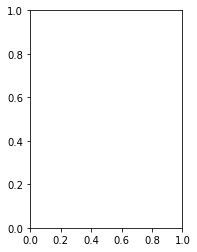

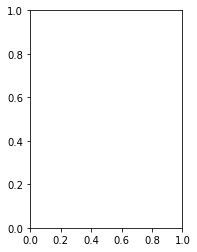

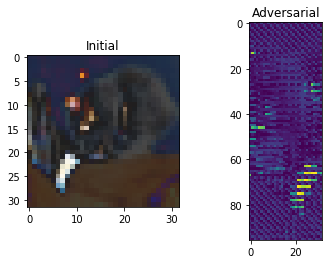

Total distortion: 0.6127318089577474
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 280.61404 -470.83716    8.14704  256.09848  207.87791   71.15063
  -149.8548  -173.41107  176.47475 -108.62462]] 0
initial_1_0.png
output/cifar/initial_1_0.png output/cifar/adversarial_1_0.png


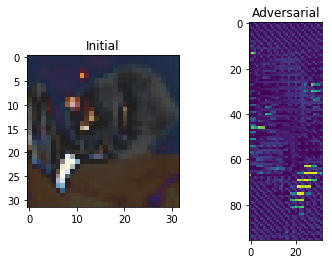

Total distortion: 0.620599874235639
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 243.51613  -334.60464   -49.686203  283.7307    100.87382    47.613247
  -111.56171  -273.81793   247.72289   -81.166794]] 3
initial_2_0.png
output/cifar/initial_2_0.png output/cifar/adversarial_2_0.png


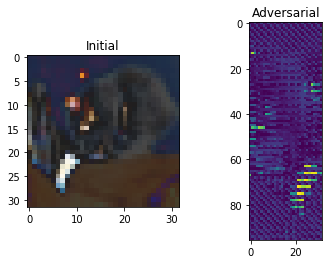

Total distortion: 0.604863066900658
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 255.6804  -521.5734    86.8081   259.01978  309.81042   83.55608
  -157.84108 -117.49245  105.5738  -190.715  ]] 4
initial_3_0.png
output/cifar/initial_3_0.png output/cifar/adversarial_3_0.png


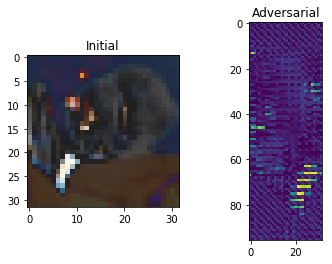

Total distortion: 0.6434958724843213
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 284.5908   -555.27075    80.194534  259.22192   433.52353    95.9832
  -200.65765   -88.47934    75.67008  -253.3457  ]] 4
initial_4_0.png
output/cifar/initial_4_0.png output/cifar/adversarial_4_0.png


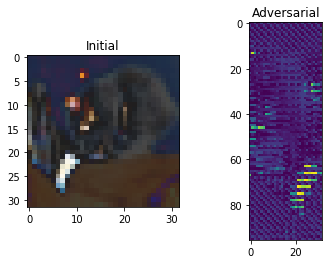

Total distortion: 0.4478321735029649
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 220.13739  -488.81934    15.579225  294.40805   202.52551   131.20233
  -108.27717  -136.67151    97.73075  -150.68225 ]] 3
initial_5_0.png
output/cifar/initial_5_0.png output/cifar/adversarial_5_0.png


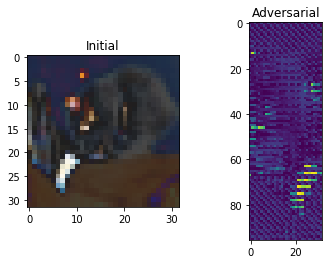

Total distortion: 0.5321353659235117
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 237.46208 -472.99225   36.33932  267.96152  243.55275   82.8819
  -101.0895  -183.77466  146.7471  -170.52391]] 3
initial_6_0.png
output/cifar/initial_6_0.png output/cifar/adversarial_6_0.png


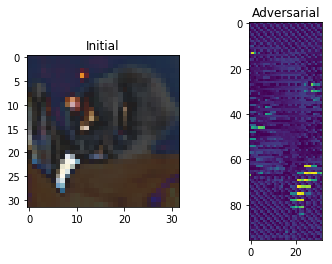

Total distortion: 1.032088083670296
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 194.01427  -571.53864    78.782745  269.40417   390.7229    136.16089
  -188.24432    20.570745    8.085193 -217.51485 ]] 4
initial_7_0.png
output/cifar/initial_7_0.png output/cifar/adversarial_7_0.png


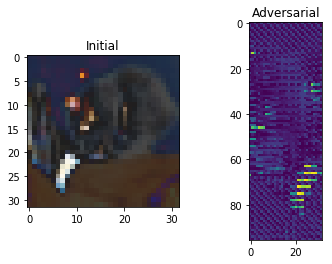

Total distortion: 0.3652326206430334
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 240.44252  -340.2356    -56.831852  290.55188    49.60883    67.69929
  -103.249855 -260.86234   230.39606   -52.856606]] 3
initial_8_0.png
output/cifar/initial_8_0.png output/cifar/adversarial_8_0.png


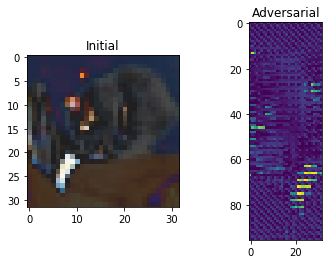

Total distortion: 0.483833225345939
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 237.54295  -383.827     -23.583776  274.59113   113.31695    62.470463
  -110.25065  -225.01178   197.6835    -65.292145]] 3
initial_9_0.png
output/cifar/initial_9_0.png output/cifar/adversarial_9_0.png


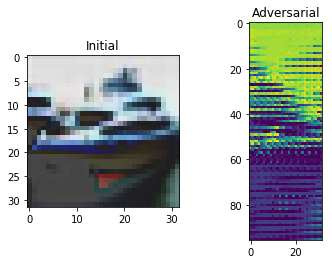

Total distortion: 0.9237604741495068
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 2267.1226   1129.2302   -496.18274  -420.46893  -224.57085 -1363.3738
  -1647.7074   -646.1646   1484.7123   1003.19305]] 0
initial_10_0.png
output/cifar/initial_10_0.png output/cifar/adversarial_10_0.png


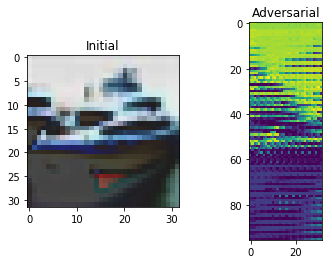

Total distortion: 0.597302675064805
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1969.2352   1052.6884   -445.6433   -298.89758  -380.14597 -1240.9342
  -1398.3301   -907.9599   1728.9261    808.9417 ]] 0
initial_11_0.png
output/cifar/initial_11_0.png output/cifar/adversarial_11_0.png


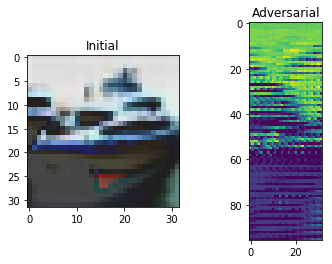

Total distortion: 4.2289567466214315
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1078.6741    645.839    -170.98155  -251.79451  -190.33159  -676.61926
  -1081.353     144.25508   647.88855   566.34186]] 0
initial_12_0.png
output/cifar/initial_12_0.png output/cifar/adversarial_12_0.png


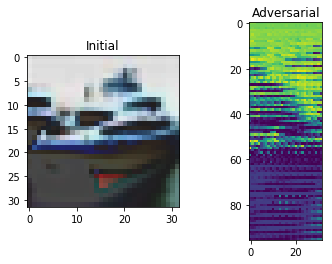

Total distortion: 3.148882737400122
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1212.2839     676.3153    -475.68842    -90.278755  -160.6154
   -730.4548   -1221.659      -43.82193    773.94025    883.83765 ]] 0
initial_13_0.png
output/cifar/initial_13_0.png output/cifar/adversarial_13_0.png


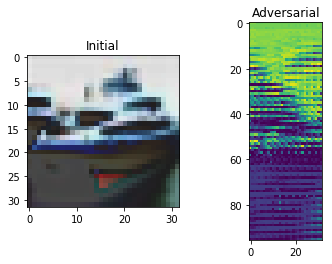

Total distortion: 3.329716691346113
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1389.5355    650.0031   -439.67218  -248.16647    65.17396  -835.49554
  -1493.4263    131.58698   873.7915    873.2229 ]] 0
initial_14_0.png
output/cifar/initial_14_0.png output/cifar/adversarial_14_0.png


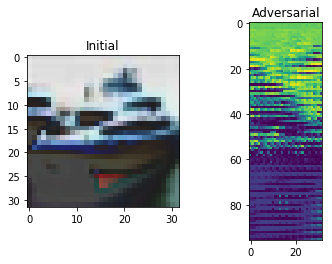

Total distortion: 4.738376248532428
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[  864.96893   613.87195  -226.85428  -245.88033  -128.31186  -374.53183
  -1109.2859    358.92938   445.28113   414.171  ]] 0
initial_15_0.png
output/cifar/initial_15_0.png output/cifar/adversarial_15_0.png


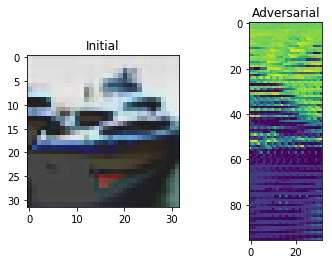

Total distortion: 4.044880850679214
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 724.3853   537.67535 -325.00974 -116.64384 -352.1416  -560.3968
  -485.2948  -181.43443  697.9707   553.2531 ]] 0
initial_16_0.png
output/cifar/initial_16_0.png output/cifar/adversarial_16_0.png


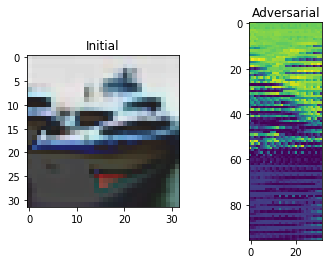

Total distortion: 3.6720355059666945
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1274.1489    748.26105  -486.45966  -248.76524   -92.25242  -774.9368
  -1582.5995    489.24738   729.9544    979.03033]] 0
initial_17_0.png
output/cifar/initial_17_0.png output/cifar/adversarial_17_0.png


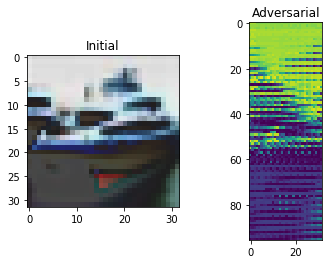

Total distortion: 0.9980681355520502
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 2048.6523    909.8327   -525.4137   -347.93353  -194.3714  -1275.9237
  -1593.3335   -557.6902   1503.973    1100.5837 ]] 0
initial_18_0.png
output/cifar/initial_18_0.png output/cifar/adversarial_18_0.png


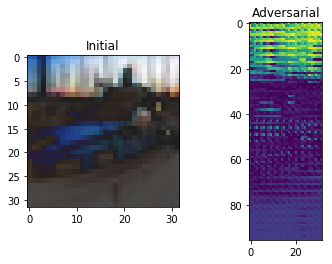

Total distortion: 0.3551348071289978
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 550.1154     20.879469 -215.57362   -15.636265    4.470823 -165.07051
  -603.11365   339.86612   201.3487    284.75824 ]] 0
initial_19_0.png
output/cifar/initial_19_0.png output/cifar/adversarial_19_0.png


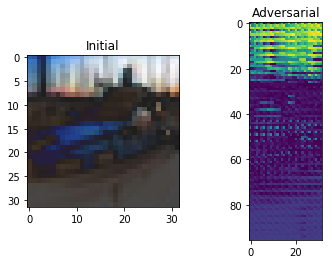

Total distortion: 0.18255313219067515
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 547.6589     79.88302  -234.01234   -27.109118  -32.84774  -182.78346
  -588.3119    287.5581    243.92297   293.52548 ]] 0
initial_20_0.png
output/cifar/initial_20_0.png output/cifar/adversarial_20_0.png


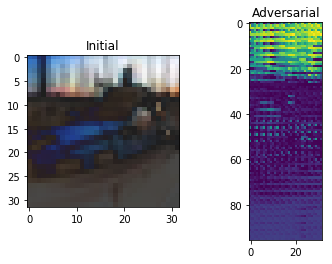

Total distortion: 0.7490504134392252
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 438.52155    -15.0650835 -145.56935    -26.39163     15.071959
  -131.25737   -547.4037     341.70538    179.69766    225.23938  ]] 0
initial_21_0.png
output/cifar/initial_21_0.png output/cifar/adversarial_21_0.png


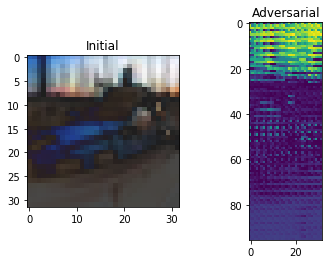

Total distortion: 0.8685190099547453
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 436.42606  -97.04749 -158.2757    41.03199   60.9394  -101.52564
  -505.94437  388.37286   90.26587  177.9082 ]] 0
initial_22_0.png
output/cifar/initial_22_0.png output/cifar/adversarial_22_0.png


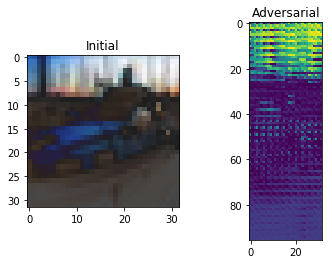

Total distortion: 0.8384915488925572
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 525.4046    -23.744688 -187.76881   -11.053379   54.049202 -113.50506
  -582.7534    374.91455   132.115     200.95695 ]] 0
initial_23_0.png
output/cifar/initial_23_0.png output/cifar/adversarial_23_0.png


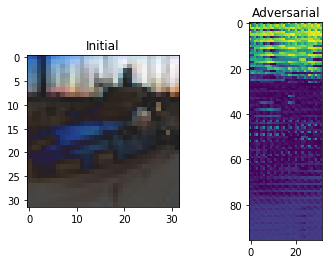

Total distortion: 0.9521097498149828
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 405.4082    -81.30879  -123.51952    17.624607   55.206184  -81.87567
  -520.69324   399.4001     72.588585  182.68123 ]] 0
initial_24_0.png
output/cifar/initial_24_0.png output/cifar/adversarial_24_0.png


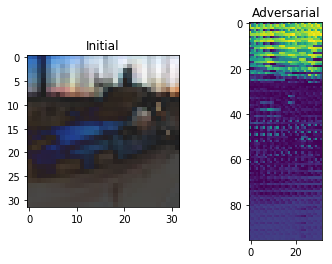

Total distortion: 1.056031225898762
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 533.7686    -20.760168 -242.31418    32.72052    -8.398329 -181.87163
  -442.3653    260.9816    147.8956    263.94327 ]] 0
initial_25_0.png
output/cifar/initial_25_0.png output/cifar/adversarial_25_0.png


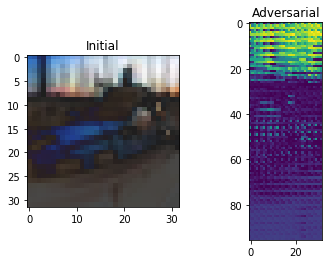

Total distortion: 0.7599449828587583
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 475.48947   -87.96035  -165.6969     13.985446   64.45716  -129.1438
  -589.8195    419.15012   140.74644   231.1767  ]] 0
initial_26_0.png
output/cifar/initial_26_0.png output/cifar/adversarial_26_0.png


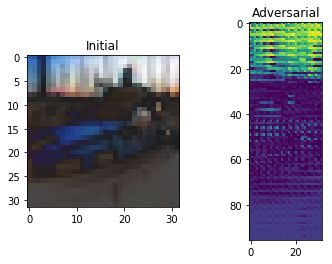

Total distortion: 0.311413042843274
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 514.5618        0.65286916 -213.1682       -6.5206046    11.97612
  -166.23726    -599.3942      355.39688     209.54851     287.3954    ]] 0
initial_27_0.png
output/cifar/initial_27_0.png output/cifar/adversarial_27_0.png


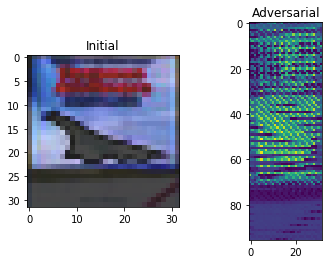

Total distortion: 1.6899459208351284
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[1080.1823  1143.6517  -701.9724  -107.51548 -453.14578 -729.2816
  -800.61206 -793.04987 1143.5958   766.3243 ]] 1
initial_28_0.png
output/cifar/initial_28_0.png output/cifar/adversarial_28_0.png


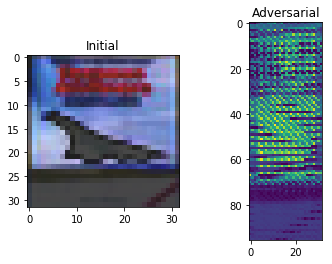

Total distortion: 2.0510518794647443
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 658.17773   316.24243  -238.11166   -28.089685  -51.124275 -229.00508
  -603.0994     -4.68966   404.09027    78.634575]] 0
initial_29_0.png
output/cifar/initial_29_0.png output/cifar/adversarial_29_0.png


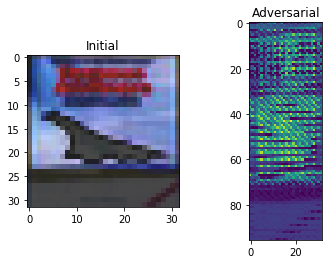

Total distortion: 3.4359723945014995
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 481.6288    283.88358  -532.97644   309.7641    -59.623905 -183.1492
  -619.8269   -172.20467   606.70703   176.0865  ]] 8
initial_30_0.png
output/cifar/initial_30_0.png output/cifar/adversarial_30_0.png


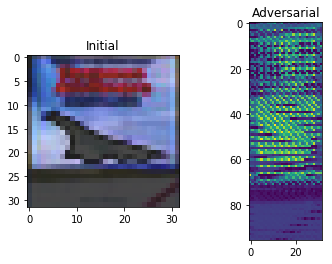

Total distortion: 1.6254984751341892
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 951.90814   278.63275  -309.07773   -42.044567  300.48474  -411.64276
  -819.4515   -212.2391    673.4446     28.997328]] 0
initial_31_0.png
output/cifar/initial_31_0.png output/cifar/adversarial_31_0.png


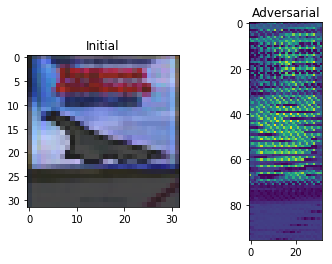

Total distortion: 3.409390742670317
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 211.20534   128.18999  -300.19785   215.94435  -135.9247     46.90636
  -349.5398     44.962376  326.00095   -43.373592]] 8
initial_32_0.png
output/cifar/initial_32_0.png output/cifar/adversarial_32_0.png


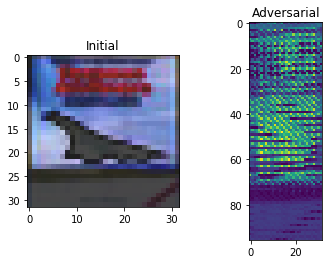

Total distortion: 2.7635711112372765
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 480.18124  243.59496 -338.89767   87.67217 -260.9393  -261.10147
  -382.4307  -253.99126  630.8505   304.11963]] 8
initial_33_0.png
output/cifar/initial_33_0.png output/cifar/adversarial_33_0.png


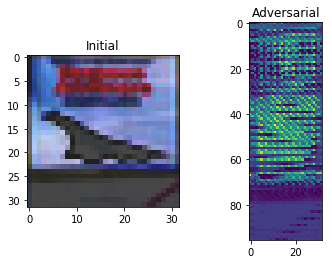

Total distortion: 3.0538447551727788
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 548.3526     85.99552  -248.02086   -20.432148   70.52391  -258.28098
  -755.4376    288.14792   451.54108   256.63205 ]] 0
initial_34_0.png
output/cifar/initial_34_0.png output/cifar/adversarial_34_0.png


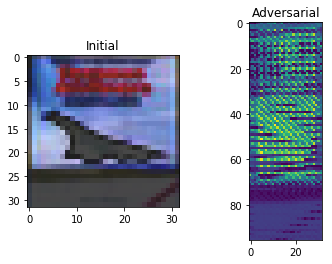

Total distortion: 1.1144571619131176
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[1283.1566     499.13107   -538.3222      -6.8790236  -67.82815
  -803.2644    -841.2261    -891.70593   1438.7886     478.44037  ]] 8
initial_35_0.png
output/cifar/initial_35_0.png output/cifar/adversarial_35_0.png


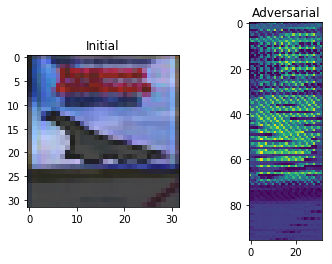

Total distortion: 2.1496671729520767
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[1087.9456    746.7434   -608.0252    -96.749916 -318.8077   -751.5622
  -929.8224   -406.90152   990.0106   1024.3309  ]] 0
initial_36_0.png
output/cifar/initial_36_0.png output/cifar/adversarial_36_0.png


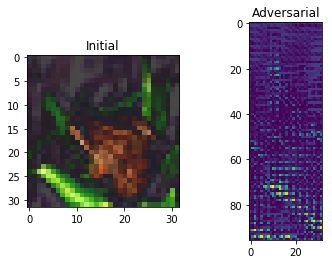

Total distortion: 1.8498834006191391
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ 185.67006   -92.64867    55.075363  120.655846  244.68068   -52.994263
    23.796852 -417.92648   214.17133  -223.89955 ]] 4
initial_37_0.png
output/cifar/initial_37_0.png output/cifar/adversarial_37_0.png


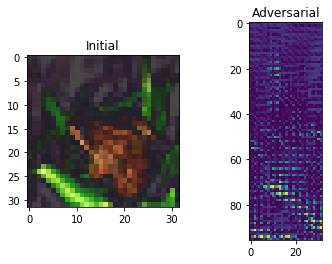

Total distortion: 1.5660371036250769
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[  73.14553   -63.541603  119.92394   103.06527   245.47969   -81.979645
    81.34203  -379.66068   143.4986   -198.95346 ]] 4
initial_38_0.png
output/cifar/initial_38_0.png output/cifar/adversarial_38_0.png


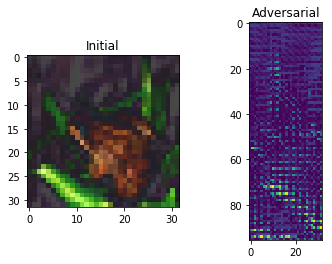

Total distortion: 0.8723353274794765
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[  44.99344 -348.5832   318.03522  206.50711  370.04865  -85.28328
   180.55363 -596.2503   297.03345 -322.58026]] 4
initial_39_0.png
output/cifar/initial_39_0.png output/cifar/adversarial_39_0.png


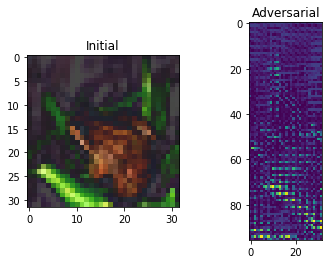

Total distortion: 0.5227025694343699
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ -21.341295 -390.1083    235.07208   295.96188   396.72153   -20.312902
   177.94983  -652.486     360.09225  -352.0612  ]] 4
initial_40_0.png
output/cifar/initial_40_0.png output/cifar/adversarial_40_0.png


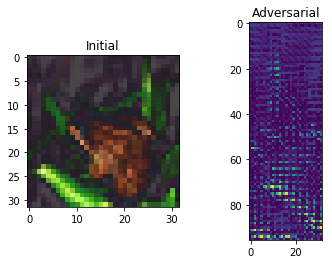

Total distortion: 0.0
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
initial_41_0.png
output/cifar/initial_41_0.png output/cifar/adversarial_41_0.png


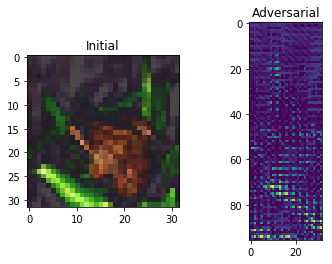

Total distortion: 1.2681834886955676
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ -49.609715 -285.3228     92.502655  247.04323   266.46332   101.355804
    59.599815 -427.15417   296.5938   -284.27737 ]] 8
initial_42_0.png
output/cifar/initial_42_0.png output/cifar/adversarial_42_0.png


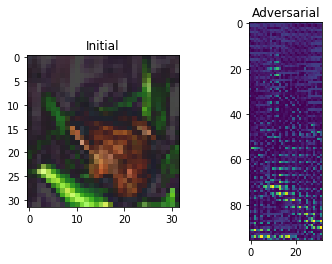

Total distortion: 1.805826067426517
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[  84.50743     8.634683   72.88987    63.35752   195.74435   -49.239796
   -82.503395 -127.46165    89.75419  -190.7549  ]] 4
initial_43_0.png
output/cifar/initial_43_0.png output/cifar/adversarial_43_0.png


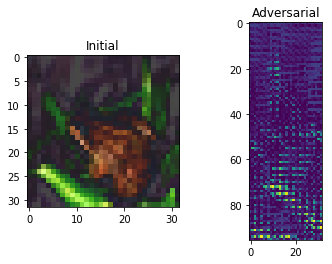

Total distortion: 1.7434229554333573
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ -23.106604  -103.648445     1.2867155  231.47174    150.42911
    55.9248      61.390865  -527.7007     410.85565   -252.62659  ]] 8
initial_44_0.png
output/cifar/initial_44_0.png output/cifar/adversarial_44_0.png


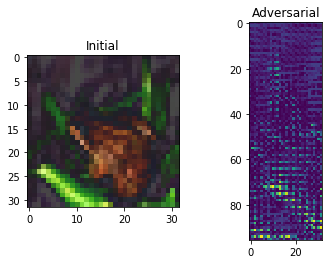

Total distortion: 1.6859508043671065
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[   6.704245 -104.421074  149.39641   127.39511   226.72433   -81.63804
   114.038376 -375.99557   146.64041  -169.33534 ]] 4
initial_45_0.png
output/cifar/initial_45_0.png output/cifar/adversarial_45_0.png


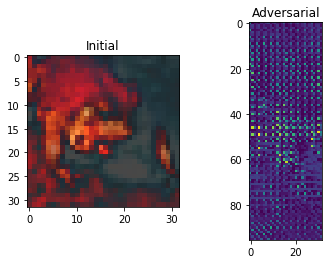

Total distortion: 1.4999065370052151
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 696.9674   183.43425 -317.19385  -78.39884 -200.83246 -335.49063
  -331.81226 -320.94635  558.16437  496.3674 ]] 0
initial_46_0.png
output/cifar/initial_46_0.png output/cifar/adversarial_46_0.png


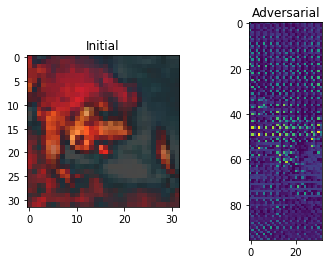

Total distortion: 1.661278486732353
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 626.1942    294.7669   -336.19104   -84.410324 -240.81996  -329.85773
  -367.28162  -320.56744   563.7951    535.44025 ]] 0
initial_47_0.png
output/cifar/initial_47_0.png output/cifar/adversarial_47_0.png


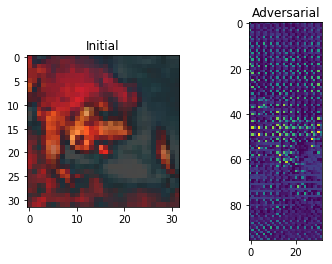

Total distortion: 0.6011267235489868
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 510.3827    128.65053  -301.3194    -24.472467 -200.05663  -231.63991
  -280.1487   -233.85336   487.56937   420.11758 ]] 0
initial_48_0.png
output/cifar/initial_48_0.png output/cifar/adversarial_48_0.png


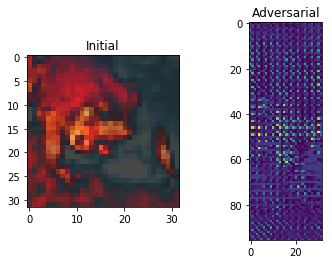

Total distortion: 0.6302145151092583
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 510.51898     97.1397    -310.78152     -1.0151596 -218.77757
  -219.00276   -263.6664    -245.47453    488.9384     430.949    ]] 0
initial_49_0.png
output/cifar/initial_49_0.png output/cifar/adversarial_49_0.png


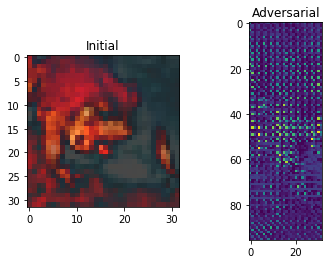

Total distortion: 0.6121291010732686
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 493.8765     71.06673  -297.9943    -14.073165 -133.57637  -211.4214
  -291.6275   -158.69745   416.8874    411.35312 ]] 0
initial_50_0.png
output/cifar/initial_50_0.png output/cifar/adversarial_50_0.png


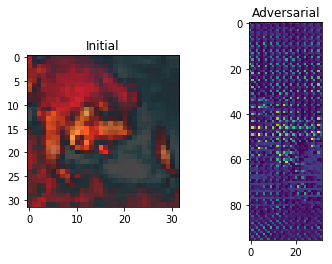

Total distortion: 0.42933565820201236
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 496.25272   144.6249   -335.74228   -11.369567 -225.63747  -213.89975
  -280.53754  -217.11043   457.06827   466.80676 ]] 0
initial_51_0.png
output/cifar/initial_51_0.png output/cifar/adversarial_51_0.png


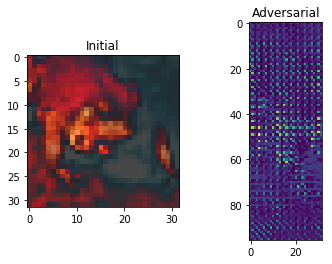

Total distortion: 0.7462529916240082
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 505.9635     76.64532  -303.05908   -15.035174 -140.13257  -232.62793
  -329.32352  -132.0518    441.0623    432.77884 ]] 0
initial_52_0.png
output/cifar/initial_52_0.png output/cifar/adversarial_52_0.png


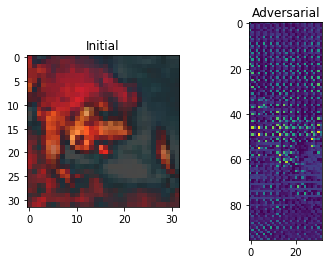

Total distortion: 1.2417261958520034
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 553.9056    129.74272  -302.8749    -30.738579 -233.97227  -258.90805
  -248.05728  -321.21957   572.1711    397.77402 ]] 8
initial_53_0.png
output/cifar/initial_53_0.png output/cifar/adversarial_53_0.png


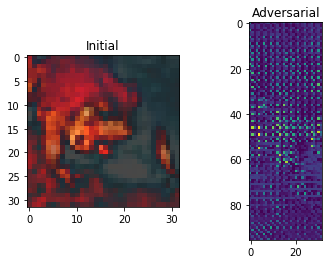

Total distortion: 1.642870501647563
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 582.28094  128.0021  -295.42444  -33.37096 -215.30203 -265.74695
  -280.3342  -289.64413  501.705    469.06598]] 0
initial_54_0.png
output/cifar/initial_54_0.png output/cifar/adversarial_54_0.png


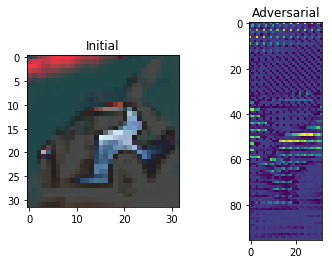

Total distortion: 1.334762859927722
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 593.3109    -193.1314     288.7202      -3.0177474 -133.35614
  -155.55461    -84.226364  -429.31665    461.33957   -222.2221   ]] 0
initial_55_0.png
output/cifar/initial_55_0.png output/cifar/adversarial_55_0.png


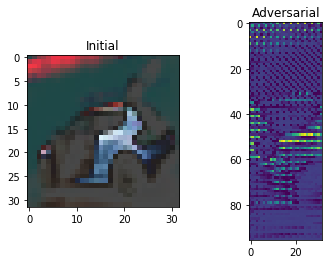

Total distortion: 0.8898073425079195
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 559.2398   -229.25157   298.12314     7.865824 -111.6861   -119.07178
  -128.17725  -337.03583   341.15475  -160.90668 ]] 0
initial_56_0.png
output/cifar/initial_56_0.png output/cifar/adversarial_56_0.png


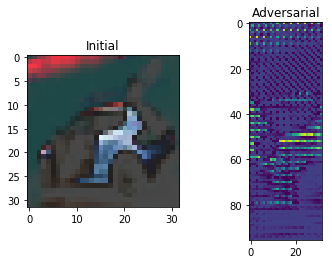

Total distortion: 0.2945617599267564
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 487.47195 -228.79877  242.11041   23.10581 -155.22478 -105.72935
  -141.10709 -343.37497  434.27106 -103.50301]] 0
initial_57_0.png
output/cifar/initial_57_0.png output/cifar/adversarial_57_0.png


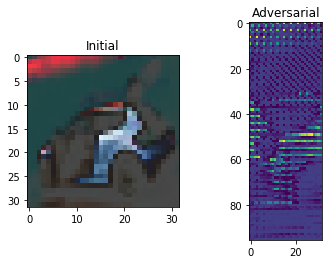

Total distortion: 2.089382912281059
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 413.54114  -271.87326   125.407005   10.672366   17.417505  -71.89173
  -200.53201  -192.63153   369.1578    -74.671394]] 0
initial_58_0.png
output/cifar/initial_58_0.png output/cifar/adversarial_58_0.png


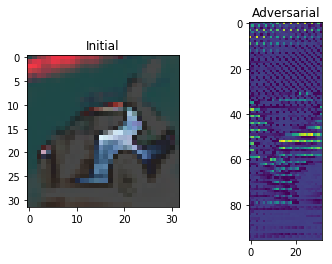

Total distortion: 0.8352665213715263
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 439.19077  -225.78291   183.17511    27.858059 -147.6673    -56.50519
   -89.12869  -344.575     436.13962  -144.19849 ]] 0
initial_59_0.png
output/cifar/initial_59_0.png output/cifar/adversarial_59_0.png


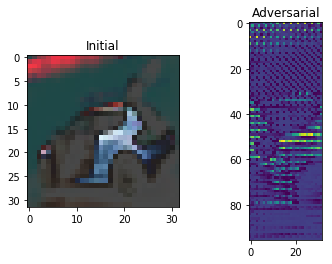

Total distortion: 0.7478072776245436
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 467.57187   -195.10394    199.4115       5.4156175 -136.49327
  -111.53871    -71.139084  -378.99518    474.1531    -166.81671  ]] 8
initial_60_0.png
output/cifar/initial_60_0.png output/cifar/adversarial_60_0.png


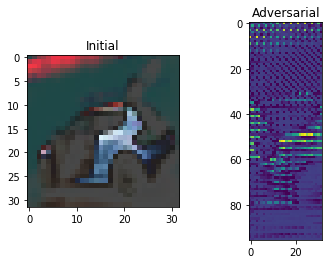

Total distortion: 1.6705974796082061
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 503.47696  -269.74112   140.81113    10.888429   16.804472  -99.93857
  -177.01022  -262.5688    374.2351    -96.37142 ]] 0
initial_61_0.png
output/cifar/initial_61_0.png output/cifar/adversarial_61_0.png


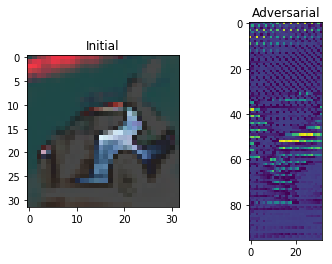

Total distortion: 1.7743397572757218
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 395.91714  -186.32533   163.63208    37.680176 -239.65727   -94.88561
   -42.457043 -496.5859    708.25446  -189.06102 ]] 8
initial_62_0.png
output/cifar/initial_62_0.png output/cifar/adversarial_62_0.png


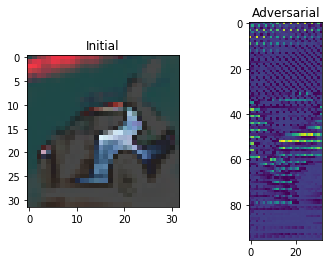

Total distortion: 0.17129670738289263
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 493.90808  -206.78926   245.31558    10.246621 -163.071    -126.08031
  -151.35394  -345.66544   446.2929    -86.426094]] 0
initial_63_0.png
output/cifar/initial_63_0.png output/cifar/adversarial_63_0.png


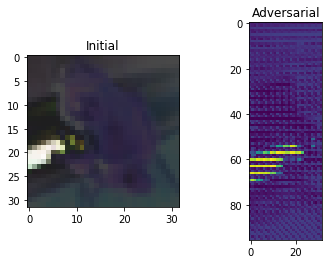

Total distortion: 0.43176454172125167
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 775.58356  -317.2563    -12.885562  110.51246    11.644096 -152.39014
  -420.3814   -239.3695    536.2969     59.500942]] 0
initial_64_0.png
output/cifar/initial_64_0.png output/cifar/adversarial_64_0.png


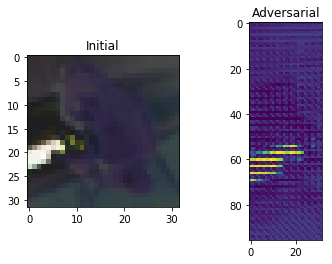

Total distortion: 0.9646262105113846
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 794.6106   -299.73196   -56.445827  102.22935    25.812807 -161.7767
  -448.06442  -264.85712   581.6934     97.17017 ]] 0
initial_65_0.png
output/cifar/initial_65_0.png output/cifar/adversarial_65_0.png


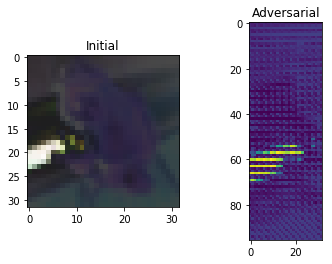

Total distortion: 0.2688778129760352
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 712.0961   -346.0686    -11.57253   134.86575    12.560853 -117.21087
  -400.98627  -229.4132    529.94617    38.533398]] 0
initial_66_0.png
output/cifar/initial_66_0.png output/cifar/adversarial_66_0.png


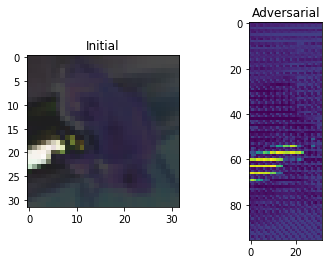

Total distortion: 0.5799813237965157
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 663.5258    -381.00397      3.0578947  156.69144     20.492813
   -88.197266  -396.749     -205.58308    517.1963      22.51181  ]] 0
initial_67_0.png
output/cifar/initial_67_0.png output/cifar/adversarial_67_0.png


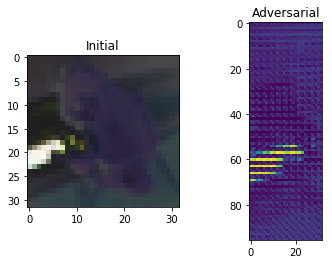

Total distortion: 0.3164829820438901
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 723.15393   -338.87808     -7.8766623  129.58406     39.24444
  -126.61432   -408.73212   -226.99588    519.1886      30.908531 ]] 0
initial_68_0.png
output/cifar/initial_68_0.png output/cifar/adversarial_68_0.png


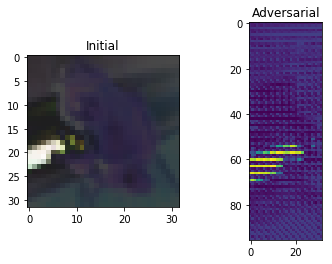

Total distortion: 0.6895161888955131
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 657.759    -351.03946    -2.194642  142.48825    29.463305  -69.30467
  -389.8171   -188.34763   464.24625     7.99443 ]] 0
initial_69_0.png
output/cifar/initial_69_0.png output/cifar/adversarial_69_0.png


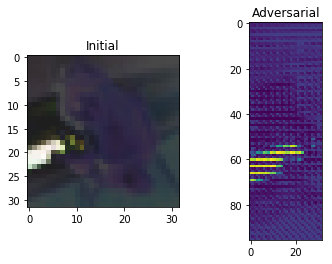

Total distortion: 0.5683569629526245
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 699.8709   -375.67007   -22.827234  138.96893    48.524284 -130.45354
  -450.34763  -207.73367   584.9752     58.23213 ]] 0
initial_70_0.png
output/cifar/initial_70_0.png output/cifar/adversarial_70_0.png


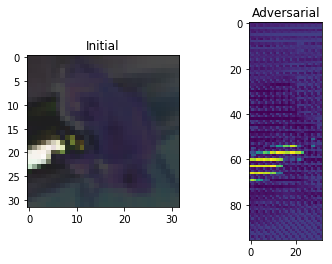

Total distortion: 0.7459438233253363
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 739.38336  -392.19186  -101.76851   179.83502    -8.683598 -169.60538
  -453.88278  -283.5615    744.54535   100.7349  ]] 8
initial_71_0.png
output/cifar/initial_71_0.png output/cifar/adversarial_71_0.png


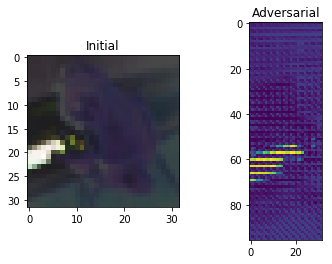

Total distortion: 0.7193700769357068
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 741.0586   -362.07117   -33.778122  146.19527    13.991625 -141.47214
  -445.14795  -218.56763   575.2478     77.39181 ]] 0
initial_72_0.png
output/cifar/initial_72_0.png output/cifar/adversarial_72_0.png


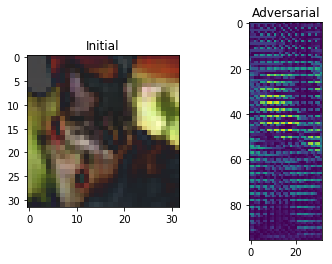

Total distortion: 1.4800532016986412
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 228.28627   -193.78589    167.60945    123.7674     205.84688
  -181.72707      7.2066536 -178.48637     10.332191   -78.09359  ]] 0
initial_73_0.png
output/cifar/initial_73_0.png output/cifar/adversarial_73_0.png


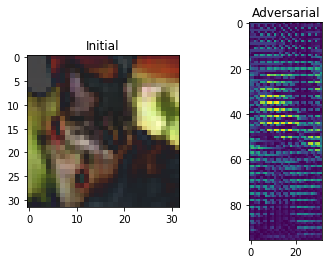

Total distortion: 1.3325199785577757
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 188.98529   -28.306322  143.51677    73.810074  161.21013  -296.75958
    89.37262  -329.77487   152.54419   -11.742664]] 0
initial_74_0.png
output/cifar/initial_74_0.png output/cifar/adversarial_74_0.png


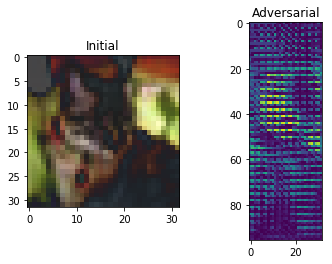

Total distortion: 0.804380562028721
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 100.20158 -255.80634  272.97653  150.48085  228.94012 -187.32858
   149.91138 -191.8024   -69.61412 -122.0253 ]] 2
initial_75_0.png
output/cifar/initial_75_0.png output/cifar/adversarial_75_0.png


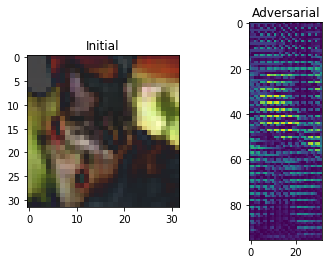

Total distortion: 0.5555217272340411
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 118.10877  -329.39594   218.39476   223.12735   325.50946  -121.143936
   147.81754  -190.10635  -138.25436  -178.18564 ]] 4
initial_76_0.png
output/cifar/initial_76_0.png output/cifar/adversarial_76_0.png


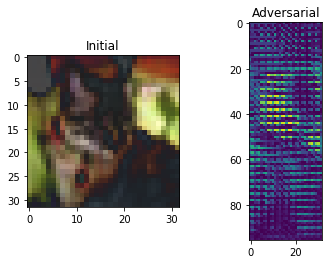

Total distortion: 0.8330819028795218
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 1.0160857e+02 -3.5431268e+02  1.1972355e+02  2.0046178e+02
   1.9608459e+02  7.3506371e+01  5.8586273e+01  1.5331194e-01
  -1.5639714e+02 -1.8067557e+02]] 3
initial_77_0.png
output/cifar/initial_77_0.png output/cifar/adversarial_77_0.png


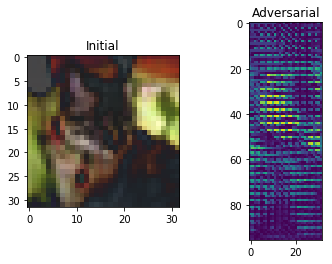

Total distortion: 0.8696869236967841
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[  72.4375   -284.74628   340.1234    191.7949    264.094    -266.88568
   354.18097  -371.094     -14.903846 -197.68192 ]] 6
initial_78_0.png
output/cifar/initial_78_0.png output/cifar/adversarial_78_0.png


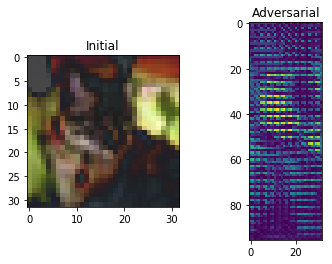

Total distortion: 0.6980062019269362
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 102.968605 -329.64886   159.42418   183.6017    215.37776     1.601498
    41.900623  -12.344937 -147.84805  -138.10936 ]] 4
initial_79_0.png
output/cifar/initial_79_0.png output/cifar/adversarial_79_0.png


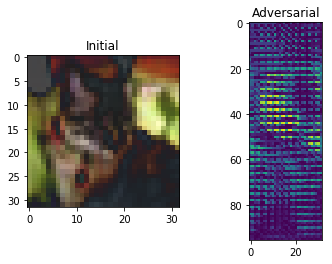

Total distortion: 1.3538105520864254
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 165.1865   -129.09259   136.1218     92.11077   165.83183  -279.03247
    49.545204 -365.6796    310.61676   -18.6539  ]] 8
initial_80_0.png
output/cifar/initial_80_0.png output/cifar/adversarial_80_0.png


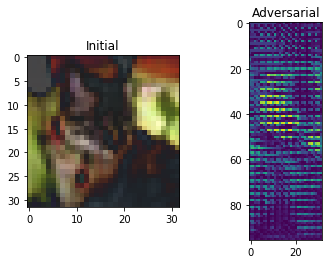

Total distortion: 1.0851626479068055
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 264.50385  -165.28156   103.089745  115.100555  218.88496  -290.84265
  -108.66503  -180.5504    103.62187   151.18996 ]] 0
initial_81_0.png
output/cifar/initial_81_0.png output/cifar/adversarial_81_0.png


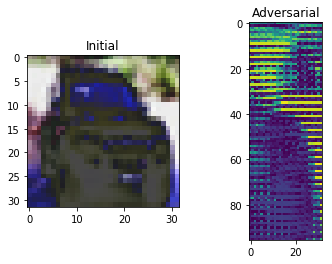

Total distortion: 0.7613905370739981
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[ 103.94356    128.82988      2.7090406   49.95114   -117.25092
  -181.85313    -66.40461    -59.644695   100.81407    254.18991  ]] 9
initial_82_0.png
output/cifar/initial_82_0.png output/cifar/adversarial_82_0.png


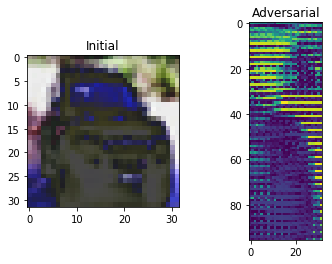

Total distortion: 1.1740433024425172
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[  25.130568    103.6613       55.66974      53.548393   -139.26324
  -130.97531      29.36546       0.72062224  -17.003405    191.5472    ]] 9
initial_83_0.png
output/cifar/initial_83_0.png output/cifar/adversarial_83_0.png


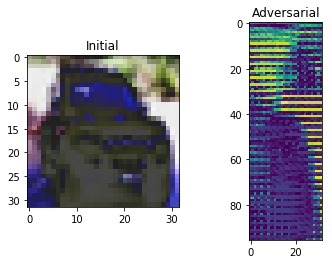

Total distortion: 1.3668340607605414
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[  55.190132   60.323616   37.356064   76.09717  -129.0031   -125.56381
    16.09629    -8.686324   16.721174  166.82533 ]] 9
initial_84_0.png
output/cifar/initial_84_0.png output/cifar/adversarial_84_0.png


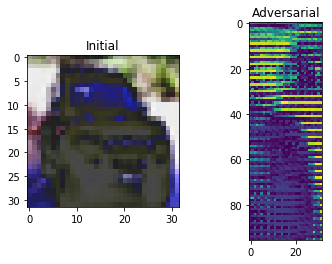

Total distortion: 1.4878774981371587
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[  21.214783   62.441036   26.327936  107.70731   -87.29754  -118.93137
   -17.30466   -48.432274   28.392836  197.34035 ]] 9
initial_85_0.png
output/cifar/initial_85_0.png output/cifar/adversarial_85_0.png


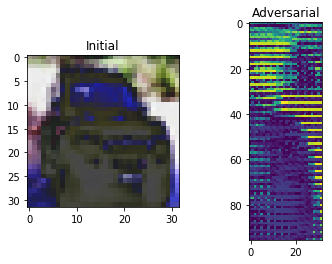

Total distortion: 1.4605408808423737
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[   2.811339   16.45268    67.37843    93.021    -100.386894 -100.82672
    89.47756     5.775487  -70.38447   152.13293 ]] 9
initial_86_0.png
output/cifar/initial_86_0.png output/cifar/adversarial_86_0.png


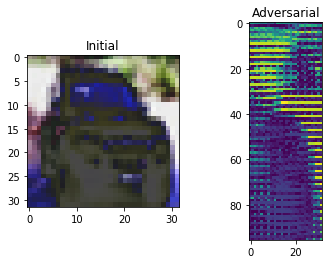

Total distortion: 1.213159995028771
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[   1.4827352   41.13582     55.414623    93.13762   -113.680916
  -109.93017     93.107285    -6.1170225  -58.84604    170.136    ]] 9
initial_87_0.png
output/cifar/initial_87_0.png output/cifar/adversarial_87_0.png


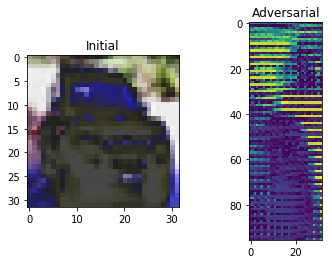

Total distortion: 0.9541992012596265
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[  19.31422    54.939827   60.978424   69.25876  -109.84484  -141.03926
     9.695168   39.491474  -35.342815  241.39966 ]] 9
initial_88_0.png
output/cifar/initial_88_0.png output/cifar/adversarial_88_0.png


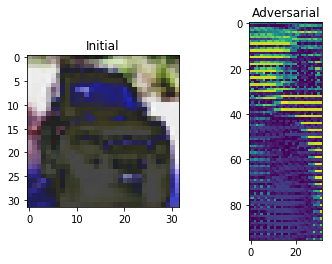

Total distortion: 0.8884668805460046
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[ 140.21355   147.31024   -36.233757   59.28851  -128.41377  -179.47792
   -76.498856 -131.56808   179.09329   217.51123 ]] 9
initial_89_0.png
output/cifar/initial_89_0.png output/cifar/adversarial_89_0.png


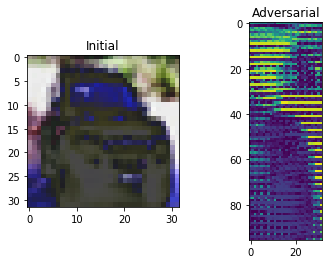

Total distortion: 0.22873203105391332
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[  86.739075  143.98338    17.171429   46.689396 -149.49805  -192.83199
   -32.406895  -50.60669    75.536316  274.11774 ]] 9
initial_90_1.png
output/cifar/initial_90_1.png output/cifar/adversarial_90_1.png


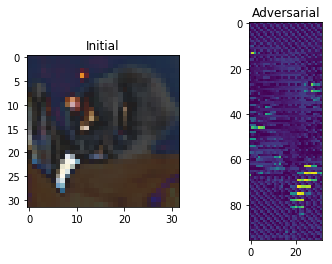

Total distortion: 2.299872175064728
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 280.95016  -362.8306   -141.76959   259.1069    -50.862625   53.32458
  -119.79531  -315.84207   396.8925     93.249886]] 8
initial_91_1.png
output/cifar/initial_91_1.png output/cifar/adversarial_91_1.png


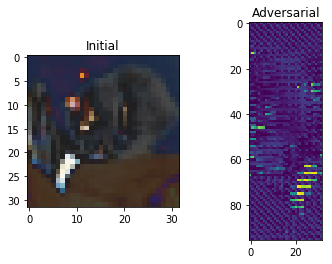

Total distortion: 2.3453341407463646
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 259.7402   -432.28943  -124.335526  252.11644    73.837425   62.197613
  -105.46857  -268.3361    328.74728    36.21249 ]] 8
initial_92_1.png
output/cifar/initial_92_1.png output/cifar/adversarial_92_1.png


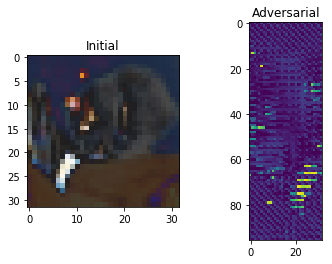

Total distortion: 3.120930577907676
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[  40.410713  -672.407       60.361347   336.86246    336.2822
   214.65173      1.3177444 -147.0626     179.74156   -256.8877   ]] 3
initial_93_1.png
output/cifar/initial_93_1.png output/cifar/adversarial_93_1.png


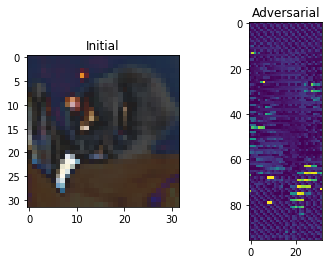

Total distortion: 4.229894766434199
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 123.110985 -604.97754   -33.49562   239.01942   290.21213   199.99501
   -37.377834 -121.70162   262.78128  -188.22821 ]] 4
initial_94_1.png
output/cifar/initial_94_1.png output/cifar/adversarial_94_1.png


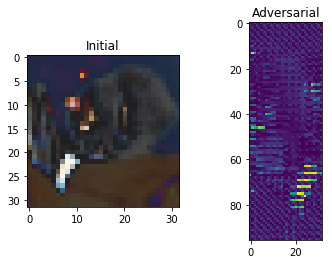

Total distortion: 3.153470467884754
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 162.27245  -518.33826    51.096085  315.4574    188.45612   203.75247
   -74.811806  -78.36499    68.598274 -261.71414 ]] 3
initial_95_1.png
output/cifar/initial_95_1.png output/cifar/adversarial_95_1.png


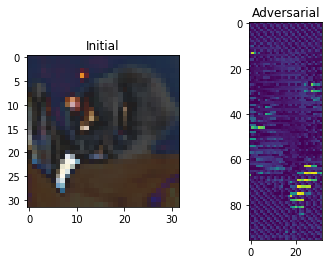

Total distortion: 3.0286802430410846
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 226.93607  -461.80875    45.728912  273.06122   183.59105   149.65358
   -80.15124  -131.84831    86.26624  -213.04506 ]] 3
initial_96_1.png
output/cifar/initial_96_1.png output/cifar/adversarial_96_1.png


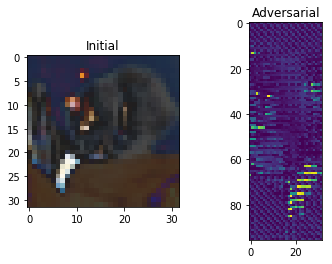

Total distortion: 4.909108489419303
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 316.18295  -631.26587    44.097126  205.73987   409.87537   274.51593
  -176.06035   156.67099  -114.0476   -325.55188 ]] 4
initial_97_1.png
output/cifar/initial_97_1.png output/cifar/adversarial_97_1.png


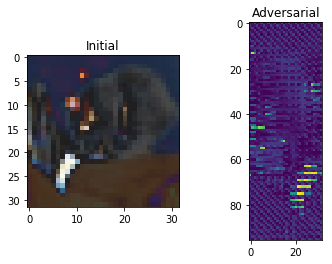

Total distortion: 2.0244603462283295
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 243.37245  -298.06607  -142.17862   256.39365   -74.54427    61.29117
  -113.924515 -291.98337   333.20984    71.56541 ]] 8
initial_98_1.png
output/cifar/initial_98_1.png output/cifar/adversarial_98_1.png


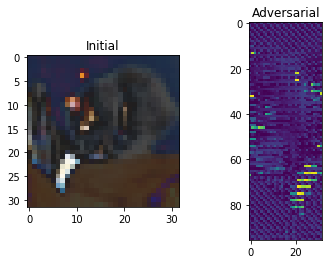

Total distortion: 3.0495512335145443
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 284.26108  -249.81541  -137.1217    207.49171    14.670019   37.063816
    30.057962 -341.63937   187.60179    19.252419]] 0
initial_99_1.png
output/cifar/initial_99_1.png output/cifar/adversarial_99_1.png


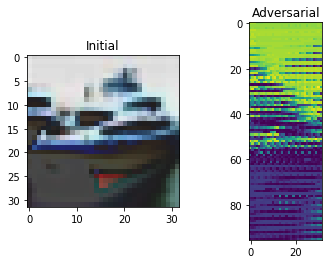

Total distortion: 2.0652337885452283
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1974.8011    924.2949   -480.0014   -252.92375  -305.6539  -1233.9323
  -1466.4213   -909.0882   1840.9752    820.2678 ]] 0
initial_100_1.png
output/cifar/initial_100_1.png output/cifar/adversarial_100_1.png


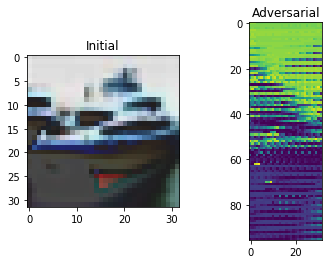

Total distortion: 2.632660903867685
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1908.7059   1012.23846  -470.36444  -305.67477  -341.0402  -1215.6158
  -1360.3226   -809.6917   1621.1224    856.0244 ]] 0
initial_101_1.png
output/cifar/initial_101_1.png output/cifar/adversarial_101_1.png


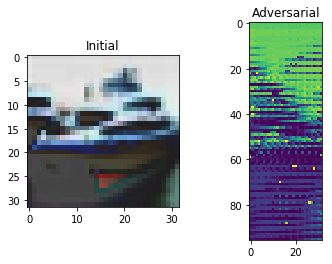

Total distortion: 7.568940249886219
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1173.52       393.94135   -310.58624   -203.16118    -27.438389
   -690.1586   -1205.3292     -21.194216   931.3657     674.9774  ]] 0
initial_102_1.png
output/cifar/initial_102_1.png output/cifar/adversarial_102_1.png


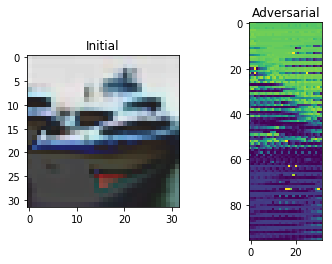

Total distortion: 6.549417298001355
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1584.9694    640.746    -365.24744  -214.94586    -2.80489  -936.0896
  -1346.8203   -492.4044   1238.7168    678.05237]] 0
initial_103_1.png
output/cifar/initial_103_1.png output/cifar/adversarial_103_1.png


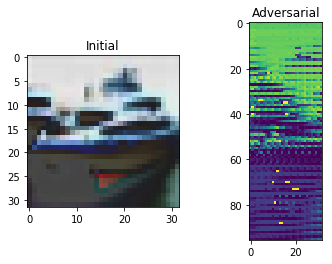

Total distortion: 8.042237362022423
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1253.1542     436.46112   -388.87128    -79.33715     51.689884
   -791.2931   -1066.5806    -461.2844    1233.6857     461.65787 ]] 0
initial_104_1.png
output/cifar/initial_104_1.png output/cifar/adversarial_104_1.png


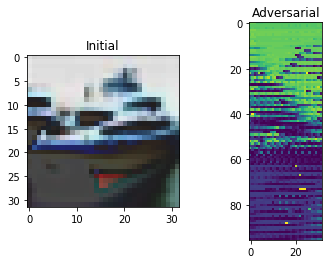

Total distortion: 8.2108719929297
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1044.3224     645.5934    -227.35103   -229.70207   -210.45264
   -587.9119   -1117.1847       8.337191   810.91       472.4512  ]] 0
initial_105_1.png
output/cifar/initial_105_1.png output/cifar/adversarial_105_1.png


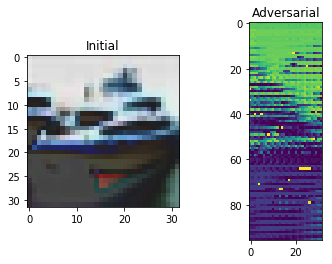

Total distortion: 7.762634806913682
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[1282.0948   467.84552 -241.12978 -216.61731  -94.73217 -782.87646
  -939.1067  -416.44702  997.47955  601.8143 ]] 0
initial_106_1.png
output/cifar/initial_106_1.png output/cifar/adversarial_106_1.png


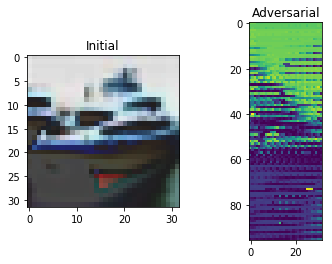

Total distortion: 6.134777439498334
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1556.2834     721.99274   -420.54712   -305.00732    -26.346052
   -935.78516  -1502.7692    -193.53323   1212.9266     782.0328  ]] 0
initial_107_1.png
output/cifar/initial_107_1.png output/cifar/adversarial_107_1.png


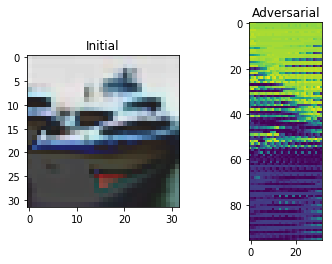

Total distortion: 2.1231085269121595
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 2047.7472   1088.692    -541.132    -346.93115  -260.47943 -1304.6097
  -1564.2063   -765.6002   1707.7168    950.3131 ]] 0
initial_108_1.png
output/cifar/initial_108_1.png output/cifar/adversarial_108_1.png


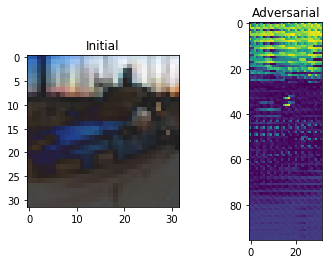

Total distortion: 2.10445412161049
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 719.2895    185.40077  -281.32498   -76.796364  -89.2947   -275.85504
  -669.34686   331.062     234.37158   419.82175 ]] 0
initial_109_1.png
output/cifar/initial_109_1.png output/cifar/adversarial_109_1.png


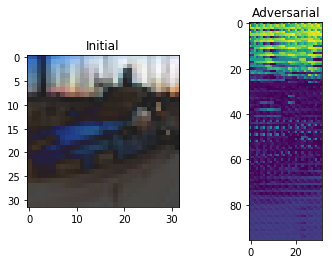

Total distortion: 0.40155409199265224
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 562.751      87.46684  -231.28114   -29.614233  -38.276882 -190.4418
  -599.44403   274.70294   259.8534    296.31497 ]] 0
initial_110_1.png
output/cifar/initial_110_1.png output/cifar/adversarial_110_1.png


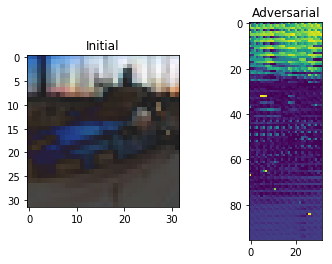

Total distortion: 3.6832884968463953
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 588.6323      -6.4225893 -177.0616    -105.78068     45.49272
  -235.20746   -622.2495     268.21573    284.35895    414.86386  ]] 0
initial_111_1.png
output/cifar/initial_111_1.png output/cifar/adversarial_111_1.png


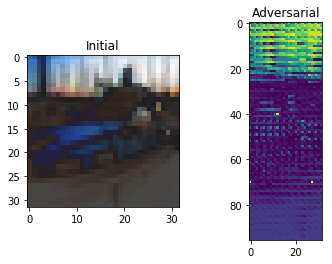

Total distortion: 3.5207956225540697
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 4.8375998e+02 -1.4065942e+01 -2.0779703e+02 -3.5365507e-01
   3.8012222e+01 -1.5055624e+02 -6.0941418e+02  3.6986981e+02
   2.0718677e+02  2.8557294e+02]] 0
initial_112_1.png
output/cifar/initial_112_1.png output/cifar/adversarial_112_1.png


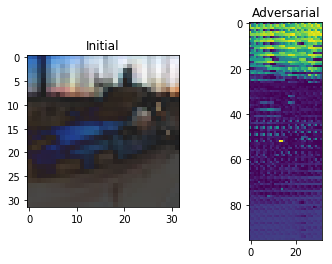

Total distortion: 2.6844362938025963
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 594.2389   -125.87435  -172.11234    14.712412   76.805016 -138.83861
  -552.9201    348.70444   160.44823   170.23117 ]] 0
initial_113_1.png
output/cifar/initial_113_1.png output/cifar/adversarial_113_1.png


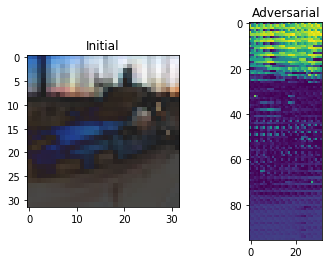

Total distortion: 2.9122420037076555
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 556.3643    -60.414265 -174.24901   -36.391186  112.22966  -141.42064
  -601.8376    436.06833   122.49109   207.18073 ]] 0
initial_114_1.png
output/cifar/initial_114_1.png output/cifar/adversarial_114_1.png


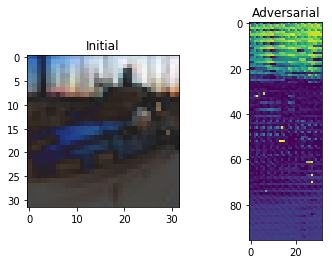

Total distortion: 4.192692512182235
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 584.17834   -73.857315 -137.97931   -47.065403   67.26257  -175.43271
  -376.15176   250.0927    123.71041   144.53319 ]] 0
initial_115_1.png
output/cifar/initial_115_1.png output/cifar/adversarial_115_1.png


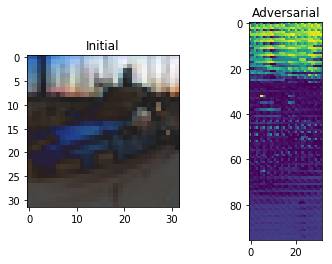

Total distortion: 2.7478671038835683
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 522.1487    -52.15782  -172.90672   -69.279274   78.398026 -165.86081
  -655.6627    407.69867   233.87248   306.6981  ]] 0
initial_116_1.png
output/cifar/initial_116_1.png output/cifar/adversarial_116_1.png


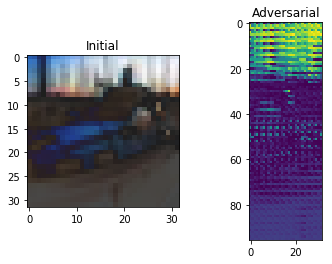

Total distortion: 1.578435130852957
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 574.16547    71.49574  -277.42932    14.622218  -35.49626  -204.24771
  -622.18304   297.11948   241.34926   355.06223 ]] 0
initial_117_1.png
output/cifar/initial_117_1.png output/cifar/adversarial_117_1.png


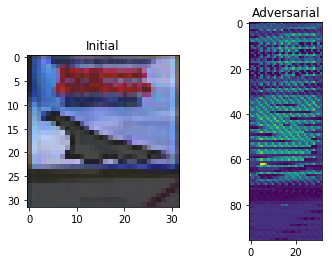

Total distortion: 6.852496684817125
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[1044.7366   591.8991  -395.4579   -86.74004 -111.87655 -565.6033
  -672.20734 -435.70352  672.7597   451.14694]] 0
initial_118_1.png
output/cifar/initial_118_1.png output/cifar/adversarial_118_1.png


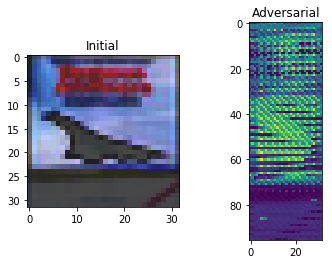

Total distortion: 6.065106333078009
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[1182.4868     461.5046    -298.41144   -156.20784     -5.0261407
  -677.9863    -807.7097    -386.95853    830.34485    379.44626  ]] 0
initial_119_1.png
output/cifar/initial_119_1.png output/cifar/adversarial_119_1.png


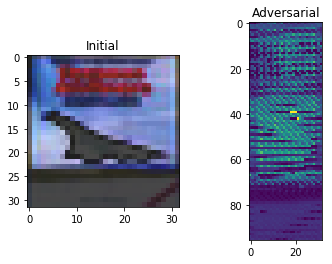

Total distortion: 7.968569764735638
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 697.7954    193.8381   -285.82452    60.731148   97.4834   -360.7706
  -566.8662   -201.94884   550.4147    172.69695 ]] 0
initial_120_1.png
output/cifar/initial_120_1.png output/cifar/adversarial_120_1.png


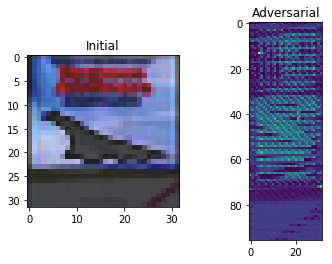

Total distortion: 9.620368140268692
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 636.25574   110.62543  -190.52962    23.845503  245.26529  -311.2234
  -576.71594   -50.201138  392.17395    71.78219 ]] 0
initial_121_1.png
output/cifar/initial_121_1.png output/cifar/adversarial_121_1.png


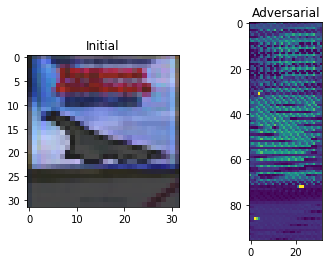

Total distortion: 8.61232987943149
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 693.3318     43.663628 -198.47377    62.3494    263.06137  -345.08508
  -508.87567  -313.8493    615.73145     2.755655]] 0
initial_122_1.png
output/cifar/initial_122_1.png output/cifar/adversarial_122_1.png


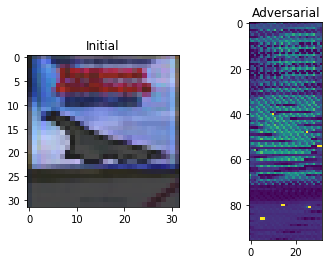

Total distortion: 8.451571111944448
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 770.4074    140.37576  -225.58046   -12.918508  196.54877  -383.86218
  -550.2894   -287.78168   620.36584    73.51324 ]] 0
initial_123_1.png
output/cifar/initial_123_1.png output/cifar/adversarial_123_1.png


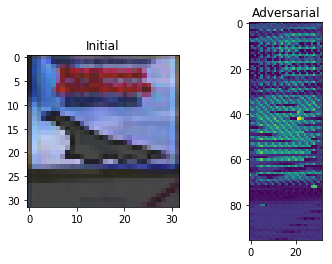

Total distortion: 7.3616955251245395
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 668.0578    156.34737  -262.72037   -57.219975  154.65338  -373.96252
  -744.3787    104.80132   507.56033   316.6131  ]] 0
initial_124_1.png
output/cifar/initial_124_1.png output/cifar/adversarial_124_1.png


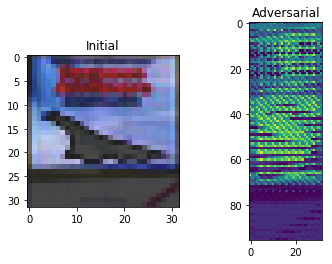

Total distortion: 5.777887139548788
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[1579.7754   717.18506 -501.47626 -150.14621 -190.91278 -882.65515
  -954.8975  -837.22797 1307.9521   517.59296]] 0
initial_125_1.png
output/cifar/initial_125_1.png output/cifar/adversarial_125_1.png


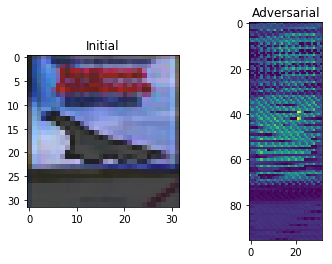

Total distortion: 7.800001232440557
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 757.0513    330.1078   -380.6162     33.862335  -66.012184 -456.46353
  -672.5061   -210.50392   675.16693   458.49268 ]] 0
initial_126_1.png
output/cifar/initial_126_1.png output/cifar/adversarial_126_1.png


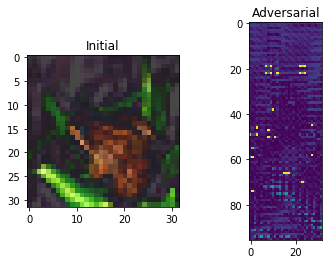

Total distortion: 8.377643680370626
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ 167.21205    -317.74         39.92881     191.42427     207.84769
   175.3835      -43.784725   -161.65224       0.32842943 -220.75739   ]] 4
initial_127_1.png
output/cifar/initial_127_1.png output/cifar/adversarial_127_1.png


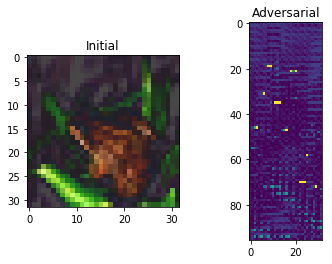

Total distortion: 7.886494800095515
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ 108.661766 -262.92484   -31.326752  171.28683   151.29288   -13.405665
   121.081436 -267.29926   159.4217    -86.51798 ]] 3
initial_128_1.png
output/cifar/initial_128_1.png output/cifar/adversarial_128_1.png


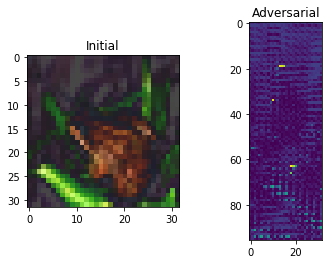

Total distortion: 7.225717856044218
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ 130.86089   -95.145584  -18.75426    82.153984  169.85425   -27.583143
   -42.08643  -245.82971   178.21552   -54.973324]] 8
initial_129_1.png
output/cifar/initial_129_1.png output/cifar/adversarial_129_1.png


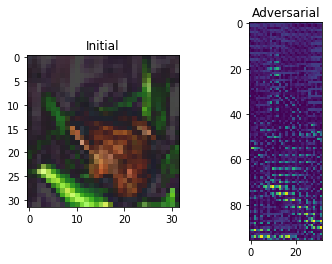

Total distortion: 1.595837590914924
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ -21.166277 -411.0312    264.72922   268.72906   448.8795    -47.534893
   185.2692   -670.64606   397.31018  -371.81384 ]] 4
initial_130_1.png
output/cifar/initial_130_1.png output/cifar/adversarial_130_1.png


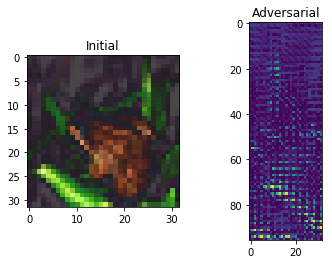

Total distortion: 0.0
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
initial_131_1.png
output/cifar/initial_131_1.png output/cifar/adversarial_131_1.png


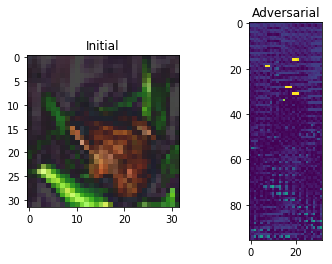

Total distortion: 7.417073385109362
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ 137.87556  -212.87112    32.549545  260.44098   200.38449   185.53593
   -43.656048 -339.51968    71.89707  -257.03455 ]] 3
initial_132_1.png
output/cifar/initial_132_1.png output/cifar/adversarial_132_1.png


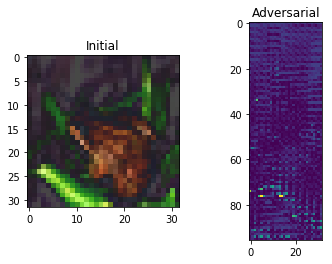

Total distortion: 7.249775850185279
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ -45.90004 -216.8533    69.74786  242.46031   97.00306   73.04012
   131.93335 -236.93192   68.02727 -128.97984]] 3
initial_133_1.png
output/cifar/initial_133_1.png output/cifar/adversarial_133_1.png


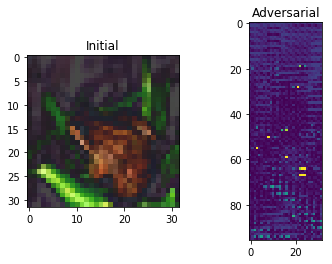

Total distortion: 7.607134792802043
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ 157.73114  -182.98598    67.648315  160.47769   111.97672    -9.848052
   272.4663   -477.99994   149.56694  -258.28745 ]] 6
initial_134_1.png
output/cifar/initial_134_1.png output/cifar/adversarial_134_1.png


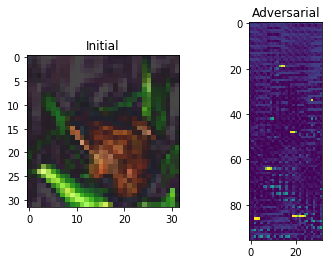

Total distortion: 7.869291870754264
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ 181.41975   -88.37342   -15.751381  105.31411    69.48805  -216.95113
    18.2655   -402.77365   379.21317    62.49684 ]] 8
initial_135_1.png
output/cifar/initial_135_1.png output/cifar/adversarial_135_1.png


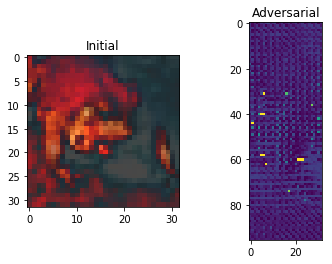

Total distortion: 9.888787410753562
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 418.88818  -277.95206    26.302229  150.7778   -109.96908  -244.20859
   -32.513042 -611.49445   808.97986    23.236994]] 8
initial_136_1.png
output/cifar/initial_136_1.png output/cifar/adversarial_136_1.png


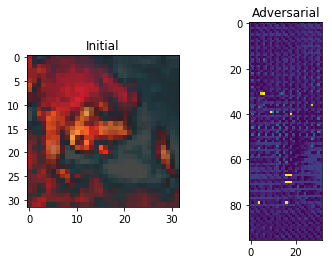

Total distortion: 10.031387280627031
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 432.42474   -202.9172     162.07748    257.3792    -225.0555
    -4.3912807  -23.480402  -460.86353    381.70358   -221.10149  ]] 0
initial_137_1.png
output/cifar/initial_137_1.png output/cifar/adversarial_137_1.png


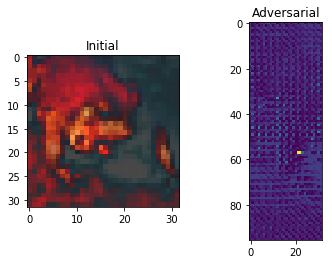

Total distortion: 9.398008874265933
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 416.08896    -148.76682     122.62265      94.12022    -234.96289
  -194.4876      -68.599144   -363.29916     470.77917      -0.65997154]] 8
initial_138_1.png
output/cifar/initial_138_1.png output/cifar/adversarial_138_1.png


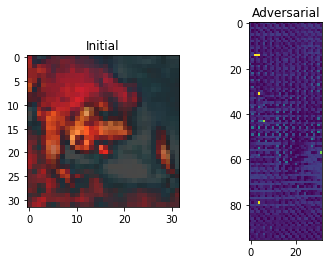

Total distortion: 9.557805124292152
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 282.19083   -417.94196     81.70546    278.80634    -92.06534
    64.30099   -117.05301   -228.77557    263.278        2.5248764]] 0
initial_139_1.png
output/cifar/initial_139_1.png output/cifar/adversarial_139_1.png


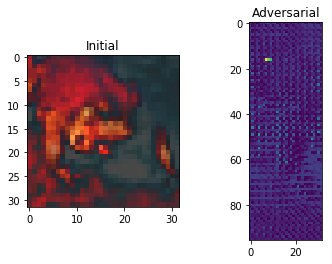

Total distortion: 8.678697696150724
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 230.79922  -104.750046  -17.362213  199.95107  -160.72884   -29.41699
   -38.768246 -268.36978   277.53568   -27.161205]] 8
initial_140_1.png
output/cifar/initial_140_1.png output/cifar/adversarial_140_1.png


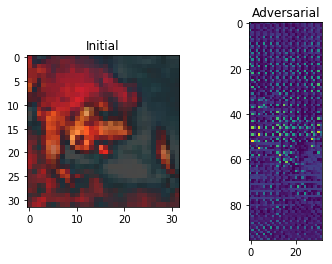

Total distortion: 2.485507443079435
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 417.2883     54.983345 -228.35007    63.111156 -158.70819  -121.362625
  -276.385    -169.38515   337.5181    311.63135 ]] 0
initial_141_1.png
output/cifar/initial_141_1.png output/cifar/adversarial_141_1.png


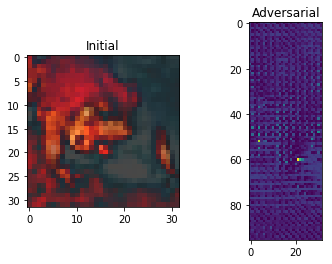

Total distortion: 9.366314743146088
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 311.066     -196.96336     85.565994   143.88486   -182.61998
   -94.89928    -55.809696  -264.67938    350.35458      1.8926532]] 8
initial_142_1.png
output/cifar/initial_142_1.png output/cifar/adversarial_142_1.png


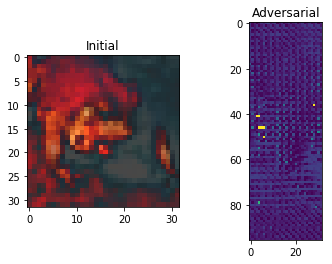

Total distortion: 9.726300118825495
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 282.59976   -425.00452     65.28339    284.25754    -28.581833
    -4.1738734  138.88896   -509.09802    490.54788   -217.42987  ]] 8
initial_143_1.png
output/cifar/initial_143_1.png output/cifar/adversarial_143_1.png


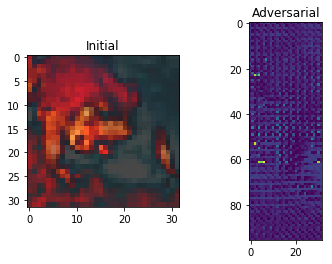

Total distortion: 9.274088244596053
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 362.48654   -108.21545     15.691361   100.49895    -98.093216
   -43.384975    71.91144   -380.97327    181.00897     12.2446575]] 0
initial_144_1.png
output/cifar/initial_144_1.png output/cifar/adversarial_144_1.png


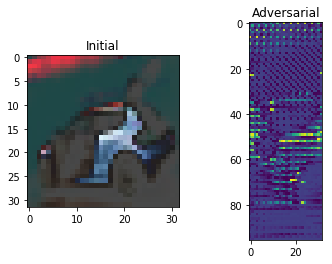

Total distortion: 4.854881441375727
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 698.54236  -279.20312   370.77054   -60.164127  -42.257713 -273.38556
  -240.25436  -433.37238   538.35345   -50.886517]] 0
initial_145_1.png
output/cifar/initial_145_1.png output/cifar/adversarial_145_1.png


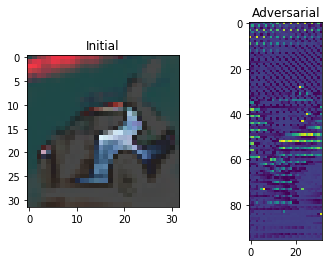

Total distortion: 3.6290702331087417
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 485.30685   -301.20316    177.66194     -2.4589887   -8.849161
  -113.21487   -122.225266  -408.5714     575.58545   -135.99103  ]] 8
initial_146_1.png
output/cifar/initial_146_1.png output/cifar/adversarial_146_1.png


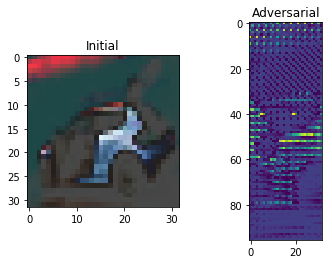

Total distortion: 1.9690297851363316
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 448.74634  -187.27988   171.53986    53.0928   -153.542    -106.014824
  -100.22728  -354.3801    405.64575   -75.97713 ]] 0
initial_147_1.png
output/cifar/initial_147_1.png output/cifar/adversarial_147_1.png


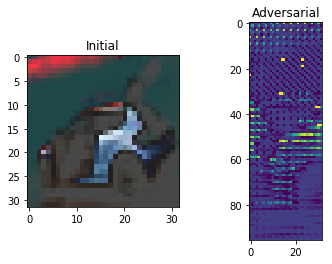

Total distortion: 5.514611169936718
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 262.41605  -193.13295   -27.256838   49.999535  -14.051638 -131.73953
   -74.25728  -298.45285   610.49664  -101.91425 ]] 8
initial_148_1.png
output/cifar/initial_148_1.png output/cifar/adversarial_148_1.png


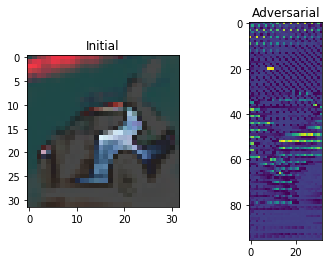

Total distortion: 3.333425679517133
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 570.70404  -257.515     287.73663   -11.973621   62.26017  -171.79144
   -52.66394  -456.98404   386.66568  -198.31168 ]] 0
initial_149_1.png
output/cifar/initial_149_1.png output/cifar/adversarial_149_1.png


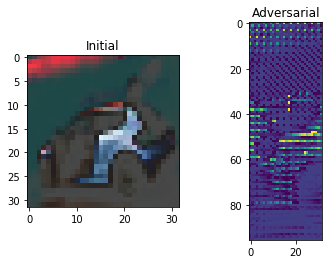

Total distortion: 3.786125885625273
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 608.5924   -104.77529   214.85696   -36.112244  -86.73777  -319.35254
    26.876465 -558.8564    682.6585   -297.456   ]] 8
initial_150_1.png
output/cifar/initial_150_1.png output/cifar/adversarial_150_1.png


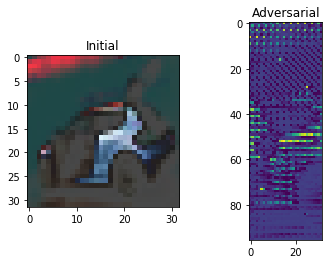

Total distortion: 4.094585304362002
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 376.70914  -270.9007     90.41113   -17.780663  -14.018642  -34.236942
  -129.57794  -307.9389    594.0346   -185.5325  ]] 8
initial_151_1.png
output/cifar/initial_151_1.png output/cifar/adversarial_151_1.png


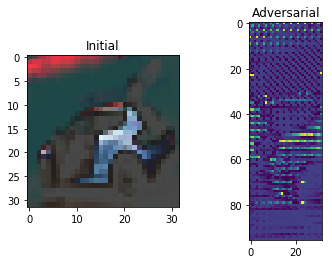

Total distortion: 4.527732588861696
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 421.874    -261.55536   240.2666    -41.127823  -92.55172   -68.62664
  -202.90088  -234.31958   393.39172    -7.298839]] 0
initial_152_1.png
output/cifar/initial_152_1.png output/cifar/adversarial_152_1.png


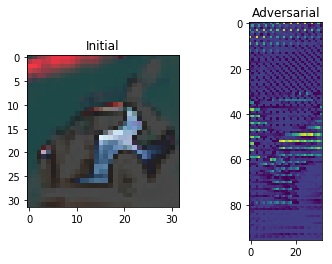

Total distortion: 0.36237924636347696
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 486.65332  -203.76613   253.48026     8.869275 -157.24907  -124.7764
  -126.21423  -352.57996   438.69052  -113.8564  ]] 0
initial_153_1.png
output/cifar/initial_153_1.png output/cifar/adversarial_153_1.png


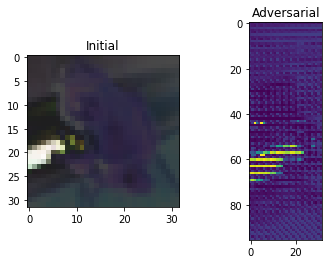

Total distortion: 3.3630327050929645
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 973.5695   -254.07228   -47.443398    9.63       46.350765 -228.53221
  -458.18726  -315.00153   614.6175     64.5075  ]] 0
initial_154_1.png
output/cifar/initial_154_1.png output/cifar/adversarial_154_1.png


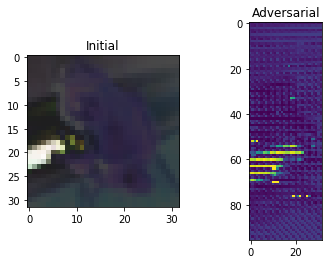

Total distortion: 4.813329055516534
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 523.48663   -260.91074    -52.094368    49.59987     -1.0741228
  -123.0327    -349.38367   -162.1527     624.20123      2.5513046]] 8
initial_155_1.png
output/cifar/initial_155_1.png output/cifar/adversarial_155_1.png


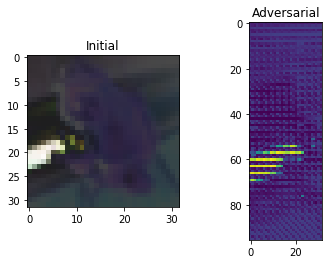

Total distortion: 1.2254761665700553
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 689.05804   -382.76392     -5.0877047  155.95906      1.3413626
  -146.26561   -399.03238   -226.126      589.4252      47.63107  ]] 0
initial_156_1.png
output/cifar/initial_156_1.png output/cifar/adversarial_156_1.png


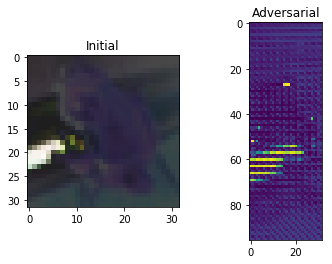

Total distortion: 3.333681724143837
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 661.9735   -435.60956   -51.572083  184.75053    90.02432  -112.62242
  -442.367    -158.87053   556.65063    63.964314]] 0
initial_157_1.png
output/cifar/initial_157_1.png output/cifar/adversarial_157_1.png


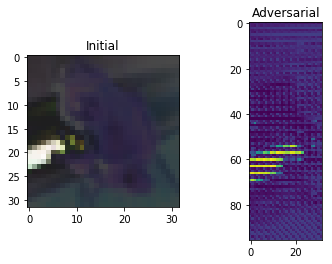

Total distortion: 1.8230781992233351
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 726.2387    -376.16574      1.5633898  140.45293     51.886547
  -107.9325    -416.2331    -209.84549    503.34283     22.224928 ]] 0
initial_158_1.png
output/cifar/initial_158_1.png output/cifar/adversarial_158_1.png


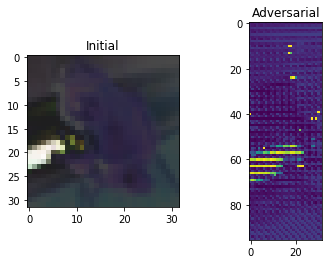

Total distortion: 4.61314522383603
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 641.10876  -451.12933  -121.523796  198.29451   121.84777   -64.50407
  -476.21518    49.04481   356.42828   110.38894 ]] 0
initial_159_1.png
output/cifar/initial_159_1.png output/cifar/adversarial_159_1.png


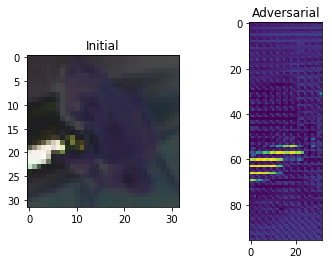

Total distortion: 2.7582236353640117
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 719.3325    -416.20654      1.0118017  122.500465    15.231153
  -184.93243   -430.47388   -172.98773    604.1338      90.935265 ]] 0
initial_160_1.png
output/cifar/initial_160_1.png output/cifar/adversarial_160_1.png


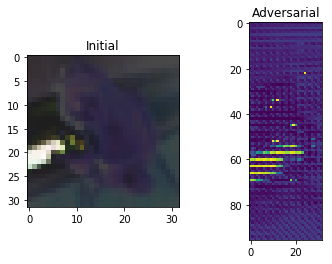

Total distortion: 4.320218021401398
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 578.21564  -402.92242   -32.161835  124.94091   115.626915 -254.90355
  -318.87912  -305.02142   762.1114     27.483065]] 8
initial_161_1.png
output/cifar/initial_161_1.png output/cifar/adversarial_161_1.png


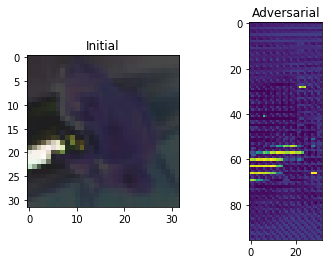

Total distortion: 3.8500160068327838
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 813.3095    -363.64136    -26.497387    80.279564     7.9387794
  -110.63401   -317.87308   -182.92798    400.00836     24.061852 ]] 0
initial_162_1.png
output/cifar/initial_162_1.png output/cifar/adversarial_162_1.png


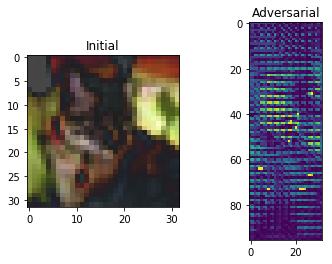

Total distortion: 4.941089339516538
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[  82.55377 -410.84796  125.24935  324.75198  336.3356  -315.35324
   141.88077 -271.18027  231.86517  -98.7404 ]] 4
initial_163_1.png
output/cifar/initial_163_1.png output/cifar/adversarial_163_1.png


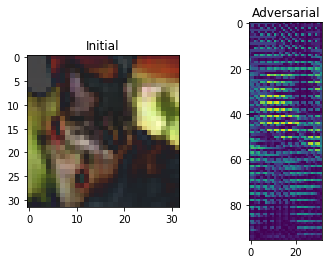

Total distortion: 3.6736582220398293
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 111.84505  -334.31903   216.92873   326.88174   298.52576  -186.79681
   175.05278  -281.8946   -108.70217  -109.304535]] 3
initial_164_1.png
output/cifar/initial_164_1.png output/cifar/adversarial_164_1.png


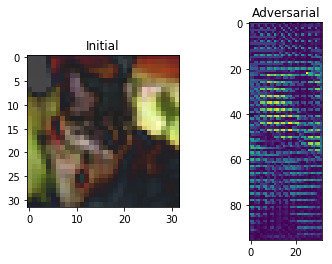

Total distortion: 2.463937438616495
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[  99.74417 -341.44214  201.72964  295.66306  260.62576 -135.69301
   189.80534 -191.0367  -175.4235  -127.12112]] 3
initial_165_1.png
output/cifar/initial_165_1.png output/cifar/adversarial_165_1.png


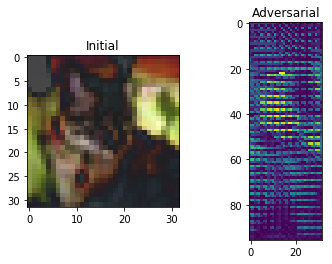

Total distortion: 3.0869472734788137
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[  16.07908 -270.0437   153.47247  294.1851   258.80246 -152.00305
   172.00597 -164.43382 -142.50233  -93.75223]] 3
initial_166_1.png
output/cifar/initial_166_1.png output/cifar/adversarial_166_1.png


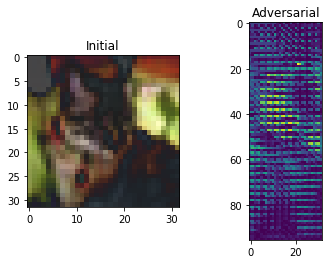

Total distortion: 2.6980850775943854
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ -10.433725 -377.41418   271.642     307.80304   239.71841   -74.95383
   220.45789  -148.77846  -199.00348  -181.60483 ]] 3
initial_167_1.png
output/cifar/initial_167_1.png output/cifar/adversarial_167_1.png


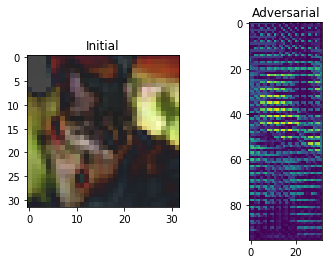

Total distortion: 3.010130308758743
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[  97.69621  -382.72333   196.50327   320.64838   322.63696  -177.23145
   126.91352  -211.08426   -94.301476  -75.99895 ]] 4
initial_168_1.png
output/cifar/initial_168_1.png output/cifar/adversarial_168_1.png


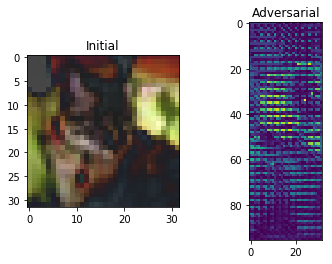

Total distortion: 3.039461320533386
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 105.94092  -317.91174   212.77657   209.90637   178.60574   -78.202354
   223.0051   -138.94354  -193.04784  -144.63934 ]] 6
initial_169_1.png
output/cifar/initial_169_1.png output/cifar/adversarial_169_1.png


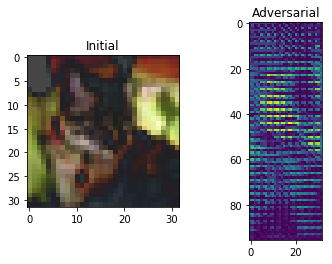

Total distortion: 3.7406833628194227
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[  93.01904  -337.49988   215.5289    282.51343   285.46603  -125.6484
    78.61641  -165.08185  -105.41335  -123.563644]] 4
initial_170_1.png
output/cifar/initial_170_1.png output/cifar/adversarial_170_1.png


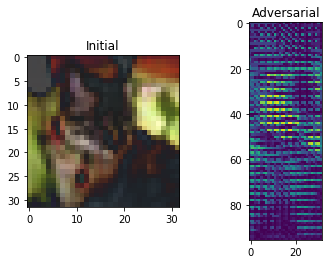

Total distortion: 3.5850839700268606
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[  87.442085 -358.10333   242.05246   292.56558   275.26776  -142.58627
   123.42113  -177.11787  -144.63748   -95.48957 ]] 3
initial_171_1.png
output/cifar/initial_171_1.png output/cifar/adversarial_171_1.png


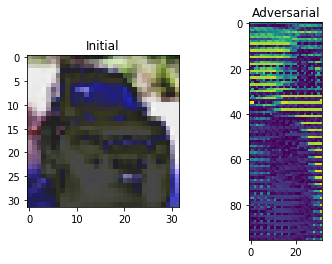

Total distortion: 3.4778832145067144
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[ 220.66737   177.83893   -30.069342  -22.525116  -24.947828 -277.40613
  -226.00388   -80.337975  210.99753   326.8614  ]] 9
initial_172_1.png
output/cifar/initial_172_1.png output/cifar/adversarial_172_1.png


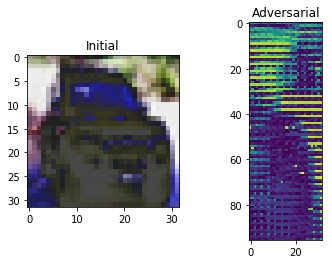

Total distortion: 4.99632166028736
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[  27.992645    30.531023    16.853296   130.26144    -36.619755
  -242.34212      2.1180937  -92.58966     83.310936   340.42978  ]] 9
initial_173_1.png
output/cifar/initial_173_1.png output/cifar/adversarial_173_1.png


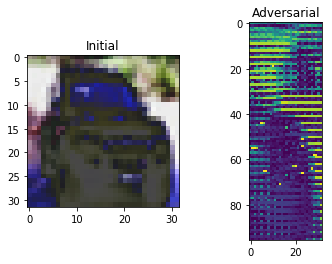

Total distortion: 5.880038758753496
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[ -34.394585   -30.47453    -53.660347    95.33238     -3.6761878
  -237.78088    135.5284    -100.286064    24.609299   479.91498  ]] 9
initial_174_1.png
output/cifar/initial_174_1.png output/cifar/adversarial_174_1.png


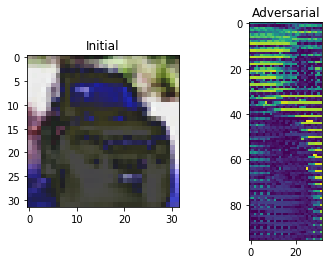

Total distortion: 5.133943151607305
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[-109.43428  -169.66768    58.468056  270.9773     88.159164 -197.9154
   135.26793  -254.3295    108.88441   268.69638 ]] 3
initial_175_1.png
output/cifar/initial_175_1.png output/cifar/adversarial_175_1.png


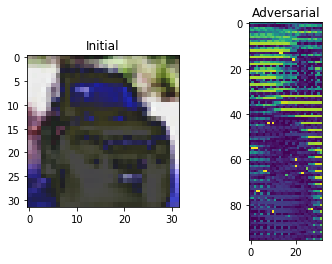

Total distortion: 6.298208847948979
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[   3.4832425  -41.568546    -6.4061823   93.51016    -22.344301
  -187.0189      95.38396     20.482065   -59.731674   354.83685  ]] 9
initial_176_1.png
output/cifar/initial_176_1.png output/cifar/adversarial_176_1.png


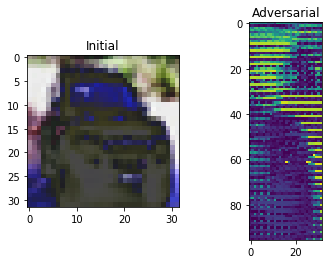

Total distortion: 4.217048584500549
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[ -33.02598    -78.10719     35.09674    144.38446      5.8498597
   -84.40969    240.19775    -93.19288   -113.6453     118.922745 ]] 6
initial_177_1.png
output/cifar/initial_177_1.png output/cifar/adversarial_177_1.png


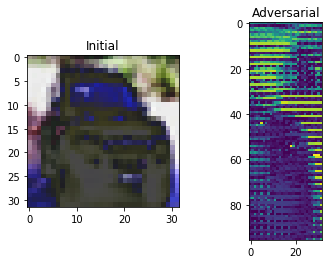

Total distortion: 4.59009016958192
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[ -35.86194   -25.798313   64.25347   125.87133   -60.66705  -126.9812
   173.81116   -30.417612 -133.1278    234.3639  ]] 9
initial_178_1.png
output/cifar/initial_178_1.png output/cifar/adversarial_178_1.png


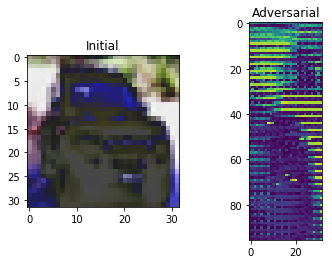

Total distortion: 4.613068526464613
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[ 108.856155  223.1958    -46.418262  -27.363255  -79.90239  -243.95102
  -253.9404     97.34474    90.18688   452.99304 ]] 9
initial_179_1.png
output/cifar/initial_179_1.png output/cifar/adversarial_179_1.png


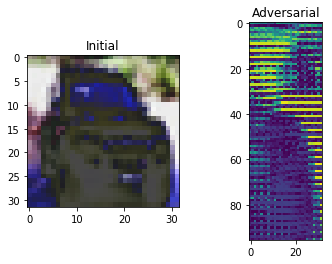

Total distortion: 0.69726774071124
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[  87.36041   166.60898    12.74122    47.767563 -162.28075  -178.05197
   -35.282143  -41.13404    68.54425   241.6876  ]] 9
initial_180_2.png
output/cifar/initial_180_2.png output/cifar/adversarial_180_2.png


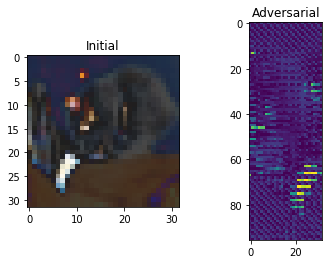

Total distortion: 1.164679600530457
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 356.2399   -458.78458    -7.413947  267.63797   172.43372    56.983295
  -151.732    -230.90034   213.8768   -110.31572 ]] 0
initial_181_2.png
output/cifar/initial_181_2.png output/cifar/adversarial_181_2.png


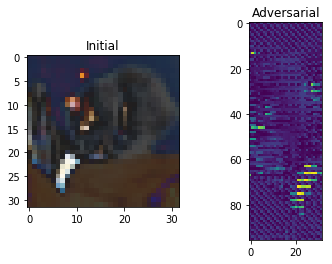

Total distortion: 1.0738440952660704
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 255.51962  -335.31485   -68.35322   266.56906    58.143887   45.72736
  -109.205826 -259.5201    251.4803    -30.466566]] 3
initial_182_2.png
output/cifar/initial_182_2.png output/cifar/adversarial_182_2.png


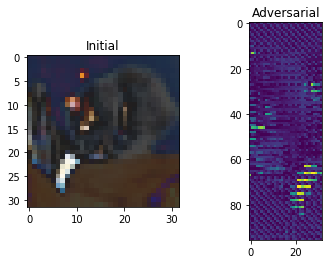

Total distortion: 1.429082356775245
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 317.50967  -464.65384    44.655663  234.93974   273.66876    27.539463
  -170.69638  -178.53604   173.92311  -140.67012 ]] 0
initial_183_2.png
output/cifar/initial_183_2.png output/cifar/adversarial_183_2.png


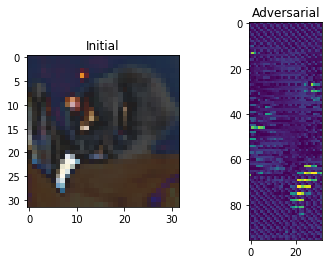

Total distortion: 1.379628886341878
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 327.87875  -498.7991     52.210045  261.4659    388.71185    58.480762
  -194.8053   -167.29993   123.34623  -219.1773  ]] 4
initial_184_2.png
output/cifar/initial_184_2.png output/cifar/adversarial_184_2.png


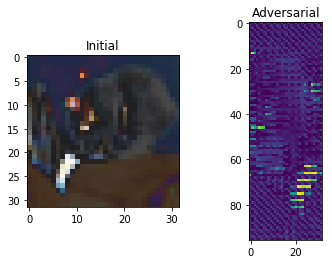

Total distortion: 0.9047017849072756
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 208.51366  -442.93365   -31.496279  305.24286    90.024445  145.76242
   -79.780426 -164.8798    108.06338   -76.8496  ]] 3
initial_185_2.png
output/cifar/initial_185_2.png output/cifar/adversarial_185_2.png


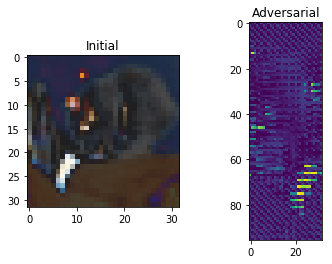

Total distortion: 0.989627147842318
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 257.6396   -425.1233     -2.208022  261.0415    218.99072    43.64883
  -112.40359  -217.30078   194.04321  -131.54778 ]] 3
initial_186_2.png
output/cifar/initial_186_2.png output/cifar/adversarial_186_2.png


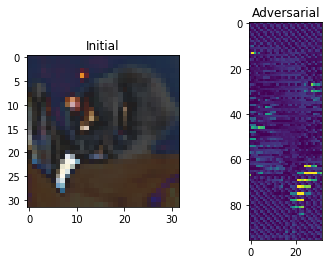

Total distortion: 1.9127249267554178
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 249.08015  -484.3941     50.333813  218.89282   329.32956    67.43212
  -181.25354   -50.379074   86.557686 -164.14665 ]] 4
initial_187_2.png
output/cifar/initial_187_2.png output/cifar/adversarial_187_2.png


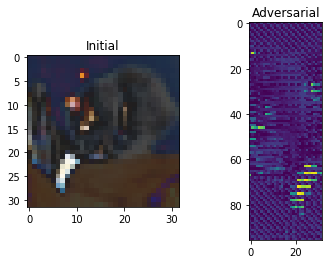

Total distortion: 0.6432209915279979
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 268.6131   -356.98035   -58.875435  284.34857    69.60128    55.824966
  -115.535286 -264.63486   241.06123   -49.824787]] 3
initial_188_2.png
output/cifar/initial_188_2.png output/cifar/adversarial_188_2.png


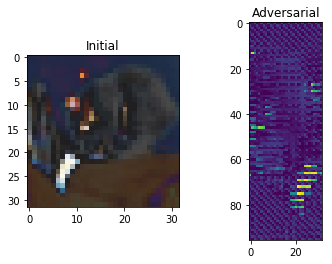

Total distortion: 0.7873471187361265
[[ 227.1769   -363.92422   -59.851044  304.53705    70.34309   100.277885
  -120.256165 -222.48334   189.98642   -60.404827]] 3
[[ 241.83003  -364.98782   -56.405003  275.65564    62.05768    66.30004
  -107.02813  -232.65298   210.97888   -23.168299]] 3
initial_189_2.png
output/cifar/initial_189_2.png output/cifar/adversarial_189_2.png


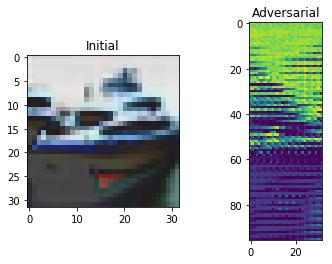

Total distortion: 1.9710476501371874
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 2238.3247   1126.1587   -505.2729   -453.1486   -175.50815 -1340.6531
  -1749.4674   -446.95496  1329.3141   1121.1526 ]] 0
initial_190_2.png
output/cifar/initial_190_2.png output/cifar/adversarial_190_2.png


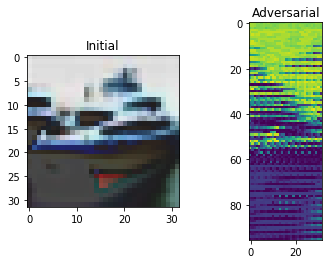

Total distortion: 1.1086254005134626
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1836.7394   1160.1211   -486.1563   -299.59918  -397.04794 -1167.3562
  -1328.7743   -801.77014  1515.4819    832.68066]] 0
initial_191_2.png
output/cifar/initial_191_2.png output/cifar/adversarial_191_2.png


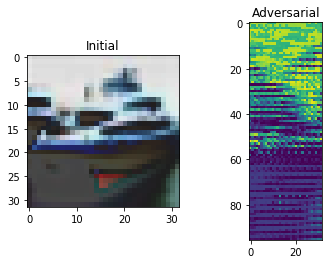

Total distortion: 5.7923958225620575
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[  912.8261    711.00476  -233.89322  -219.21214  -202.4364   -592.1228
  -1049.4504    200.17958   557.37134   598.55695]] 0
initial_192_2.png
output/cifar/initial_192_2.png output/cifar/adversarial_192_2.png


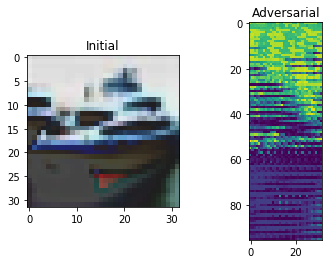

Total distortion: 5.104169614622342
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1077.9584    736.7668   -560.5058     54.06148  -213.83707  -632.3643
  -1129.3602   -147.77982   791.2897    710.4488 ]] 0
initial_193_2.png
output/cifar/initial_193_2.png output/cifar/adversarial_193_2.png


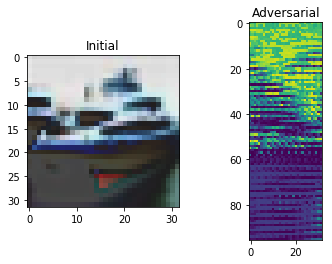

Total distortion: 5.658202113716686
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1050.2554     769.83746   -411.26224   -236.74358     31.6612
   -612.3293   -1199.0396     108.014145   593.0985     642.98157 ]] 0
initial_194_2.png
output/cifar/initial_194_2.png output/cifar/adversarial_194_2.png


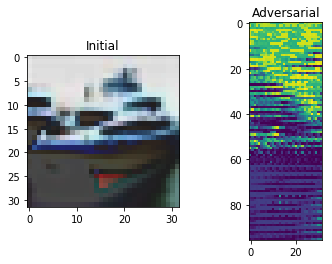

Total distortion: 6.179564656846349
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 788.72156  674.05023 -266.1936  -191.67755 -169.93214 -363.1779
  -977.21716  257.9994   351.52515  458.53186]] 0
initial_195_2.png
output/cifar/initial_195_2.png output/cifar/adversarial_195_2.png


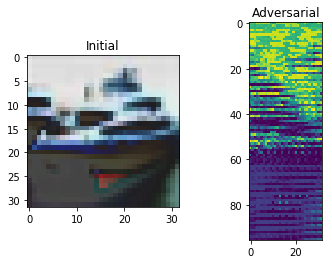

Total distortion: 6.044504731164363
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 596.3115   486.47485 -294.92175  -70.06379 -372.31    -470.0824
  -402.44345 -120.8406   590.3921   459.67407]] 0
initial_196_2.png
output/cifar/initial_196_2.png output/cifar/adversarial_196_2.png


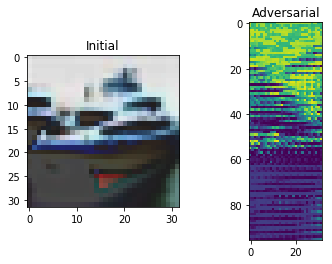

Total distortion: 5.306100918278511
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1122.7305    824.41785  -464.86935  -232.54022  -173.89946  -689.375
  -1424.9994    364.4762    707.24347   866.6477 ]] 0
initial_197_2.png
output/cifar/initial_197_2.png output/cifar/adversarial_197_2.png


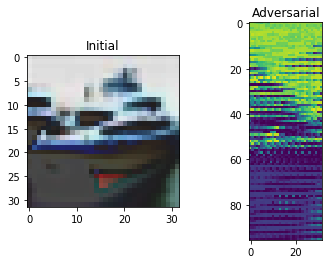

Total distortion: 2.248136596480095
[[ 2029.7561    954.5376   -469.5771   -252.18501  -326.6373  -1265.4199
  -1489.4008   -935.94794  1888.7853    781.3529 ]] 0
[[ 1925.9606    864.2175   -588.9871   -274.55563  -226.513   -1223.3213
  -1645.8085   -444.30402  1465.1393   1230.6233 ]] 0
initial_198_2.png
output/cifar/initial_198_2.png output/cifar/adversarial_198_2.png


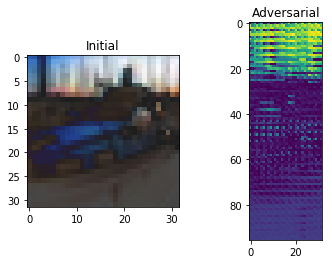

Total distortion: 0.5991664082770217
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 556.4466       8.666274  -216.7619     -15.9343405    9.48634
  -166.25285   -601.6604     358.03082    188.29988    286.95636  ]] 0
initial_199_2.png
output/cifar/initial_199_2.png output/cifar/adversarial_199_2.png


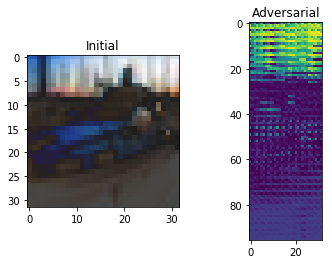

Total distortion: 0.33950459887854717
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 540.1272     76.432335 -231.63405   -25.908226  -33.882587 -177.8441
  -579.1799    289.27774   232.41226   294.64252 ]] 0
initial_200_2.png
output/cifar/initial_200_2.png output/cifar/adversarial_200_2.png


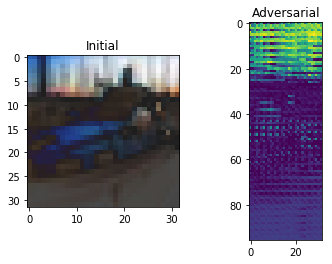

Total distortion: 1.6502490462572161
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 366.0705     -32.98787   -128.98401    -10.998624     4.5536237
  -100.99702   -472.3666     318.77338    144.74197    201.34387  ]] 0
initial_201_2.png
output/cifar/initial_201_2.png output/cifar/adversarial_201_2.png


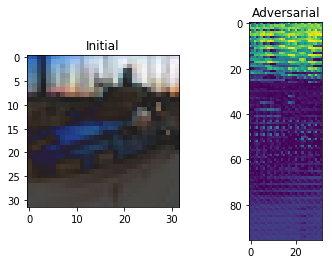

Total distortion: 1.7965707272526847
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 382.93027  -102.54873  -153.7787     82.17449    47.458572  -50.824898
  -441.25793   363.8382     32.932823  127.90449 ]] 0
initial_202_2.png
output/cifar/initial_202_2.png output/cifar/adversarial_202_2.png


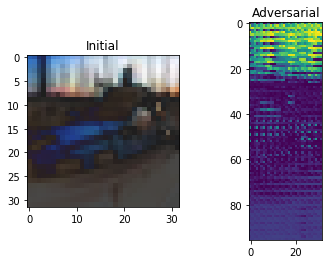

Total distortion: 1.732090863555673
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 520.69543   -30.703985 -213.2181      7.818574   73.83055  -102.79865
  -574.209     379.658     106.34597   203.15813 ]] 0
initial_203_2.png
output/cifar/initial_203_2.png output/cifar/adversarial_203_2.png


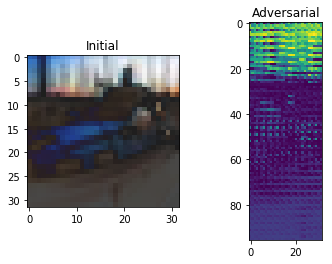

Total distortion: 1.9935729351761429
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 310.3328   -114.45264   -91.1953     55.148357   45.298862  -17.027018
  -414.13904   368.93576    10.10344    99.36132 ]] 7
initial_204_2.png
output/cifar/initial_204_2.png output/cifar/adversarial_204_2.png


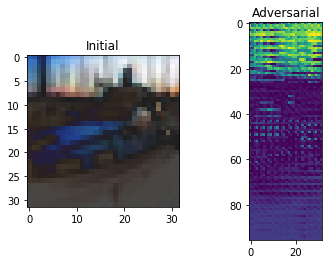

Total distortion: 2.1115125210368424
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 462.28238     9.217582 -222.72523    50.683968  -60.005527 -140.72487
  -296.47946   187.23912    88.102356  190.16808 ]] 0
initial_205_2.png
output/cifar/initial_205_2.png output/cifar/adversarial_205_2.png


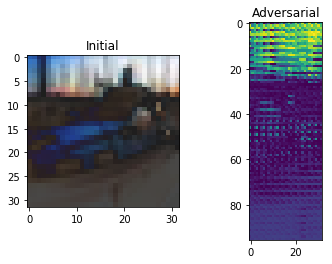

Total distortion: 1.5591330300390942
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 464.3214   -108.56854  -151.59529    34.455948   57.653114  -92.82199
  -592.82263   453.87048   102.0742    195.69131 ]] 0
initial_206_2.png
output/cifar/initial_206_2.png output/cifar/adversarial_206_2.png


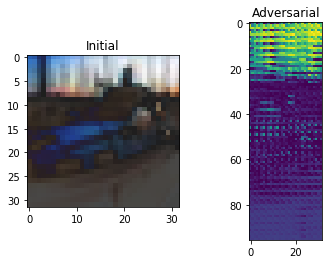

Total distortion: 0.569978119530585
[[ 562.029      95.60529  -238.04054   -28.714865  -45.00972  -191.73651
  -594.79926   269.74332   265.95184   295.8587  ]] 0
[[ 508.58853    -20.003614  -210.92801     -3.9141507   16.372618
  -158.8957    -603.81464    380.59073    199.29362    289.1687   ]] 0
initial_207_2.png
output/cifar/initial_207_2.png output/cifar/adversarial_207_2.png


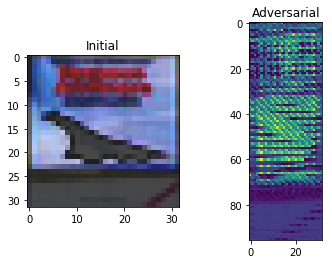

Total distortion: 2.4245382124898014
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 883.6024    848.2764   -597.08167   -21.910368 -359.49576  -586.94696
  -670.87164  -624.02563   992.3476    584.80774 ]] 8
initial_208_2.png
output/cifar/initial_208_2.png output/cifar/adversarial_208_2.png


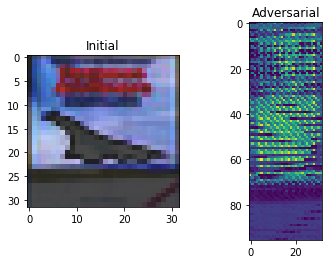

Total distortion: 2.8635966503257464
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 478.27365   196.53485  -263.41345    97.010056  -50.24487  -105.954285
  -510.79453    23.652159  367.2113    -21.8111  ]] 0
initial_209_2.png
output/cifar/initial_209_2.png output/cifar/adversarial_209_2.png


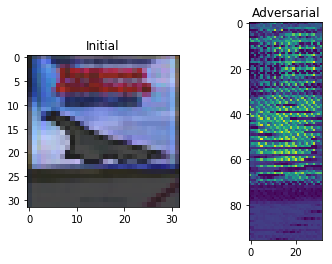

Total distortion: 4.32734755822183
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 491.6548     67.671165 -425.01758   374.63345    93.12356  -143.34264
  -662.2781    -98.499855  486.26498   112.14557 ]] 0
initial_210_2.png
output/cifar/initial_210_2.png output/cifar/adversarial_210_2.png


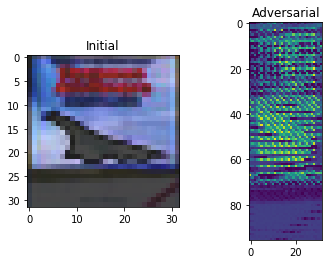

Total distortion: 3.795906351491943
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 656.6465      -3.0663538 -291.7825      99.93935    361.93988
  -278.32062   -715.2534    -149.4649     719.45667    -46.070995 ]] 8
initial_211_2.png
output/cifar/initial_211_2.png output/cifar/adversarial_211_2.png


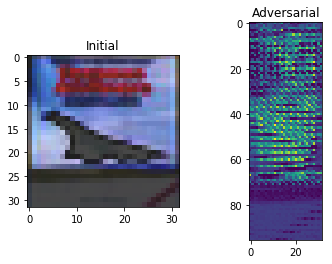

Total distortion: 5.793692730699797
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 173.23187    63.135937 -316.54013   228.19475   -54.18013    81.24793
  -351.42603   105.27833   309.29166   -98.72126 ]] 8
initial_212_2.png
output/cifar/initial_212_2.png output/cifar/adversarial_212_2.png


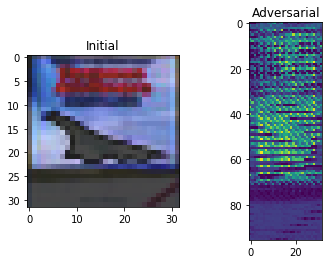

Total distortion: 3.9011370346302714
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 463.2457   184.90977 -365.16852  138.335   -143.55692 -278.0772
  -382.62842 -285.6449   664.3379   253.18524]] 8
initial_213_2.png
output/cifar/initial_213_2.png output/cifar/adversarial_213_2.png


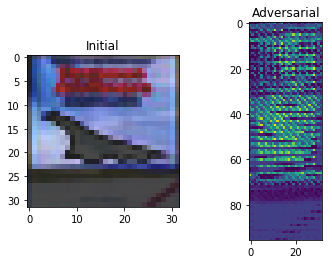

Total distortion: 5.319616241381177
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 422.5544      42.40679   -205.04025     14.5913925   99.99714
  -189.48059   -690.1309     296.289      400.23303    182.32158  ]] 0
initial_214_2.png
output/cifar/initial_214_2.png output/cifar/adversarial_214_2.png


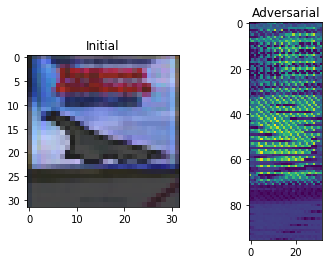

Total distortion: 1.7921311493506211
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[1146.5425    442.47522  -524.3028     17.399504  -19.831171 -694.5838
  -733.4125   -780.59607  1249.5808    391.27042 ]] 8
initial_215_2.png
output/cifar/initial_215_2.png output/cifar/adversarial_215_2.png


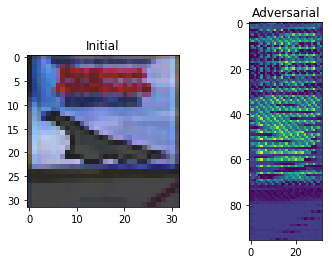

Total distortion: 4.076243701077168
[[1301.2773    540.282    -363.6332   -133.7034     16.111616 -672.03784
  -866.4345   -443.6413    828.7536    340.3815  ]] 0
[[ 992.71344   592.2379   -584.09393   -41.450745 -249.3608   -693.293
  -865.05475  -363.78244   958.67017   920.44977 ]] 0
initial_216_2.png
output/cifar/initial_216_2.png output/cifar/adversarial_216_2.png


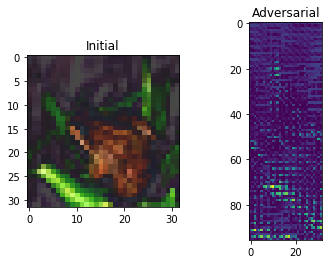

Total distortion: 2.8401580594633065
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ 171.10872  -155.16423   138.43434    98.53346   261.14468   -66.43131
    48.274837 -394.89337   192.52197  -220.36845 ]] 4
initial_217_2.png
output/cifar/initial_217_2.png output/cifar/adversarial_217_2.png


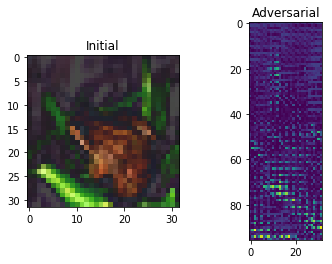

Total distortion: 2.3659640634859676
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[  67.91528   -87.35889   119.880775  148.45047   237.95958   -27.269766
    70.530556 -340.37518    73.579475 -231.79515 ]] 4
initial_218_2.png
output/cifar/initial_218_2.png output/cifar/adversarial_218_2.png


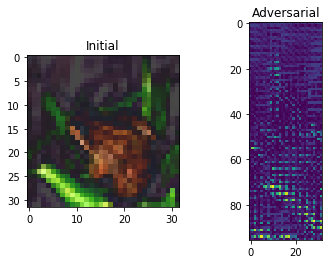

Total distortion: 1.2049367070492498
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[  37.191414 -352.01154   329.3227    207.3096    392.70886   -77.27358
   172.87523  -577.8438    277.40372  -350.3034  ]] 4
initial_219_2.png
output/cifar/initial_219_2.png output/cifar/adversarial_219_2.png


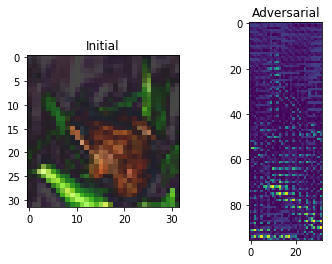

Total distortion: 0.765319023493935
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ -48.593872 -321.31537   161.42679   295.3134    286.01248   -19.70553
   137.00975  -631.6666    447.4876   -285.59747 ]] 8
initial_220_2.png
output/cifar/initial_220_2.png output/cifar/adversarial_220_2.png


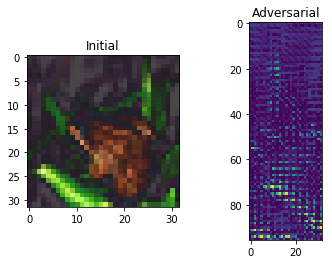

Total distortion: 0.01880718175642595
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
initial_221_2.png
output/cifar/initial_221_2.png output/cifar/adversarial_221_2.png


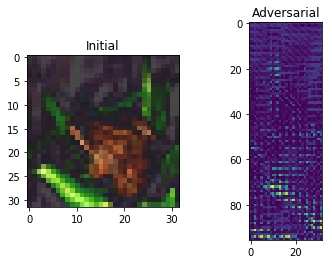

Total distortion: 1.9831858999553567
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[ -18.74063   -237.94572     27.932741   283.99585    185.03868
   153.61993      3.8909247 -370.12662    244.01343   -258.19925  ]] 3
initial_222_2.png
output/cifar/initial_222_2.png output/cifar/adversarial_222_2.png


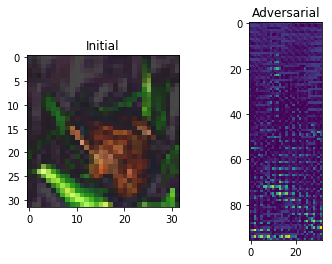

Total distortion: 2.4288983305332357
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[  65.25481    -98.69877     99.15859    104.04431    212.84103
    -2.9638257  -29.636019  -189.03716     89.185936  -201.5652   ]] 4
initial_223_2.png
output/cifar/initial_223_2.png output/cifar/adversarial_223_2.png


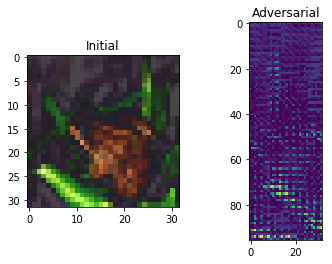

Total distortion: 2.3318235985400464
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[  45.391747 -146.46077    98.56072   215.52792   204.08804   -20.532495
    78.28304  -520.3957    309.30167  -238.44736 ]] 8
initial_224_2.png
output/cifar/initial_224_2.png output/cifar/adversarial_224_2.png


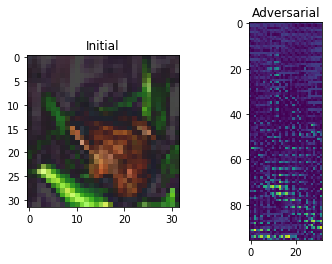

Total distortion: 2.3237074345655215
[[ -15.124247 -347.9478    231.73709   240.35501   378.95694   -35.73072
   157.27362  -591.2573    342.8933   -321.06967 ]] 4
[[  34.845253 -125.65905   169.87444   143.88768   246.47447   -67.09275
    82.629585 -386.27838   158.29095  -208.51001 ]] 4
initial_225_2.png
output/cifar/initial_225_2.png output/cifar/adversarial_225_2.png


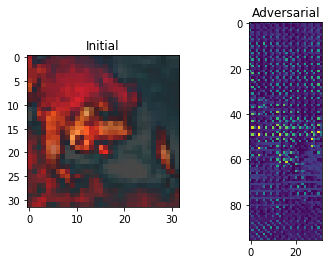

Total distortion: 1.9661809113933322
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 694.8808   200.69539 -331.57654  -89.83391 -176.4746  -349.26648
  -372.55954 -323.59357  586.7988   527.17535]] 0
initial_226_2.png
output/cifar/initial_226_2.png output/cifar/adversarial_226_2.png


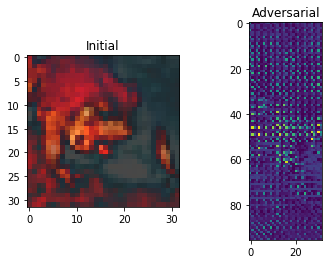

Total distortion: 2.20215211855291
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 601.4591   258.85153 -301.4658   -81.78577 -205.07077 -304.62738
  -334.2443  -299.78293  499.63046  493.95508]] 0
initial_227_2.png
output/cifar/initial_227_2.png output/cifar/adversarial_227_2.png


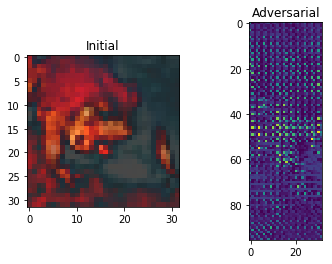

Total distortion: 1.0210397018686654
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 509.6166    127.77654  -297.58948   -20.342695 -185.62727  -235.45395
  -306.10025  -213.20392   479.4121    426.33038 ]] 0
initial_228_2.png
output/cifar/initial_228_2.png output/cifar/adversarial_228_2.png


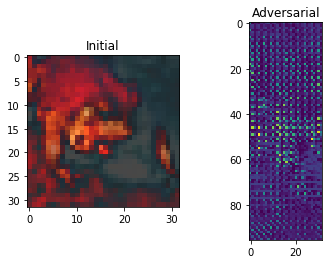

Total distortion: 1.2260532658410999
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 503.81723    93.95331  -309.2264      8.258263 -211.45242  -215.42125
  -282.60193  -217.13577   481.08002   418.83304 ]] 0
initial_229_2.png
output/cifar/initial_229_2.png output/cifar/adversarial_229_2.png


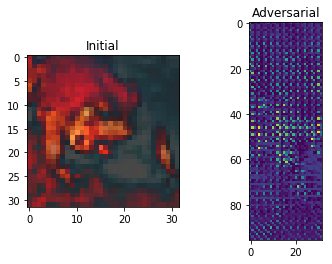

Total distortion: 0.9559462021091482
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 498.2252     63.154877 -274.21436   -13.707965 -133.46207  -209.06895
  -284.47937  -159.55093   397.59692   399.33746 ]] 0
initial_230_2.png
output/cifar/initial_230_2.png output/cifar/adversarial_230_2.png


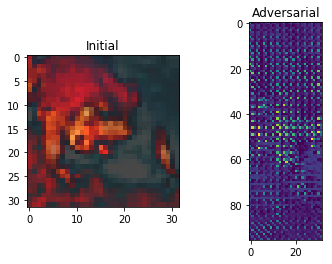

Total distortion: 0.6278307704820908
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 494.08887   122.992485 -322.30246   -13.554082 -208.3259   -210.94637
  -269.54468  -218.52187   461.08423   438.52914 ]] 0
initial_231_2.png
output/cifar/initial_231_2.png output/cifar/adversarial_231_2.png


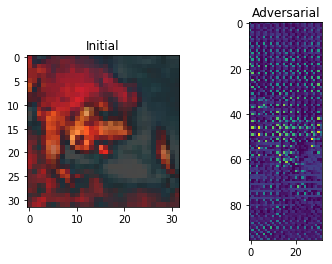

Total distortion: 1.1092079466645497
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 490.90634    93.42045  -293.85498   -20.726925 -139.1011   -228.17635
  -310.52414  -139.77687   445.9768    385.80637 ]] 0
initial_232_2.png
output/cifar/initial_232_2.png output/cifar/adversarial_232_2.png


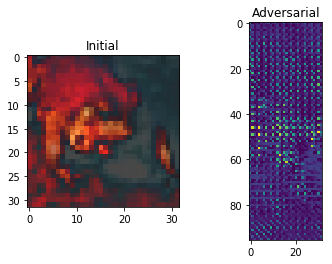

Total distortion: 1.4798142085864037
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 567.9875    131.96288  -303.4844    -43.371956 -235.36308  -263.5733
  -236.92001  -342.11795   576.42804   402.69012 ]] 8
initial_233_2.png
output/cifar/initial_233_2.png output/cifar/adversarial_233_2.png


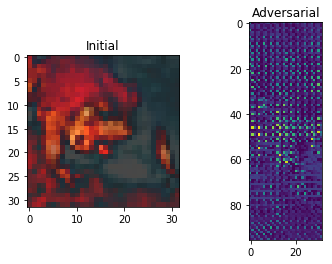

Total distortion: 1.324143714241729
[[ 477.96924   139.42075  -316.9648    -23.339317 -214.9941   -214.7583
  -255.0048   -233.136     465.0361    439.9839  ]] 0
[[ 592.7543    181.51003  -326.04553   -52.775818 -240.8958   -304.14258
  -288.49417  -310.25034   546.35114   512.67535 ]] 0
initial_234_2.png
output/cifar/initial_234_2.png output/cifar/adversarial_234_2.png


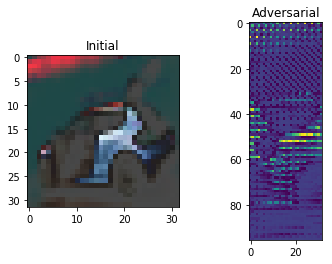

Total distortion: 2.1393442150935638
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 590.7256  -186.90796  280.10822   -8.36028 -128.44232 -154.49724
   -83.67704 -446.99823  484.48755 -221.90694]] 0
initial_235_2.png
output/cifar/initial_235_2.png output/cifar/adversarial_235_2.png


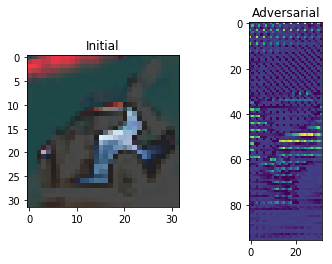

Total distortion: 1.4459585034865046
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 525.9331   -226.52554   284.41904    12.456756 -119.59046  -113.7855
  -103.95655  -360.37906   381.61548  -171.68541 ]] 0
initial_236_2.png
output/cifar/initial_236_2.png output/cifar/adversarial_236_2.png


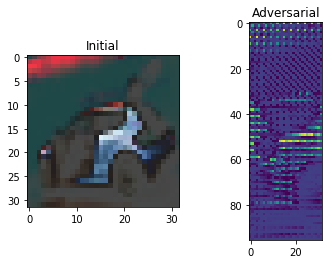

Total distortion: 0.4074659124404753
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 486.86343 -237.58784  245.91554   27.94825 -151.9277  -104.03371
  -149.93497 -338.63263  427.57956  -94.65136]] 0
initial_237_2.png
output/cifar/initial_237_2.png output/cifar/adversarial_237_2.png


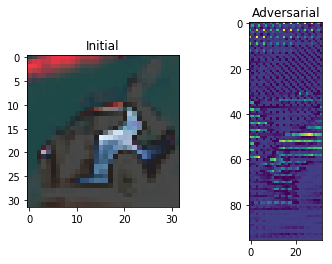

Total distortion: 2.925466686089742
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 416.67343  -300.4838    105.38751    31.224346   47.25917   -58.18025
  -181.53815  -322.2728    487.55814   -94.92689 ]] 8
initial_238_2.png
output/cifar/initial_238_2.png output/cifar/adversarial_238_2.png


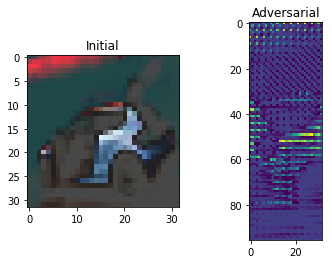

Total distortion: 1.2992767706398214
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 451.27664  -207.63994   187.5157     24.197536 -157.98062   -59.97862
   -81.40462  -339.33716   412.90814  -153.4571  ]] 0
initial_239_2.png
output/cifar/initial_239_2.png output/cifar/adversarial_239_2.png


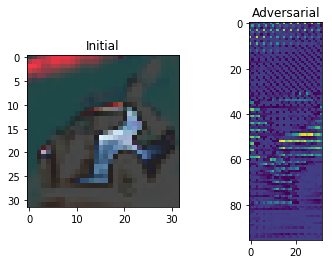

Total distortion: 1.141318019248001
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 450.5743   -205.22113   200.29228    12.751835 -132.59239   -95.63246
   -58.49126  -375.251     463.89545  -180.4651  ]] 8
initial_240_2.png
output/cifar/initial_240_2.png output/cifar/adversarial_240_2.png


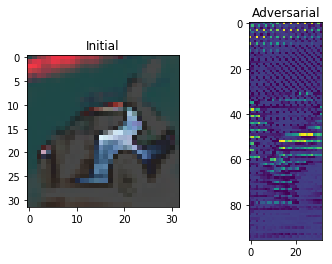

Total distortion: 2.416733335255032
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 506.47934  -249.50598   128.73859    10.156452  -24.015379 -104.99317
  -194.122    -299.77295   442.96478   -78.52671 ]] 0
initial_241_2.png
output/cifar/initial_241_2.png output/cifar/adversarial_241_2.png


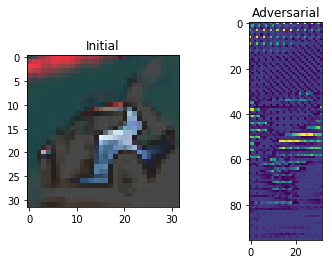

Total distortion: 2.734019752313886
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 388.89816  -203.15091   173.75494    33.97638  -264.98618   -73.70739
   -28.072268 -546.9157    770.7859   -206.62946 ]] 8
initial_242_2.png
output/cifar/initial_242_2.png output/cifar/adversarial_242_2.png


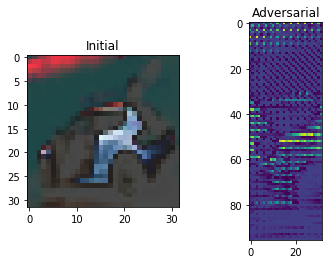

Total distortion: 0.3062340902555574
[[ 492.31552  -209.54283   250.40128    10.612751 -158.47575  -122.9608
  -142.82262  -346.71652   440.4225    -99.269295]] 0
[[ 481.15573  -203.16716   229.66801    11.383921 -172.53401  -120.53225
  -149.23492  -343.59363   456.6955    -77.50023 ]] 0
initial_243_2.png
output/cifar/initial_243_2.png output/cifar/adversarial_243_2.png


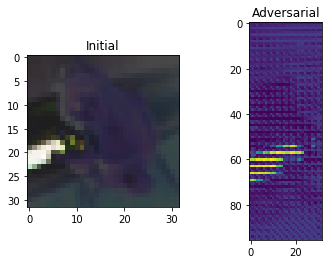

Total distortion: 0.7468503939992572
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 767.5405   -326.1377     -9.047058  109.74312    29.443449 -142.72118
  -430.33838  -228.0728    536.4811     43.677925]] 0
initial_244_2.png
output/cifar/initial_244_2.png output/cifar/adversarial_244_2.png


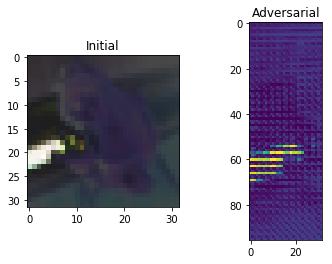

Total distortion: 1.868577128806196
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 767.18427  -281.9653    -62.135857  113.2357     27.945063 -134.52014
  -465.23288  -217.31924   537.3485     81.87005 ]] 0
initial_245_2.png
output/cifar/initial_245_2.png output/cifar/adversarial_245_2.png


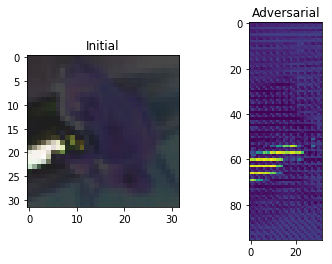

Total distortion: 0.4064455662020359
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 6.9475183e+02 -3.4550284e+02 -2.1898361e-01  1.3707938e+02
   2.2675203e+01 -1.0982986e+02 -3.9154584e+02 -2.2796832e+02
   5.1128122e+02  2.3735542e+01]] 0
initial_246_2.png
output/cifar/initial_246_2.png output/cifar/adversarial_246_2.png


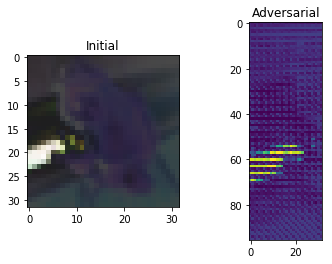

Total distortion: 1.119956366676795
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 674.1359   -354.3132    -31.815435  160.35185    24.826204  -68.551506
  -398.2869   -200.62383   492.0412     13.195597]] 0
initial_247_2.png
output/cifar/initial_247_2.png output/cifar/adversarial_247_2.png


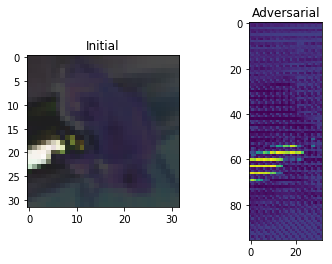

Total distortion: 0.5089132556427226
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 695.3715    -337.19043      7.5205774  132.42313     55.8105
  -109.65333   -400.9722    -212.07565    482.5963       9.247652 ]] 0
initial_248_2.png
output/cifar/initial_248_2.png output/cifar/adversarial_248_2.png


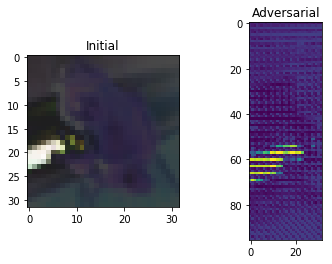

Total distortion: 1.194006611669947
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 645.1      -346.81357   -19.339476  139.72409    45.396244  -48.32423
  -375.30103  -178.4649    439.11093    -8.861427]] 0
initial_249_2.png
output/cifar/initial_249_2.png output/cifar/adversarial_249_2.png


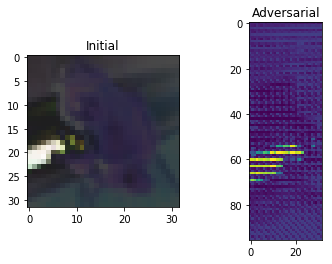

Total distortion: 0.9373615798488052
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 726.6969   -367.6103    -36.882343  122.435585   60.00876  -135.07137
  -466.66772  -199.06197   584.22174    70.435356]] 0
initial_250_2.png
output/cifar/initial_250_2.png output/cifar/adversarial_250_2.png


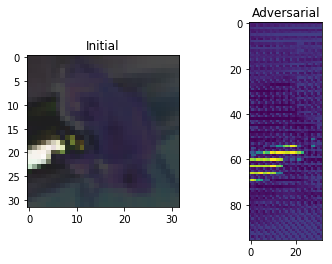

Total distortion: 1.5030355732223866
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 719.7232    -387.17725   -112.04591    180.16063      5.8402467
  -164.7339    -460.0722    -262.97766    742.9613      91.50688  ]] 8
initial_251_2.png
output/cifar/initial_251_2.png output/cifar/adversarial_251_2.png


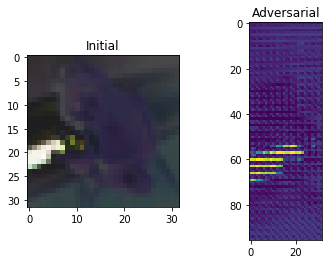

Total distortion: 1.460677832715876
[[ 703.55383  -357.99066   -14.523673  148.89795    -8.052799 -107.313675
  -387.85095  -234.23409   533.2974     40.008537]] 0
[[ 719.9477   -341.1828    -44.72035   142.317      13.476915 -114.02964
  -446.0136   -187.99617   526.8068     81.651024]] 0
initial_252_2.png
output/cifar/initial_252_2.png output/cifar/adversarial_252_2.png


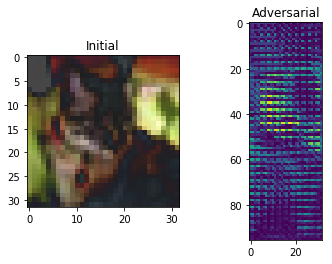

Total distortion: 2.2446554073273792
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 256.1064   -204.30798   179.91269    99.049835  218.46512  -193.52437
   -44.455368 -145.51198    14.257312  -42.640133]] 0
initial_253_2.png
output/cifar/initial_253_2.png output/cifar/adversarial_253_2.png


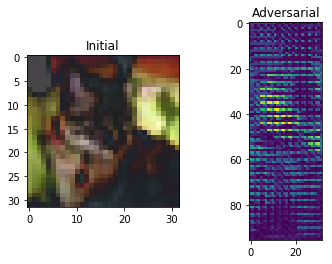

Total distortion: 2.212494749935839
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 217.13159    23.632256  116.52432    36.905525  137.48936  -285.40137
    57.552925 -282.67258   114.305176   31.99552 ]] 0
initial_254_2.png
output/cifar/initial_254_2.png output/cifar/adversarial_254_2.png


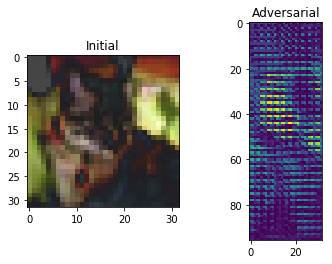

Total distortion: 1.3187495353661753
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[  58.151207 -324.84177   292.36887   177.79987   271.05923  -160.55492
   161.58539  -179.2717   -100.251434 -114.964134]] 2
initial_255_2.png
output/cifar/initial_255_2.png output/cifar/adversarial_255_2.png


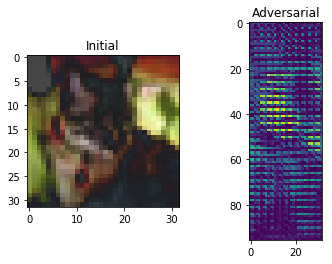

Total distortion: 0.9155246419230967
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 115.04093 -354.6305   207.7347   243.05547  347.8776  -110.59174
   147.8226  -181.42691 -161.32034 -170.01358]] 4
initial_256_2.png
output/cifar/initial_256_2.png output/cifar/adversarial_256_2.png


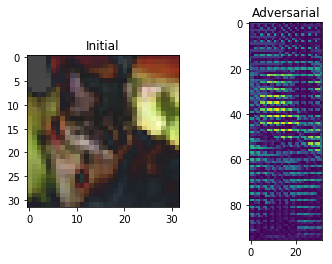

Total distortion: 1.3119567473422944
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 104.51538  -342.04166   110.27644   184.03201   197.9992     70.65685
    27.29274     7.259103 -137.7664   -156.8172  ]] 4
initial_257_2.png
output/cifar/initial_257_2.png output/cifar/adversarial_257_2.png


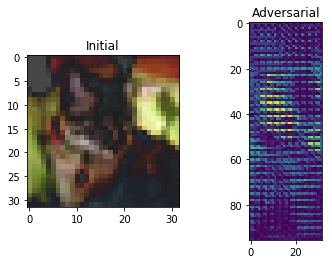

Total distortion: 1.4268853080333732
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[  59.50219  -281.79245   355.2182    184.06946   242.95787  -287.75894
   411.9909   -411.8869    -15.749423 -164.75916 ]] 6
initial_258_2.png
output/cifar/initial_258_2.png output/cifar/adversarial_258_2.png


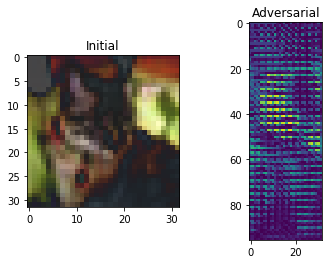

Total distortion: 1.145990840605637
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[  94.96693  -330.58694   130.41266   176.71585   231.87448    19.882273
    20.499268   12.195739 -152.07524  -122.57013 ]] 4
initial_259_2.png
output/cifar/initial_259_2.png output/cifar/adversarial_259_2.png


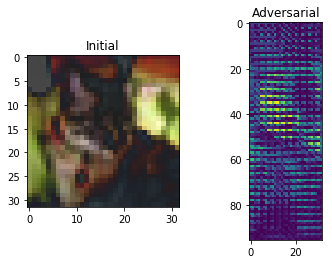

Total distortion: 2.1406270048034637
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 164.7827   -130.7816     97.75529    80.822075  146.23482  -258.98557
    18.870506 -357.85675   346.3501     29.951216]] 8
initial_260_2.png
output/cifar/initial_260_2.png output/cifar/adversarial_260_2.png


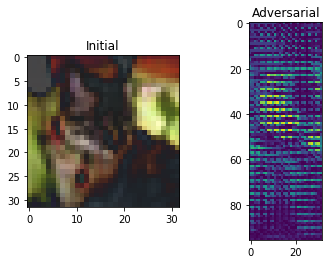

Total distortion: 1.6325410316066027
[[ 128.81151  -322.8093    224.90446   249.32368   300.81897  -149.6337
   113.99144  -208.32747   -98.786896 -152.77481 ]] 4
[[ 272.80194  -122.479095   69.500595   90.15213   178.96835  -278.89185
  -123.19499  -172.64449   104.231415  186.55101 ]] 0
initial_261_2.png
output/cifar/initial_261_2.png output/cifar/adversarial_261_2.png


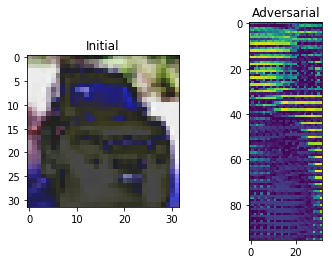

Total distortion: 1.2833119989248416
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[ 103.938354    98.189606    -3.7863092   60.74431    -89.31628
  -173.51       -63.3767     -89.68313    114.72617    246.28484  ]] 9
initial_262_2.png
output/cifar/initial_262_2.png output/cifar/adversarial_262_2.png


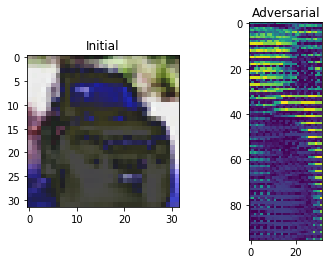

Total distortion: 2.232671341595103
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[   3.9844995   80.706116    61.281326    62.524673  -139.20717
   -98.0111      13.379366    29.666245   -22.066298   154.90709  ]] 9
initial_263_2.png
output/cifar/initial_263_2.png output/cifar/adversarial_263_2.png


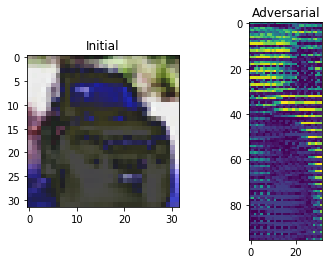

Total distortion: 2.5557226481152755
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[  13.246151    25.386528    62.83187    100.36735   -117.68277
   -96.50683     47.94167     -3.2897594  -27.597448   141.50049  ]] 9
initial_264_2.png
output/cifar/initial_264_2.png output/cifar/adversarial_264_2.png


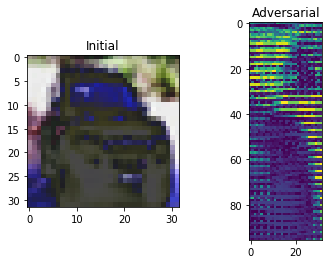

Total distortion: 2.7581760934073176
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[ 11.502964  66.43502   47.525444 112.677414 -84.910225 -89.94364
  -10.869051 -34.376133  -5.859679 129.80063 ]] 9
initial_265_2.png
output/cifar/initial_265_2.png output/cifar/adversarial_265_2.png


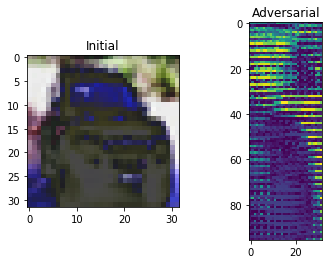

Total distortion: 2.6704298427774757
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[-13.936729 -18.933842  61.316677 115.78682  -78.37522  -72.805176
   85.66361  -16.450912 -50.251003 117.38064 ]] 9
initial_266_2.png
output/cifar/initial_266_2.png output/cifar/adversarial_266_2.png


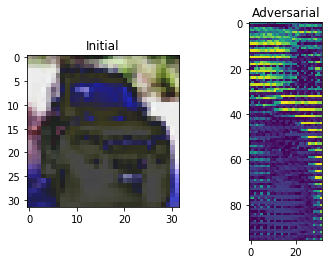

Total distortion: 2.490955682146654
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[  -6.900642   52.16166    86.560005   75.41173  -131.69002  -101.5325
   103.71417    17.29213   -81.755585  129.30688 ]] 9
initial_267_2.png
output/cifar/initial_267_2.png output/cifar/adversarial_267_2.png


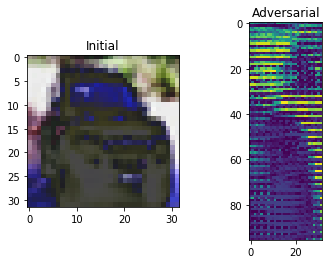

Total distortion: 2.066785809969081
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[  -4.9814677   46.812416    89.69668     66.29802   -124.51859
  -130.48602     17.726837    53.713943   -53.013855   228.53906  ]] 9
initial_268_2.png
output/cifar/initial_268_2.png output/cifar/adversarial_268_2.png


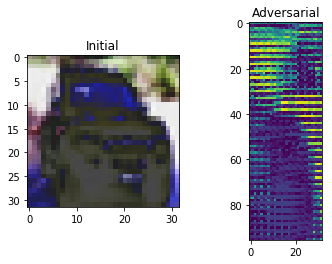

Total distortion: 1.9976034110446905
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[ 100.47103    48.095463  -37.083     123.377144  -59.090244 -124.77498
   -17.354738 -148.39325   117.07797   167.84247 ]] 9
initial_269_2.png
output/cifar/initial_269_2.png output/cifar/adversarial_269_2.png


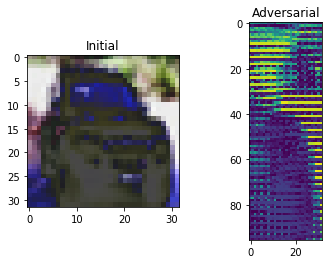

Total distortion: 0.41869060180489975
[[  85.282     160.20654    11.568006   48.249416 -157.04108  -188.41615
   -33.33235   -55.006535   80.15094   262.63647 ]] 9
[[  85.53802   144.62294    15.059656   43.134773 -150.1676   -194.30382
   -37.257713  -43.994507   75.574455  284.84375 ]] 9
270 {'l2': 22, 'l0': 31, 'li': 24} {'l2': 30.586635430231564, 'l0': 165.2279232578882, 'li': 51.42702998276415}
l2 average =  0.11328383492678357 1.3903016104650712
l0 average =  0.6119552713255119 5.3299330083189735
li average =  0.190470481417645 2.142792915948506


In [12]:
with tf.Session() as sess:

    model = CIFARModel("inputs/model/cifar-distilled-100", sess)
        
    # cifar
    test_adversarials(model, 'output/cifar/', [32,32], 3)

    

initial_0_0.png
output/mnist/initial_0_0.png output/mnist/adversarial_0_0.png


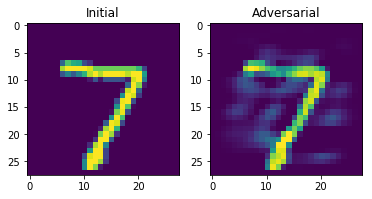

Total distortion: 2.4681750243646046
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[ 218.95198  -127.08427   172.65373  -105.54606  -292.24933  -249.24185
  -538.66943   614.1158     60.559704   97.15312 ]] 7
initial_1_0.png
output/mnist/initial_1_0.png output/mnist/adversarial_1_0.png


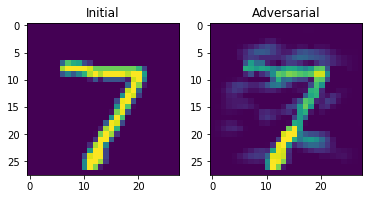

Total distortion: 3.175519080795314
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[-135.39708   171.09009   294.60037    40.839554  -31.863037 -153.27336
  -353.82996   372.11053    74.366806 -205.75455 ]] 7
initial_2_0.png
output/mnist/initial_2_0.png output/mnist/adversarial_2_0.png


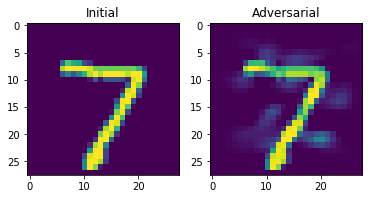

Total distortion: 1.9213766056555643
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[  54.074604 -102.58882   506.0691    -10.883473 -198.07657  -384.30188
  -673.97943   713.32416    85.24759   -42.652603]] 7
initial_3_0.png
output/mnist/initial_3_0.png output/mnist/adversarial_3_0.png


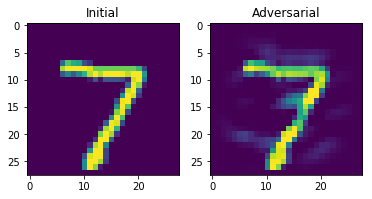

Total distortion: 1.8847126217045276
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[ -474.01575   -73.9915    305.17648   696.1574   -163.06995  -371.77472
  -1103.9039    837.32434    76.71139   240.75961]] 7
initial_4_0.png
output/mnist/initial_4_0.png output/mnist/adversarial_4_0.png


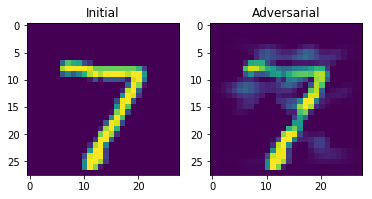

Total distortion: 2.6995292959699113
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[-180.15208  -145.98653   103.52453    -9.954532  105.49871  -238.25711
  -458.7893    361.8402    292.5162    169.65523 ]] 7
initial_5_0.png
output/mnist/initial_5_0.png output/mnist/adversarial_5_0.png


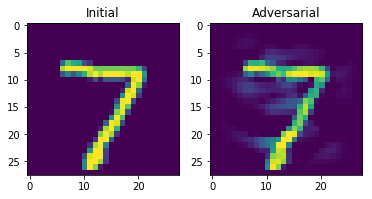

Total distortion: 2.227005549738683
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[-188.53395 -247.66032  -85.52005  136.28801 -400.14505  144.49675
  -768.7693   655.3614   261.50702  385.40616]] 7
initial_6_0.png
output/mnist/initial_6_0.png output/mnist/adversarial_6_0.png


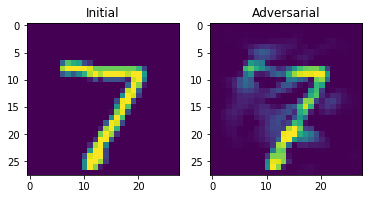

Total distortion: 3.296395217190663
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[ -68.901985    12.015215    95.58314   -117.399574   -74.15607
   -77.50889   -172.74988    189.18866    182.31528     -1.5641915]] 7
initial_7_0.png
output/mnist/initial_7_0.png output/mnist/adversarial_7_0.png


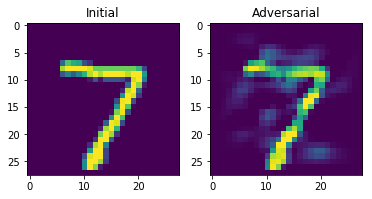

Total distortion: 2.4558163597401443
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[-108.10238 -157.34416  217.70624   50.45354 -160.4757  -242.17902
  -543.8507   449.69092  319.17462  109.41324]] 7
initial_8_0.png
output/mnist/initial_8_0.png output/mnist/adversarial_8_0.png


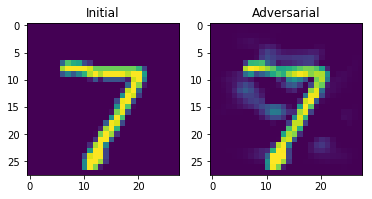

Total distortion: 1.8997642370815755
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[ -345.81778   -287.61075     28.761927   -24.97499    -59.56212
   -391.3496   -1013.9398     860.43164    397.44516    645.66876 ]] 7
initial_9_0.png
output/mnist/initial_9_0.png output/mnist/adversarial_9_0.png


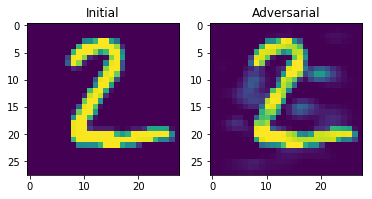

Total distortion: 2.098911357445467
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[ 409.20575  185.72751  484.22357  -97.57978 -305.8035  -215.26474
   395.99686 -614.168    470.34683 -361.32016]] 2
initial_10_0.png
output/mnist/initial_10_0.png output/mnist/adversarial_10_0.png


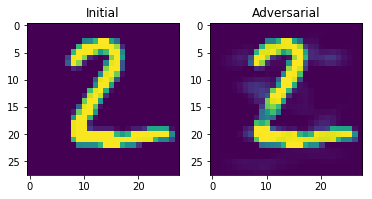

Total distortion: 1.637995620153438
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[ 124.66517  689.1366   438.68903  362.0437  -199.84593 -438.20767
  -157.53    -455.68854   -4.20625  -33.6974 ]] 1
initial_11_0.png
output/mnist/initial_11_0.png output/mnist/adversarial_11_0.png


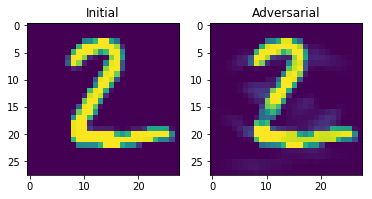

Total distortion: 1.7777167630983923
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[  98.686775  610.9765    314.8079    602.5608   -260.56314  -387.97305
  -292.7256   -469.7332     -9.24378    95.3623  ]] 1
initial_12_0.png
output/mnist/initial_12_0.png output/mnist/adversarial_12_0.png


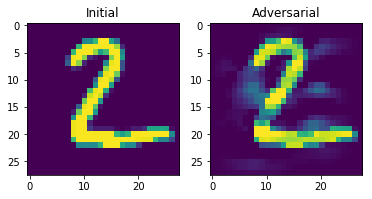

Total distortion: 2.6803656517932835
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[-137.059     441.1911     38.249992  -18.5428    194.15677  -143.44743
   128.49173  -477.1606    181.88858    50.410122]] 1
initial_13_0.png
output/mnist/initial_13_0.png output/mnist/adversarial_13_0.png


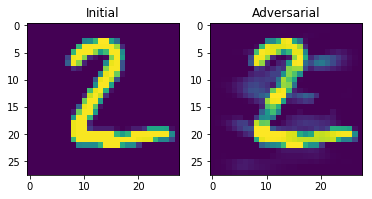

Total distortion: 2.3113379780770633
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[  21.399624  398.91724   193.38847   241.0949   -201.8881     29.777132
    76.500465 -520.1574    216.4052   -124.37055 ]] 1
initial_14_0.png
output/mnist/initial_14_0.png output/mnist/adversarial_14_0.png


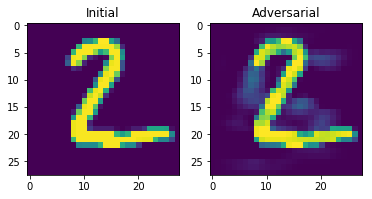

Total distortion: 1.951200101264491
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[ 377.19238  481.3253   643.4276  -359.39413 -190.54216 -453.68378
   619.0334  -713.716    359.07208 -480.93094]] 2
initial_15_0.png
output/mnist/initial_15_0.png output/mnist/adversarial_15_0.png


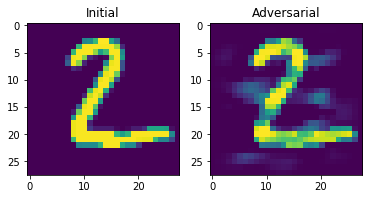

Total distortion: 3.013632951486325
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[-141.86641   289.09842    30.389462  255.67116   -24.276356 -104.50853
  -139.13443  -146.90508   202.38126    16.365284]] 1
initial_16_0.png
output/mnist/initial_16_0.png output/mnist/adversarial_16_0.png


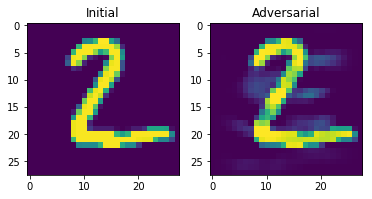

Total distortion: 1.9982345656972105
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[  62.153027  374.80652   339.31866   149.84816  -229.70374  -185.72388
   197.13171  -522.51666   408.37152  -240.67323 ]] 8
initial_17_0.png
output/mnist/initial_17_0.png output/mnist/adversarial_17_0.png


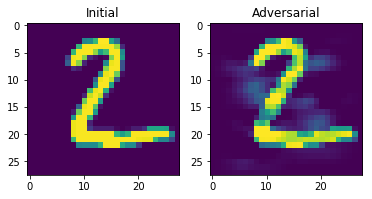

Total distortion: 2.3176305407780946
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[ 113.26102  447.7995   202.7961   247.27333 -139.83763 -278.9749
   -68.73486 -497.7124   157.98831  106.94952]] 1
initial_18_0.png
output/mnist/initial_18_0.png output/mnist/adversarial_18_0.png


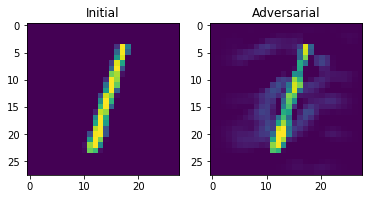

Total distortion: 1.90073140020576
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-309.82382   572.12744   -64.685715  -31.524113  161.61168   -46.309437
     9.259068   74.66119    -8.519361 -193.68568 ]] 1
initial_19_0.png
output/mnist/initial_19_0.png output/mnist/adversarial_19_0.png


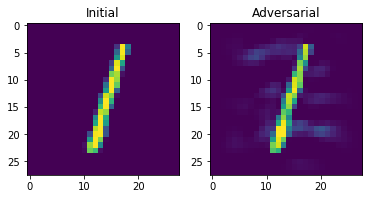

Total distortion: 1.2917983182859245
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-4.8163507e+02  9.5401617e+02  6.1404419e+01 -2.1217374e+02
   3.4702863e+02 -1.9988969e+02 -2.3849532e-01  1.3195851e+02
   2.2624996e+01 -3.9574973e+02]] 1
initial_20_0.png
output/mnist/initial_20_0.png output/mnist/adversarial_20_0.png


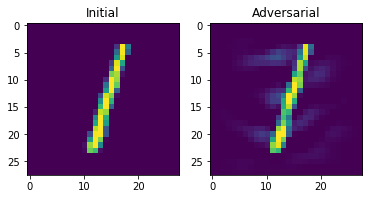

Total distortion: 1.2845816211686967
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-527.5902    750.2649   -137.07866   152.07791   199.35556  -160.81407
  -218.31967   277.4666     62.141914 -173.10316 ]] 1
initial_21_0.png
output/mnist/initial_21_0.png output/mnist/adversarial_21_0.png


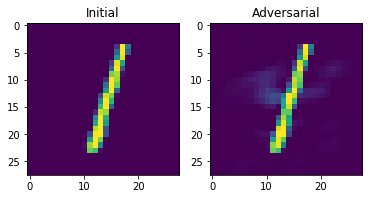

Total distortion: 0.9438442461057769
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-631.9661    999.4919   -168.87848  -403.636     611.22577   -70.11925
    20.233269  108.397026  160.70732  -328.83542 ]] 1
initial_22_0.png
output/mnist/initial_22_0.png output/mnist/adversarial_22_0.png


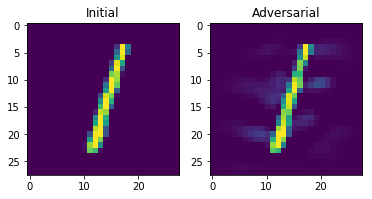

Total distortion: 1.126555532997376
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-504.93335   886.19794  -223.25626  -243.55315   327.5699     61.47755
    84.3334     56.492626  101.29335  -289.06442 ]] 1
initial_23_0.png
output/mnist/initial_23_0.png output/mnist/adversarial_23_0.png


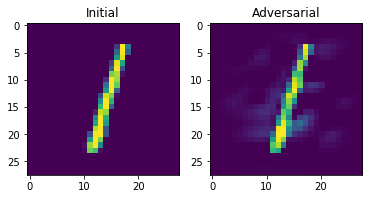

Total distortion: 1.3339618552500694
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-469.77658   891.46124   -66.879814 -245.88174   389.8622    -50.563175
   136.73274    29.57989    10.379921 -370.26602 ]] 1
initial_24_0.png
output/mnist/initial_24_0.png output/mnist/adversarial_24_0.png


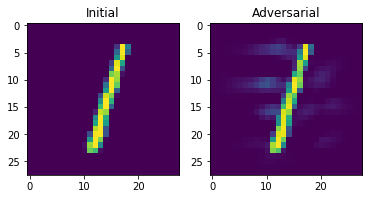

Total distortion: 1.0764330981346806
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-598.4192   1010.4537    -76.659386 -102.36541   301.84836  -231.91907
  -240.78275   526.7393     95.552956 -407.58176 ]] 1
initial_25_0.png
output/mnist/initial_25_0.png output/mnist/adversarial_25_0.png


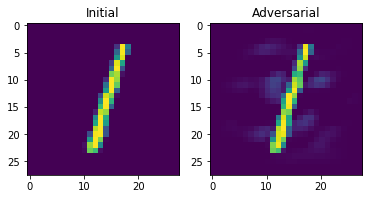

Total distortion: 1.0370381073971426
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-534.08594   955.6311   -177.21083  -311.2566    385.95438   -84.999565
    23.97036   110.06799   196.58653  -304.63406 ]] 1
initial_26_0.png
output/mnist/initial_26_0.png output/mnist/adversarial_26_0.png


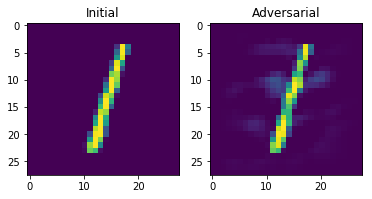

Total distortion: 1.2634816800454793
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-528.2       835.493    -291.5447   -169.23013   383.23853   -48.153904
   -89.70993   234.8824     69.94569  -179.2337  ]] 1
initial_27_0.png
output/mnist/initial_27_0.png output/mnist/adversarial_27_0.png


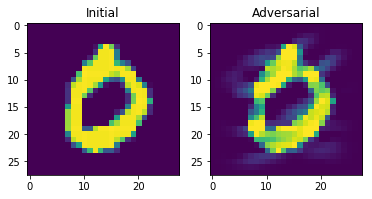

Total distortion: 2.4276852714010397
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 339.8394    283.78864  -115.84344  -111.890114  -44.30571   -30.020582
  -119.64821   225.72018  -214.57677  -160.62764 ]] 0
initial_28_0.png
output/mnist/initial_28_0.png output/mnist/adversarial_28_0.png


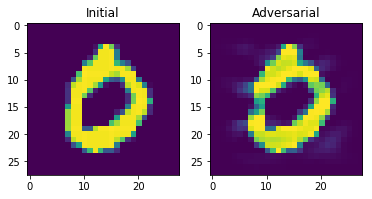

Total distortion: 1.7609414967962906
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 583.01526   -20.377602  180.9804   -174.87679  -150.0277   -112.391754
  -161.83467   127.868256 -207.25461   -59.300594]] 0
initial_29_0.png
output/mnist/initial_29_0.png output/mnist/adversarial_29_0.png


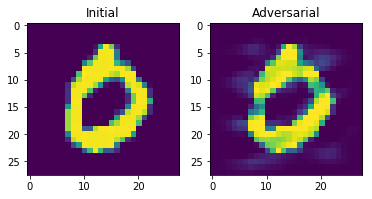

Total distortion: 2.164187210841367
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 338.4399      -2.4668298  -27.921593     6.4328475  -42.30843
   -28.10272   -154.53589     45.179775  -185.83391     32.108913 ]] 0
initial_30_0.png
output/mnist/initial_30_0.png output/mnist/adversarial_30_0.png


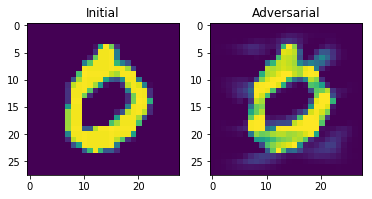

Total distortion: 2.2599806357710364
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 522.89935   114.842804 -186.16142  -224.69649   172.13997  -261.00183
    37.047413  146.3016   -273.57867   -57.20604 ]] 0
initial_31_0.png
output/mnist/initial_31_0.png output/mnist/adversarial_31_0.png


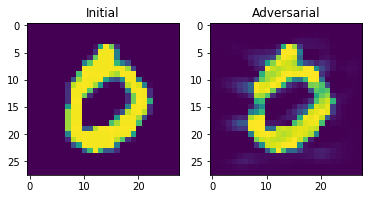

Total distortion: 2.0495327300682695
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 460.4562    -16.385958  -21.168568  -53.104416 -213.00304   120.57667
  -155.084      58.918808 -156.15717   -17.777945]] 0
initial_32_0.png
output/mnist/initial_32_0.png output/mnist/adversarial_32_0.png


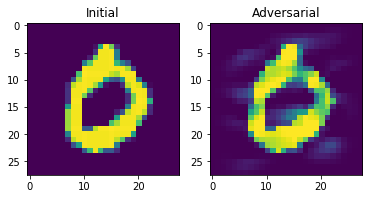

Total distortion: 2.4969553527506996
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 634.7182     81.916016 -114.12353  -257.3295     66.5934   -148.58878
   379.59256  -181.8813   -296.30817  -106.5054  ]] 0
initial_33_0.png
output/mnist/initial_33_0.png output/mnist/adversarial_33_0.png


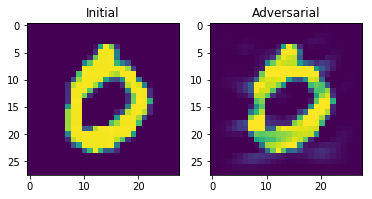

Total distortion: 1.9570081027978663
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 538.2538     50.407032  -36.27843  -248.3795   -128.89107  -120.43288
  -148.9708    349.05704  -168.67085   -86.658295]] 0
initial_34_0.png
output/mnist/initial_34_0.png output/mnist/adversarial_34_0.png


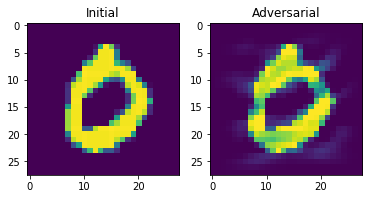

Total distortion: 2.3454324405709217
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 323.79694    51.178646  -35.87981  -128.19312   -63.975105  -84.41749
  -123.50696   186.65543   -46.028095  -76.10349 ]] 0
initial_35_0.png
output/mnist/initial_35_0.png output/mnist/adversarial_35_0.png


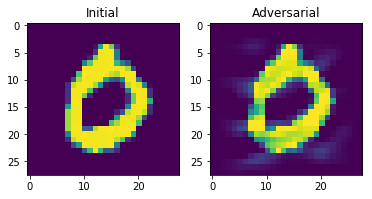

Total distortion: 1.8320651508765387
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 555.0292     -9.730532 -144.54175  -159.77582    44.826664 -203.32094
   -61.829674  107.92094  -291.07837   135.534   ]] 0
initial_36_0.png
output/mnist/initial_36_0.png output/mnist/adversarial_36_0.png


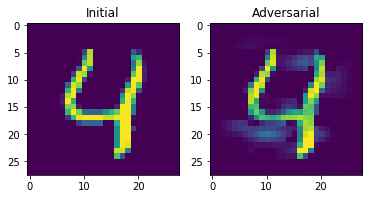

Total distortion: 1.9704233959672222
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[ 280.55786   -118.31861   -254.50967   -392.58133    758.68427
  -593.781     -130.92368     -1.7667385   82.29612    428.4783   ]] 4
initial_37_0.png
output/mnist/initial_37_0.png output/mnist/adversarial_37_0.png


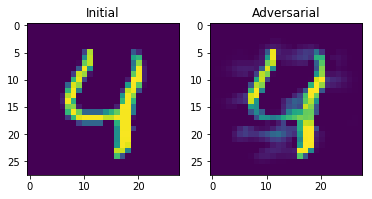

Total distortion: 2.36008084077902
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[ 211.38852   143.91411  -243.51808  -327.4813    701.70447  -644.4802
  -144.98326   212.80458   -43.538284  252.96588 ]] 4
initial_38_0.png
output/mnist/initial_38_0.png output/mnist/adversarial_38_0.png


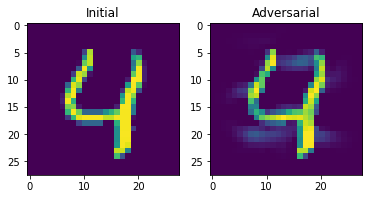

Total distortion: 1.8592826756228042
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[ -81.65872  -127.566605  -18.335758 -286.57855   773.2956   -669.4818
  -403.51086   169.72359   220.40533   495.75632 ]] 4
initial_39_0.png
output/mnist/initial_39_0.png output/mnist/adversarial_39_0.png


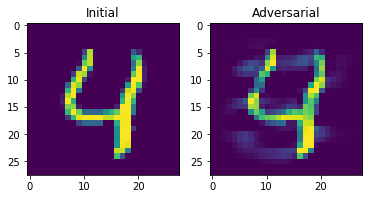

Total distortion: 2.2134710562420485
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[-236.15462  -281.64313     5.253237   45.34631   587.83264  -460.268
  -525.8737     78.64342   343.249     486.5778  ]] 4
initial_40_0.png
output/mnist/initial_40_0.png output/mnist/adversarial_40_0.png


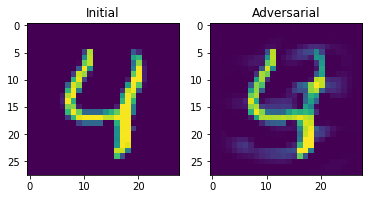

Total distortion: 2.1730622264450785
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[-367.622    -181.08754  -518.9709   -361.1665    948.26544    -9.866869
   -85.69054  -253.76233   359.85422   566.6833  ]] 4
initial_41_0.png
output/mnist/initial_41_0.png output/mnist/adversarial_41_0.png


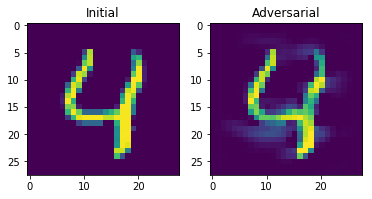

Total distortion: 1.9175387209249095
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[ -16.54965  -93.82833 -347.80032 -537.193   1052.2518  -370.9358
   122.30173 -275.2876   279.75916  355.50732]] 4
initial_42_0.png
output/mnist/initial_42_0.png output/mnist/adversarial_42_0.png


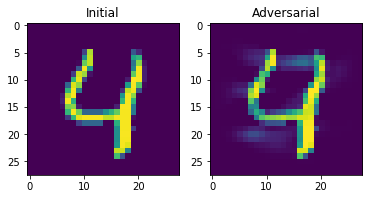

Total distortion: 1.7616487814802277
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[-126.20483   -103.25302   -162.85078   -327.6733     911.321
  -600.6223    -496.0021     418.65427     -2.6655855  568.96545  ]] 4
initial_43_0.png
output/mnist/initial_43_0.png output/mnist/adversarial_43_0.png


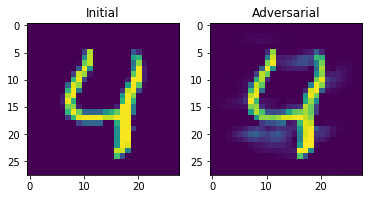

Total distortion: 1.5797935955819429
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[  -2.690328 -197.4347   -255.72565  -396.94772   909.40137  -605.3582
  -259.8132    -62.35095   332.36652   626.37756 ]] 4
initial_44_0.png
output/mnist/initial_44_0.png output/mnist/adversarial_44_0.png


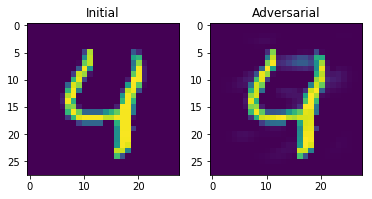

Total distortion: 0.9539331855688856
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[-238.69954   -309.14697   -418.41348   -459.26678   1410.8319
  -612.0737    -472.1311      89.38195     -3.6083317 1055.6395   ]] 4
initial_45_0.png
output/mnist/initial_45_0.png output/mnist/adversarial_45_0.png


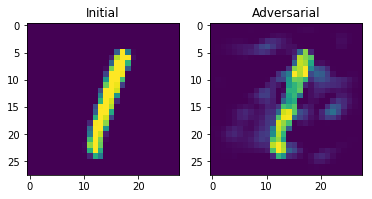

Total distortion: 2.3289594754877885
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-385.28094    715.7721      -5.3717365 -190.65005    181.84605
  -212.3559    -186.31647    253.64076    164.94226   -243.56433  ]] 1
initial_46_0.png
output/mnist/initial_46_0.png output/mnist/adversarial_46_0.png


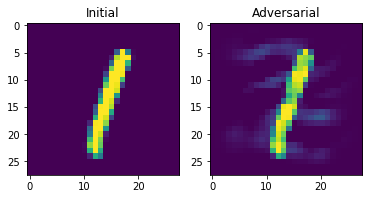

Total distortion: 1.670629661430823
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-659.3413  1036.1573   170.73659 -140.51387  306.40002 -439.19568
  -313.25043  492.5387   211.34473 -455.46664]] 1
initial_47_0.png
output/mnist/initial_47_0.png output/mnist/adversarial_47_0.png


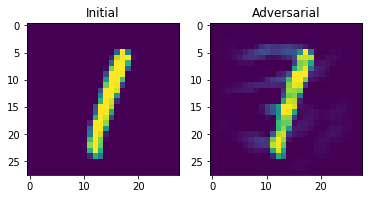

Total distortion: 1.6167805477552015
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-722.326     948.1993   -166.7454    149.67311   347.15955  -361.7435
  -444.64087   573.755      96.668755 -178.78284 ]] 1
initial_48_0.png
output/mnist/initial_48_0.png output/mnist/adversarial_48_0.png


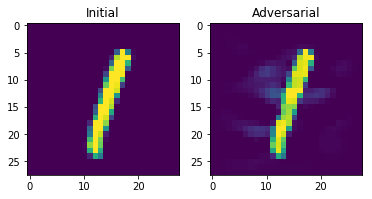

Total distortion: 1.197960606750459
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-771.7768   1257.55     -271.3482   -355.76364   754.83765  -193.4527
  -183.29118   355.14572    10.867647 -316.81024 ]] 1
initial_49_0.png
output/mnist/initial_49_0.png output/mnist/adversarial_49_0.png


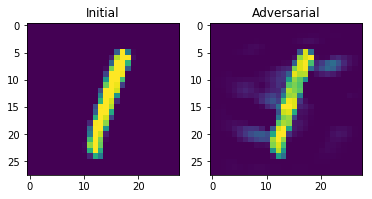

Total distortion: 1.6336616607809333
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-627.05865  935.44183 -370.82474 -316.7875   452.45724   81.29666
  -102.45273  228.3937   193.3345  -227.96341]] 1
initial_50_0.png
output/mnist/initial_50_0.png output/mnist/adversarial_50_0.png


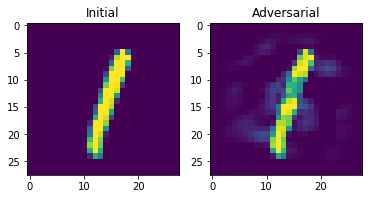

Total distortion: 1.8329170216759976
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-575.2275   903.02686 -129.67323 -326.27676  382.18463  -97.52228
   -47.90625  187.41216  266.59448 -333.4571 ]] 1
initial_51_0.png
output/mnist/initial_51_0.png output/mnist/adversarial_51_0.png


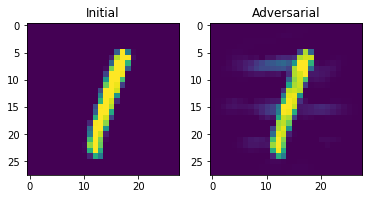

Total distortion: 1.3010687524660232
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-686.8657  1157.6777  -106.19375   40.42224  241.29143 -438.09546
  -477.90866  810.41187  199.58923 -419.1313 ]] 1
initial_52_0.png
output/mnist/initial_52_0.png output/mnist/adversarial_52_0.png


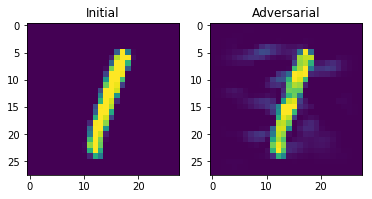

Total distortion: 1.4255751369373966
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-630.9008    932.3875    -40.575024 -207.90454   334.1392   -356.66473
  -201.96507   300.32834   360.3543   -265.67062 ]] 1
initial_53_0.png
output/mnist/initial_53_0.png output/mnist/adversarial_53_0.png


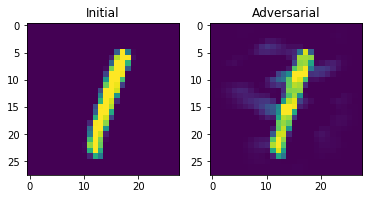

Total distortion: 1.52849642680371
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-751.687    920.5403  -241.77809 -114.03459  459.4357  -298.39212
  -353.09137  448.6638   278.61572 -108.48986]] 1
initial_54_0.png
output/mnist/initial_54_0.png output/mnist/adversarial_54_0.png


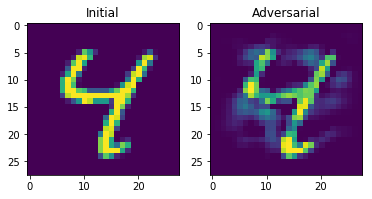

Total distortion: 3.261653840110118
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-105.841194  -55.73982   128.03915  -139.24374   163.34325  -140.12701
  -138.56273   -38.331516  304.63593   121.08684 ]] 8
initial_55_0.png
output/mnist/initial_55_0.png output/mnist/adversarial_55_0.png


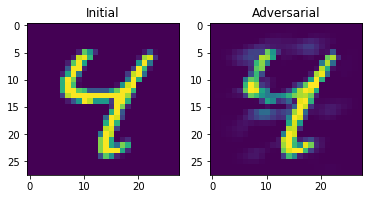

Total distortion: 2.3617157093448733
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-507.49103  390.0708  -155.5468  -392.0939   625.4978  -251.2825
  -178.30026   91.87325  376.47443  143.75989]] 4
initial_56_0.png
output/mnist/initial_56_0.png output/mnist/adversarial_56_0.png


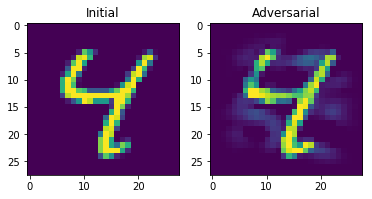

Total distortion: 2.275716471773209
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-354.31073 -148.15488  299.45193 -162.95241  291.391   -254.12823
  -377.14944  140.23366  420.36914  249.8877 ]] 8
initial_57_0.png
output/mnist/initial_57_0.png output/mnist/adversarial_57_0.png


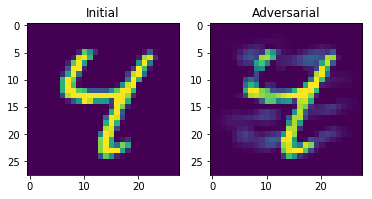

Total distortion: 2.4970017574061214
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-582.9802  -174.43427   97.52831  190.65877  316.63232 -230.52412
  -476.2585   248.20775  514.96857  293.3601 ]] 8
initial_58_0.png
output/mnist/initial_58_0.png output/mnist/adversarial_58_0.png


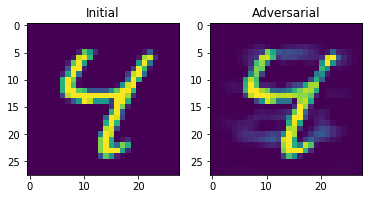

Total distortion: 1.921892801838126
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-693.88    -157.66597 -280.96744 -342.8372   553.1537   140.92123
  -199.13243  -73.83573  726.55963  394.41183]] 8
initial_59_0.png
output/mnist/initial_59_0.png output/mnist/adversarial_59_0.png


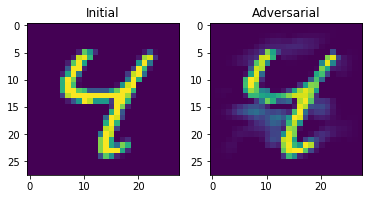

Total distortion: 2.3895131436465604
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-348.7588     53.470444 -271.7034   -486.89102   518.79956  -110.95992
   127.49658  -310.2634    598.5276    306.93826 ]] 8
initial_60_0.png
output/mnist/initial_60_0.png output/mnist/adversarial_60_0.png


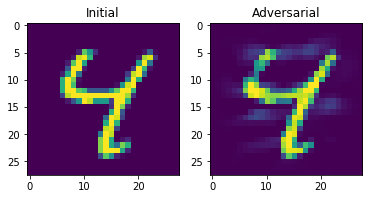

Total distortion: 1.9491813824269233
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-681.7311    -67.58233   -20.811762 -187.46466   634.3584   -120.2065
  -379.5133    368.70776   459.81342   196.14072 ]] 4
initial_61_0.png
output/mnist/initial_61_0.png output/mnist/adversarial_61_0.png


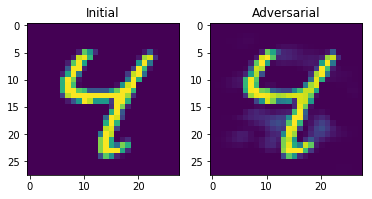

Total distortion: 1.2164703469854534
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-751.76324 -125.86356 -332.52155 -523.23737  914.38055 -155.20705
  -244.00706 -149.45662  870.1849   606.3837 ]] 4
initial_62_0.png
output/mnist/initial_62_0.png output/mnist/adversarial_62_0.png


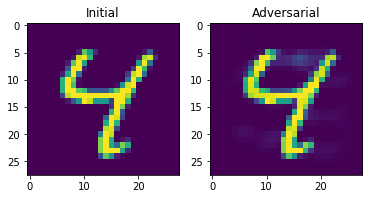

Total distortion: 0.8010758021058959
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-862.05396  -321.3567   -314.5776   -467.57895  1084.3652   -339.08823
  -550.82184   -49.701824  800.6255   1063.7816  ]] 4
initial_63_0.png
output/mnist/initial_63_0.png output/mnist/adversarial_63_0.png


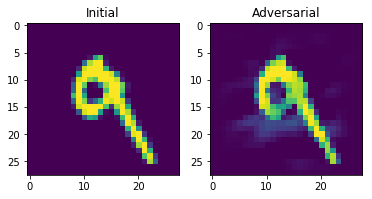

Total distortion: 1.6911510953438533
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-129.00136   149.94647    23.279016 -246.79004    37.276722 -109.2341
  -223.71678   108.95657   513.71497    17.95162 ]] 8
initial_64_0.png
output/mnist/initial_64_0.png output/mnist/adversarial_64_0.png


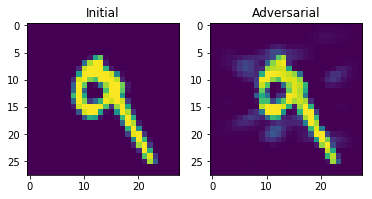

Total distortion: 1.6346310066753962
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-742.24567  367.67728   48.65204  144.9096   202.51088 -218.68846
  -517.97955  255.65266  639.56824   87.10738]] 8
initial_65_0.png
output/mnist/initial_65_0.png output/mnist/adversarial_65_0.png


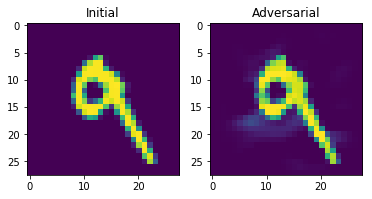

Total distortion: 1.1426780722177594
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-622.9203    214.9202    184.1895     80.25769    92.180664 -267.2073
  -510.67627   185.60802   744.1598    136.30647 ]] 8
initial_66_0.png
output/mnist/initial_66_0.png output/mnist/adversarial_66_0.png


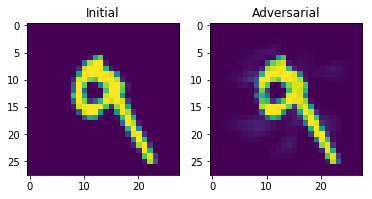

Total distortion: 1.0704445861842007
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-769.9705     135.76828     40.49435    428.86954     -3.9407651
  -184.75      -700.257      277.44748    754.4052     267.30984  ]] 8
initial_67_0.png
output/mnist/initial_67_0.png output/mnist/adversarial_67_0.png


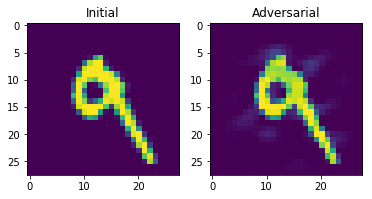

Total distortion: 1.0963361954594157
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-789.44244  130.02573 -235.8919  -322.05554  838.7389   -74.8531
  -462.48358   21.36623  572.0348   538.07874]] 4
initial_68_0.png
output/mnist/initial_68_0.png output/mnist/adversarial_68_0.png


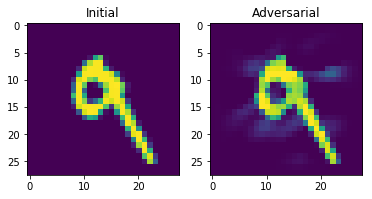

Total distortion: 1.463906438401815
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-651.80096    70.2785   -246.93742  -106.599754  166.84421   159.88705
  -398.89545   212.14697   764.9022    246.48953 ]] 8
initial_69_0.png
output/mnist/initial_69_0.png output/mnist/adversarial_69_0.png


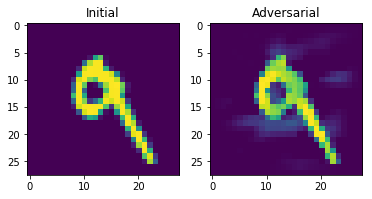

Total distortion: 1.8273667939532403
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-305.04333   201.06319   -31.973373 -298.25494   223.81537   -34.920544
   -34.412376 -152.65694   635.48596   -10.098643]] 8
initial_70_0.png
output/mnist/initial_70_0.png output/mnist/adversarial_70_0.png


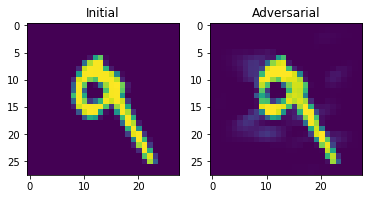

Total distortion: 1.3151236151840335
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-775.73694   178.14948   157.51347   245.73402    75.835594 -213.58551
  -664.4926    409.8763    701.9107    141.12634 ]] 8
initial_71_0.png
output/mnist/initial_71_0.png output/mnist/adversarial_71_0.png


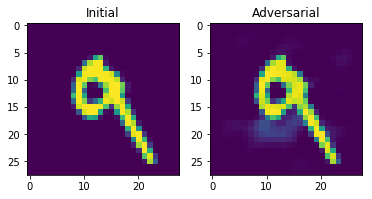

Total distortion: 1.135434660929376
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-530.86383    87.84471   -45.41885   -49.63701   112.697495 -170.18329
  -415.65952   -17.3138    936.1175    317.12405 ]] 8
initial_72_0.png
output/mnist/initial_72_0.png output/mnist/adversarial_72_0.png


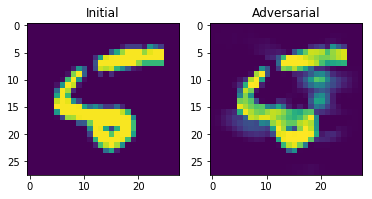

Total distortion: 2.9398716219945036
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[ 161.62204   -60.50847  -102.146675 -241.16258  -192.21092   -23.812742
   -45.08768  -100.99586   304.6295    342.98178 ]] 9
initial_73_0.png
output/mnist/initial_73_0.png output/mnist/adversarial_73_0.png


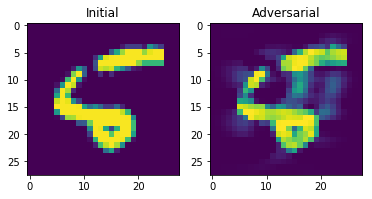

Total distortion: 3.025924251377295
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-602.6659   548.3856   -73.12391 -152.7373   273.08102   80.198
  -253.23695  348.43683  352.4958  -278.36813]] 1
initial_74_0.png
output/mnist/initial_74_0.png output/mnist/adversarial_74_0.png


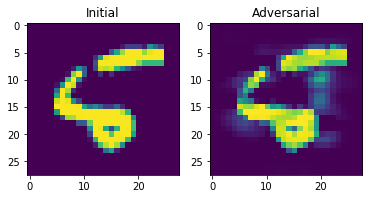

Total distortion: 2.689781639851192
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-283.02982   166.73154   198.81067  -130.19075    32.78019  -106.34743
  -199.09497    75.568535  367.9298    -55.057507]] 8
initial_75_0.png
output/mnist/initial_75_0.png output/mnist/adversarial_75_0.png


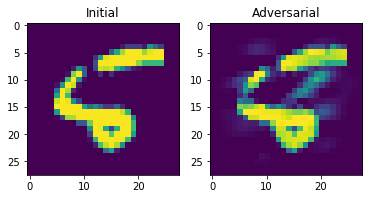

Total distortion: 2.8994928376908113
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-561.28357   309.33707    57.638966  133.97516    61.871563  -71.0435
  -417.05182   328.31305   420.5863    -85.953995]] 8
initial_76_0.png
output/mnist/initial_76_0.png output/mnist/adversarial_76_0.png


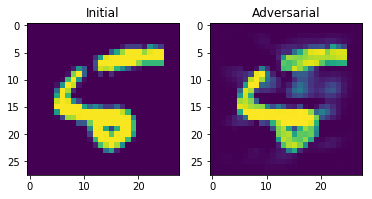

Total distortion: 2.306099152219115
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-654.65936   124.69716  -481.1986   -542.5439    630.3177    309.11414
   -85.50883   -46.687534  684.58466   222.61609 ]] 8
initial_77_0.png
output/mnist/initial_77_0.png output/mnist/adversarial_77_0.png


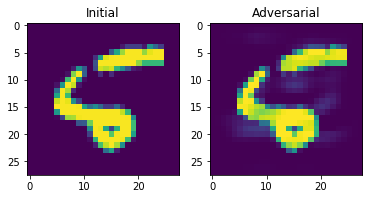

Total distortion: 1.081592512180012
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-154.19354   -55.765305 -603.5989   -782.4964    -69.01456   661.88367
   649.01263  -610.7832    762.137     245.43175 ]] 8
initial_78_0.png
output/mnist/initial_78_0.png output/mnist/adversarial_78_0.png


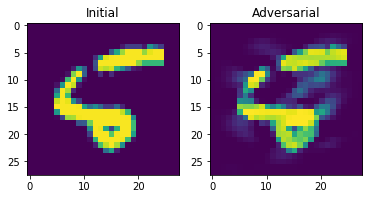

Total distortion: 2.8443108309550804
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-647.90704   247.45822    63.475094 -104.060265  271.75107   -67.198074
  -420.91364   476.54346   440.9366   -113.10771 ]] 7
initial_79_0.png
output/mnist/initial_79_0.png output/mnist/adversarial_79_0.png


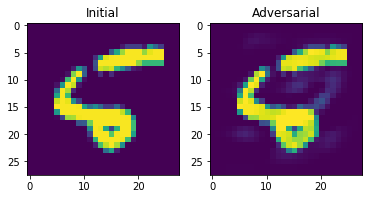

Total distortion: 1.0415586161204848
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-4.8654483e+02  6.5381631e-02 -5.8581403e+02 -7.0447388e+02
   1.5107158e+02  5.2681543e+02  2.9834525e+02 -4.3547614e+02
   9.3204541e+02  4.0795480e+02]] 8
initial_80_0.png
output/mnist/initial_80_0.png output/mnist/adversarial_80_0.png


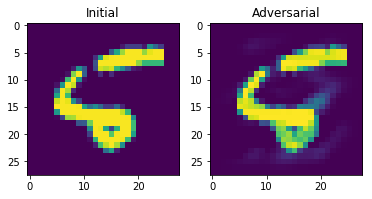

Total distortion: 1.6836641301360225
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-671.2619   -129.99794  -661.72784  -651.8268    259.52048   467.49094
    17.877388 -283.09125   983.9273    682.7208  ]] 8
initial_81_0.png
output/mnist/initial_81_0.png output/mnist/adversarial_81_0.png


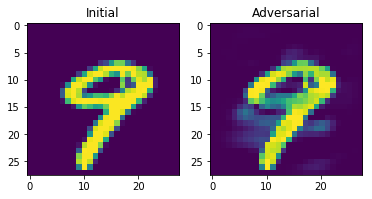

Total distortion: 2.3276615577622386
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-106.37076   -72.835594  172.81184  -243.04689   163.95445  -392.45828
  -440.90063   469.05292   343.1601    131.45567 ]] 7
initial_82_0.png
output/mnist/initial_82_0.png output/mnist/adversarial_82_0.png


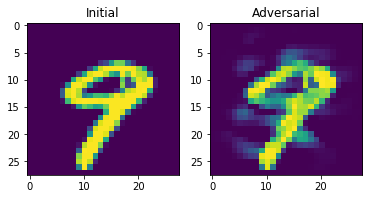

Total distortion: 3.0353142931624673
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[ -45.783566  225.4398    212.08319  -111.50599    66.854004 -272.24103
  -180.80655   280.84735   115.047844 -187.38152 ]] 7
initial_83_0.png
output/mnist/initial_83_0.png output/mnist/adversarial_83_0.png


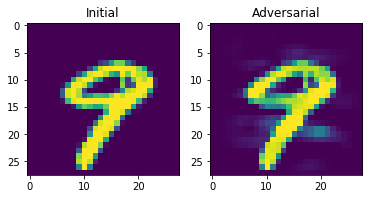

Total distortion: 1.7779287193050135
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-454.71545  -341.2026    338.4831   -121.856865  384.95267  -357.77396
  -555.8535    412.5124    467.4442    269.4929  ]] 8
initial_84_0.png
output/mnist/initial_84_0.png output/mnist/adversarial_84_0.png


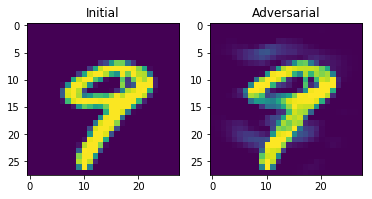

Total distortion: 2.1444492011712026
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-513.75775 -236.37517  157.97612  289.334    249.02434 -316.43802
  -625.98956  439.68542  371.54846  256.6243 ]] 7
initial_85_0.png
output/mnist/initial_85_0.png output/mnist/adversarial_85_0.png


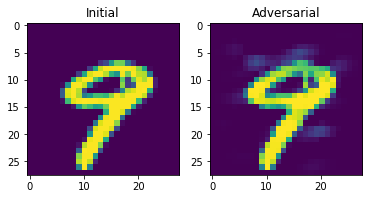

Total distortion: 1.3134444789442392
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-780.1434    -485.7124      -5.8849087 -358.05457    967.55646
  -272.27908   -685.98895    367.7813     562.3251     770.8361   ]] 4
initial_86_0.png
output/mnist/initial_86_0.png output/mnist/adversarial_86_0.png


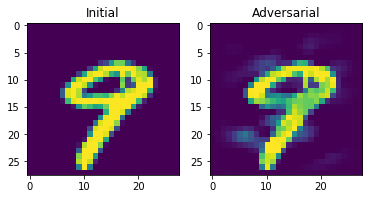

Total distortion: 2.2290900624265255
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-330.7719   -105.56618  -171.18251  -199.2864    -21.173027  112.300735
  -479.2764    535.5525    414.66446   219.44751 ]] 7
initial_87_0.png
output/mnist/initial_87_0.png output/mnist/adversarial_87_0.png


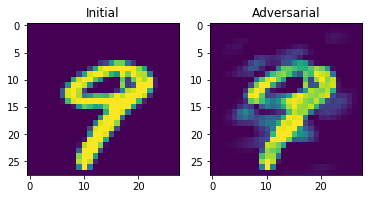

Total distortion: 2.9885722897488507
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[ -77.3994      -1.6931823   95.78718   -260.05307    258.51993
  -254.39494   -116.798904   193.94427    153.93393     38.28067  ]] 4
initial_88_0.png
output/mnist/initial_88_0.png output/mnist/adversarial_88_0.png


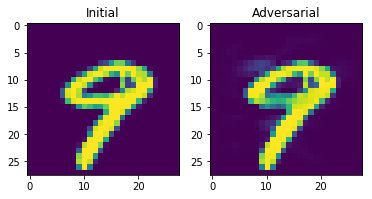

Total distortion: 1.2698557747024766
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-473.66867  -188.37762   -55.866646 -213.58455   214.52528  -251.68675
  -824.2282    889.7449    318.56903   515.6682  ]] 7
initial_89_0.png
output/mnist/initial_89_0.png output/mnist/adversarial_89_0.png


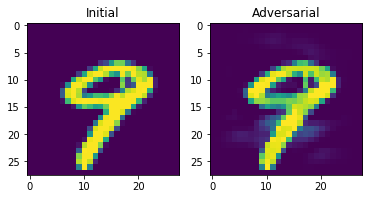

Total distortion: 1.5556521849289586
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-530.4535  -343.31937   16.49413 -139.87506  317.9908  -274.21588
  -599.2236   449.51712  669.1754   460.621  ]] 8
initial_90_1.png
output/mnist/initial_90_1.png output/mnist/adversarial_90_1.png


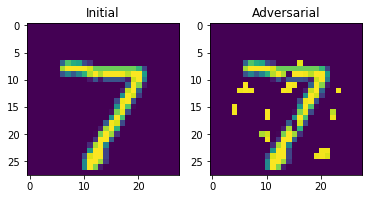

Total distortion: 5.0532526399985525
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[ 282.89008  -115.670334  142.00572  -197.02502  -234.32414  -264.06747
  -477.99496   530.5166    135.1046    111.50783 ]] 7
initial_91_1.png
output/mnist/initial_91_1.png output/mnist/adversarial_91_1.png


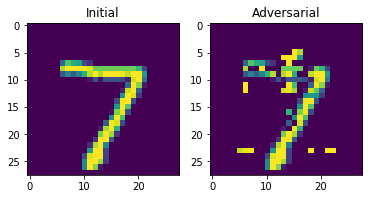

Total distortion: 5.373346118643595
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[  47.216663   335.23526    -87.44245     -6.495649     5.2982335
  -254.13942   -289.40485    291.09415      6.3517838  -29.624891 ]] 1
initial_92_1.png
output/mnist/initial_92_1.png output/mnist/adversarial_92_1.png


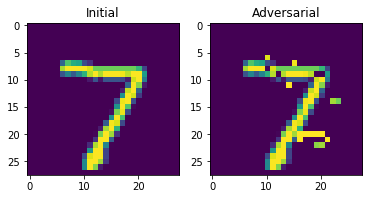

Total distortion: 4.040652642741872
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[ -21.147402   72.10924   617.44116    44.659016 -179.32108  -425.7819
  -709.0016    818.37244    48.192158 -199.09859 ]] 7
initial_93_1.png
output/mnist/initial_93_1.png output/mnist/adversarial_93_1.png


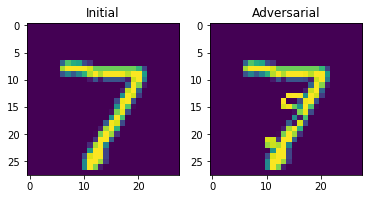

Total distortion: 3.365107980613907
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[ -491.51038    -51.856834   206.21425    794.9249    -375.61365
   -153.98679  -1228.6538     947.80206     28.14068    310.85193 ]] 7
initial_94_1.png
output/mnist/initial_94_1.png output/mnist/adversarial_94_1.png


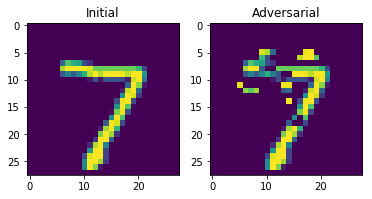

Total distortion: 4.617206915541877
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[   1.4053866   -45.416378     -0.42913422  -65.35579      70.574715
  -210.91284    -341.39606     297.88574     155.3617      119.59478   ]] 7
initial_95_1.png
output/mnist/initial_95_1.png output/mnist/adversarial_95_1.png


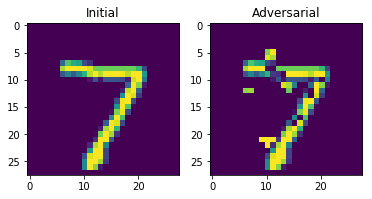

Total distortion: 4.492190684441806
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[ 123.967804 -212.91525   134.76028  -104.427734 -256.16885   -82.967354
  -473.27512   452.07425   194.92223   110.10179 ]] 7
initial_96_1.png
output/mnist/initial_96_1.png output/mnist/adversarial_96_1.png


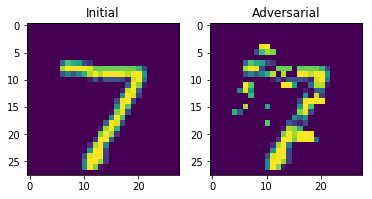

Total distortion: 5.451172224896979
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[ 167.70897     -3.9628453  135.26222   -181.15297    -42.204025
   -64.869415   -22.030224     8.792845   161.31238   -102.404144 ]] 0
initial_97_1.png
output/mnist/initial_97_1.png output/mnist/adversarial_97_1.png


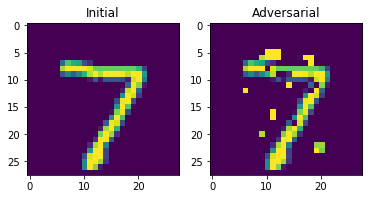

Total distortion: 4.892272671665071
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[ -51.6366  -164.45634  179.3118  -114.24803 -104.60884 -387.89166
  -602.6209   463.73462  373.22473  304.97253]] 7
initial_98_1.png
output/mnist/initial_98_1.png output/mnist/adversarial_98_1.png


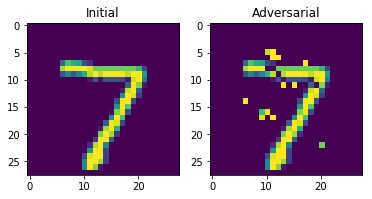

Total distortion: 3.947773201918289
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[-403.05493  -171.01172   140.03902    26.427343 -102.615524 -330.92517
  -940.1403    791.283     413.05505   452.51852 ]] 7
initial_99_1.png
output/mnist/initial_99_1.png output/mnist/adversarial_99_1.png


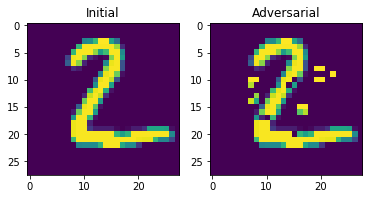

Total distortion: 4.202093855857756
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[ 374.42078  101.31081  500.10843 -105.23836 -254.30367 -261.40604
   430.78134 -659.0021   555.36383 -300.4652 ]] 8
initial_100_1.png
output/mnist/initial_100_1.png output/mnist/adversarial_100_1.png


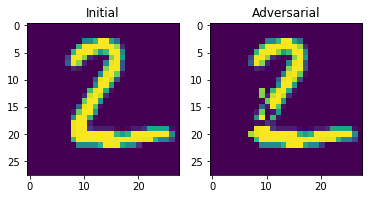

Total distortion: 2.869061016435139
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[  74.39821  769.9538   398.25766  466.93002 -184.92567 -409.3385
  -293.121   -462.84244 -112.50726   64.26357]] 1
initial_101_1.png
output/mnist/initial_101_1.png output/mnist/adversarial_101_1.png


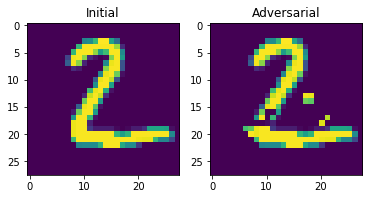

Total distortion: 3.556406531886357
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[ -74.205284  435.57312   193.95927   703.57355  -182.81114  -235.67482
   -98.63196  -587.0014    313.92148   -52.497932]] 3
initial_102_1.png
output/mnist/initial_102_1.png output/mnist/adversarial_102_1.png


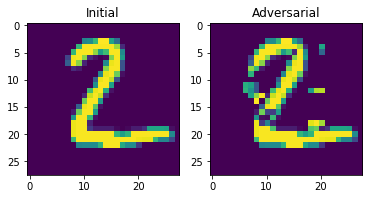

Total distortion: 4.140511680347932
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[-137.9859    448.4362     -8.183857   54.45591   201.46924  -140.31474
   111.82348  -554.3073    222.03746   129.57204 ]] 1
initial_103_1.png
output/mnist/initial_103_1.png output/mnist/adversarial_103_1.png


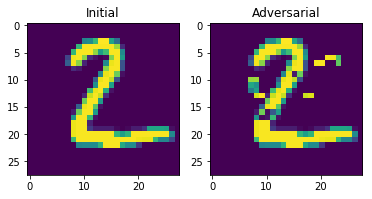

Total distortion: 3.9072858733938753
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[-114.27423   455.9903     94.73582    91.22906  -135.40848    83.4248
   128.64114  -433.2358    279.31125  -121.071396]] 1
initial_104_1.png
output/mnist/initial_104_1.png output/mnist/adversarial_104_1.png


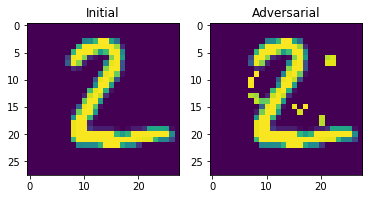

Total distortion: 3.7272091350501606
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[ 364.09805  425.21875  718.9174  -380.66324 -326.71378 -352.54678
   541.7065  -682.7585   552.67096 -543.4278 ]] 2
initial_105_1.png
output/mnist/initial_105_1.png output/mnist/adversarial_105_1.png


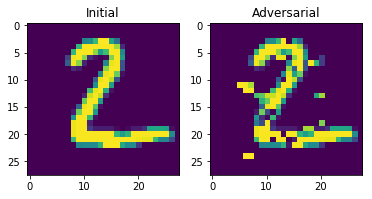

Total distortion: 5.163462640084353
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[-166.88197   266.69638    10.632866  226.3447     17.594093  -81.41122
  -145.76932  -137.3815    191.2331     44.756935]] 1
initial_106_1.png
output/mnist/initial_106_1.png output/mnist/adversarial_106_1.png


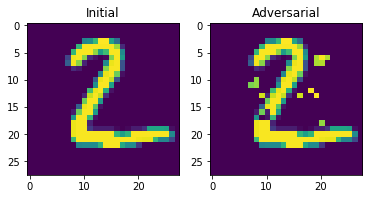

Total distortion: 3.6418178716093346
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[   1.047402  418.91138   222.01074    91.63674  -186.53789   -88.08864
   111.88757  -390.45706   297.549    -178.20465 ]] 1
initial_107_1.png
output/mnist/initial_107_1.png output/mnist/adversarial_107_1.png


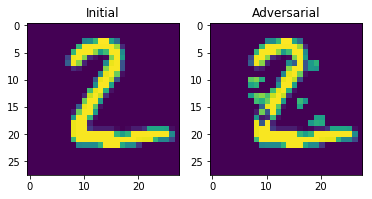

Total distortion: 3.512002935569075
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[  89.4483    408.50452   274.79684   143.93344  -130.66705  -235.26617
    45.62944  -535.1342    248.57683    31.790146]] 1
initial_108_1.png
output/mnist/initial_108_1.png output/mnist/adversarial_108_1.png


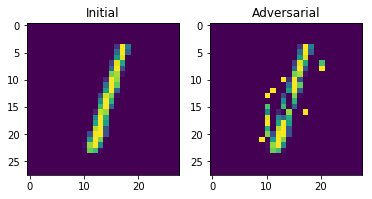

Total distortion: 3.8200346488779298
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-239.78702   476.97195   -16.611858  -19.274454   91.59847   -22.773691
  -125.71826   207.0272    -31.812286 -213.5529  ]] 1
initial_109_1.png
output/mnist/initial_109_1.png output/mnist/adversarial_109_1.png


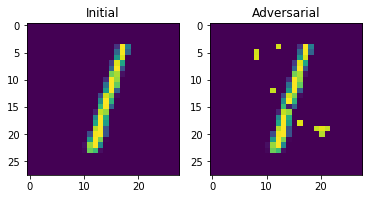

Total distortion: 2.9384955484493824
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-521.6305    1126.654      221.97267   -325.24008    454.17136
  -305.97086     -5.4208302  110.37246     10.567281  -501.65442  ]] 1
initial_110_1.png
output/mnist/initial_110_1.png output/mnist/adversarial_110_1.png


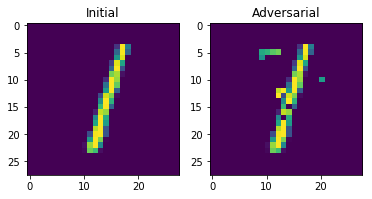

Total distortion: 2.7042734870521947
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-489.37405   763.8101   -193.83289    -4.834556  317.99228  -220.5158
  -110.09195   228.7336     89.86635  -153.41922 ]] 1
initial_111_1.png
output/mnist/initial_111_1.png output/mnist/adversarial_111_1.png


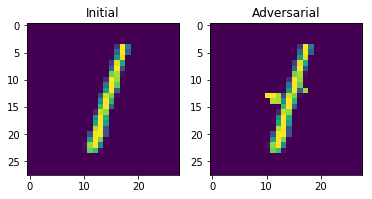

Total distortion: 2.248950395545067
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-794.8107    887.62744  -203.20293  -493.95544   880.2006    -70.425934
   -46.45111   110.63592   321.7773   -239.76643 ]] 1
initial_112_1.png
output/mnist/initial_112_1.png output/mnist/adversarial_112_1.png


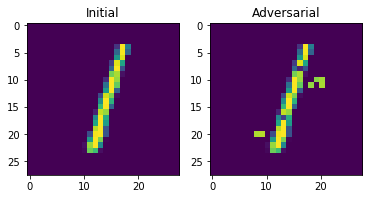

Total distortion: 2.4306197263935583
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-472.0034    846.5773   -366.328    -230.89417   291.63416   169.72234
   143.63779   -36.964615  123.68771  -212.09799 ]] 1
initial_113_1.png
output/mnist/initial_113_1.png output/mnist/adversarial_113_1.png


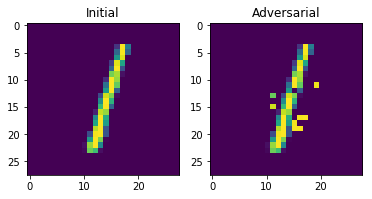

Total distortion: 2.875165022384772
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-572.39886   927.9567     99.65842  -338.43118   475.20596   -53.91921
   151.28522    78.484764   23.282345 -511.2446  ]] 1
initial_114_1.png
output/mnist/initial_114_1.png output/mnist/adversarial_114_1.png


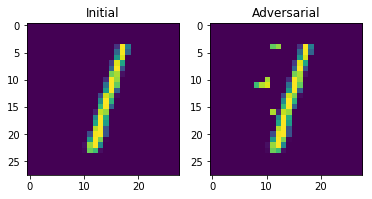

Total distortion: 2.227754829121534
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-654.9511   1123.1554     93.12261   -69.140816  315.16647  -302.1619
  -347.72873   709.3353    115.90164  -637.3325  ]] 1
initial_115_1.png
output/mnist/initial_115_1.png output/mnist/adversarial_115_1.png


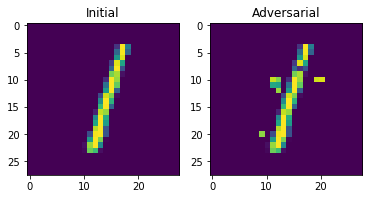

Total distortion: 2.466644838167812
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-505.1966    843.40924  -273.32364  -235.95056   291.2242     15.323196
   -61.286148  201.69434   208.05522  -244.69603 ]] 1
initial_116_1.png
output/mnist/initial_116_1.png output/mnist/adversarial_116_1.png


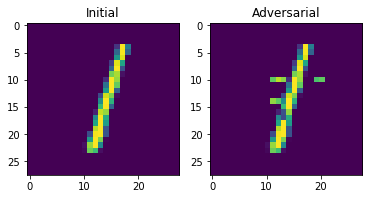

Total distortion: 2.3301114817787347
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-513.9123    765.9362   -206.96251  -141.82521   283.68744   -32.640133
   -87.36813   174.75209   160.37807  -181.36458 ]] 1
initial_117_1.png
output/mnist/initial_117_1.png output/mnist/adversarial_117_1.png


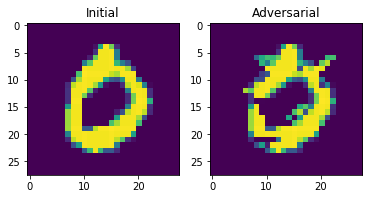

Total distortion: 4.5257130435154735
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 375.2046   261.82422  -71.27784 -145.40118   29.18484 -123.59894
  -115.45678  206.96204 -187.40308 -213.8296 ]] 0
initial_118_1.png
output/mnist/initial_118_1.png output/mnist/adversarial_118_1.png


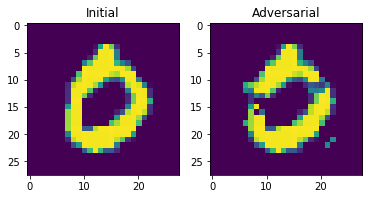

Total distortion: 3.0823979032737556
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 649.6992     -51.25857    217.5781    -144.54436   -175.9579
   -82.086296  -127.73753     -5.4555087 -243.46045    -36.79921  ]] 0
initial_119_1.png
output/mnist/initial_119_1.png output/mnist/adversarial_119_1.png


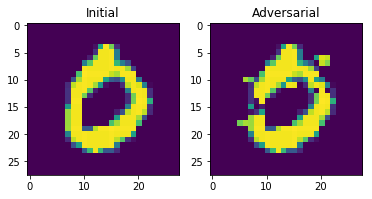

Total distortion: 3.8053585768782163
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 453.22345   -25.900597   48.555717   39.445206  -94.43992    31.653746
  -176.39034   -67.42355  -252.7055     26.624792]] 0
initial_120_1.png
output/mnist/initial_120_1.png output/mnist/adversarial_120_1.png


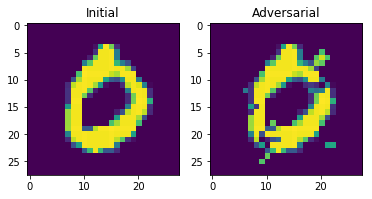

Total distortion: 3.835053569315115
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 557.70074   122.29575  -168.48564  -229.74901    97.89856  -238.06198
    58.217857  138.23947  -250.0624   -118.29138 ]] 0
initial_121_1.png
output/mnist/initial_121_1.png output/mnist/adversarial_121_1.png


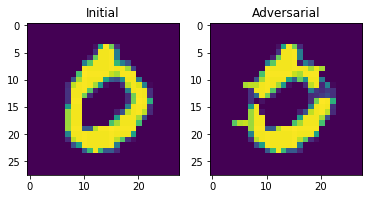

Total distortion: 3.758775995974626
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 4.7994385e+02 -7.9342178e+01  6.0457256e+01 -6.3003033e+01
  -2.0791827e+02  8.4904976e+01 -1.5032535e+02  1.8463743e-01
  -9.6797508e+01 -5.4580296e+01]] 0
initial_122_1.png
output/mnist/initial_122_1.png output/mnist/adversarial_122_1.png


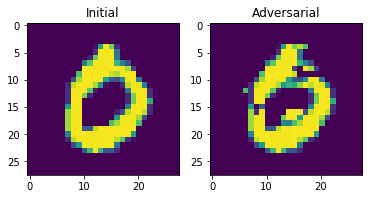

Total distortion: 4.138464713211303
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 672.8688     91.454094  -99.648094 -205.76224    88.15187  -187.18747
   456.3458   -293.20264  -310.6549   -117.67864 ]] 0
initial_123_1.png
output/mnist/initial_123_1.png output/mnist/adversarial_123_1.png


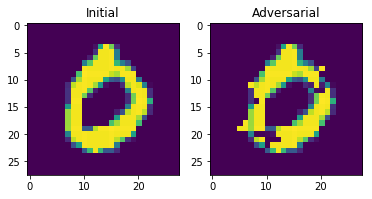

Total distortion: 4.066672192762612
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 651.67914   119.39535   -27.871502 -339.43097  -101.336494 -235.00243
   -84.270775  407.9426   -174.94682  -200.82748 ]] 0
initial_124_1.png
output/mnist/initial_124_1.png output/mnist/adversarial_124_1.png


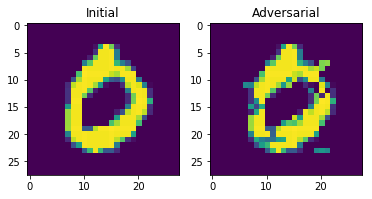

Total distortion: 3.87998149985396
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 355.33606  154.1757   -53.19318 -199.64922  -71.60915 -101.80292
  -112.4416   258.94952  -68.04207 -145.31259]] 0
initial_125_1.png
output/mnist/initial_125_1.png output/mnist/adversarial_125_1.png


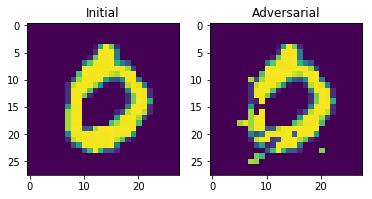

Total distortion: 3.649665968777798
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 488.26935    19.968412  -62.478977 -101.68937   -62.391888 -113.91308
  -173.88892   166.9624   -273.32654    97.44951 ]] 0
initial_126_1.png
output/mnist/initial_126_1.png output/mnist/adversarial_126_1.png


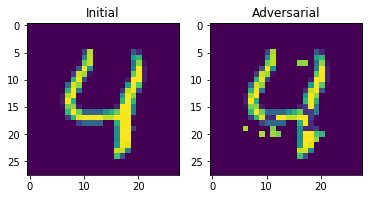

Total distortion: 3.6179313142075724
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[ 364.04153  -129.39468   -50.32097  -415.04797   641.35504  -593.4734
   -32.326847 -251.46413   311.73297   278.12125 ]] 4
initial_127_1.png
output/mnist/initial_127_1.png output/mnist/adversarial_127_1.png


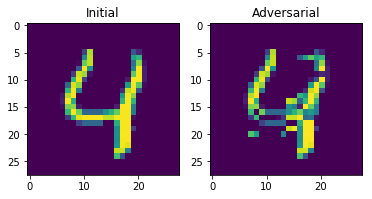

Total distortion: 3.876932462161562
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[ 130.63918   171.49208  -300.08398  -325.07663   482.10965  -577.04895
   -88.974335   68.86966   195.80666   299.69217 ]] 4
initial_128_1.png
output/mnist/initial_128_1.png output/mnist/adversarial_128_1.png


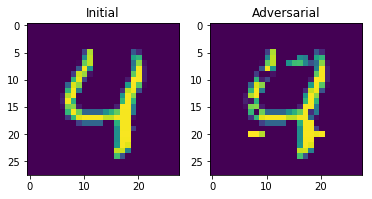

Total distortion: 3.4685935595177377
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[ -80.90797  -171.16937   112.670876 -228.88817   649.2844   -639.04315
  -533.76337   167.08583   289.72452   492.4783  ]] 4
initial_129_1.png
output/mnist/initial_129_1.png output/mnist/adversarial_129_1.png


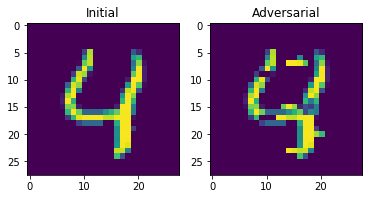

Total distortion: 3.9969500596527237
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[  18.908365 -314.51566   -30.100918   42.542717  307.22894  -455.5986
  -442.6555     40.339203  474.27905   429.12628 ]] 8
initial_130_1.png
output/mnist/initial_130_1.png output/mnist/adversarial_130_1.png


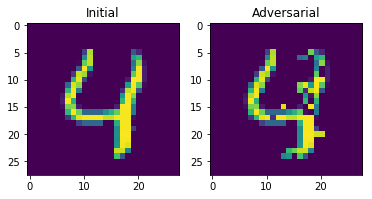

Total distortion: 3.822228074315739
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[-243.4455   -101.20914  -513.8683   -378.95728   833.7693     27.079939
    86.654    -291.24042   293.52145   401.77502 ]] 4
initial_131_1.png
output/mnist/initial_131_1.png output/mnist/adversarial_131_1.png


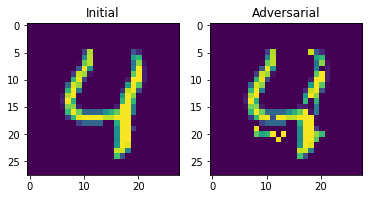

Total distortion: 3.5964356048813935
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[ 132.48184  -47.94658 -230.5942  -572.95996 1031.9585  -255.08081
   230.09018 -398.12408  127.10117  155.9116 ]] 4
initial_132_1.png
output/mnist/initial_132_1.png output/mnist/adversarial_132_1.png


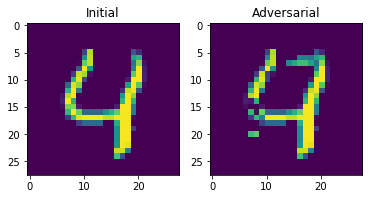

Total distortion: 2.691647722238615
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[-246.14932  -158.58792   -74.38762  -309.31464   949.6399   -693.9495
  -655.72253   484.3448     54.680557  702.7233  ]] 4
initial_133_1.png
output/mnist/initial_133_1.png output/mnist/adversarial_133_1.png


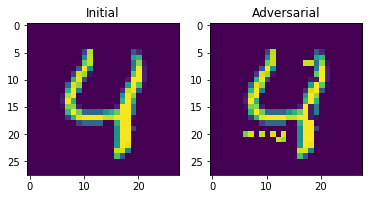

Total distortion: 3.294607820224877
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[  23.079454 -147.80347  -299.16812  -535.55426   973.77783  -448.87656
  -213.44965   -61.411655  235.92354   552.9402  ]] 4
initial_134_1.png
output/mnist/initial_134_1.png output/mnist/adversarial_134_1.png


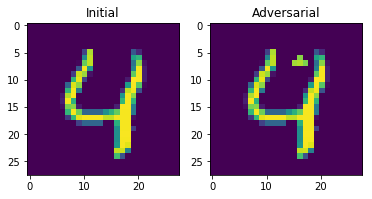

Total distortion: 1.6913376016759687
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[-282.8391   -339.99948  -348.89407  -442.88068  1376.323    -611.9846
  -547.0541    231.56606   -38.305363 1030.137   ]] 4
initial_135_1.png
output/mnist/initial_135_1.png output/mnist/adversarial_135_1.png


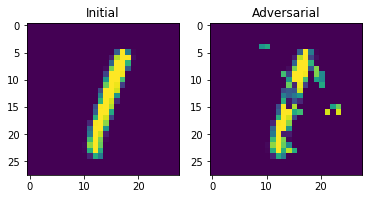

Total distortion: 3.8139205537392065
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-290.36987   577.9801    -66.70742  -191.07042   129.83632  -120.969406
  -108.04156   188.79224   133.02724  -182.80832 ]] 1
initial_136_1.png
output/mnist/initial_136_1.png output/mnist/adversarial_136_1.png


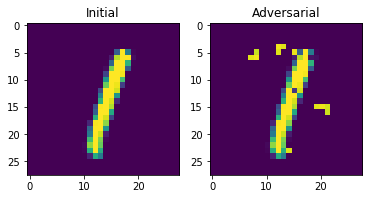

Total distortion: 3.5407659544668473
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-597.29956 1076.6631   121.11095 -103.73502  314.97025 -617.21063
  -297.16302  558.8595   330.96597 -434.62967]] 1
initial_137_1.png
output/mnist/initial_137_1.png output/mnist/adversarial_137_1.png


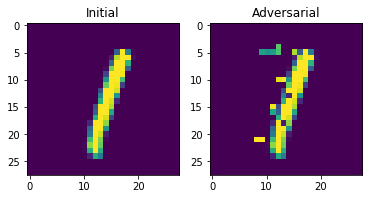

Total distortion: 3.106003817161086
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-680.6576    872.6898    -73.621895  185.59372   274.26144  -425.2737
  -523.7766    600.97705   106.9945   -115.62019 ]] 1
initial_138_1.png
output/mnist/initial_138_1.png output/mnist/adversarial_138_1.png


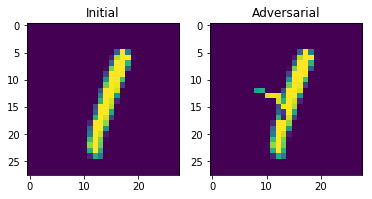

Total distortion: 2.42004955776954
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-863.0153  1166.6735  -283.3028  -398.15628  947.93304 -270.3968
  -227.1503   376.74084  131.00606 -250.64868]] 1
initial_139_1.png
output/mnist/initial_139_1.png output/mnist/adversarial_139_1.png


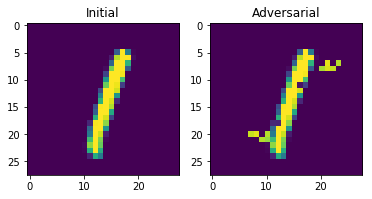

Total distortion: 3.1505577199177295
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-499.23022   980.97845  -469.00543  -324.13867   306.9908    253.72266
   -35.44216    92.678764  150.98335  -209.13179 ]] 1
initial_140_1.png
output/mnist/initial_140_1.png output/mnist/adversarial_140_1.png


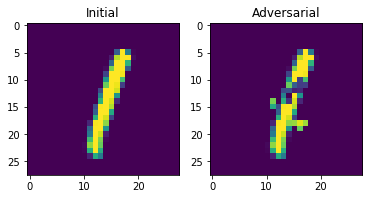

Total distortion: 3.0894943406262647
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-549.0651    839.4957     90.88536  -330.23273   453.04538  -143.5498
   -10.757046  241.60605   100.615456 -452.43332 ]] 1
initial_141_1.png
output/mnist/initial_141_1.png output/mnist/adversarial_141_1.png


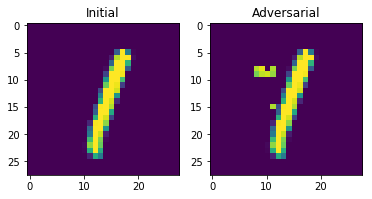

Total distortion: 2.5090532412484663
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-671.0185  1216.6937   -70.88193   32.03105  173.26935 -484.68726
  -543.4483  1032.3331   226.08127 -567.9292 ]] 1
initial_142_1.png
output/mnist/initial_142_1.png output/mnist/adversarial_142_1.png


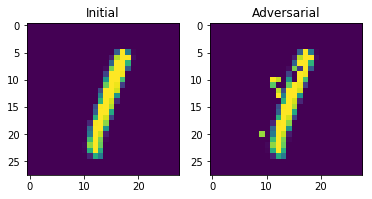

Total distortion: 2.755964486694741
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-649.873   1115.3159  -314.35825 -327.929    483.34756 -257.26868
  -211.94629  383.51727  295.2144  -239.90108]] 1
initial_143_1.png
output/mnist/initial_143_1.png output/mnist/adversarial_143_1.png


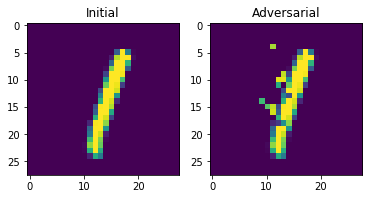

Total distortion: 2.8326322772795858
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-802.9039   973.5148  -170.83154 -106.87789  535.7068  -416.05576
  -429.34476  534.17755  246.32716 -114.63203]] 1
initial_144_1.png
output/mnist/initial_144_1.png output/mnist/adversarial_144_1.png


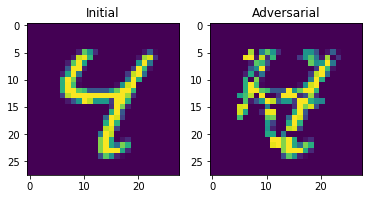

Total distortion: 5.566757458766848
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[ -98.273575  -24.124035  117.96667   -49.17665   137.14944  -139.65692
  -168.98628    25.41745   279.56253    50.172844]] 8
initial_145_1.png
output/mnist/initial_145_1.png output/mnist/adversarial_145_1.png


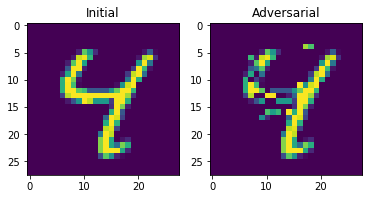

Total distortion: 3.934367432409012
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-547.2753   340.18933  -97.55161 -318.1594   505.20285 -335.5215
  -333.50928  221.88086  443.49698  226.93848]] 4
initial_146_1.png
output/mnist/initial_146_1.png output/mnist/adversarial_146_1.png


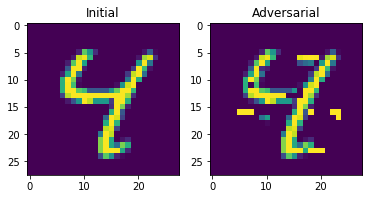

Total distortion: 4.449770872239344
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-297.5568  -146.81288  395.7472  -334.76755  330.13223 -371.40567
  -426.83203  128.5592   578.04474  274.4548 ]] 8
initial_147_1.png
output/mnist/initial_147_1.png output/mnist/adversarial_147_1.png


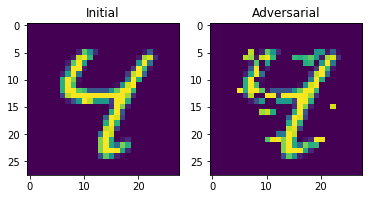

Total distortion: 4.706385701972632
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-349.23053  -55.00766  177.36507   87.25795  107.75428 -202.10712
  -354.87076   91.05674  392.96695  234.80116]] 8
initial_148_1.png
output/mnist/initial_148_1.png output/mnist/adversarial_148_1.png


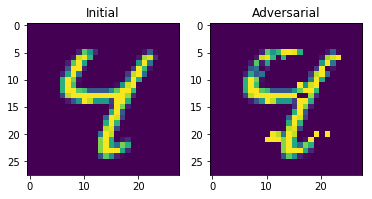

Total distortion: 4.275463119317433
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-646.03394 -199.5947   -63.97299 -117.33275  441.79507  147.5943
  -292.7408    34.26574  539.6721   332.17105]] 8
initial_149_1.png
output/mnist/initial_149_1.png output/mnist/adversarial_149_1.png


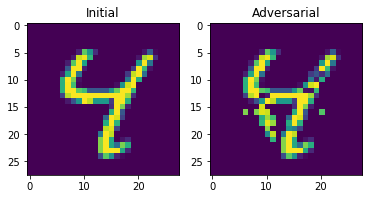

Total distortion: 4.066220501881554
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-340.93015   -58.719276 -253.92628  -658.3424    543.6165    -29.648329
   251.50623  -407.77365   727.66754   329.70312 ]] 8
initial_150_1.png
output/mnist/initial_150_1.png output/mnist/adversarial_150_1.png


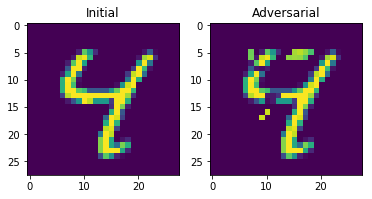

Total distortion: 3.7760309188514425
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-484.69598  -140.20804     9.969285 -123.38979   361.23416  -323.83334
  -436.85837   244.70357   543.8772    436.51987 ]] 8
initial_151_1.png
output/mnist/initial_151_1.png output/mnist/adversarial_151_1.png


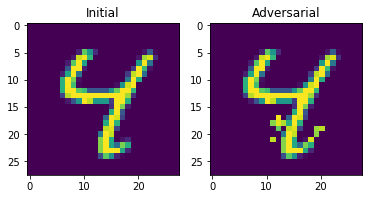

Total distortion: 2.7658376665839026
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-862.3182   -97.47597 -385.8819  -664.89984 1172.2236  -121.47013
  -185.59537 -271.1656   986.9085   603.7652 ]] 4
initial_152_1.png
output/mnist/initial_152_1.png output/mnist/adversarial_152_1.png


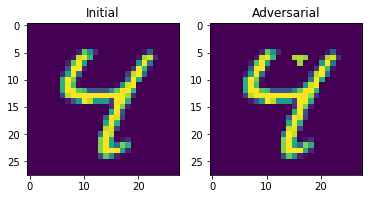

Total distortion: 1.7144926576365382
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-850.7493   -344.1514   -226.56651  -438.72653   993.5041   -307.3552
  -581.04       59.673214  774.72046   977.8912  ]] 4
initial_153_1.png
output/mnist/initial_153_1.png output/mnist/adversarial_153_1.png


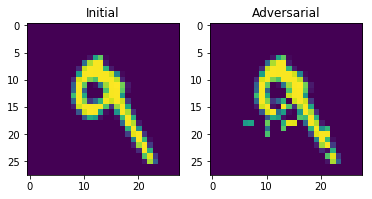

Total distortion: 3.237311315745477
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[ -73.35158   110.487885   81.31141  -103.69758    34.57954  -198.96848
  -205.39714    -4.454785  399.84537    90.627716]] 8
initial_154_1.png
output/mnist/initial_154_1.png output/mnist/adversarial_154_1.png


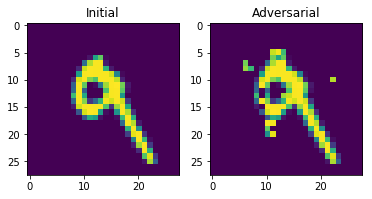

Total distortion: 3.5581531440322687
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-578.98004    379.554       -2.6240551  -63.96837    170.929
  -184.69061   -378.05444    117.116875   797.34314     28.410252 ]] 8
initial_155_1.png
output/mnist/initial_155_1.png output/mnist/adversarial_155_1.png


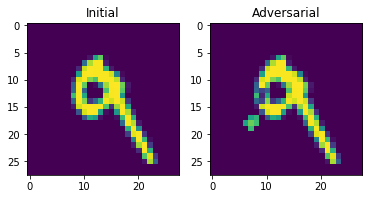

Total distortion: 2.1669283733280795
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-651.5939    182.91708   309.72418   163.27757    -7.252258 -306.28818
  -592.18933   245.61203   738.9622    134.47853 ]] 8
initial_156_1.png
output/mnist/initial_156_1.png output/mnist/adversarial_156_1.png


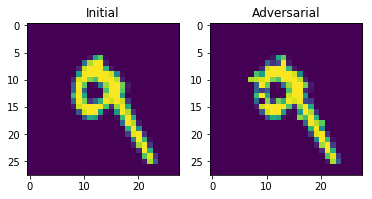

Total distortion: 2.6178343927097085
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-844.0717      93.11677   -116.5257     591.9918       1.2948763
  -118.4893    -764.6641     303.66486    734.9533     347.1008   ]] 8
initial_157_1.png
output/mnist/initial_157_1.png output/mnist/adversarial_157_1.png


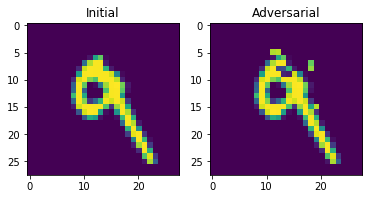

Total distortion: 2.5477161539633437
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-844.26733  203.17667 -406.61765 -372.48035  961.0475   -47.82844
  -430.30573 -163.52687  638.3613   682.3082 ]] 4
initial_158_1.png
output/mnist/initial_158_1.png output/mnist/adversarial_158_1.png


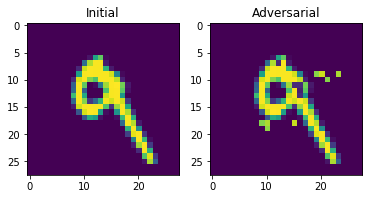

Total distortion: 3.1426743231275363
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-585.59875    56.777443 -184.1758   -267.63974    95.88815   254.4434
  -188.76488   -36.066074  844.03204   185.39323 ]] 8
initial_159_1.png
output/mnist/initial_159_1.png output/mnist/adversarial_159_1.png


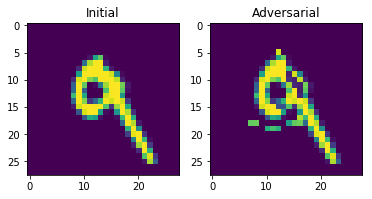

Total distortion: 3.510439290653906
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-253.73688   140.66837    56.062996 -237.7613    167.88356  -123.67839
   -17.442572 -194.2394    587.73883    23.678823]] 8
initial_160_1.png
output/mnist/initial_160_1.png output/mnist/adversarial_160_1.png


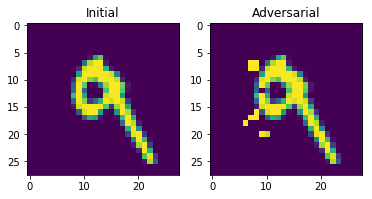

Total distortion: 3.284718161094974
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-619.30743    59.560024  146.42836    95.51797    48.504684  -94.158844
  -542.43445   269.0868    744.8977    128.63748 ]] 8
initial_161_1.png
output/mnist/initial_161_1.png output/mnist/adversarial_161_1.png


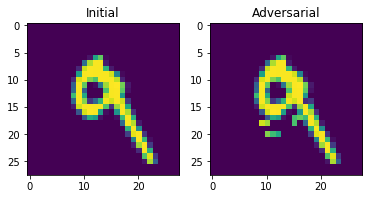

Total distortion: 2.2956354857926313
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-527.8814     83.61522   -60.648525 -117.203636  134.89854  -174.92734
  -393.92883    11.352222  927.74945   316.63525 ]] 8
initial_162_1.png
output/mnist/initial_162_1.png output/mnist/adversarial_162_1.png


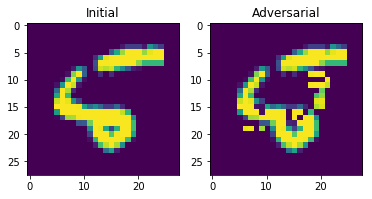

Total distortion: 4.87249182710701
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[ 249.48625  -117.34966  -216.8911   -299.67502  -283.5888     19.17584
    20.623487 -183.66997   364.45154   472.5533  ]] 9
initial_163_1.png
output/mnist/initial_163_1.png output/mnist/adversarial_163_1.png


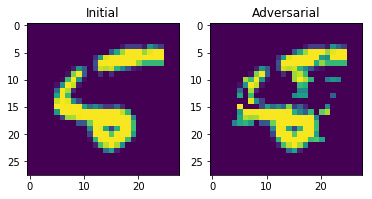

Total distortion: 4.680421494633965
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-377.2111     449.63245    -35.08016   -144.50587    200.24712
     7.7675724 -189.44041    170.80492    243.7804    -140.85541  ]] 1
initial_164_1.png
output/mnist/initial_164_1.png output/mnist/adversarial_164_1.png


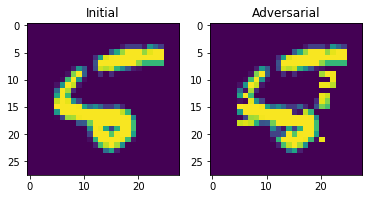

Total distortion: 4.665681235401842
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-156.60431   -46.587677  174.322    -218.21425    28.223682 -177.18933
  -251.49529   -16.349072  381.05936   305.1935  ]] 8
initial_165_1.png
output/mnist/initial_165_1.png output/mnist/adversarial_165_1.png


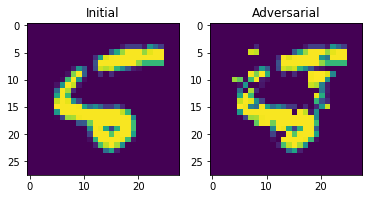

Total distortion: 5.153946795614162
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-272.1581    -22.776035  -57.613453   18.511091  148.19029   -50.30804
  -318.47766     4.036637  300.9751    323.86057 ]] 9
initial_166_1.png
output/mnist/initial_166_1.png output/mnist/adversarial_166_1.png


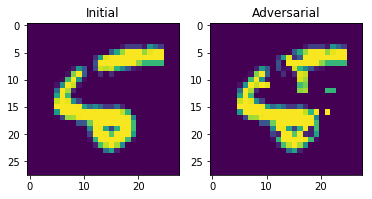

Total distortion: 4.182692771796918
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-681.2876      96.6933    -474.956     -631.36554    786.1648
   396.079       -2.7437367 -133.4701     663.3163     149.6896   ]] 4
initial_167_1.png
output/mnist/initial_167_1.png output/mnist/adversarial_167_1.png


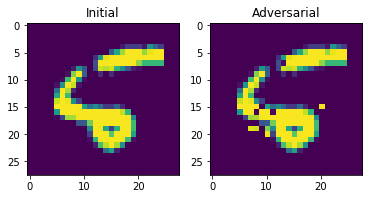

Total distortion: 2.8500685031086723
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[ -19.250677 -119.65861  -619.16345  -778.5875   -257.8196    780.3939
   786.02466  -635.27563   676.83844   198.67468 ]] 6
initial_168_1.png
output/mnist/initial_168_1.png output/mnist/adversarial_168_1.png


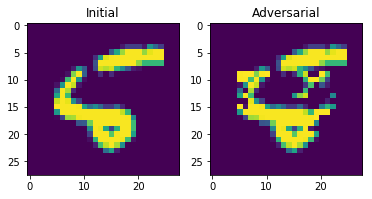

Total distortion: 4.847109706171515
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-514.7531    136.15965    71.98739    15.346156  282.08395  -162.41444
  -477.14856   486.95328   339.1522    -43.095192]] 7
initial_169_1.png
output/mnist/initial_169_1.png output/mnist/adversarial_169_1.png


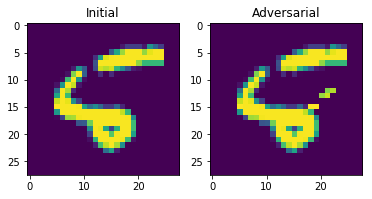

Total distortion: 2.2385253773116274
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-529.3993   -59.15238 -602.5614  -689.9862    95.97793  556.8367
   293.26074 -500.75153 1045.102    477.00778]] 8
initial_170_1.png
output/mnist/initial_170_1.png output/mnist/adversarial_170_1.png


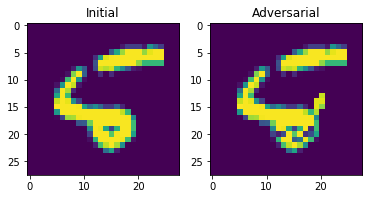

Total distortion: 3.069140494493363
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-678.9097   -196.43018  -571.4156   -673.95544   296.8686    366.0464
    15.446152 -225.97319   992.102     664.06024 ]] 8
initial_171_1.png
output/mnist/initial_171_1.png output/mnist/adversarial_171_1.png


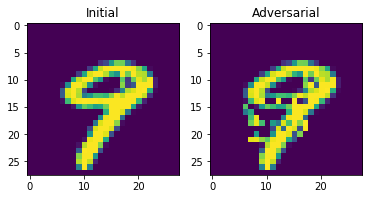

Total distortion: 4.1892669138395355
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[  58.344242 -283.4795    -11.707981 -260.9017    -88.828926 -277.97012
  -450.06937   430.49063   407.62396   389.15076 ]] 7
initial_172_1.png
output/mnist/initial_172_1.png output/mnist/adversarial_172_1.png


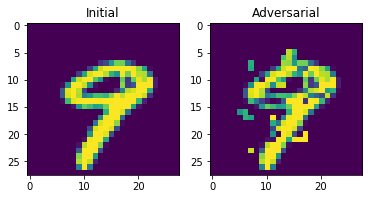

Total distortion: 4.861317139149901
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[ -87.00383   272.96066   194.76624  -132.13759    89.73311  -304.43295
  -181.05943   284.85086   107.956635 -158.12587 ]] 7
initial_173_1.png
output/mnist/initial_173_1.png output/mnist/adversarial_173_1.png


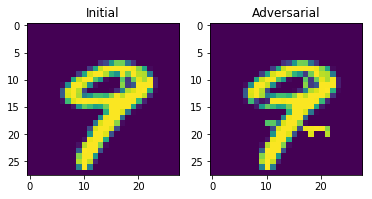

Total distortion: 3.2169415476726613
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-506.6798  -346.2128   404.23865 -107.17039  377.43204 -391.82407
  -631.9795   446.79398  503.93546  297.0677 ]] 8
initial_174_1.png
output/mnist/initial_174_1.png output/mnist/adversarial_174_1.png


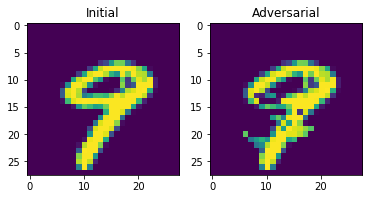

Total distortion: 3.741421105384608
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-343.60437  -218.65704     1.25762   237.25026    24.289444 -202.7192
  -442.03656   187.20576   475.34503   294.76096 ]] 8
initial_175_1.png
output/mnist/initial_175_1.png output/mnist/adversarial_175_1.png


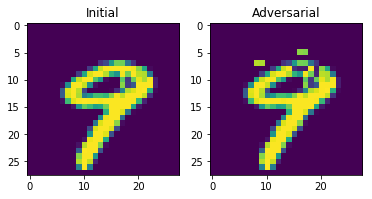

Total distortion: 2.645481136239627
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-863.726    -524.2129   -109.522156 -395.1183   1165.1194   -298.03632
  -768.98126   381.16544   510.13293   977.1805  ]] 4
initial_176_1.png
output/mnist/initial_176_1.png output/mnist/adversarial_176_1.png


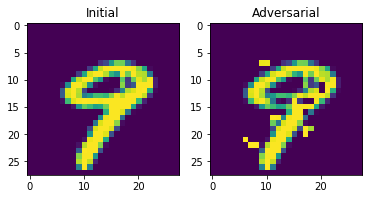

Total distortion: 4.334674603174415
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-340.77063  -165.76935   -62.987583 -267.38782    61.236015   74.11393
  -389.54712   425.27386   471.09573   179.61601 ]] 8
initial_177_1.png
output/mnist/initial_177_1.png output/mnist/adversarial_177_1.png


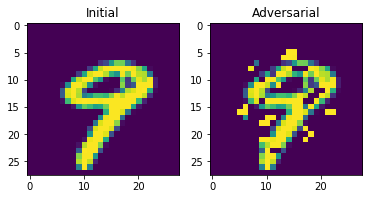

Total distortion: 5.934599157743169
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-144.34108   -92.85437   100.008835 -302.57245   190.06032   -14.711977
   -23.770475  -14.946297  232.52298    78.40265 ]] 8
initial_178_1.png
output/mnist/initial_178_1.png output/mnist/adversarial_178_1.png


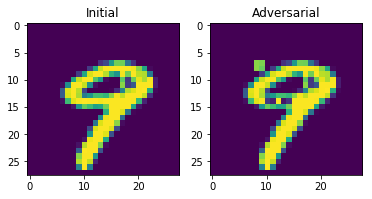

Total distortion: 2.3901406589120997
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-528.38794  -249.27391   -59.971928 -204.21837   334.52097  -271.74008
  -864.4336    892.0453    279.46988   595.5102  ]] 7
initial_179_1.png
output/mnist/initial_179_1.png output/mnist/adversarial_179_1.png


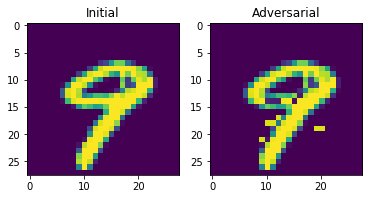

Total distortion: 3.0939609956557566
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-384.11163 -243.26573  117.3444  -201.99026  167.80138 -374.68567
  -662.58984  614.3731   558.0372   380.75952]] 7
initial_180_2.png
output/mnist/initial_180_2.png output/mnist/adversarial_180_2.png


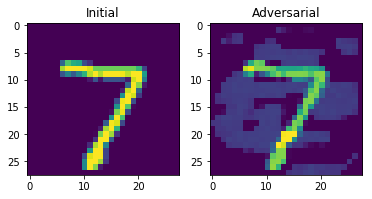

Total distortion: 3.43035284379531
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[ 2.6732700e+02 -8.9706978e+01  2.5563341e+02 -1.4343211e+02
  -2.4901695e+02 -2.0539796e+02 -4.1593661e+02  4.9593991e+02
   3.5324761e-01  1.3049536e+01]] 7
initial_181_2.png
output/mnist/initial_181_2.png output/mnist/adversarial_181_2.png


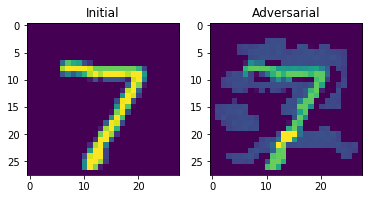

Total distortion: 4.051344829557034
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[ -85.57432   193.61578   237.60634   167.51671  -116.24235  -150.19765
  -381.96167   317.46637     8.242362 -144.54738 ]] 7
initial_182_2.png
output/mnist/initial_182_2.png output/mnist/adversarial_182_2.png


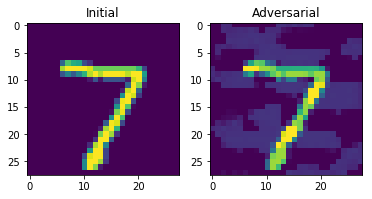

Total distortion: 2.7630310825417874
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[  70.228874 -105.028824  476.2907     16.854195 -207.2535   -378.3415
  -663.1692    660.71075    86.80756   -26.04088 ]] 7
initial_183_2.png
output/mnist/initial_183_2.png output/mnist/adversarial_183_2.png


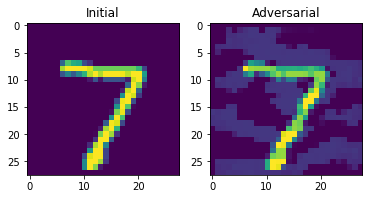

Total distortion: 3.0328333543928157
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[-371.4013    -10.972742  231.71533   510.18436  -201.82863  -216.46265
  -850.45935   649.18695    89.46114   125.74083 ]] 7
initial_184_2.png
output/mnist/initial_184_2.png output/mnist/adversarial_184_2.png


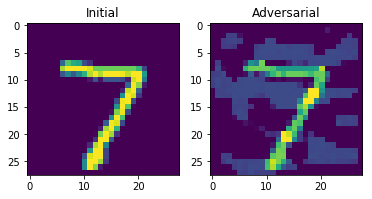

Total distortion: 3.938574992377453
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[-277.4374  -174.40591  245.48138  124.79046  122.12572 -264.69153
  -519.56604  421.88773  213.49907  100.10144]] 7
initial_185_2.png
output/mnist/initial_185_2.png output/mnist/adversarial_185_2.png


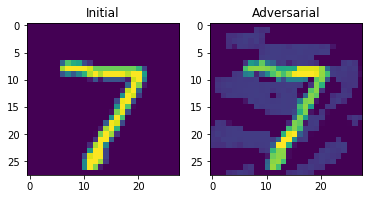

Total distortion: 3.1956622764700757
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[-259.1616  -136.60306 -133.47247  181.35634 -369.15683  158.56557
  -703.31476  578.9905   233.63597  343.40573]] 7
initial_186_2.png
output/mnist/initial_186_2.png output/mnist/adversarial_186_2.png


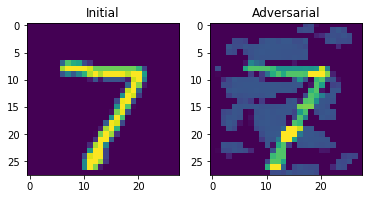

Total distortion: 4.684154282880229
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[-128.05869    42.072025  118.43412  -100.18387   -24.773499  -40.79452
  -159.84341   153.00938   156.47813   -59.003204]] 8
initial_187_2.png
output/mnist/initial_187_2.png output/mnist/adversarial_187_2.png


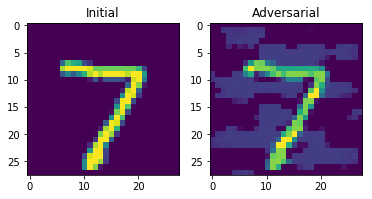

Total distortion: 3.3534365663001915
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[  -1.8340772 -156.44841    223.28198    -25.574488  -195.39473
  -244.56213   -529.873      499.6221     236.31587    110.146805 ]] 7
initial_188_2.png
output/mnist/initial_188_2.png output/mnist/adversarial_188_2.png


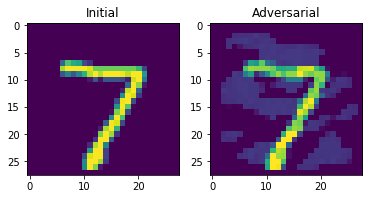

Total distortion: 2.696442740266903
[[ -309.1905      126.54263     178.75099       5.3596663  -351.4835
   -378.14566   -1374.3357     1894.9419       17.759499      8.378942 ]] 7
[[-342.69553 -212.73688   80.11016  148.46187 -258.40707 -252.75043
  -940.8803   787.05554  356.39374  462.8891 ]] 7
initial_189_2.png
output/mnist/initial_189_2.png output/mnist/adversarial_189_2.png


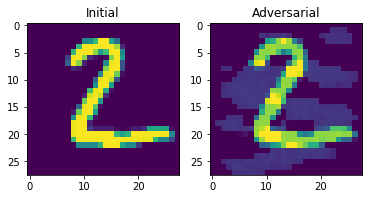

Total distortion: 2.897848146470909
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[ 370.49286  237.06764  456.70642 -113.68929 -266.12744 -255.16594
   403.45526 -614.9038   429.15582 -348.1913 ]] 2
initial_190_2.png
output/mnist/initial_190_2.png output/mnist/adversarial_190_2.png


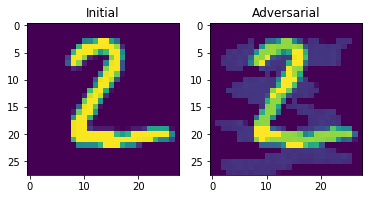

Total distortion: 2.7501411401769102
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[ 147.97978  509.04846  376.2322   219.48506 -180.15765 -326.86578
    69.27818 -414.37393  115.75072 -217.06822]] 1
initial_191_2.png
output/mnist/initial_191_2.png output/mnist/adversarial_191_2.png


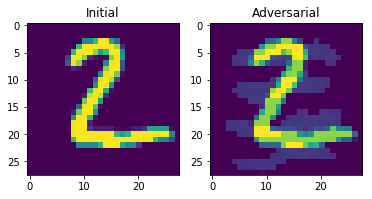

Total distortion: 2.628694386893901
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[ 124.312195  355.2539    368.7637    508.9625   -347.9053   -329.95377
   -11.475151 -448.8579    259.12997  -161.88571 ]] 3
initial_192_2.png
output/mnist/initial_192_2.png output/mnist/adversarial_192_2.png


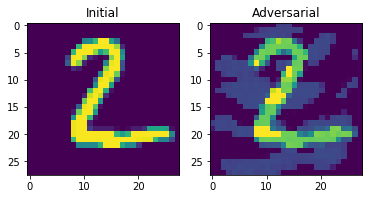

Total distortion: 4.086208706492802
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[-130.06989   445.25272   -18.255375  -56.065304  198.96198  -121.70595
   269.84854  -511.3421    190.42105   -31.911207]] 1
initial_193_2.png
output/mnist/initial_193_2.png output/mnist/adversarial_193_2.png


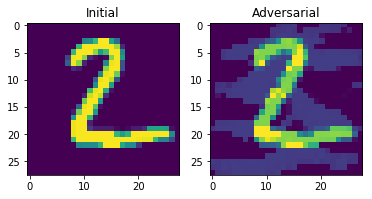

Total distortion: 3.5921847708062438
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[ 121.188736  332.42664   244.28448    61.325294 -151.30774   -39.11005
   291.9543   -509.50247   214.65678  -302.63617 ]] 1
initial_194_2.png
output/mnist/initial_194_2.png output/mnist/adversarial_194_2.png


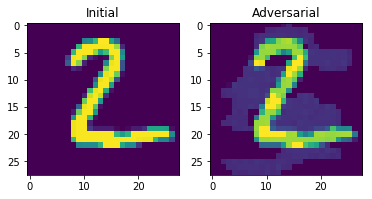

Total distortion: 2.6147660170080136
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[ 297.42844  486.59482  511.8364  -330.50235 -134.72618 -384.11984
   552.4967  -605.3966   251.46793 -440.25693]] 6
initial_195_2.png
output/mnist/initial_195_2.png output/mnist/adversarial_195_2.png


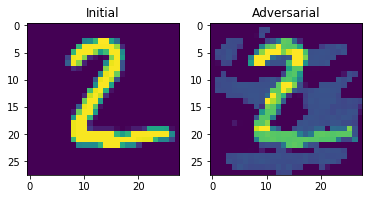

Total distortion: 4.558695003427773
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[  18.576712  329.19272   106.43992   203.7763   -160.7066   -259.48914
  -138.10995   -13.962612  225.06027   -94.175476]] 1
initial_196_2.png
output/mnist/initial_196_2.png output/mnist/adversarial_196_2.png


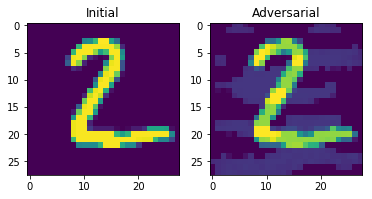

Total distortion: 2.881312365074185
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[ 124.45718   318.50775   373.6564    -23.520006 -214.37514  -210.58688
   351.4008   -571.52216   446.08414  -312.75998 ]] 8
initial_197_2.png
output/mnist/initial_197_2.png output/mnist/adversarial_197_2.png


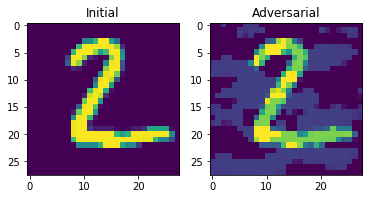

Total distortion: 3.673130681032049
[[ 541.8168   609.2539  1136.1016  -229.45781 -338.231   -736.51917
   343.6677  -571.0417   215.64363 -592.8892 ]] 2
[[ 127.90167   332.406     137.87679   342.63058  -181.56273  -325.92538
    51.954052 -546.4477    189.72873    90.8641  ]] 3
initial_198_2.png
output/mnist/initial_198_2.png output/mnist/adversarial_198_2.png


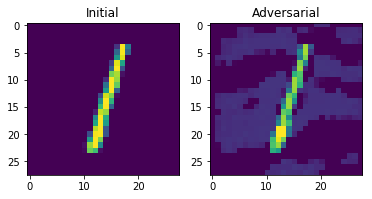

Total distortion: 2.6660467460408857
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-327.04578   651.6622    -54.664852 -124.21553   203.77785   -29.53844
    -9.128492  113.59272    28.027622 -262.88086 ]] 1
initial_199_2.png
output/mnist/initial_199_2.png output/mnist/adversarial_199_2.png


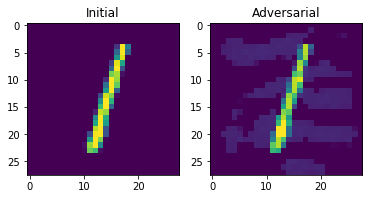

Total distortion: 1.6505099462228534
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-465.33997   926.7502     49.24984  -154.8107    263.89127  -188.71336
   -48.428585  192.89957    64.30237  -413.8854  ]] 1
initial_200_2.png
output/mnist/initial_200_2.png output/mnist/adversarial_200_2.png


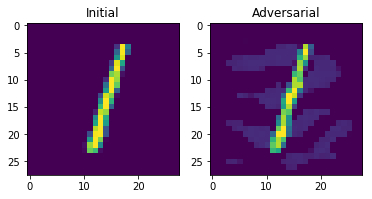

Total distortion: 1.6865025150699902
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-503.43164  700.93195 -140.46834   86.82663  208.31258 -150.20459
  -143.24393  203.4196   152.3918  -191.13725]] 1
initial_201_2.png
output/mnist/initial_201_2.png output/mnist/adversarial_201_2.png


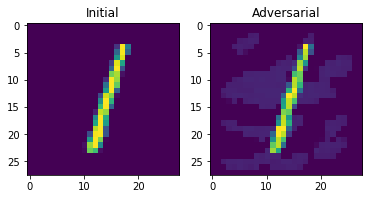

Total distortion: 1.500577974230058
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-591.5443    924.7459   -260.8437   -325.29846   510.01657   -29.206932
    11.096432   98.22205   142.62001  -228.39343 ]] 1
initial_202_2.png
output/mnist/initial_202_2.png output/mnist/adversarial_202_2.png


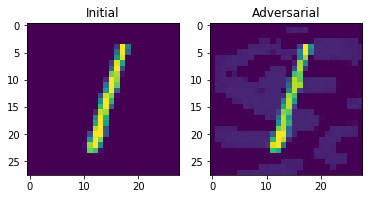

Total distortion: 1.7595917915407726
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-460.64658    817.1598    -113.7411    -199.31403    246.12306
    -3.5617752   49.71602     89.8614     128.47026   -312.28482  ]] 1
initial_203_2.png
output/mnist/initial_203_2.png output/mnist/adversarial_203_2.png


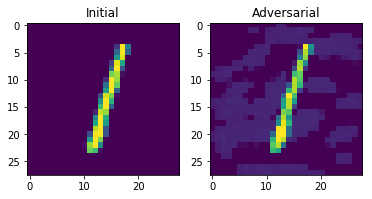

Total distortion: 1.9428276523086956
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-452.73022   872.5698   -146.83089  -309.89108   366.74448    -9.371967
   160.51784   -12.956882   91.780945 -309.41638 ]] 1
initial_204_2.png
output/mnist/initial_204_2.png output/mnist/adversarial_204_2.png


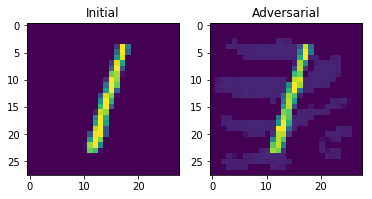

Total distortion: 1.5489352599295831
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-572.77844   965.06586  -214.73878  -142.75754   397.82385  -162.39442
  -161.38844   381.3629     40.085556 -285.2122  ]] 1
initial_205_2.png
output/mnist/initial_205_2.png output/mnist/adversarial_205_2.png


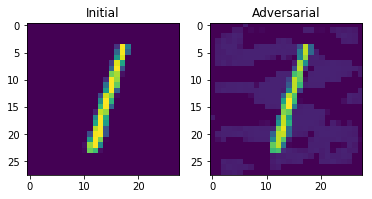

Total distortion: 1.6549205842801182
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-541.3638    888.1767   -107.472374 -200.43167   301.5029   -139.51022
   -44.833683  173.30966   226.7074   -314.44745 ]] 1
initial_206_2.png
output/mnist/initial_206_2.png output/mnist/adversarial_206_2.png


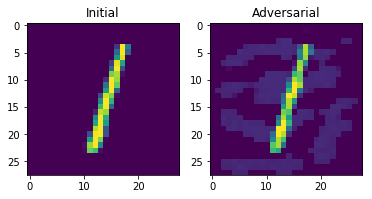

Total distortion: 1.8947183732895003
[[-619.5072  1438.9019  -135.01636 -425.78766  439.46158 -256.1177
   -51.80477  273.96643  114.77191 -491.99063]] 1
[[-532.32404   786.57587  -287.0515    -99.99328   361.73892   -48.803032
   -76.48627   188.18608    57.224224 -130.23361 ]] 1
initial_207_2.png
output/mnist/initial_207_2.png output/mnist/adversarial_207_2.png


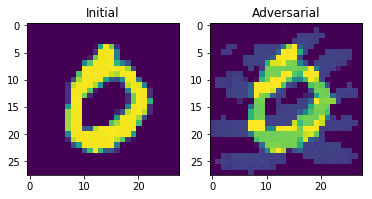

Total distortion: 3.686714605970533
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 275.8932      260.4949     -195.97302     -92.25855      19.745012
    -0.31038484  -48.469345    171.84114    -202.47115    -131.99832   ]] 0
initial_208_2.png
output/mnist/initial_208_2.png output/mnist/adversarial_208_2.png


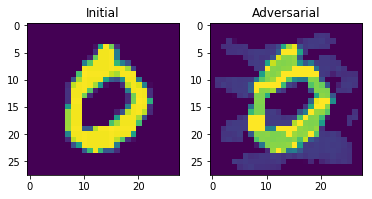

Total distortion: 3.036803516552319
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 460.98572     -3.8838067   60.21669   -216.80692    -22.655863
  -184.20012   -118.24248    216.75775   -134.41176    -76.268555 ]] 0
initial_209_2.png
output/mnist/initial_209_2.png output/mnist/adversarial_209_2.png


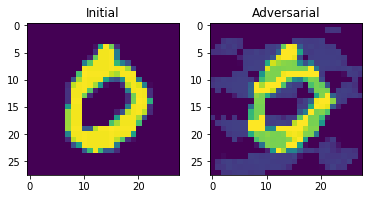

Total distortion: 3.4460615870484608
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 302.17142    41.28916   -87.66117   -56.782185   39.54887  -101.85311
   -39.23693    56.20127  -155.03531   -18.532274]] 0
initial_210_2.png
output/mnist/initial_210_2.png output/mnist/adversarial_210_2.png


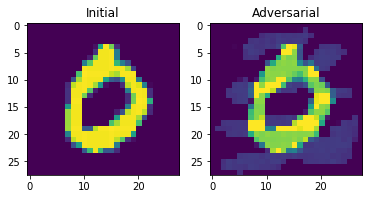

Total distortion: 3.0194169154857504
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 452.51907    72.83773  -151.07936  -144.67805   229.51749  -261.23392
    68.198586   19.875832 -293.0024     14.090056]] 0
initial_211_2.png
output/mnist/initial_211_2.png output/mnist/adversarial_211_2.png


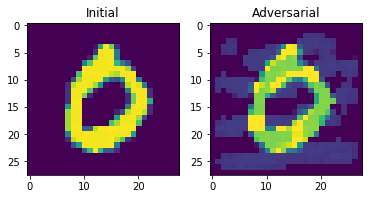

Total distortion: 3.295263683089544
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 377.70197      2.6609263 -142.93324    -71.966      -80.07263
     7.8605785  -70.10167     85.922035  -127.029755    19.56797  ]] 0
initial_212_2.png
output/mnist/initial_212_2.png output/mnist/adversarial_212_2.png


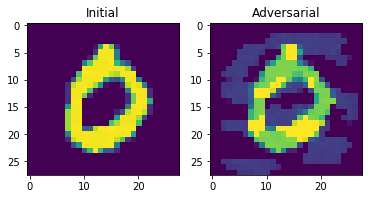

Total distortion: 3.4278122765364247
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 498.09665    77.93327  -133.76886  -175.22498   152.05434  -165.0149
   304.2349   -158.38466  -314.83615   -28.004305]] 0
initial_213_2.png
output/mnist/initial_213_2.png output/mnist/adversarial_213_2.png


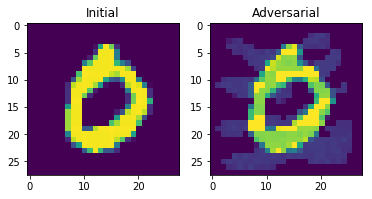

Total distortion: 2.8809734153805366
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 468.8142     35.97702  -100.148735 -198.60875   -32.174923 -160.26315
  -112.17621   268.7122   -168.47876   -25.611462]] 0
initial_214_2.png
output/mnist/initial_214_2.png output/mnist/adversarial_214_2.png


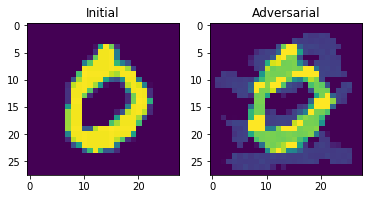

Total distortion: 3.3799735263487434
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 276.27692    28.089632  -17.292141 -116.35625   -42.252087  -95.01033
  -126.26741   176.82687   -20.129332  -55.321247]] 0
initial_215_2.png
output/mnist/initial_215_2.png output/mnist/adversarial_215_2.png


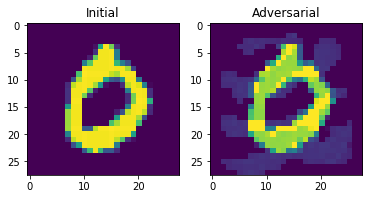

Total distortion: 2.541730119090344
[[1450.1858   -113.426186  -63.416775 -528.8309   -117.01193  -411.89188
   285.76343    43.31649  -443.50967   -94.370834]] 0
[[ 571.56494    -42.884666  -173.3971    -201.36601    106.30273
  -258.87924      4.6028953  102.911995  -261.14114    115.12727  ]] 0
initial_216_2.png
output/mnist/initial_216_2.png output/mnist/adversarial_216_2.png


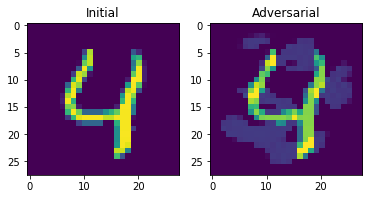

Total distortion: 2.5645529734108
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[ 140.5853  -182.4432  -196.7254  -389.5142   783.2334  -493.21588
  -119.47812 -143.1157   207.5714   437.03775]] 4
initial_217_2.png
output/mnist/initial_217_2.png output/mnist/adversarial_217_2.png


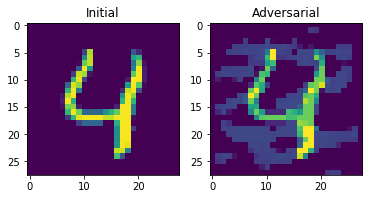

Total distortion: 3.5434080143902866
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[ -29.624968    79.02554      1.3098317 -163.22804    491.0282
  -440.76785   -174.36584    122.32729    108.99167    133.5464   ]] 4
initial_218_2.png
output/mnist/initial_218_2.png output/mnist/adversarial_218_2.png


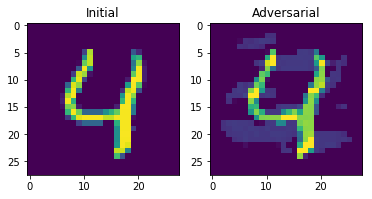

Total distortion: 2.44194408138402
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[ -68.35881  -138.18779     6.798546 -288.28317   686.12885  -548.5375
  -293.85492    40.29524   292.9514    392.0624  ]] 4
initial_219_2.png
output/mnist/initial_219_2.png output/mnist/adversarial_219_2.png


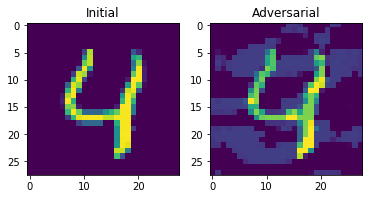

Total distortion: 3.291270912298112
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[-109.13147  -191.63177  -173.19545    40.510147  661.59924  -478.71414
  -367.71265   -54.6093    308.55252   454.93796 ]] 4
initial_220_2.png
output/mnist/initial_220_2.png output/mnist/adversarial_220_2.png


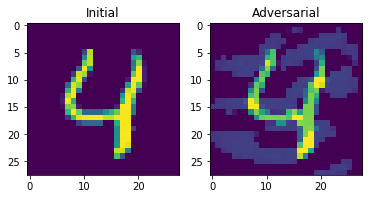

Total distortion: 3.3155210142520986
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[-295.70682  -190.25732  -329.164     -93.348755  652.5375    -75.46103
  -183.67603  -262.707     432.25778   471.9076  ]] 4
initial_221_2.png
output/mnist/initial_221_2.png output/mnist/adversarial_221_2.png


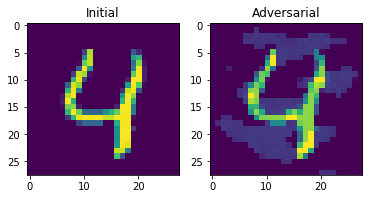

Total distortion: 2.6260283136286806
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[ -92.72301  -90.50798 -298.0049  -451.18658  953.4906  -316.85535
    67.38859 -284.35522  332.3862   351.04846]] 4
initial_222_2.png
output/mnist/initial_222_2.png output/mnist/adversarial_222_2.png


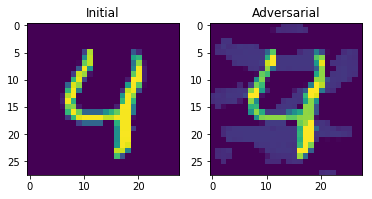

Total distortion: 2.6574929414728974
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[ -21.80705   -50.958004 -154.17609  -271.70358   744.1861   -463.95883
  -295.80447   258.88162    11.003488  341.00583 ]] 4
initial_223_2.png
output/mnist/initial_223_2.png output/mnist/adversarial_223_2.png


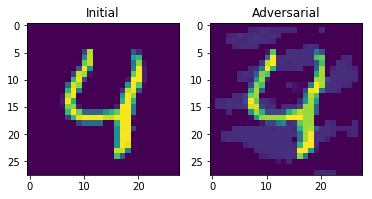

Total distortion: 2.2369550201095705
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[-135.53282 -256.55075 -218.02858 -252.68718  821.5764  -504.94897
  -321.31445 -119.34417  454.30005  605.80035]] 4
initial_224_2.png
output/mnist/initial_224_2.png output/mnist/adversarial_224_2.png


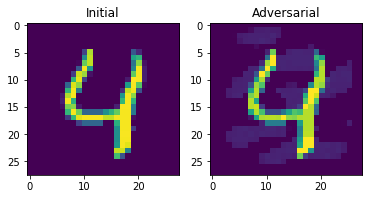

Total distortion: 1.5524410714531076
[[-334.5706  -191.44656 -418.1317  -744.9158  2312.862   -526.22736
  -199.49503 -125.58962 -318.97797  757.88196]] 4
[[-153.70096  -298.6771   -414.0283   -392.30838  1270.9783   -651.7267
  -425.5785    -70.752174  147.90245  1031.5114  ]] 4
initial_225_2.png
output/mnist/initial_225_2.png output/mnist/adversarial_225_2.png


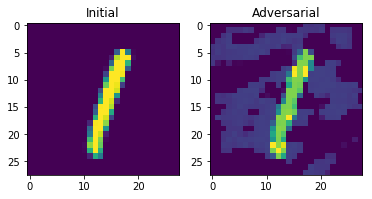

Total distortion: 3.359610473896627
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-395.84967   678.2207    -34.957123 -157.08278   179.87636  -182.87054
  -162.76794   246.55116   214.3957   -250.15628 ]] 1
initial_226_2.png
output/mnist/initial_226_2.png output/mnist/adversarial_226_2.png


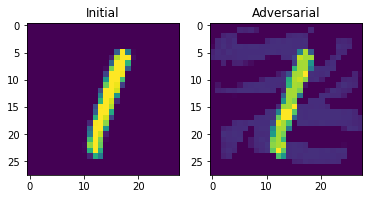

Total distortion: 2.2760104272533157
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-603.05963 1035.3762    69.95817 -144.73843  288.73718 -360.59125
  -285.28857  473.98227  163.8814  -440.4837 ]] 1
initial_227_2.png
output/mnist/initial_227_2.png output/mnist/adversarial_227_2.png


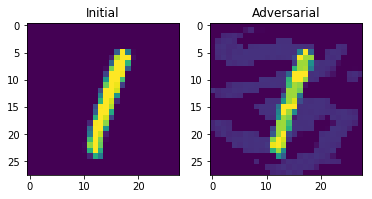

Total distortion: 2.4237008380281386
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-629.8577   827.1038  -136.28389  144.21254  257.25552 -251.94244
  -330.46164  524.74084  139.97469 -286.09015]] 1
initial_228_2.png
output/mnist/initial_228_2.png output/mnist/adversarial_228_2.png


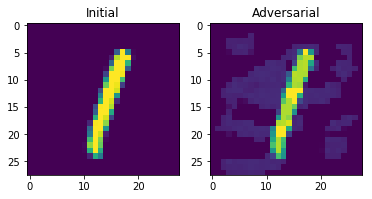

Total distortion: 1.8456761272413698
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-770.77936  1211.0259   -298.73605  -348.0779    726.8814   -152.54398
  -135.78056   319.94247    21.273129 -297.62796 ]] 1
initial_229_2.png
output/mnist/initial_229_2.png output/mnist/adversarial_229_2.png


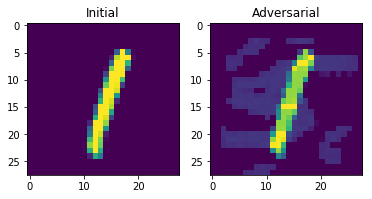

Total distortion: 2.368783343641577
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-569.6778    871.7748   -226.97632  -230.67798   363.0614    -10.846861
  -120.47001   271.50613   200.92268  -286.07706 ]] 1
initial_230_2.png
output/mnist/initial_230_2.png output/mnist/adversarial_230_2.png


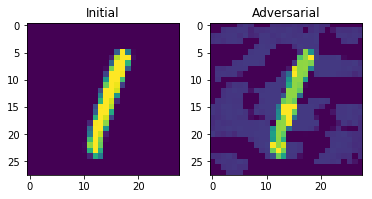

Total distortion: 3.2423785417642494
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-574.56714  924.08716 -120.87918 -317.10458  370.91446 -164.6312
   -69.04724  213.05391  286.74612 -346.86456]] 1
initial_231_2.png
output/mnist/initial_231_2.png output/mnist/adversarial_231_2.png


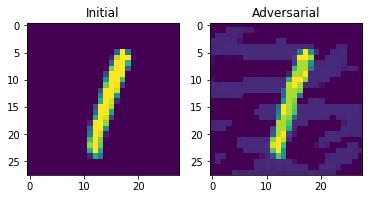

Total distortion: 2.1957387272856934
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-669.2996   1127.3086   -138.60756   -50.546516  368.47885  -315.45685
  -343.90137   665.80475    16.87308  -396.33148 ]] 1
initial_232_2.png
output/mnist/initial_232_2.png output/mnist/adversarial_232_2.png


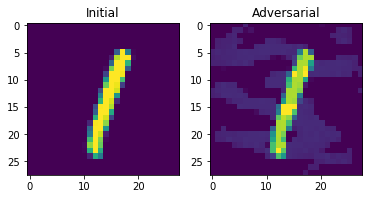

Total distortion: 2.017722406241424
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-620.1564    930.6918    -58.226807 -261.36447   345.7346   -289.6783
  -161.95769   234.2658    372.48346  -284.34256 ]] 1
initial_233_2.png
output/mnist/initial_233_2.png output/mnist/adversarial_233_2.png


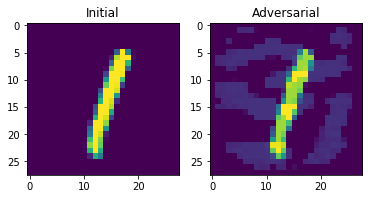

Total distortion: 2.3250636512493243
[[-732.95667 1780.3467  -238.96283 -497.07578  568.4474  -454.95407
  -212.32162  518.9533    70.10064 -508.7725 ]] 1
[[-652.18585   838.2572   -277.64987  -115.89585   397.79376  -273.66718
  -277.92258   386.88968   271.69107   -93.105804]] 1
initial_234_2.png
output/mnist/initial_234_2.png output/mnist/adversarial_234_2.png


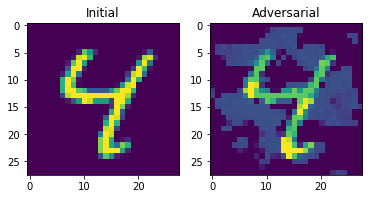

Total distortion: 4.372399565479473
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[ -91.05243   -72.345375   80.29423  -212.89107   203.09273   -37.794735
   -33.849445 -103.69193   290.36374    77.77766 ]] 8
initial_235_2.png
output/mnist/initial_235_2.png output/mnist/adversarial_235_2.png


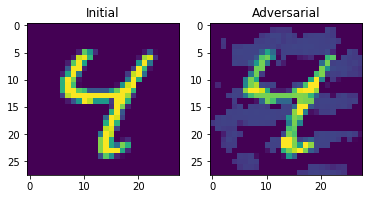

Total distortion: 3.592859041646311
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-491.82025    143.6834     -32.1054    -265.3764     505.42868
   -77.377     -146.40048      3.2175183  438.64066     84.930984 ]] 4
initial_236_2.png
output/mnist/initial_236_2.png output/mnist/adversarial_236_2.png


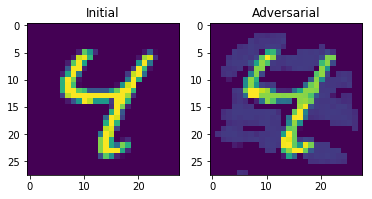

Total distortion: 3.0027234113603996
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-335.84152  -131.64655   263.48187  -179.18156   290.1374   -173.11313
  -279.7343     31.280458  374.89236   234.87549 ]] 8
initial_237_2.png
output/mnist/initial_237_2.png output/mnist/adversarial_237_2.png


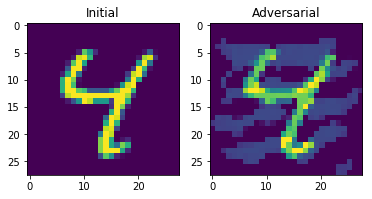

Total distortion: 3.807580619454435
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-4.3998602e+02 -4.2910328e+01 -1.1867054e+02  1.7721596e+02
   2.3882935e+02  1.1430658e-02 -2.7612088e+02  1.3894560e+02
   4.4452997e+02  1.3731059e+02]] 8
initial_238_2.png
output/mnist/initial_238_2.png output/mnist/adversarial_238_2.png


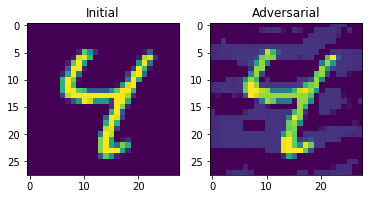

Total distortion: 2.863317221380458
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-577.4778    -35.908737 -175.47638  -200.14395   417.7404    124.58917
  -170.90887   -12.091911  553.2738    202.38844 ]] 8
initial_239_2.png
output/mnist/initial_239_2.png output/mnist/adversarial_239_2.png


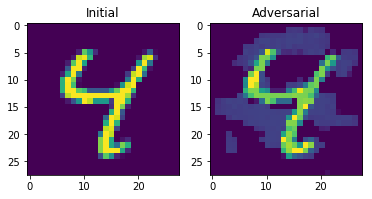

Total distortion: 3.2153539426574023
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-383.2942    -14.621851 -239.97755  -465.9792    510.4414     -3.180128
   146.8199   -321.66937   630.51904   235.82953 ]] 8
initial_240_2.png
output/mnist/initial_240_2.png output/mnist/adversarial_240_2.png


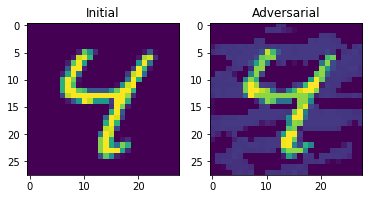

Total distortion: 3.245948173113906
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-691.60474  -108.07735  -115.84122  -161.14665   533.11676   -24.287798
  -355.19833   271.07584   532.778     257.9571  ]] 4
initial_241_2.png
output/mnist/initial_241_2.png output/mnist/adversarial_241_2.png


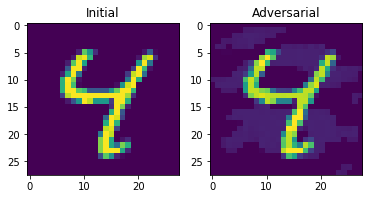

Total distortion: 1.5875815903730142
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-721.97864 -224.55946 -265.4881  -437.0547   822.769   -208.79193
  -329.1199  -114.84178  848.07697  695.846  ]] 8
initial_242_2.png
output/mnist/initial_242_2.png output/mnist/adversarial_242_2.png


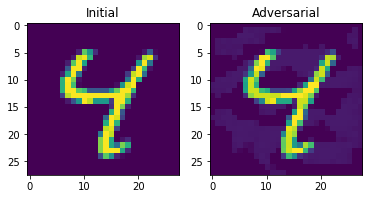

Total distortion: 1.281279214665499
[[-946.1493  -101.07997 -428.23956 -790.0758  1530.0645  -315.8512
  -369.34503 -176.6592   805.9507   944.24347]] 4
[[-889.46155 -305.36096 -357.20255 -485.42502 1157.413   -342.28592
  -525.98016 -103.78451  828.448   1075.5933 ]] 4
initial_243_2.png
output/mnist/initial_243_2.png output/mnist/adversarial_243_2.png


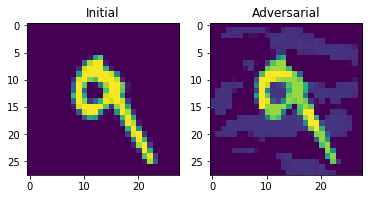

Total distortion: 2.5756915080595233
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-266.3689     97.08036    71.26438  -206.17888    87.54808   -69.70929
  -198.56158     8.495871  619.79333    18.83817 ]] 8
initial_244_2.png
output/mnist/initial_244_2.png output/mnist/adversarial_244_2.png


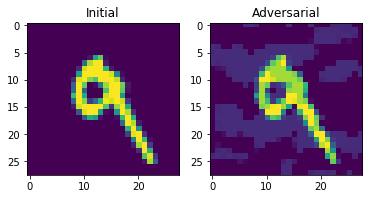

Total distortion: 2.35351309241954
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-550.19684   358.91644    88.062225  -23.995049  202.99254  -192.71045
  -330.51917    61.38754   612.7442     18.480015]] 8
initial_245_2.png
output/mnist/initial_245_2.png output/mnist/adversarial_245_2.png


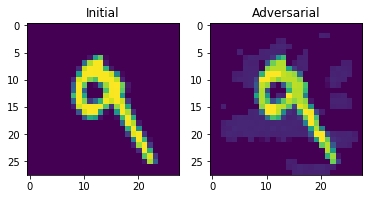

Total distortion: 1.5891742468207892
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-581.4918   216.45676  121.31402   -4.35624  211.78648 -224.55583
  -439.76328  128.75023  669.0607   137.83972]] 8
initial_246_2.png
output/mnist/initial_246_2.png output/mnist/adversarial_246_2.png


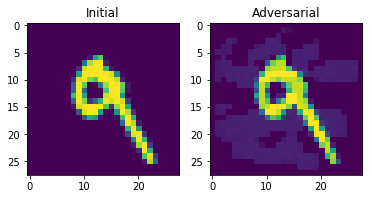

Total distortion: 1.6543350665695535
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-664.4111     55.614075  -92.07301   379.04306    13.04306   -40.26622
  -544.37195    73.22862   770.10156   303.992   ]] 8
initial_247_2.png
output/mnist/initial_247_2.png output/mnist/adversarial_247_2.png


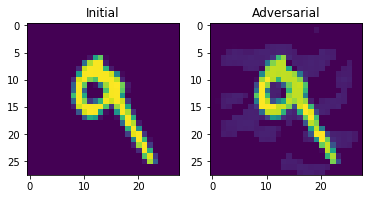

Total distortion: 1.418952285528935
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-701.563      93.1098   -148.81671  -230.1269    628.479     -94.398384
  -444.37302    65.832085  614.40857   442.37875 ]] 4
initial_248_2.png
output/mnist/initial_248_2.png output/mnist/adversarial_248_2.png


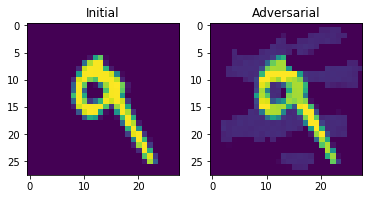

Total distortion: 2.004431821078982
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-632.5363    149.4419   -131.4878    -74.20679   199.01326   105.28275
  -319.34326   142.01549   759.10046    66.783035]] 8
initial_249_2.png
output/mnist/initial_249_2.png output/mnist/adversarial_249_2.png


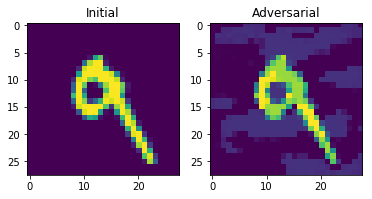

Total distortion: 2.6226999105910695
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-362.78198    218.38396    -38.01571   -270.5651     277.06497
   -48.374634   -68.29237   -136.57495    627.8175       1.0146688]] 8
initial_250_2.png
output/mnist/initial_250_2.png output/mnist/adversarial_250_2.png


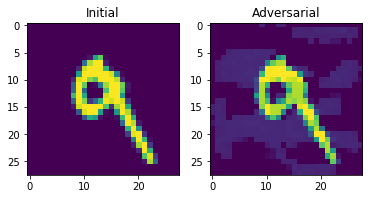

Total distortion: 2.0561926372840396
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-581.0445    151.31918   119.658646   31.092083  100.525894 -160.00641
  -547.8936    349.07364   583.4048    144.47885 ]] 8
initial_251_2.png
output/mnist/initial_251_2.png output/mnist/adversarial_251_2.png


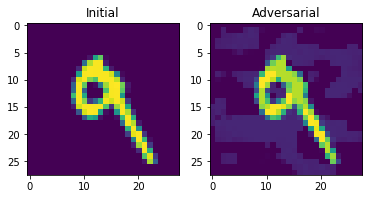

Total distortion: 1.937461360423047
[[-737.22565   -64.144585 -370.1493     15.789205  335.82742   -60.9698
  -720.0401     71.971825  726.7956    902.9189  ]] 9
[[-607.302     200.1637     39.604263   77.051094  162.08072  -183.78249
  -392.1656    -16.553303  834.1696    162.33891 ]] 8
initial_252_2.png
output/mnist/initial_252_2.png output/mnist/adversarial_252_2.png


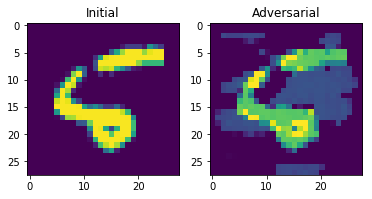

Total distortion: 4.1735568996018095
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[  33.17219     46.55809   -154.76442   -109.34618    -45.325726
    40.495518   -80.75682      5.9087567  173.14073    136.54242  ]] 8
initial_253_2.png
output/mnist/initial_253_2.png output/mnist/adversarial_253_2.png


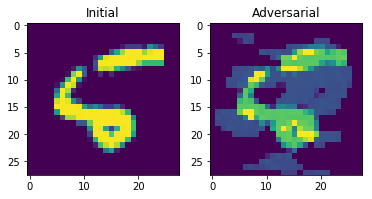

Total distortion: 4.429336991478751
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-154.3356     384.23788      5.201046  -123.500435    32.586887
    -7.6903763  -53.739136   -44.508053   263.65964   -137.84215  ]] 1
initial_254_2.png
output/mnist/initial_254_2.png output/mnist/adversarial_254_2.png


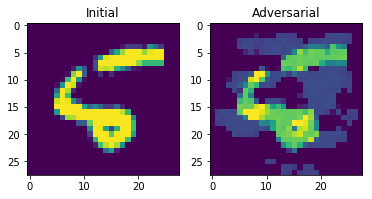

Total distortion: 4.013682804881712
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-192.51776  193.65837  132.15945 -167.12035  116.1443   -34.43282
   -43.28497  -58.83958  290.2754  -116.54372]] 8
initial_255_2.png
output/mnist/initial_255_2.png output/mnist/adversarial_255_2.png


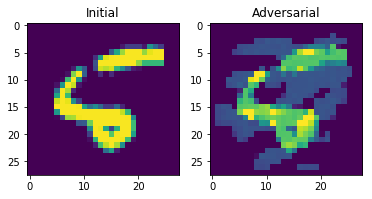

Total distortion: 4.516256426847031
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-337.88983   264.41144    31.505732  105.211105  200.88954  -173.38306
  -298.9695    275.63705   202.3186   -102.87268 ]] 7
initial_256_2.png
output/mnist/initial_256_2.png output/mnist/adversarial_256_2.png


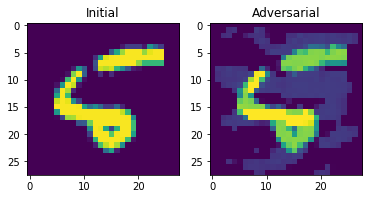

Total distortion: 3.154577132963685
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-537.46857   112.184494 -405.91333  -444.48816   551.85565   227.0602
   -88.080154  -27.746471  559.03595   188.45142 ]] 8
initial_257_2.png
output/mnist/initial_257_2.png output/mnist/adversarial_257_2.png


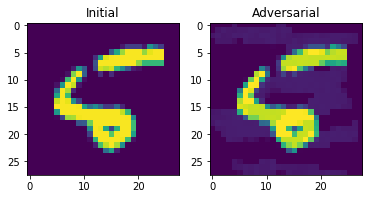

Total distortion: 1.4840482653354692
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-218.49007   -33.03897  -585.8297   -748.7477     14.284784  596.10876
   557.5831   -566.55835   760.8263    275.00946 ]] 8
initial_258_2.png
output/mnist/initial_258_2.png output/mnist/adversarial_258_2.png


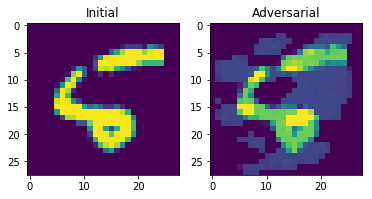

Total distortion: 3.939232702334566
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-656.468    284.5921  -278.31525 -314.47498  368.61923  129.64653
  -309.44043  391.86658  440.70828   80.44396]] 8
initial_259_2.png
output/mnist/initial_259_2.png output/mnist/adversarial_259_2.png


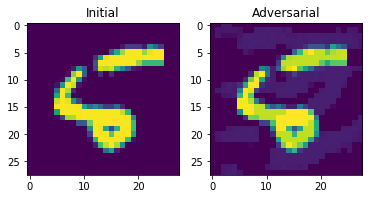

Total distortion: 1.5996202554670405
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-5.0480627e+02  4.7663316e-02 -6.0620038e+02 -7.0300537e+02
   1.9416994e+02  5.2982855e+02  2.9987448e+02 -4.3684103e+02
   9.3876361e+02  3.8458167e+02]] 8
initial_260_2.png
output/mnist/initial_260_2.png output/mnist/adversarial_260_2.png


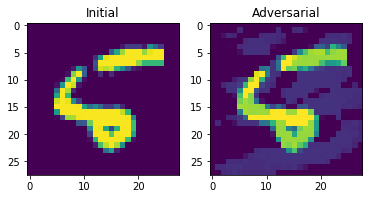

Total distortion: 2.687819883249709
[[-426.15927   -63.86515  -837.42535  -845.5212    -33.853073 1052.9113
   624.0122   -630.89294   864.7756    434.37122 ]] 5
[[-480.6833     -79.851494  -617.6764    -510.75565    249.41916
   387.6091      -1.9761891 -223.1387     713.8803     599.10065  ]] 8
initial_261_2.png
output/mnist/initial_261_2.png output/mnist/adversarial_261_2.png


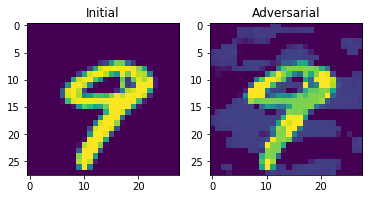

Total distortion: 3.5787015891789706
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-106.07469    -49.484417   174.76642   -240.49251    198.30782
  -202.87692   -236.00705    304.38126    203.91786      2.2960274]] 7
initial_262_2.png
output/mnist/initial_262_2.png output/mnist/adversarial_262_2.png


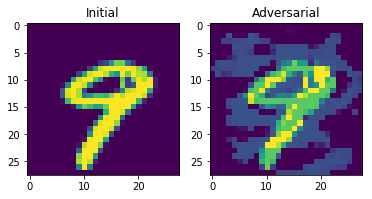

Total distortion: 4.6991408191792425
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[  11.328919  256.09622   174.07932   -69.53544    83.7621   -199.35747
  -150.50629   207.46953    27.253887 -228.9482  ]] 1
initial_263_2.png
output/mnist/initial_263_2.png output/mnist/adversarial_263_2.png


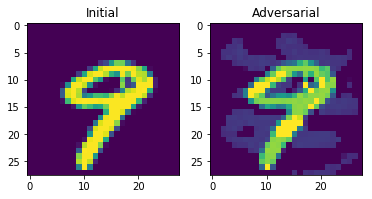

Total distortion: 2.835920517715596
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-312.23483  -240.29015   296.76135  -119.057304  265.61508  -224.79857
  -409.5429    299.76535   266.2216    182.03706 ]] 7
initial_264_2.png
output/mnist/initial_264_2.png output/mnist/adversarial_264_2.png


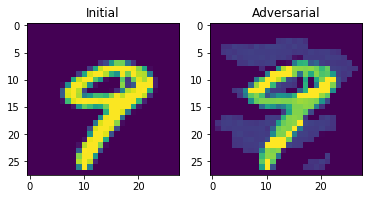

Total distortion: 3.0231072297203907
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-512.541    -216.16916    61.611576  323.65103   284.88962  -193.19588
  -556.91614   347.94      334.27655   236.19162 ]] 7
initial_265_2.png
output/mnist/initial_265_2.png output/mnist/adversarial_265_2.png


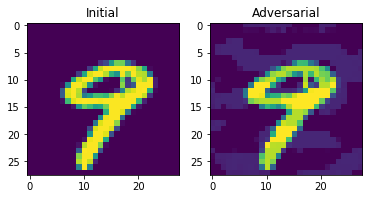

Total distortion: 1.9850343825199546
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-720.4878   -506.87643    51.117954 -296.42264   866.73486  -220.60144
  -681.85504   323.315     510.3789    734.06604 ]] 4
initial_266_2.png
output/mnist/initial_266_2.png output/mnist/adversarial_266_2.png


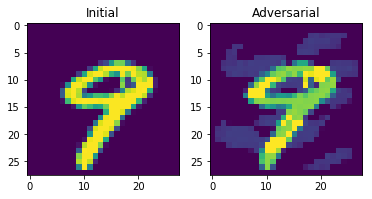

Total distortion: 2.9281646432706934
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-429.064    -87.74547 -231.8329  -225.03345  157.25471  204.16815
  -405.30765  457.76462  397.5739   200.1476 ]] 7
initial_267_2.png
output/mnist/initial_267_2.png output/mnist/adversarial_267_2.png


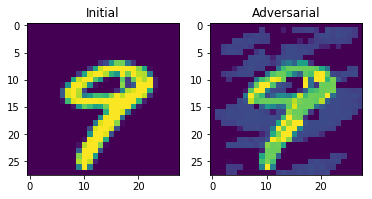

Total distortion: 4.143487595755146
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-120.991455   35.58046    22.545185 -283.99695   190.62932   -94.315216
   -71.76028   202.06822   164.52205   -43.13733 ]] 7
initial_268_2.png
output/mnist/initial_268_2.png output/mnist/adversarial_268_2.png


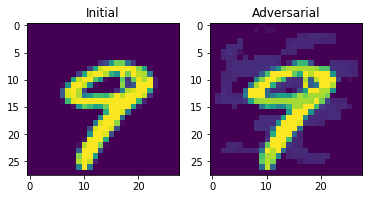

Total distortion: 2.0291797358139663
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-492.1713  -163.07898  -73.43219 -241.86996  232.825   -159.09058
  -754.7373   807.896    326.8118   455.84277]] 7
initial_269_2.png
output/mnist/initial_269_2.png output/mnist/adversarial_269_2.png


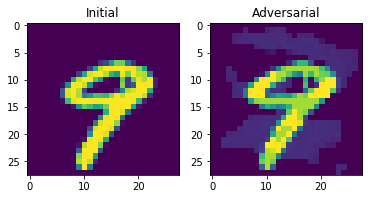

Total distortion: 2.2505158786649986
[[ -809.93744  -627.1726   -219.94267  -267.09518   653.73364  -260.70578
  -1049.4702    538.2508    544.9718   1381.0996 ]] 9
[[-603.8765   -427.28375    -7.464527 -102.809494  466.64438  -201.51102
  -535.7848    282.67743   687.896     518.4939  ]] 8
270 {'l2': 39, 'l0': 44, 'li': 42} {'l2': 79.61402870488351, 'l0': 169.98403148526512, 'li': 126.0020793872515}
l2 average =  0.29486677298105 2.0413853514072695
l0 average =  0.6295704869824634 3.8632734428469346
li average =  0.4666743681009315 3.0000495092202737


In [3]:
with tf.Session() as sess:
        
    model = MNISTModel("inputs/model/mnist-distilled-100", sess)
        
    # mnist
    test_adversarials(model, 'output/mnist/', [28,28], 1)
    

In [4]:
!echo "Test Transferability"


Test Transferability


initial_0_0.png
output/cifar/initial_0_0.png output/cifar/adversarial_0_0.png


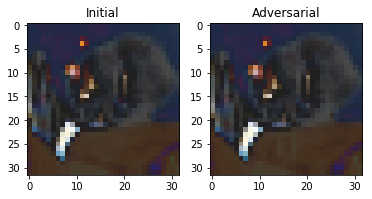

Total distortion: 0.6127318089577474
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 6.9235473  -9.506258    0.97420025  8.791236   -0.25868034 -1.0478739
  -3.1109304  -3.3848684   7.145886   -3.0511363 ]] 3
initial_1_0.png
output/cifar/initial_1_0.png output/cifar/adversarial_1_0.png


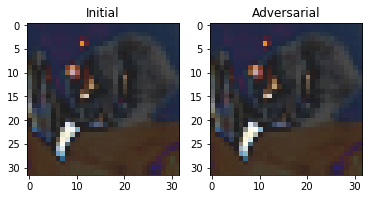

Total distortion: 0.620599874235639
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 4.073086   -7.2366333  -0.61868393 10.534699   -1.7608111  -0.48568165
  -1.3259212  -2.7523968   5.43942    -2.5963705 ]] 3
initial_2_0.png
output/cifar/initial_2_0.png output/cifar/adversarial_2_0.png


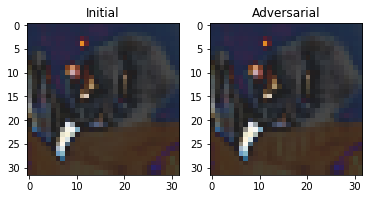

Total distortion: 0.604863066900658
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[  6.6503053  -10.8463       3.292786     7.926652     0.7206945
    0.39263725  -4.280364    -1.2418653    6.2452683   -4.692206  ]] 3
initial_3_0.png
output/cifar/initial_3_0.png output/cifar/adversarial_3_0.png


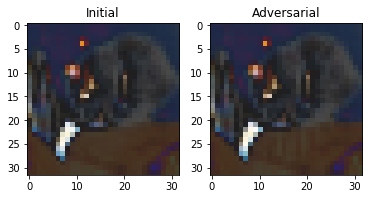

Total distortion: 0.6434958724843213
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[  6.8670173 -10.695128    3.0502868   7.999197    2.1657858   0.5872123
   -4.035583   -2.08005     5.332972   -5.258254 ]] 3
initial_4_0.png
output/cifar/initial_4_0.png output/cifar/adversarial_4_0.png


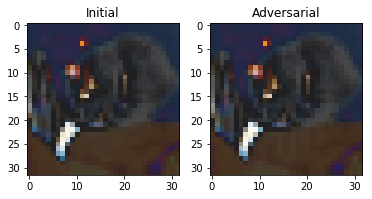

Total distortion: 0.4478321735029649
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 5.791288   -8.955106    0.22454825  9.529317   -1.2740675   1.2735037
  -3.0021076  -2.4538908   4.756996   -2.9761128 ]] 3
initial_5_0.png
output/cifar/initial_5_0.png output/cifar/adversarial_5_0.png


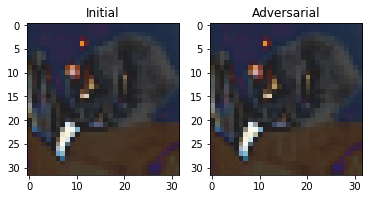

Total distortion: 0.5321353659235117
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 5.079559   -8.976253    1.3071785   9.084067    0.02471367  0.26557663
  -2.2592378  -2.2863607   5.1752133  -3.679262  ]] 3
initial_6_0.png
output/cifar/initial_6_0.png output/cifar/adversarial_6_0.png


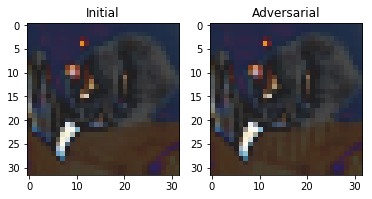

Total distortion: 1.032088083670296
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[  5.2019544  -10.37308      2.6186304    7.0902905    0.54392064
    1.945856    -4.000115    -1.3057449    5.607545    -4.009647  ]] 3
initial_7_0.png
output/cifar/initial_7_0.png output/cifar/adversarial_7_0.png


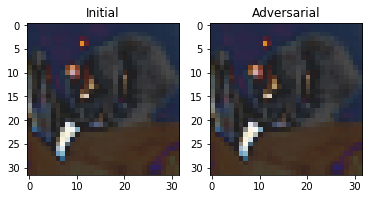

Total distortion: 0.3652326206430334
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 5.294583   -7.9914536  -0.4680427  10.229802   -2.021357   -0.45717978
  -2.1830952  -2.9681094   6.4410305  -2.4008098 ]] 3
initial_8_0.png
output/cifar/initial_8_0.png output/cifar/adversarial_8_0.png


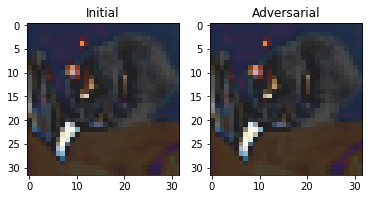

Total distortion: 0.483833225345939
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 4.8969884 -7.658702  -0.5510025  9.781127  -2.2694213 -0.163505
  -2.4099162 -2.6362088  6.020661  -1.9160907]] 3
initial_9_0.png
output/cifar/initial_9_0.png output/cifar/adversarial_9_0.png


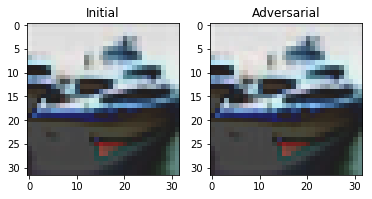

Total distortion: 0.9237604741495068
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 33.537727    6.524441   -3.6825233  -2.8535645  -1.851603  -25.311321
  -13.201708  -18.161148   29.244604    6.379156 ]] 0
initial_10_0.png
output/cifar/initial_10_0.png output/cifar/adversarial_10_0.png


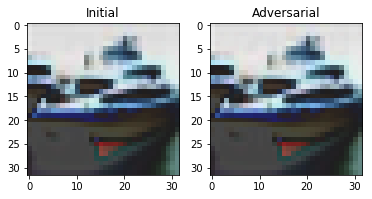

Total distortion: 0.597302675064805
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 34.518238   8.043619  -2.636887  -2.937144  -3.518568 -27.185991
  -13.58326  -20.446653  35.220432   5.271802]] 8
initial_11_0.png
output/cifar/initial_11_0.png output/cifar/adversarial_11_0.png


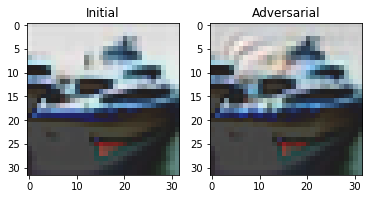

Total distortion: 4.2289567466214315
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 18.562418     8.919027    -3.1206408   -0.21059409  -3.6216254
  -15.600156    -8.892506   -11.720568    14.278988     5.8664083 ]] 0
initial_12_0.png
output/cifar/initial_12_0.png output/cifar/adversarial_12_0.png


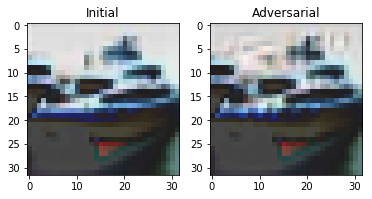

Total distortion: 3.148882737400122
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 22.975958   10.104332   -5.845563   -0.861508   -1.0857247 -22.299723
  -12.077356  -16.034487   20.700197   12.399247 ]] 0
initial_13_0.png
output/cifar/initial_13_0.png output/cifar/adversarial_13_0.png


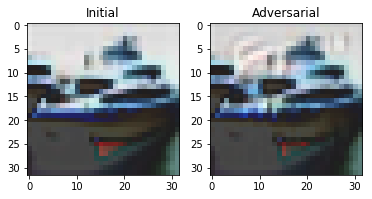

Total distortion: 3.329716691346113
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 15.6156645   2.7820623  -3.3462577   2.1292984   2.5770314 -16.721346
  -11.554176  -11.351438   15.436715    8.362117 ]] 0
initial_14_0.png
output/cifar/initial_14_0.png output/cifar/adversarial_14_0.png


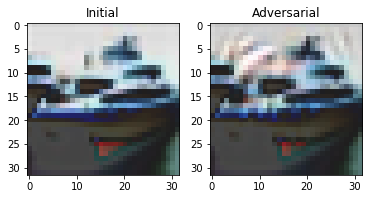

Total distortion: 4.738376248532428
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 13.442074    9.821376   -5.6595855   0.3052641  -5.838635  -12.295411
   -9.100386   -7.552092    9.281207   10.906999 ]] 0
initial_15_0.png
output/cifar/initial_15_0.png output/cifar/adversarial_15_0.png


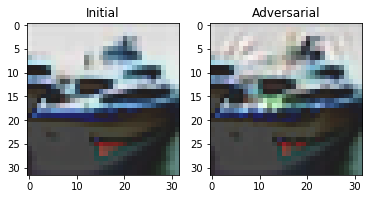

Total distortion: 4.044880850679214
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 16.073349   11.113443   -6.732841   -1.6271724  -4.5688567 -15.23483
   -6.3535876 -15.76614    23.124405    8.114257 ]] 8
initial_16_0.png
output/cifar/initial_16_0.png output/cifar/adversarial_16_0.png


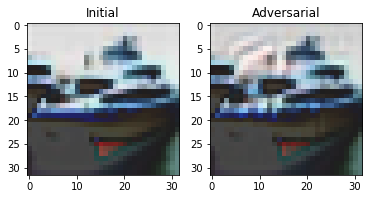

Total distortion: 3.6720355059666945
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 15.1074      5.48706    -5.839426    2.6223063  -2.4930086 -15.101962
  -13.720072   -8.191196   11.926182   13.794686 ]] 0
initial_17_0.png
output/cifar/initial_17_0.png output/cifar/adversarial_17_0.png


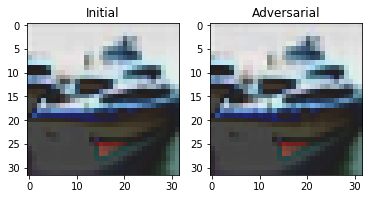

Total distortion: 0.9980681355520502
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 29.567873     5.325863    -5.602555    -0.21388534  -0.9801612
  -24.162546   -12.725392   -16.359564    25.203726     8.932199  ]] 0
initial_18_0.png
output/cifar/initial_18_0.png output/cifar/adversarial_18_0.png


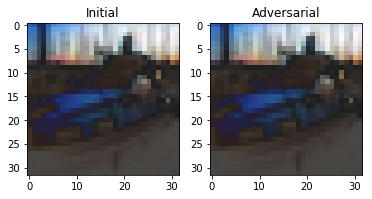

Total distortion: 0.3551348071289978
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 9.092762    0.89750147 -2.8488874   1.7315598  -2.0823317  -6.710909
  -7.7284865   0.32110414  0.49476716  7.7246785 ]] 0
initial_19_0.png
output/cifar/initial_19_0.png output/cifar/adversarial_19_0.png


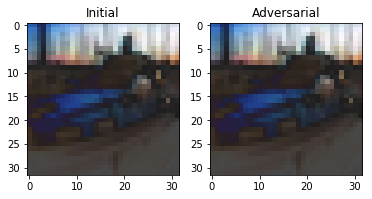

Total distortion: 0.18255313219067515
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 9.382467   1.4251099 -2.718852   1.0013156 -1.7874362 -7.174367
  -7.4112988 -0.5338168  1.4437281  7.691295 ]] 0
initial_20_0.png
output/cifar/initial_20_0.png output/cifar/adversarial_20_0.png


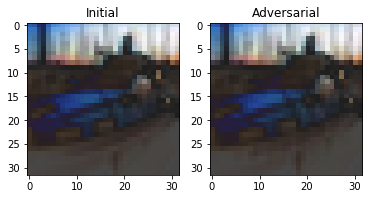

Total distortion: 0.7490504134392252
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 6.119594   -1.7541788  -1.8730006   2.6484766  -0.29155725 -3.9783123
  -6.9243813   2.3753774  -1.1627022   5.3970375 ]] 0
initial_21_0.png
output/cifar/initial_21_0.png output/cifar/adversarial_21_0.png


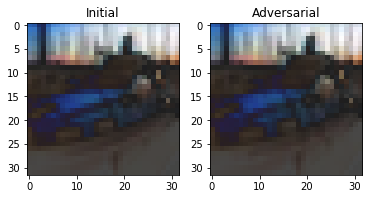

Total distortion: 0.8685190099547453
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 6.0075903 -1.832698  -2.9037938  4.1133704 -0.6825142 -4.048281
  -7.155396   1.4123316 -1.246365   6.9031563]] 9
initial_22_0.png
output/cifar/initial_22_0.png output/cifar/adversarial_22_0.png


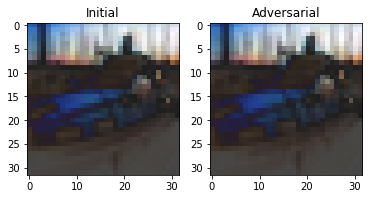

Total distortion: 0.8384915488925572
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 5.919974   -0.26773417 -3.0529068   2.6907701  -0.77189744 -3.652479
  -7.0279245   1.03563    -0.32413092  6.0377655 ]] 9
initial_23_0.png
output/cifar/initial_23_0.png output/cifar/adversarial_23_0.png


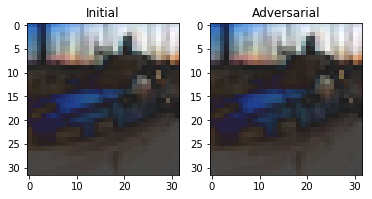

Total distortion: 0.9521097498149828
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 4.4848557 -1.8220755 -2.8052905  3.2638988 -1.2094052 -2.3421156
  -6.3617005  1.9215037 -2.5144184  7.6701317]] 9
initial_24_0.png
output/cifar/initial_24_0.png output/cifar/adversarial_24_0.png


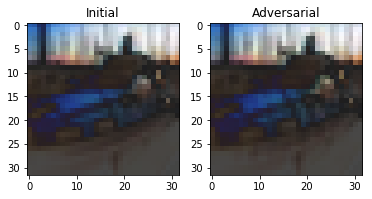

Total distortion: 1.056031225898762
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 7.274512   -1.7268907  -3.0112162   4.1963706  -1.229012   -5.700958
  -8.096691    0.34850374  1.4569347   7.3905926 ]] 9
initial_25_0.png
output/cifar/initial_25_0.png output/cifar/adversarial_25_0.png


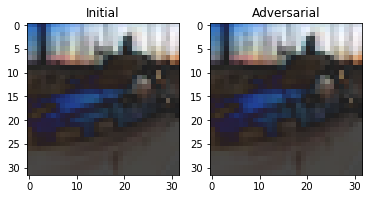

Total distortion: 0.7599449828587583
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 5.714891  -2.490629  -2.504734   3.1009405 -1.1406769 -3.8331861
  -8.0458555  3.7844892 -1.5271143  7.02314  ]] 9
initial_26_0.png
output/cifar/initial_26_0.png output/cifar/adversarial_26_0.png


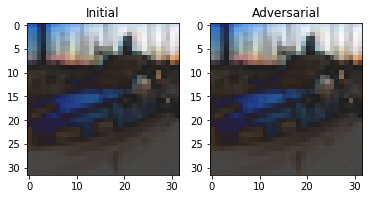

Total distortion: 0.311413042843274
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 8.324831    0.1149365  -2.693749    1.9880444  -2.184675   -6.4722
  -7.4667788   0.9000355   0.49836937  7.9282246 ]] 0
initial_27_0.png
output/cifar/initial_27_0.png output/cifar/adversarial_27_0.png


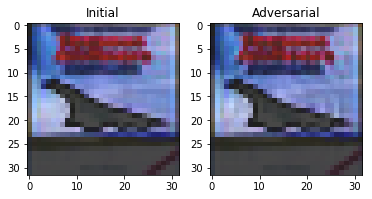

Total distortion: 1.6899459208351284
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 12.558961   15.608873   -5.3785224  -3.6047616  -6.2616096 -14.2173195
  -10.948427   -7.4171357  15.771163   11.518261 ]] 8
initial_28_0.png
output/cifar/initial_28_0.png output/cifar/adversarial_28_0.png


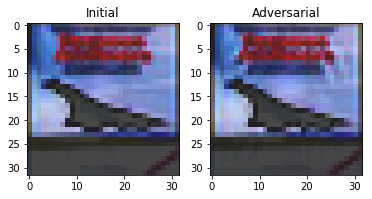

Total distortion: 2.0510518794647443
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 16.122765     3.584274     1.8858116    0.09600189   1.5967278
  -11.961288   -11.00547     -3.4118686    4.9090705    0.74334   ]] 0
initial_29_0.png
output/cifar/initial_29_0.png output/cifar/adversarial_29_0.png


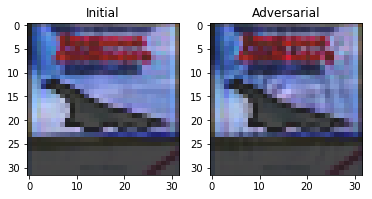

Total distortion: 3.4359723945014995
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 5.6300383  3.1122096 -1.8435264 -2.5781496  1.5817076 -4.4770293
  -3.2072854 -2.674419   4.472793   2.9092205]] 0
initial_30_0.png
output/cifar/initial_30_0.png output/cifar/adversarial_30_0.png


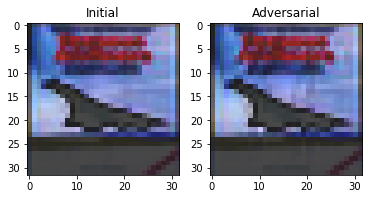

Total distortion: 1.6254984751341892
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 16.637236    -0.18530276   2.4099605   -1.1801347    7.214349
  -10.672291    -9.171662    -4.104771     4.081953    -1.4072638 ]] 0
initial_31_0.png
output/cifar/initial_31_0.png output/cifar/adversarial_31_0.png


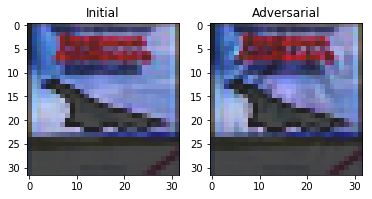

Total distortion: 3.409390742670317
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 7.9325094   2.7072644  -0.08518587 -2.6221201   1.8056746  -5.1304035
  -1.9733461  -2.575811    2.9199073   0.6153379 ]] 0
initial_32_0.png
output/cifar/initial_32_0.png output/cifar/adversarial_32_0.png


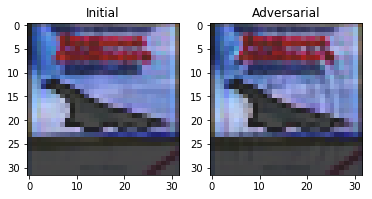

Total distortion: 2.7635711112372765
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 4.9155717  7.1978016 -3.6018674 -2.4882565 -1.5623431 -7.062753
  -2.194542  -3.827045   6.6040626  5.22007  ]] 1
initial_33_0.png
output/cifar/initial_33_0.png output/cifar/adversarial_33_0.png


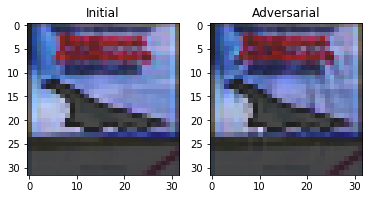

Total distortion: 3.0538447551727788
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 9.465131    4.2247667  -1.3530521  -3.7008622   2.8130245  -7.3497624
  -6.199808   -0.05276854  2.2306454   1.7217466 ]] 0
initial_34_0.png
output/cifar/initial_34_0.png output/cifar/adversarial_34_0.png


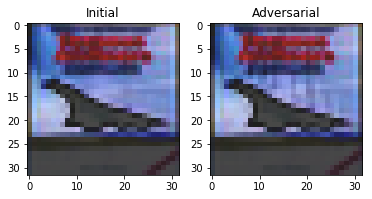

Total distortion: 1.1144571619131176
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 13.926545    4.5462704  -2.8908837  -1.0243834   0.3441182 -12.080223
   -8.329716   -8.40001    14.626461    4.7102323]] 8
initial_35_0.png
output/cifar/initial_35_0.png output/cifar/adversarial_35_0.png


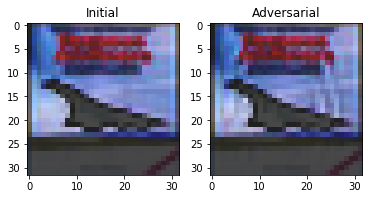

Total distortion: 2.1496671729520767
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 10.908931   16.931704   -7.61054    -3.9077818  -7.2932262 -14.797828
  -13.937619   -6.5140457  13.142529   18.316217 ]] 9
initial_36_0.png
output/cifar/initial_36_0.png output/cifar/adversarial_36_0.png


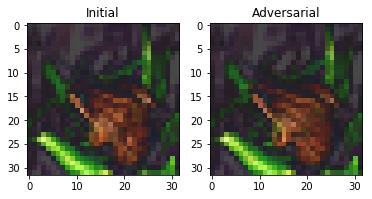

Total distortion: 1.8498834006191391
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 2.250037  -4.9476957  5.905398   2.3863661  4.8708277 -1.202879
   5.250442  -4.88946   -2.2950835 -6.1332707]] 2
initial_37_0.png
output/cifar/initial_37_0.png output/cifar/adversarial_37_0.png


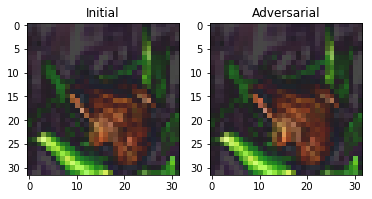

Total distortion: 1.5660371036250769
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[-0.45117286  0.147369    2.7296426   4.1893716   0.14509875 -1.9471526
   8.793895   -6.992561   -0.56031024 -3.999195  ]] 6
initial_38_0.png
output/cifar/initial_38_0.png output/cifar/adversarial_38_0.png


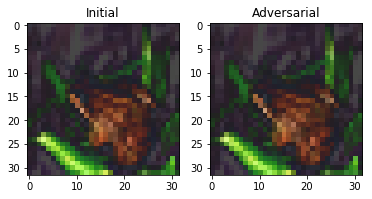

Total distortion: 0.8723353274794765
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 1.974682  -5.4712124 11.529692   4.9543505  3.8391037 -5.4997563
  10.476468  -9.539461  -3.95802   -6.228794 ]] 2
initial_39_0.png
output/cifar/initial_39_0.png output/cifar/adversarial_39_0.png


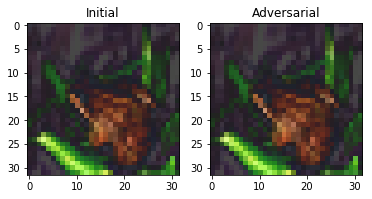

Total distortion: 0.5227025694343699
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 0.36533824 -6.3401003  10.083639    5.256519    7.8191953  -3.9963753
  10.542486   -9.129133   -5.8830943  -6.5085874 ]] 6
initial_40_0.png
output/cifar/initial_40_0.png output/cifar/adversarial_40_0.png


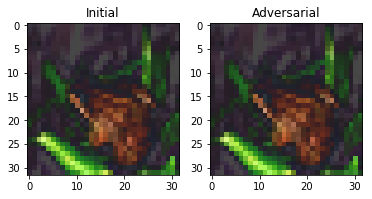

Total distortion: 0.0
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
initial_41_0.png
output/cifar/initial_41_0.png output/cifar/adversarial_41_0.png


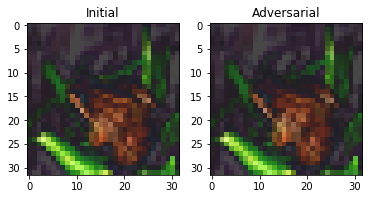

Total distortion: 1.2681834886955676
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 0.45065996 -2.7716725   5.6947327   3.3009925   4.4391394  -1.533742
   8.070437   -7.5907407  -4.09932    -4.348408  ]] 6
initial_42_0.png
output/cifar/initial_42_0.png output/cifar/adversarial_42_0.png


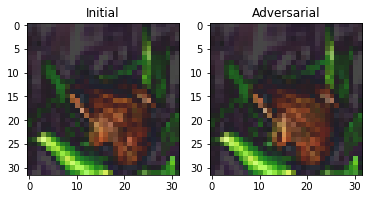

Total distortion: 1.805826067426517
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 0.5217327  -0.741817    2.717452    5.019569   -1.3097019  -0.23817274
   6.9720626  -6.1360397  -1.2381115  -4.5655904 ]] 6
initial_43_0.png
output/cifar/initial_43_0.png output/cifar/adversarial_43_0.png


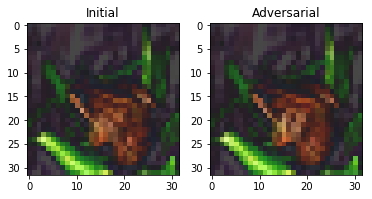

Total distortion: 1.7434229554333573
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 1.714788   -0.23054346  4.365653    0.4648342   2.4169745  -5.024706
  10.139862   -8.452268   -0.85838413 -2.5754087 ]] 6
initial_44_0.png
output/cifar/initial_44_0.png output/cifar/adversarial_44_0.png


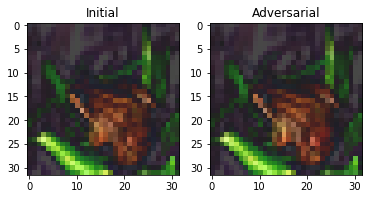

Total distortion: 1.6859508043671065
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 0.14561325 -2.1037617   5.077887    2.5046237   0.80308706 -2.8110766
   9.456392   -7.112251   -0.5240313  -4.7427197 ]] 6
initial_45_0.png
output/cifar/initial_45_0.png output/cifar/adversarial_45_0.png


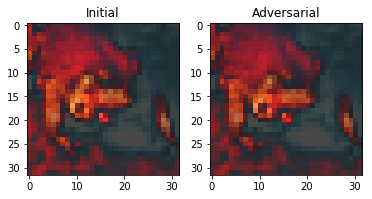

Total distortion: 1.4999065370052151
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[10.745856   5.3948145 -1.7356651 -2.1309142 -4.780125  -6.3432326
  -1.4751644 -7.25079    7.4288516  3.6919448]] 0
initial_46_0.png
output/cifar/initial_46_0.png output/cifar/adversarial_46_0.png


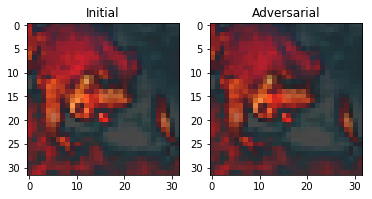

Total distortion: 1.661278486732353
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 9.042401    7.903434   -2.8803015  -2.4029207  -5.7559943  -5.8203735
  -0.03606646 -8.007243    7.48124     4.826553  ]] 0
initial_47_0.png
output/cifar/initial_47_0.png output/cifar/adversarial_47_0.png


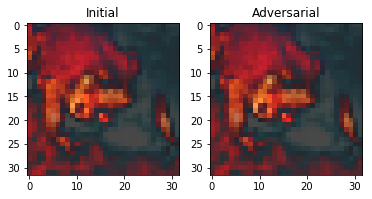

Total distortion: 0.6011267235489868
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 6.449949    4.8242235  -1.5996807  -1.459192   -4.554248   -3.8551922
  -0.29123136 -6.5113993   6.969969    3.0481343 ]] 8
initial_48_0.png
output/cifar/initial_48_0.png output/cifar/adversarial_48_0.png


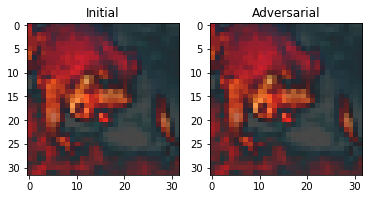

Total distortion: 0.6302145151092583
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 6.1011424  4.7323217 -1.8093727 -1.2440913 -4.961216  -3.847771
  -0.2424508 -6.552142   7.7414145  3.3058565]] 8
initial_49_0.png
output/cifar/initial_49_0.png output/cifar/adversarial_49_0.png


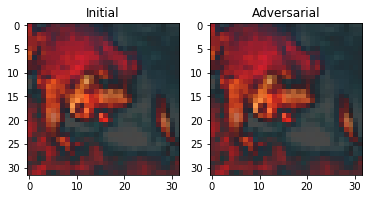

Total distortion: 0.6121291010732686
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 6.3969846  4.4681487 -1.7694046 -1.6391702 -4.4558735 -3.7758284
  -0.4421096 -5.958008   7.048917   3.0413046]] 8
initial_50_0.png
output/cifar/initial_50_0.png output/cifar/adversarial_50_0.png


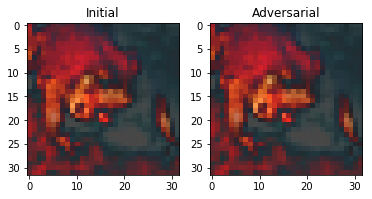

Total distortion: 0.42933565820201236
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 6.294587   5.7658396 -2.0873656 -1.4380137 -5.2212315 -3.661067
  -0.6397901 -6.4811697  6.581156   4.066058 ]] 8
initial_51_0.png
output/cifar/initial_51_0.png output/cifar/adversarial_51_0.png


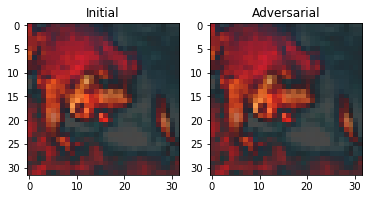

Total distortion: 0.7462529916240082
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 5.9858127   3.9308207  -1.4394815  -1.4067699  -4.264549   -3.7171743
  -0.16268402 -5.6251593   6.6970797   2.717094  ]] 8
initial_52_0.png
output/cifar/initial_52_0.png output/cifar/adversarial_52_0.png


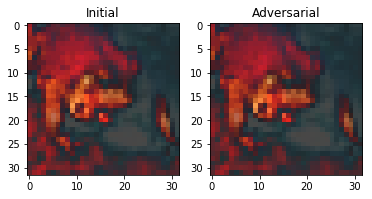

Total distortion: 1.2417261958520034
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 6.88633     5.006065   -1.6823823  -1.5972651  -4.9905953  -4.3104
   0.43817553 -7.4548974   9.09922     2.41479   ]] 8
initial_53_0.png
output/cifar/initial_53_0.png output/cifar/adversarial_53_0.png


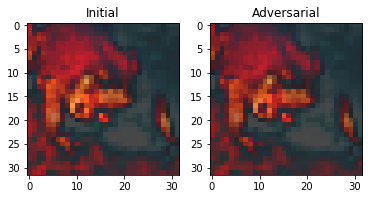

Total distortion: 1.642870501647563
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 7.3261685   5.8355064  -2.019741   -1.2974178  -5.39345    -4.776808
  -0.40399614 -7.0736976   7.22769     3.9284842 ]] 0
initial_54_0.png
output/cifar/initial_54_0.png output/cifar/adversarial_54_0.png


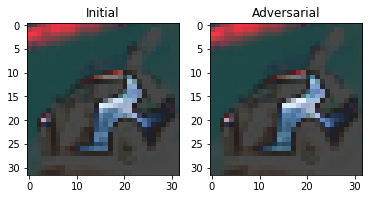

Total distortion: 1.334762859927722
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[10.753514   -0.92449784 -2.834746   -0.7845051   2.0063403  -7.818511
  -6.8649364  -5.364031   12.509694    3.3797028 ]] 8
initial_55_0.png
output/cifar/initial_55_0.png output/cifar/adversarial_55_0.png


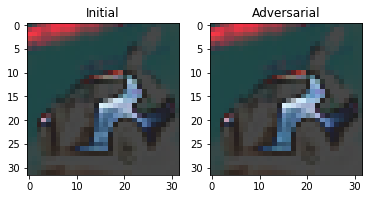

Total distortion: 0.8898073425079195
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[ 9.362726  -0.7346741 -2.4742537 -1.4958448  2.353168  -7.1602993
  -5.865747  -5.1038885 12.127667   2.7006686]] 8
initial_56_0.png
output/cifar/initial_56_0.png output/cifar/adversarial_56_0.png


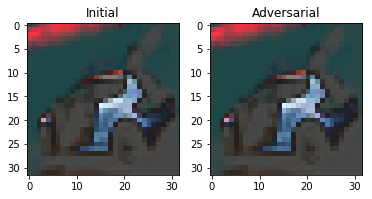

Total distortion: 0.2945617599267564
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[10.042585  -1.2069298 -2.857202  -1.6188375  1.6562856 -7.405101
  -6.7541614 -4.703201  13.041248   3.689075 ]] 8
initial_57_0.png
output/cifar/initial_57_0.png output/cifar/adversarial_57_0.png


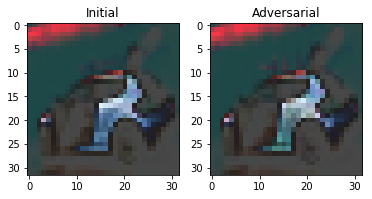

Total distortion: 2.089382912281059
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[ 9.978451   -0.51177764 -3.1606503  -0.2005265   1.5449961  -8.767207
  -6.6772046  -6.279317   15.213312    3.6600688 ]] 8
initial_58_0.png
output/cifar/initial_58_0.png output/cifar/adversarial_58_0.png


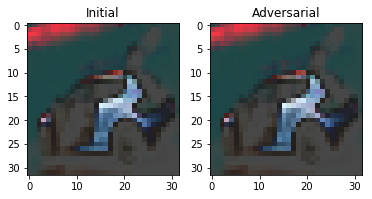

Total distortion: 0.8352665213715263
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[ 8.8824005 -0.1611059 -2.7158778 -2.2866712  1.9338698 -7.568188
  -5.4049406 -4.847843  13.906487   2.5779433]] 8
initial_59_0.png
output/cifar/initial_59_0.png output/cifar/adversarial_59_0.png


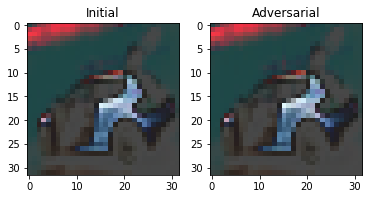

Total distortion: 0.7478072776245436
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[10.206658   -0.66864485 -2.7596493  -2.0372052   2.222402   -7.823172
  -6.21451    -4.712738   13.704856    2.520236  ]] 8
initial_60_0.png
output/cifar/initial_60_0.png output/cifar/adversarial_60_0.png


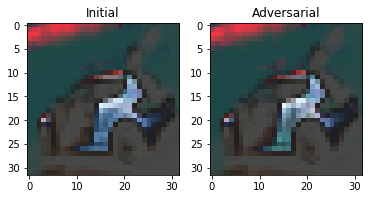

Total distortion: 1.6705974796082061
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[10.075828   -1.1602093  -3.6265438  -0.53258026  0.797077   -7.7897243
  -7.095067   -4.5572076  14.324684    3.304338  ]] 8
initial_61_0.png
output/cifar/initial_61_0.png output/cifar/adversarial_61_0.png


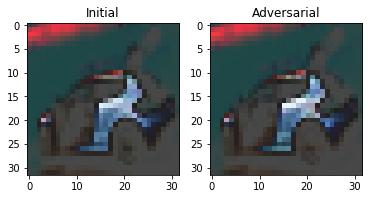

Total distortion: 1.7743397572757218
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[ 11.580812   -0.9283967  -3.7834816  -2.160692    0.6877637 -10.057732
   -7.40673    -5.2092447  17.954042    4.3227944]] 8
initial_62_0.png
output/cifar/initial_62_0.png output/cifar/adversarial_62_0.png


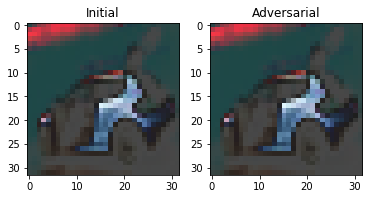

Total distortion: 0.17129670738289263
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[10.605056  -1.0708023 -2.8615038 -1.7747086  1.4436295 -7.5359917
  -7.272222  -4.7758393 13.212905   3.9732182]] 8
initial_63_0.png
output/cifar/initial_63_0.png output/cifar/adversarial_63_0.png


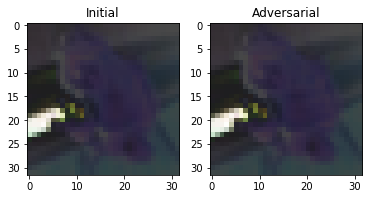

Total distortion: 0.43176454172125167
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[ 21.815845   -2.0601115  -4.224438    7.4013896  -8.532498   -1.7423934
  -10.323128   -4.789716   -1.3863072   7.2863135]] 0
initial_64_0.png
output/cifar/initial_64_0.png output/cifar/adversarial_64_0.png


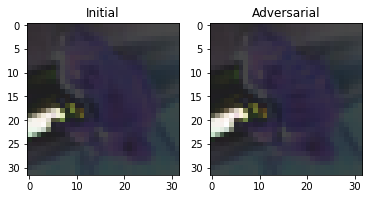

Total distortion: 0.9646262105113846
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[ 20.641619    -1.0805544   -4.983121     7.086858    -7.8087416
   -3.3445177  -10.2454815   -5.0899124   -0.24159244   8.878805  ]] 0
initial_65_0.png
output/cifar/initial_65_0.png output/cifar/adversarial_65_0.png


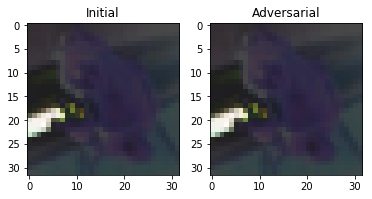

Total distortion: 0.2688778129760352
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[20.794432   -2.5191672  -3.7489996   7.2145195  -7.827734   -0.96177506
  -9.6804     -5.0249295  -1.1485996   6.278455  ]] 0
initial_66_0.png
output/cifar/initial_66_0.png output/cifar/adversarial_66_0.png


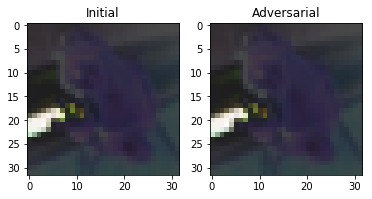

Total distortion: 0.5799813237965157
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[18.577705  -3.4841192 -3.5758238  7.904914  -6.9228945 -0.25351
  -9.062567  -5.0844173 -0.9682462  5.771375 ]] 0
initial_67_0.png
output/cifar/initial_67_0.png output/cifar/adversarial_67_0.png


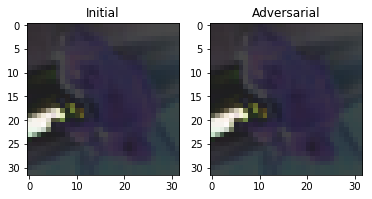

Total distortion: 0.3164829820438901
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[20.348076   -2.7284873  -3.757407    7.5718822  -7.522582   -0.95725596
  -9.56885    -4.8995376  -1.3778937   6.0781407 ]] 0
initial_68_0.png
output/cifar/initial_68_0.png output/cifar/adversarial_68_0.png


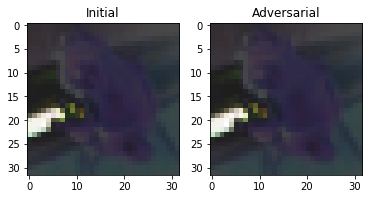

Total distortion: 0.6895161888955131
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[20.616861   -3.4355567  -3.0491757   7.2356844  -7.939872   -0.67238784
  -9.943652   -4.8462787  -1.7685113   6.660376  ]] 0
initial_69_0.png
output/cifar/initial_69_0.png output/cifar/adversarial_69_0.png


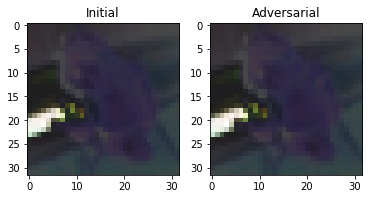

Total distortion: 0.5683569629526245
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[17.707512   -2.926514   -3.9251018   7.7933917  -6.9745827  -0.88229954
  -9.188391   -4.353646   -1.2392986   6.6842813 ]] 0
initial_70_0.png
output/cifar/initial_70_0.png output/cifar/adversarial_70_0.png


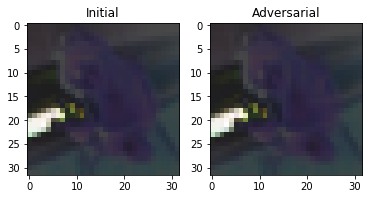

Total distortion: 0.7459438233253363
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[19.76945   -2.1130066 -4.3582673  6.806397  -6.5353246 -2.0327733
  -8.933078  -6.2992816  2.6851106  5.5486383]] 0
initial_71_0.png
output/cifar/initial_71_0.png output/cifar/adversarial_71_0.png


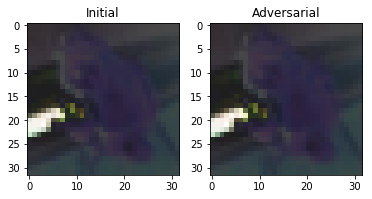

Total distortion: 0.7193700769357068
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[19.900156  -2.7148626 -4.4194036  8.307575  -8.238953  -0.9379647
  -9.939162  -4.673753  -0.8925154  6.9495273]] 0
initial_72_0.png
output/cifar/initial_72_0.png output/cifar/adversarial_72_0.png


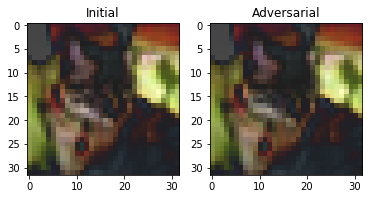

Total distortion: 1.4800532016986412
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[  0.34189877 -10.0121565    6.8056273    5.4177246    8.846497
    0.08179688   3.026403    -2.9798698   -3.8439682   -6.5865436 ]] 4
initial_73_0.png
output/cifar/initial_73_0.png output/cifar/adversarial_73_0.png


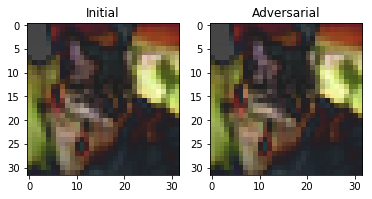

Total distortion: 1.3325199785577757
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[-0.14055614 -7.703411    5.1573668   4.8895626   9.007674   -3.331115
   6.2330403  -5.855719   -2.3383317  -4.156231  ]] 4
initial_74_0.png
output/cifar/initial_74_0.png output/cifar/adversarial_74_0.png


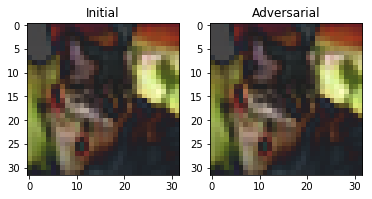

Total distortion: 0.804380562028721
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[  0.92987376 -10.810343     7.8616223    5.9821453    9.634756
   -2.2823188    5.1155624   -5.5668125   -3.013889    -6.5846243 ]] 4
initial_75_0.png
output/cifar/initial_75_0.png output/cifar/adversarial_75_0.png


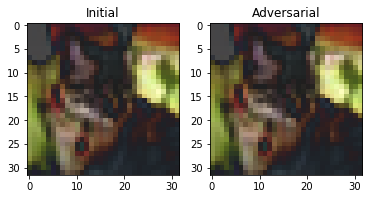

Total distortion: 0.5555217272340411
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[ -0.07233988 -10.02976      6.2750096    7.0020747    8.559962
    0.1590288    4.066032    -3.738904    -4.295397    -6.784833  ]] 4
initial_76_0.png
output/cifar/initial_76_0.png output/cifar/adversarial_76_0.png


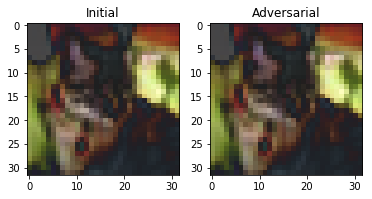

Total distortion: 0.8330819028795218
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[ -1.0319983 -10.402683    6.8125935   7.2016253   9.043428    1.8058506
    4.0388627  -3.2164636  -5.913576   -7.012532 ]] 4
initial_77_0.png
output/cifar/initial_77_0.png output/cifar/adversarial_77_0.png


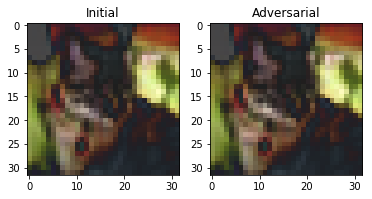

Total distortion: 0.8696869236967841
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[ -0.36732575 -10.560078     8.489185     6.572672     9.391323
   -3.2197855    6.7039866   -6.896755    -1.4517765   -6.188429  ]] 4
initial_78_0.png
output/cifar/initial_78_0.png output/cifar/adversarial_78_0.png


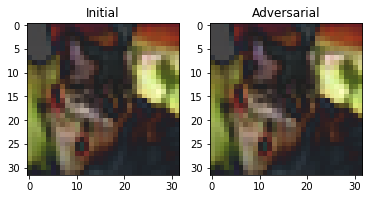

Total distortion: 0.6980062019269362
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[-0.8297572 -9.874823   5.5501304  7.0567155  8.641408   1.1010958
   2.9760373 -2.3319416 -5.047898  -6.4303513]] 4
initial_79_0.png
output/cifar/initial_79_0.png output/cifar/adversarial_79_0.png


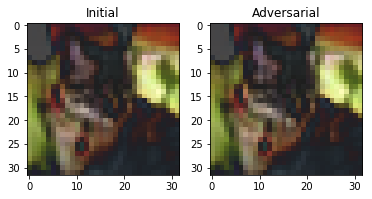

Total distortion: 1.3538105520864254
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[ 0.44927767 -9.139939    7.874762    6.9875307   9.944254   -1.261928
   6.386572   -7.620618   -3.5638664  -6.8016777 ]] 4
initial_80_0.png
output/cifar/initial_80_0.png output/cifar/adversarial_80_0.png


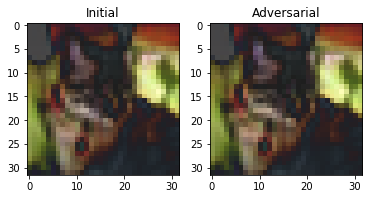

Total distortion: 1.0851626479068055
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[ 0.55221117 -9.50982     5.9854116   5.4968696  11.364358   -1.8460943
   3.7374923  -4.5798025  -4.0513687  -5.5982423 ]] 4
initial_81_0.png
output/cifar/initial_81_0.png output/cifar/adversarial_81_0.png


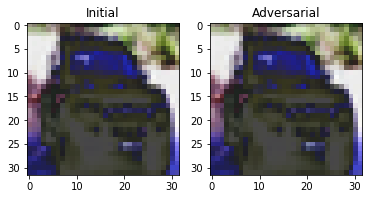

Total distortion: 0.7613905370739981
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[ 0.30886117  5.98292    -0.01124908 -1.3064152  -7.0472646   0.6643735
   0.15118322 -0.8297006  -0.9625119   4.2787814 ]] 1
initial_82_0.png
output/cifar/initial_82_0.png output/cifar/adversarial_82_0.png


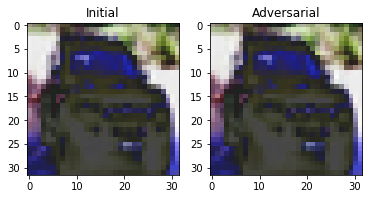

Total distortion: 1.1740433024425172
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[-0.58780193  5.4729676   0.36965984 -1.3501512  -7.287203    1.5136616
   2.3640316   1.601534   -2.5206957   0.8311382 ]] 1
initial_83_0.png
output/cifar/initial_83_0.png output/cifar/adversarial_83_0.png


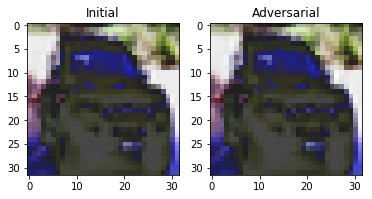

Total distortion: 1.3668340607605414
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[-0.6055969   4.4809303  -0.4622116  -0.1585758  -6.6593413   0.6580425
   3.8772726  -0.14758477 -1.6591041   1.5668101 ]] 1
initial_84_0.png
output/cifar/initial_84_0.png output/cifar/adversarial_84_0.png


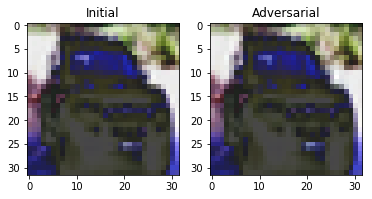

Total distortion: 1.4878774981371587
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[-1.8094327   3.6605542  -1.3260422   0.8614011  -5.0952163  -0.10216701
   4.202065    0.60163105 -1.3856654   1.3492911 ]] 6
initial_85_0.png
output/cifar/initial_85_0.png output/cifar/adversarial_85_0.png


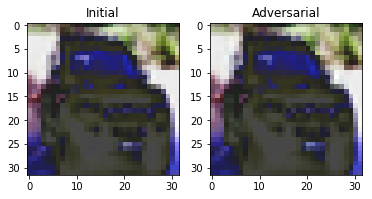

Total distortion: 1.4605408808423737
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[-1.0801243   4.4500756  -1.4519147   0.7762352  -6.2690287  -0.38091996
   4.9293175  -0.96943355 -1.1867921   2.2354536 ]] 6
initial_86_0.png
output/cifar/initial_86_0.png output/cifar/adversarial_86_0.png


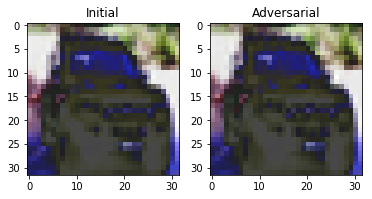

Total distortion: 1.213159995028771
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[-1.0222919   4.147117   -0.72895396  1.1927962  -6.499881    2.0599391
   3.7620018   0.26162943 -2.61676     0.34742302]] 1
initial_87_0.png
output/cifar/initial_87_0.png output/cifar/adversarial_87_0.png


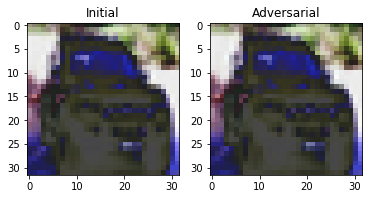

Total distortion: 0.9541992012596265
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[-1.8502947   5.484455   -0.04634753 -1.2151345  -7.061562    1.7716864
   1.5567997   2.1029932  -2.6477797   2.1105597 ]] 1
initial_88_0.png
output/cifar/initial_88_0.png output/cifar/adversarial_88_0.png


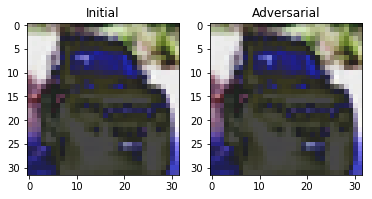

Total distortion: 0.8884668805460046
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[ 0.21007222  5.0269322  -0.24711695 -1.204713   -6.5837727   1.1321417
   1.1553179  -1.5921437  -0.5000404   4.193342  ]] 1
initial_89_0.png
output/cifar/initial_89_0.png output/cifar/adversarial_89_0.png


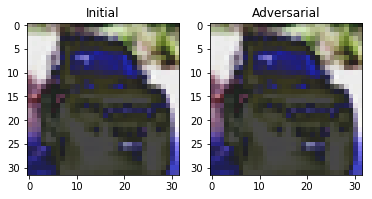

Total distortion: 0.22873203105391332
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[ 0.26991645  6.8392267   0.29368305 -0.74696374 -8.712943    0.8476917
  -0.8174625  -0.4444659  -1.0816875   4.554739  ]] 1
initial_90_1.png
output/cifar/initial_90_1.png output/cifar/adversarial_90_1.png


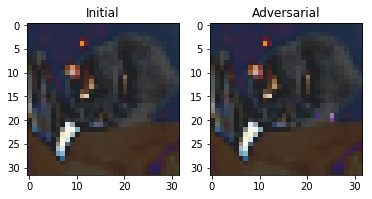

Total distortion: 2.299872175064728
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 5.820264   -5.753022   -3.454041    8.953395   -2.2325017  -0.99103904
  -2.6458783  -5.62001     7.2330384   1.0189656 ]] 3
initial_91_1.png
output/cifar/initial_91_1.png output/cifar/adversarial_91_1.png


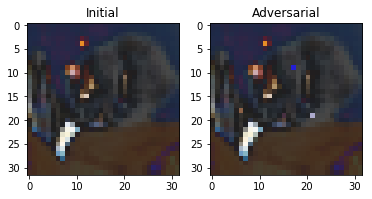

Total distortion: 2.3453341407463646
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 8.383717   -8.221504    0.41160196  8.230518   -3.6794376   0.5549621
  -2.681056   -3.3342762   6.7844515  -3.3304486 ]] 0
initial_92_1.png
output/cifar/initial_92_1.png output/cifar/adversarial_92_1.png


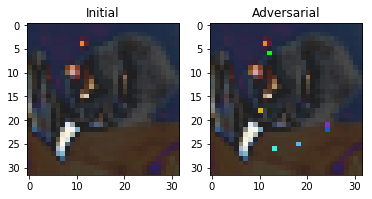

Total distortion: 3.120930577907676
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 3.325245  -7.6299796 -0.8274741 10.7668495  1.6029698 -1.8694266
  -0.0526327 -3.0154424  2.6711671 -1.4858634]] 3
initial_93_1.png
output/cifar/initial_93_1.png output/cifar/adversarial_93_1.png


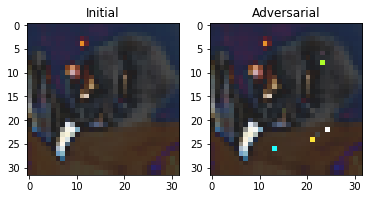

Total distortion: 4.229894766434199
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 5.0256076 -8.338185   0.9259224 -0.5207156  5.4702797 -2.9486382
  -6.008195   2.2633047  5.8958874 -0.5677874]] 8
initial_94_1.png
output/cifar/initial_94_1.png output/cifar/adversarial_94_1.png


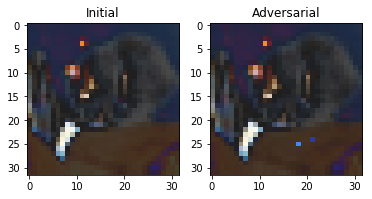

Total distortion: 3.153470467884754
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[  6.526014   -10.504313     3.3721585    9.129962    -0.66266656
    3.8357172   -5.3351307    0.24971136   1.6823809   -5.05154   ]] 3
initial_95_1.png
output/cifar/initial_95_1.png output/cifar/adversarial_95_1.png


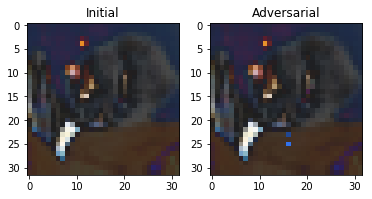

Total distortion: 3.0286802430410846
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 4.9850864  -7.636493    1.748323    8.381186   -1.7848783   2.761428
  -2.3259566  -0.65705246  1.1697593  -3.3174565 ]] 3
initial_96_1.png
output/cifar/initial_96_1.png output/cifar/adversarial_96_1.png


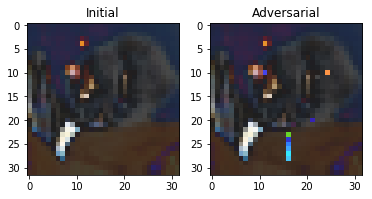

Total distortion: 4.909108489419303
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 1.3087283 -8.435914   2.963891   3.9481165  5.818691   5.4577346
  -4.123839   5.005153  -2.871106  -6.8896656]] 4
initial_97_1.png
output/cifar/initial_97_1.png output/cifar/adversarial_97_1.png


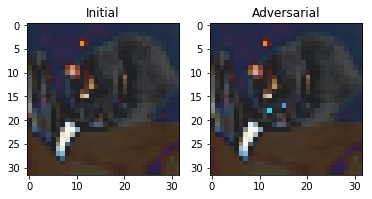

Total distortion: 2.0244603462283295
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 7.2254834 -6.798972  -1.3471253  9.666591  -3.6996007 -2.925629
  -1.0711442 -6.384239  10.417733  -0.996655 ]] 8
initial_98_1.png
output/cifar/initial_98_1.png output/cifar/adversarial_98_1.png


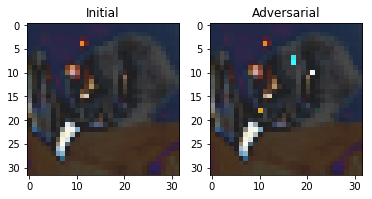

Total distortion: 3.0495512335145443
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 4.387288   -5.0462565  -0.85299516 12.618604   -6.7941732   1.1036838
  -1.9233749  -1.1675707   1.3562138  -1.5291486 ]] 3
initial_99_1.png
output/cifar/initial_99_1.png output/cifar/adversarial_99_1.png


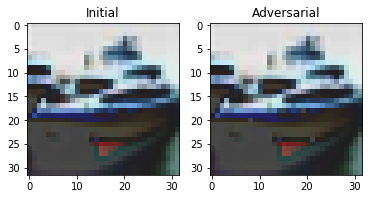

Total distortion: 2.0652337885452283
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 34.177822    8.167805   -3.432734   -3.7984736  -2.8044121 -28.30902
  -15.423433  -20.907814   38.938763    6.76464  ]] 8
initial_100_1.png
output/cifar/initial_100_1.png output/cifar/adversarial_100_1.png


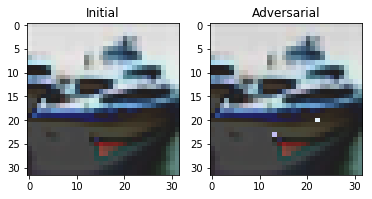

Total distortion: 2.632660903867685
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 34.321693   15.570848   -4.8342257  -4.1057696  -7.3453455 -27.602972
  -18.617926  -18.128681   32.34379    10.82552  ]] 0
initial_101_1.png
output/cifar/initial_101_1.png output/cifar/adversarial_101_1.png


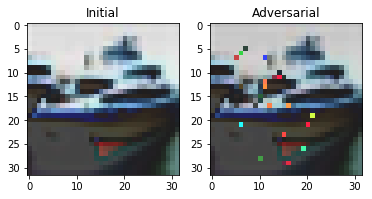

Total distortion: 7.568940249886219
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 26.152925    1.8664461   3.5380616  -3.0697052  -1.7620065 -17.844078
  -13.756665  -11.606274   23.79563     0.3119891]] 0
initial_102_1.png
output/cifar/initial_102_1.png output/cifar/adversarial_102_1.png


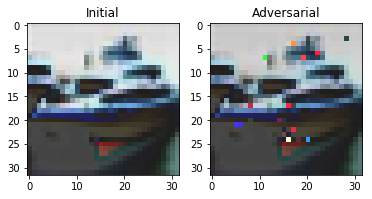

Total distortion: 6.549417298001355
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 28.929487     8.523555    -0.14435887  -5.899485    -2.2188663
  -24.252272   -10.836512   -15.919923    27.04891      4.7889323 ]] 0
initial_103_1.png
output/cifar/initial_103_1.png output/cifar/adversarial_103_1.png


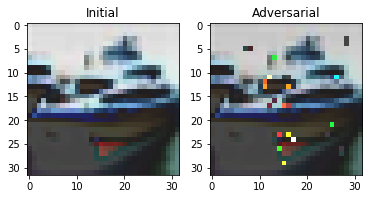

Total distortion: 8.042237362022423
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 19.70672      3.405586    -1.007085     0.58149385   1.5175028
  -19.195501    -8.270534   -12.957736    19.819265     4.4437146 ]] 8
initial_104_1.png
output/cifar/initial_104_1.png output/cifar/adversarial_104_1.png


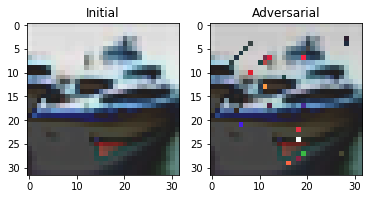

Total distortion: 8.2108719929297
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 18.395899    2.3187106   0.5099968  -1.9370135  -1.6483049 -13.231126
   -6.4960084 -11.6522045  17.272058    1.1808151]] 0
initial_105_1.png
output/cifar/initial_105_1.png output/cifar/adversarial_105_1.png


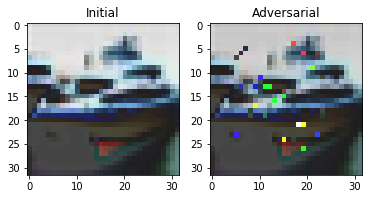

Total distortion: 7.762634806913682
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 26.440947   16.066713   -2.673514   -8.578869   -6.740816  -19.978367
  -12.167524  -13.149853   20.059153    7.6470838]] 0
initial_106_1.png
output/cifar/initial_106_1.png output/cifar/adversarial_106_1.png


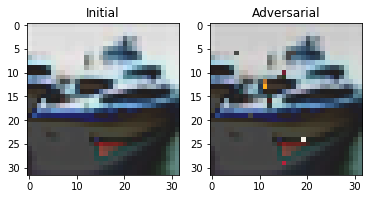

Total distortion: 6.134777439498334
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 32.343967   -2.2122664   3.5407176  -0.9638289   5.133062  -21.04914
  -15.118477  -13.786037   21.958626   -0.583593 ]] 0
initial_107_1.png
output/cifar/initial_107_1.png output/cifar/adversarial_107_1.png


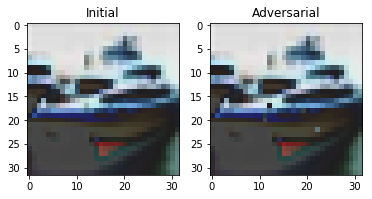

Total distortion: 2.1231085269121595
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 30.987131     6.3074503   -3.9806902   -2.021849    -0.10233742
  -24.820757   -15.461405   -16.471771    28.387941     7.5231752 ]] 0
initial_108_1.png
output/cifar/initial_108_1.png output/cifar/adversarial_108_1.png


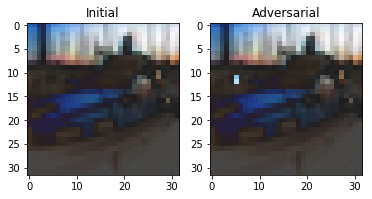

Total distortion: 2.10445412161049
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[11.608654    3.2750564  -3.1264431   0.79893684 -4.662775   -9.096446
  -9.895857   -0.24689873  1.9167883  10.707389  ]] 0
initial_109_1.png
output/cifar/initial_109_1.png output/cifar/adversarial_109_1.png


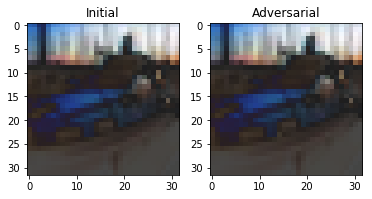

Total distortion: 0.40155409199265224
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 9.794381   1.5047644 -2.930856   0.7262225 -1.6678777 -7.3871875
  -7.8183775 -0.8214587  2.3000026  7.804917 ]] 0
initial_110_1.png
output/cifar/initial_110_1.png output/cifar/adversarial_110_1.png


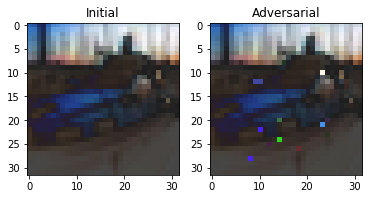

Total distortion: 3.6832884968463953
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 9.047532   9.338577  -3.9444852 -3.397843  -6.5303855 -6.993243
  -7.825225  -4.714665   3.690501  13.089541 ]] 9
initial_111_1.png
output/cifar/initial_111_1.png output/cifar/adversarial_111_1.png


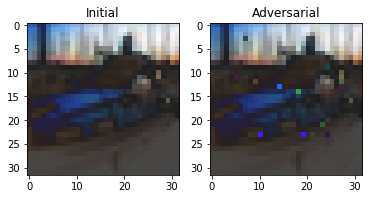

Total distortion: 3.5207956225540697
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 12.819667    -0.18721348  -2.4583309   -0.03014132  -3.779688
  -10.323236   -10.500764     2.806004     3.764086     8.691256  ]] 0
initial_112_1.png
output/cifar/initial_112_1.png output/cifar/adversarial_112_1.png


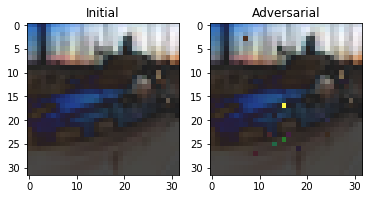

Total distortion: 2.6844362938025963
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[11.649678    3.1604674  -3.4200068  -0.32444456 -3.3577125  -8.1193075
  -7.7796702  -0.1732247   2.8844903   7.791585  ]] 0
initial_113_1.png
output/cifar/initial_113_1.png output/cifar/adversarial_113_1.png


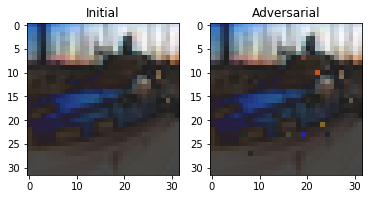

Total distortion: 2.9122420037076555
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 8.471617    0.5808557  -1.2371231  -1.5548043   0.9562992  -5.9320683
  -7.409514   -1.6679673  -0.16625264  8.309632  ]] 0
initial_114_1.png
output/cifar/initial_114_1.png output/cifar/adversarial_114_1.png


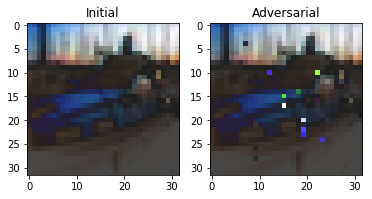

Total distortion: 4.192692512182235
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[11.993595   -0.25363085  4.353091   -2.1821542  -1.5534496  -5.991528
  -6.851098   -2.7362285   4.3919806   0.54265505]] 0
initial_115_1.png
output/cifar/initial_115_1.png output/cifar/adversarial_115_1.png


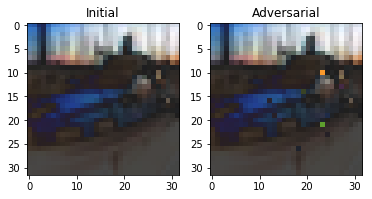

Total distortion: 2.7478671038835683
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 6.537758   2.2937326 -4.3233485 -0.8803762 -1.4769268 -4.8633523
  -6.670305  -2.326384   3.3655653 10.118278 ]] 9
initial_116_1.png
output/cifar/initial_116_1.png output/cifar/adversarial_116_1.png


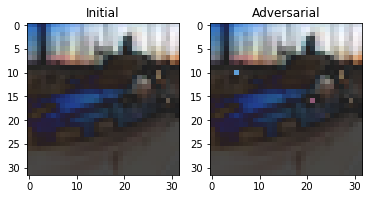

Total distortion: 1.578435130852957
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[12.543267    2.7402925  -2.5297842  -0.35094997 -0.8411486  -8.477907
  -9.195105   -1.5670608   2.9632812   6.164194  ]] 0
initial_117_1.png
output/cifar/initial_117_1.png output/cifar/adversarial_117_1.png


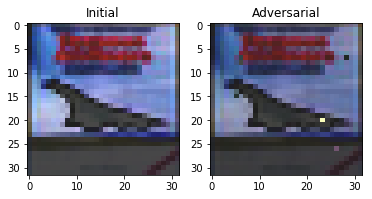

Total distortion: 6.852496684817125
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 14.7846365   9.061001   -1.6247241  -0.5945935  -3.0325217 -12.244472
   -9.430232   -7.334686   11.611754    5.618997 ]] 0
initial_118_1.png
output/cifar/initial_118_1.png output/cifar/adversarial_118_1.png


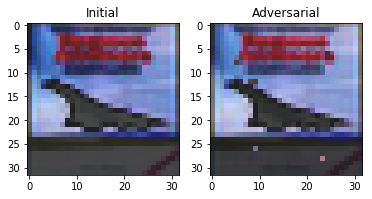

Total distortion: 6.065106333078009
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 23.464159     0.8743975    5.400972     1.3533994   -0.49790704
  -14.231458   -13.324227    -4.6773863    5.5933514    0.66588837]] 0
initial_119_1.png
output/cifar/initial_119_1.png output/cifar/adversarial_119_1.png


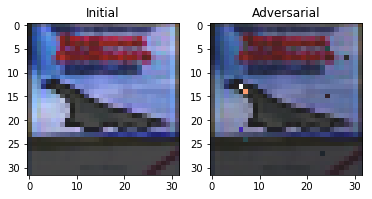

Total distortion: 7.968569764735638
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[13.697596    4.0939064  -2.2272248  -1.6896383  -0.21344721 -8.786407
  -9.019668   -3.877387    7.320654    3.9469426 ]] 0
initial_120_1.png
output/cifar/initial_120_1.png output/cifar/adversarial_120_1.png


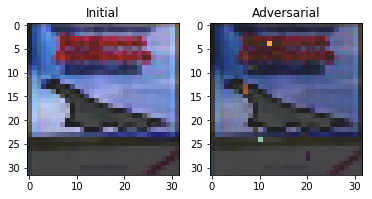

Total distortion: 9.620368140268692
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 16.658068     3.8326056   -0.55245304  -0.9862629    2.086088
   -9.425982   -10.716977    -2.4134169    2.0047145    1.3438116 ]] 0
initial_121_1.png
output/cifar/initial_121_1.png output/cifar/adversarial_121_1.png


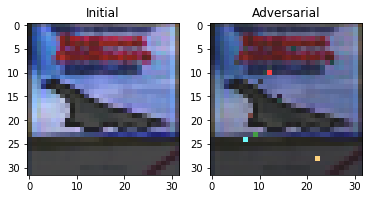

Total distortion: 8.61232987943149
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[14.978427    0.32584682  2.184791    0.5911951  -2.8072715  -8.160211
  -4.6188626  -5.472304    4.3175464   1.4148301 ]] 0
initial_122_1.png
output/cifar/initial_122_1.png output/cifar/adversarial_122_1.png


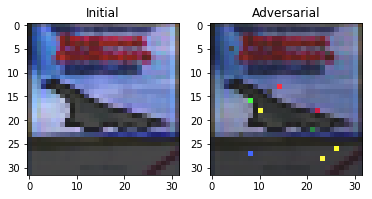

Total distortion: 8.451571111944448
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[14.753932    3.7355378   2.4545379   0.06832021 -3.7366285  -9.117871
  -4.1050177  -5.2425222   4.152585    1.1180625 ]] 0
initial_123_1.png
output/cifar/initial_123_1.png output/cifar/adversarial_123_1.png


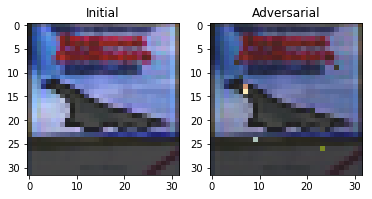

Total distortion: 7.3616955251245395
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 19.872854    6.8321304  -0.6151538  -4.207138   -2.4159582 -13.068355
  -13.346724   -1.097325    4.3791437   7.0562043]] 0
initial_124_1.png
output/cifar/initial_124_1.png output/cifar/adversarial_124_1.png


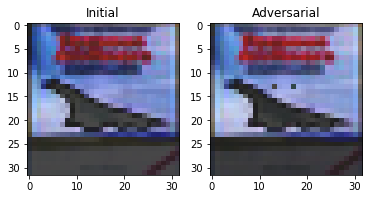

Total distortion: 5.777887139548788
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 24.199984    3.5024116   2.977474   -2.4936285   1.3903    -16.400341
  -11.740114   -8.04411    12.148458    1.947078 ]] 0
initial_125_1.png
output/cifar/initial_125_1.png output/cifar/adversarial_125_1.png


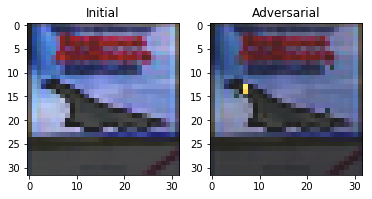

Total distortion: 7.800001232440557
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 13.3515005   8.799754   -4.6175714  -1.6230305  -5.214348  -11.564023
   -9.492021   -5.2362986  10.294228   10.641739 ]] 0
initial_126_1.png
output/cifar/initial_126_1.png output/cifar/adversarial_126_1.png


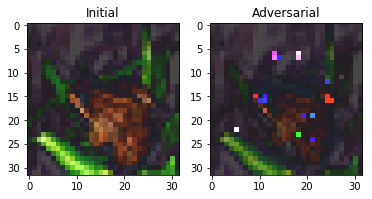

Total distortion: 8.377643680370626
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 7.468474    5.171009   -0.90572864 -1.0627435  -3.7121692  -3.2469926
  -4.142387   -5.0840507   5.688603    5.3965983 ]] 0
initial_127_1.png
output/cifar/initial_127_1.png output/cifar/adversarial_127_1.png


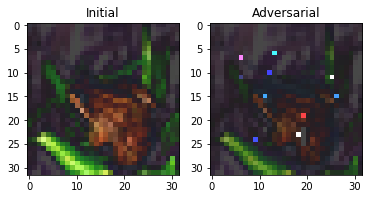

Total distortion: 7.886494800095515
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 0.13264355  1.6521803  -0.904201    1.8115169  -1.228411   -1.1198415
   1.1153429  -3.138766    1.43963     1.334575  ]] 3
initial_128_1.png
output/cifar/initial_128_1.png output/cifar/adversarial_128_1.png


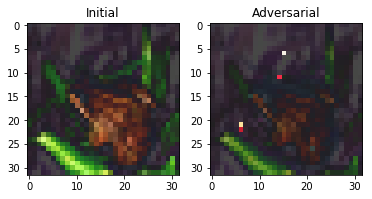

Total distortion: 7.225717856044218
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[-0.82690436 -4.266785    6.0894146   5.2806315   6.0440984  -1.0581123
   1.1854435  -3.6629179  -3.0224197  -3.5871544 ]] 2
initial_129_1.png
output/cifar/initial_129_1.png output/cifar/adversarial_129_1.png


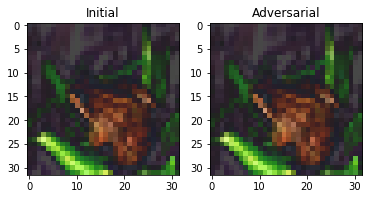

Total distortion: 1.595837590914924
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[  0.7433594  -6.9388356  12.580313    4.464515    8.478893   -4.792444
   11.9675    -10.851301   -6.755159   -6.509043 ]] 2
initial_130_1.png
output/cifar/initial_130_1.png output/cifar/adversarial_130_1.png


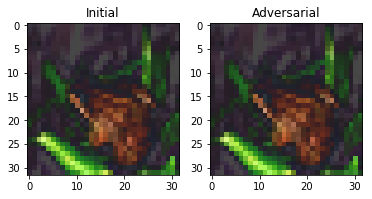

Total distortion: 0.0
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
initial_131_1.png
output/cifar/initial_131_1.png output/cifar/adversarial_131_1.png


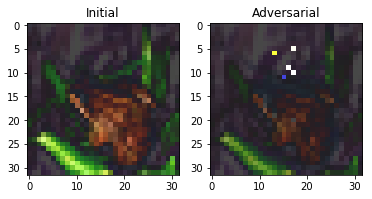

Total distortion: 7.417073385109362
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[-3.7035697 -7.3898244  5.697412   4.942698   5.623452   2.8342376
   1.8020486 -2.2988276 -4.231429  -3.87033  ]] 2
initial_132_1.png
output/cifar/initial_132_1.png output/cifar/adversarial_132_1.png


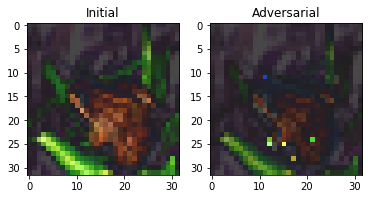

Total distortion: 7.249775850185279
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[-0.4347517  -3.8216047   2.8925538   6.9826074   0.74688554 -1.3697706
   5.583187   -4.5187273  -0.02047643 -3.8301756 ]] 3
initial_133_1.png
output/cifar/initial_133_1.png output/cifar/adversarial_133_1.png


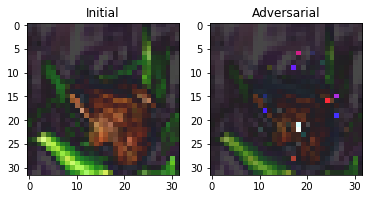

Total distortion: 7.607134792802043
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 5.839581    1.385585    4.7613187  -0.30779597  1.8338169  -4.965781
   3.537637   -7.6724215   2.6476831  -3.0932765 ]] 0
initial_134_1.png
output/cifar/initial_134_1.png output/cifar/adversarial_134_1.png


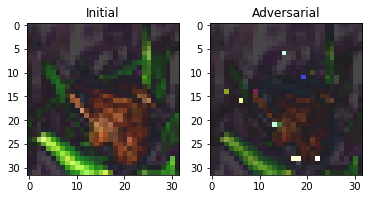

Total distortion: 7.869291870754264
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 1.0607378  -2.9919596   3.8951135   2.656719    0.61947215 -2.0529885
   2.0978525  -1.8774003   0.42269316 -2.9282439 ]] 2
initial_135_1.png
output/cifar/initial_135_1.png output/cifar/adversarial_135_1.png


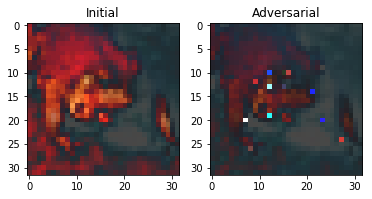

Total distortion: 9.888787410753562
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[11.438166    0.5932704  -0.991243    2.7323842  -3.14085    -9.48456
  -1.6133839  -8.997739   15.391767    0.49438813]] 8
initial_136_1.png
output/cifar/initial_136_1.png output/cifar/adversarial_136_1.png


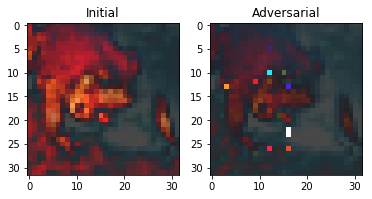

Total distortion: 10.031387280627031
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 15.324388    2.0036662   1.4517045   1.5239409  -1.3880477 -10.925395
   -1.5422696 -10.634873   12.820325   -2.576282 ]] 0
initial_137_1.png
output/cifar/initial_137_1.png output/cifar/adversarial_137_1.png


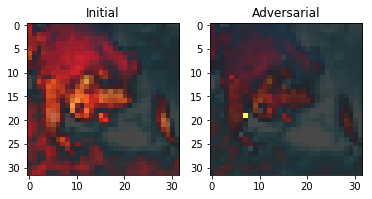

Total distortion: 9.398008874265933
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[11.295025  -2.6759498  6.9310594  1.8997593 -2.7659452 -8.70284
   3.939529  -9.361514   8.682562  -2.5569937]] 0
initial_138_1.png
output/cifar/initial_138_1.png output/cifar/adversarial_138_1.png


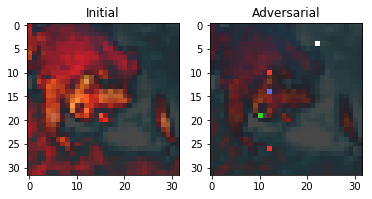

Total distortion: 9.557805124292152
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 5.9810376 -1.6723882  1.9346659  5.827472  -2.4613838 -6.675695
   0.9187352 -4.7352915  4.6409073 -0.4344187]] 0
initial_139_1.png
output/cifar/initial_139_1.png output/cifar/adversarial_139_1.png


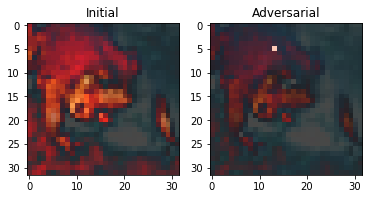

Total distortion: 8.678697696150724
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 5.1138344  -2.3665197   2.608315    4.130306   -0.52604604 -6.003993
   2.64723    -5.44631     6.2739296  -2.1484265 ]] 8
initial_140_1.png
output/cifar/initial_140_1.png output/cifar/adversarial_140_1.png


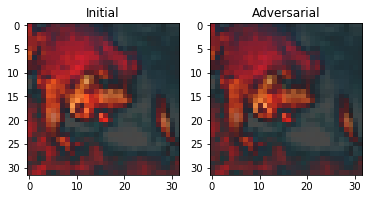

Total distortion: 2.485507443079435
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 5.76655     3.3469157  -1.0143946  -0.37616447 -3.6876788  -2.984228
   0.4048706  -5.4358196   4.966515    1.6690747 ]] 0
initial_141_1.png
output/cifar/initial_141_1.png output/cifar/adversarial_141_1.png


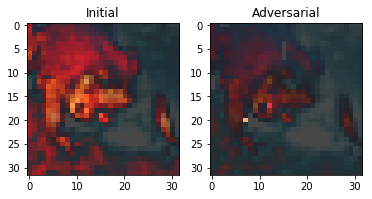

Total distortion: 9.366314743146088
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 9.641577    0.85317695  3.2225828   2.0936823  -5.245748   -9.5987625
   2.2650435  -8.931696   11.97179     0.02458542]] 8
initial_142_1.png
output/cifar/initial_142_1.png output/cifar/adversarial_142_1.png


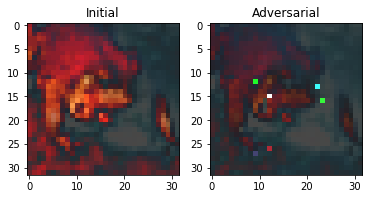

Total distortion: 9.726300118825495
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[11.273079   -2.80085     4.029536   -0.3388162  -0.87725854 -6.3109446
   1.3184495  -7.795414    8.648904   -2.6371443 ]] 0
initial_143_1.png
output/cifar/initial_143_1.png output/cifar/adversarial_143_1.png


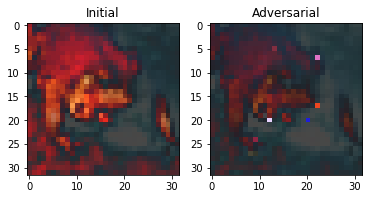

Total distortion: 9.274088244596053
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 8.463624  -2.0388408  6.154292   3.1975038 -2.7300007 -3.8311322
   2.2037404 -7.085891   3.518935  -3.529114 ]] 0
initial_144_1.png
output/cifar/initial_144_1.png output/cifar/adversarial_144_1.png


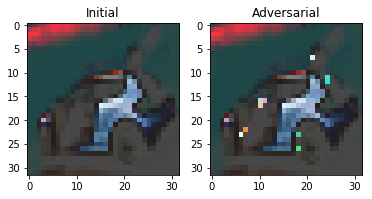

Total distortion: 4.854881441375727
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[13.9140005  -6.873547    6.8277955   0.29857472  3.445734   -7.5836706
  -6.0781183  -4.481456    4.9311566  -0.1542078 ]] 0
initial_145_1.png
output/cifar/initial_145_1.png output/cifar/adversarial_145_1.png


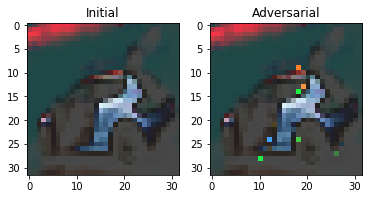

Total distortion: 3.6290702331087417
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[ 8.043864  -1.3773881 -2.8624148 -1.703868   2.8600895 -9.379102
  -4.5579505 -5.435989  15.466687   3.0232115]] 8
initial_146_1.png
output/cifar/initial_146_1.png output/cifar/adversarial_146_1.png


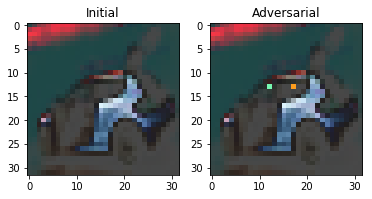

Total distortion: 1.9690297851363316
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[11.019856  -1.2117363 -2.5789976 -3.2624516  2.3480911 -7.464043
  -4.118262  -6.683927  14.371936   2.8229299]] 8
initial_147_1.png
output/cifar/initial_147_1.png output/cifar/adversarial_147_1.png


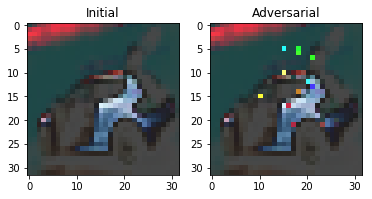

Total distortion: 5.514611169936718
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[ 3.8661559 -2.0913422 -1.651362  -4.2633023  4.59501   -6.906172
  -5.6377892 -3.642259  19.139212  -0.6119051]] 8
initial_148_1.png
output/cifar/initial_148_1.png output/cifar/adversarial_148_1.png


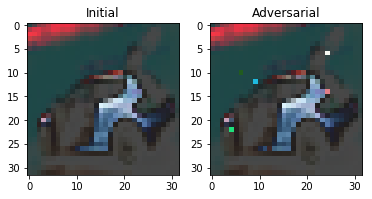

Total distortion: 3.333425679517133
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[12.461198   -2.293324   -0.25096264 -2.6633482   3.5624611  -7.9017673
  -4.8354564  -6.2316885  11.043807    0.7725302 ]] 0
initial_149_1.png
output/cifar/initial_149_1.png output/cifar/adversarial_149_1.png


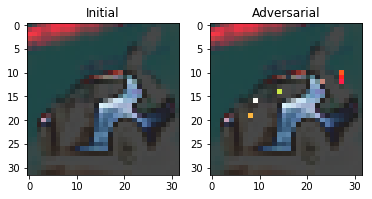

Total distortion: 3.786125885625273
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[ 14.934791   -1.5979078  -0.1362744  -3.9780982   4.379468  -10.687003
   -6.569922   -7.445323   16.285494    0.5874314]] 8
initial_150_1.png
output/cifar/initial_150_1.png output/cifar/adversarial_150_1.png


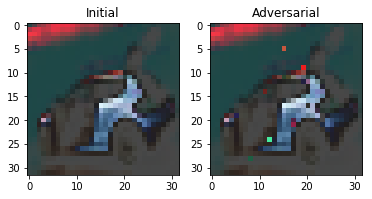

Total distortion: 4.094585304362002
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[ 7.029823   1.231347  -5.351388  -1.5298517 -0.8678055 -6.4414835
  -5.6728806 -3.5773134 14.497389   4.970392 ]] 8
initial_151_1.png
output/cifar/initial_151_1.png output/cifar/adversarial_151_1.png


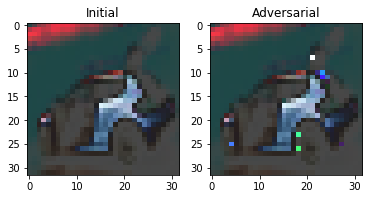

Total distortion: 4.527732588861696
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[ 9.081158   -2.9466362   0.9284506  -1.9285928   0.46367273 -5.7357373
  -6.309394   -3.3315825   8.582957    4.56106   ]] 0
initial_152_1.png
output/cifar/initial_152_1.png output/cifar/adversarial_152_1.png


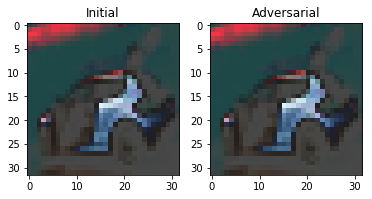

Total distortion: 0.36237924636347696
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[11.055836  -1.1756971 -2.2487857 -1.96483    1.7819332 -7.5210924
  -6.9478774 -5.104782  12.976041   3.4344103]] 8
initial_153_1.png
output/cifar/initial_153_1.png output/cifar/adversarial_153_1.png


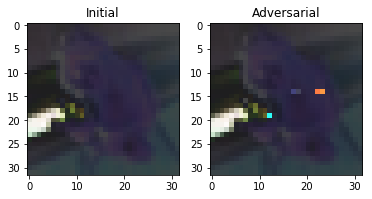

Total distortion: 3.3630327050929645
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[ 26.25586    -2.2355628  -3.713005    3.9765532  -6.181229   -5.5958157
  -11.724448   -4.9672623   3.3025033   5.5267034]] 0
initial_154_1.png
output/cifar/initial_154_1.png output/cifar/adversarial_154_1.png


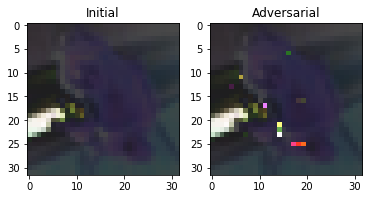

Total distortion: 4.813329055516534
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[14.70567    5.9418917 -4.3845105  2.3446052 -8.715226  -3.7664886
  -1.2658021 -5.3428383  1.9490165  3.977434 ]] 0
initial_155_1.png
output/cifar/initial_155_1.png output/cifar/adversarial_155_1.png


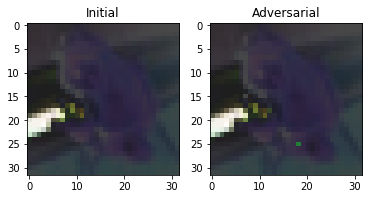

Total distortion: 1.2254761665700553
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[19.410654   -2.2344267  -4.019305    6.777298   -7.3551345  -0.87549984
  -8.845587   -5.2089214   0.48246112  5.478362  ]] 0
initial_156_1.png
output/cifar/initial_156_1.png output/cifar/adversarial_156_1.png


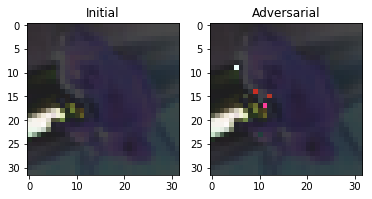

Total distortion: 3.333681724143837
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[17.915524   -2.9280927  -3.5088434   5.524826   -8.52473    -0.14251602
  -9.225705   -1.9554989  -2.9290483   6.6784096 ]] 0
initial_157_1.png
output/cifar/initial_157_1.png output/cifar/adversarial_157_1.png


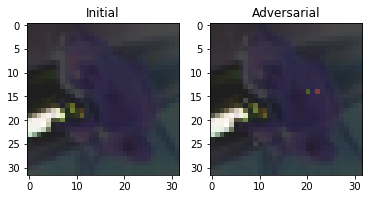

Total distortion: 1.8230781992233351
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[ 20.97097    -3.5338721  -3.7852798   6.911512   -6.159072   -1.7650908
  -10.261143   -5.1879053   0.5916773   6.0074406]] 0
initial_158_1.png
output/cifar/initial_158_1.png output/cifar/adversarial_158_1.png


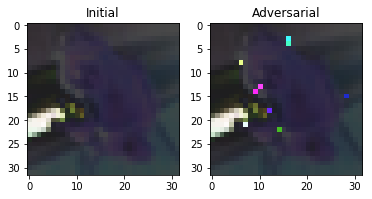

Total distortion: 4.61314522383603
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[ 13.673889    0.7918407  -6.2469783   9.520119   -8.499319   -2.073765
  -12.263074    1.8634022  -7.167064   10.573582 ]] 0
initial_159_1.png
output/cifar/initial_159_1.png output/cifar/adversarial_159_1.png


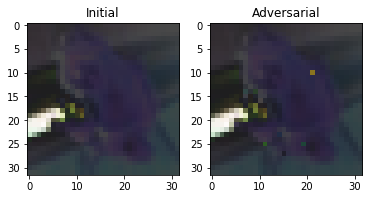

Total distortion: 2.7582236353640117
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[14.760229  -4.2314844 -3.027585   6.509456  -6.0732036  0.5055946
  -6.778838  -5.0264754  3.3134892  3.6262982]] 0
initial_160_1.png
output/cifar/initial_160_1.png output/cifar/adversarial_160_1.png


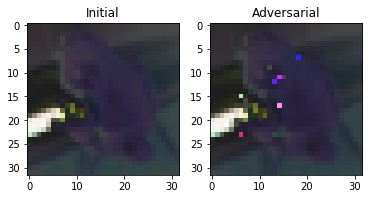

Total distortion: 4.320218021401398
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[16.97499   -4.8266635  0.9861319  4.9881587 -1.8015039 -5.551625
  -8.751994  -2.620674   2.4459116  2.338663 ]] 0
initial_161_1.png
output/cifar/initial_161_1.png output/cifar/adversarial_161_1.png


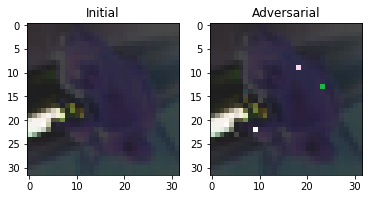

Total distortion: 3.8500160068327838
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[18.9934    -2.4743235 -4.849953   5.428401  -4.594344  -2.1384256
  -7.934648  -7.6369295  5.941836   4.4478865]] 0
initial_162_1.png
output/cifar/initial_162_1.png output/cifar/adversarial_162_1.png


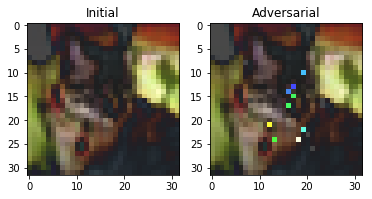

Total distortion: 4.941089339516538
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[ 5.198646  -8.505788   4.0052805  7.996804   9.6390085 -5.3712935
  -3.8166761 -5.247902   1.6271589 -3.382312 ]] 4
initial_163_1.png
output/cifar/initial_163_1.png output/cifar/adversarial_163_1.png


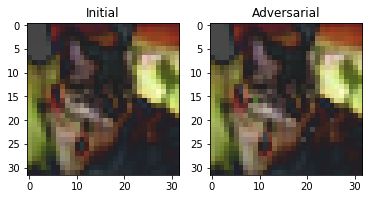

Total distortion: 3.6736582220398293
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[-0.30872574 -9.981092    5.711919    8.106267    9.682775   -3.6853864
   3.7372649  -3.882114   -2.9479551  -4.3599224 ]] 4
initial_164_1.png
output/cifar/initial_164_1.png output/cifar/adversarial_164_1.png


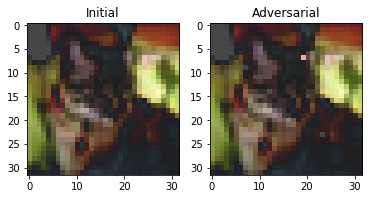

Total distortion: 2.463937438616495
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[-0.89781076 -9.929484    5.390277    7.515856    7.6232095  -1.6503717
   4.4053526  -4.482779   -2.672674   -4.5200305 ]] 4
initial_165_1.png
output/cifar/initial_165_1.png output/cifar/adversarial_165_1.png


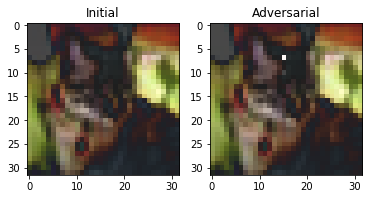

Total distortion: 3.0869472734788137
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[-0.33660844 -7.233152    5.440485    5.543851    4.0301814  -2.1270773
   2.6242304  -4.314494   -0.7504443  -1.5614959 ]] 3
initial_166_1.png
output/cifar/initial_166_1.png output/cifar/adversarial_166_1.png


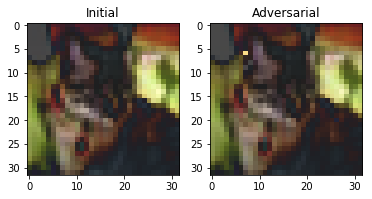

Total distortion: 2.6980850775943854
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[ -1.3816617  -10.082173     9.140562     7.34227      5.5467186
    0.42905453   5.040359    -5.118605    -3.050109    -6.095084  ]] 2
initial_167_1.png
output/cifar/initial_167_1.png output/cifar/adversarial_167_1.png


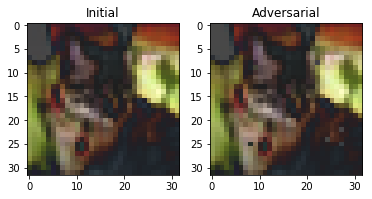

Total distortion: 3.010130308758743
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[-1.3345287 -8.904826   5.6384068  7.849418   7.538031  -1.9134133
   5.486509  -5.1762314 -3.2535205 -4.0241694]] 3
initial_168_1.png
output/cifar/initial_168_1.png output/cifar/adversarial_168_1.png


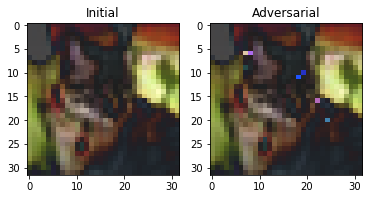

Total distortion: 3.039461320533386
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[-1.4036901 -8.496018  13.620047   9.247318   1.7098534  1.4317881
   4.6534796 -7.6077085 -3.2048948 -6.1765437]] 2
initial_169_1.png
output/cifar/initial_169_1.png output/cifar/adversarial_169_1.png


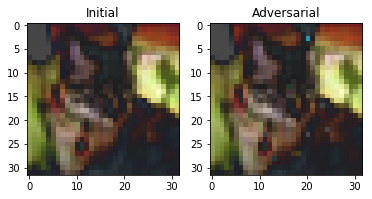

Total distortion: 3.7406833628194227
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[-0.572442  -9.685871   4.9291463  8.3230715  9.042322  -2.3052793
   3.7164762 -4.41872   -1.9339337 -5.8128033]] 4
initial_170_1.png
output/cifar/initial_170_1.png output/cifar/adversarial_170_1.png


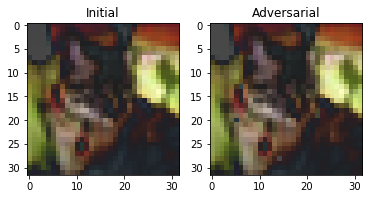

Total distortion: 3.5850839700268606
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[-0.6459216 -9.678237   5.819924   8.105274   8.369816  -2.1474283
   3.9264615 -4.5348167 -2.603095  -4.910377 ]] 4
initial_171_1.png
output/cifar/initial_171_1.png output/cifar/adversarial_171_1.png


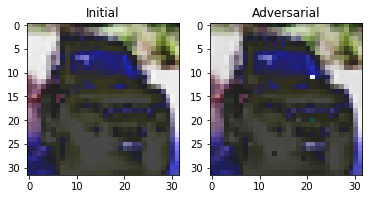

Total distortion: 3.4778832145067144
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[-0.38433516  5.381869   -0.88993716 -3.438751   -3.7348547  -3.1888258
   0.32831872 -0.98634267  2.8441234   2.9265301 ]] 1
initial_172_1.png
output/cifar/initial_172_1.png output/cifar/adversarial_172_1.png


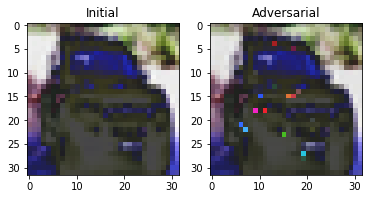

Total distortion: 4.99632166028736
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[ 3.8352034   1.7683808   2.055117    1.1726756  -5.931751   -3.1011138
  -0.58965397 -2.553238   -2.3753734   6.9816465 ]] 9
initial_173_1.png
output/cifar/initial_173_1.png output/cifar/adversarial_173_1.png


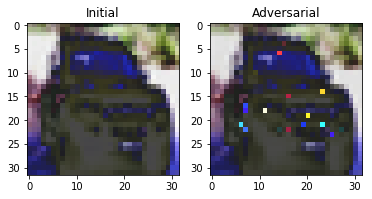

Total distortion: 5.880038758753496
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[ 3.0698113   1.089968    0.35209143  0.8610388  -4.7156816  -2.8982759
  -0.4335969  -3.5268555   0.31652972  5.9890137 ]] 9
initial_174_1.png
output/cifar/initial_174_1.png output/cifar/adversarial_174_1.png


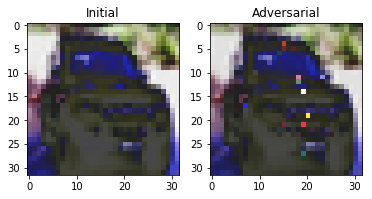

Total distortion: 5.133943151607305
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[-2.0168946  1.6741601  1.2250457 -0.5677023 -2.2502482 -3.1751306
  -2.637171  -1.6235942 -0.4537963 10.307362 ]] 9
initial_175_1.png
output/cifar/initial_175_1.png output/cifar/adversarial_175_1.png


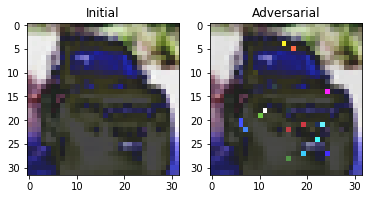

Total distortion: 6.298208847948979
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[ 3.3754535   3.4107027  -0.04512034  0.9775634  -8.443571   -5.3583307
  -1.1929787  -0.71284854 -2.50462    10.5738735 ]] 9
initial_176_1.png
output/cifar/initial_176_1.png output/cifar/adversarial_176_1.png


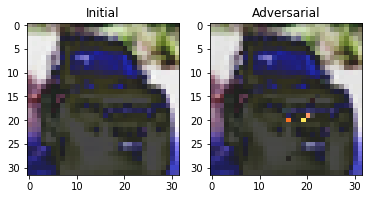

Total distortion: 4.217048584500549
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[-2.316071    1.8589107  -0.07780266  2.572259   -6.525577    4.952717
   6.7667527   0.55588937 -5.5857124  -1.2159393 ]] 6
initial_177_1.png
output/cifar/initial_177_1.png output/cifar/adversarial_177_1.png


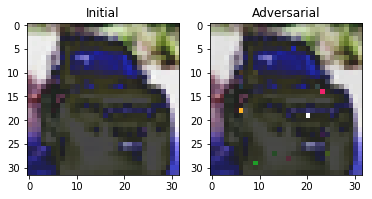

Total distortion: 4.59009016958192
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[-0.7445636  -0.26229072  1.6837373   4.9868484  -3.9311924   1.2318338
   2.0691767  -0.14716968 -4.8204446   0.48409548]] 3
initial_178_1.png
output/cifar/initial_178_1.png output/cifar/adversarial_178_1.png


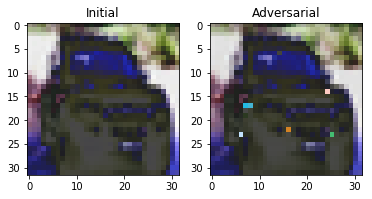

Total distortion: 4.613068526464613
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[ 6.220526    7.124988   -1.7757792  -0.41437933 -8.516456   -2.7446396
  -3.3041306  -1.9263252  -0.48626813  8.813579  ]] 9
initial_179_1.png
output/cifar/initial_179_1.png output/cifar/adversarial_179_1.png


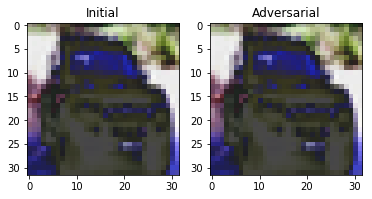

Total distortion: 0.69726774071124
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[ 0.5937339   6.990328    0.45825052 -0.54394805 -9.093852    0.9522987
  -0.20260301 -1.3307757  -0.7765901   4.314007  ]] 1
initial_180_2.png
output/cifar/initial_180_2.png output/cifar/adversarial_180_2.png


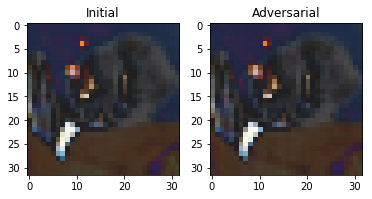

Total distortion: 1.164679600530457
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 8.73448    -8.846551    0.69441426  9.316321   -0.6535404  -1.6732634
  -3.924455   -2.96515     5.7041507  -3.1849797 ]] 3
initial_181_2.png
output/cifar/initial_181_2.png output/cifar/adversarial_181_2.png


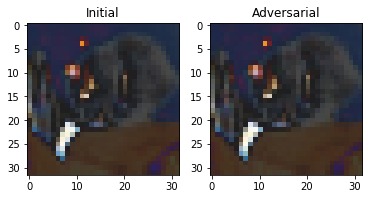

Total distortion: 1.0738440952660704
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 5.247322  -6.3793077 -1.613536  10.350995  -2.3717275 -1.6438525
  -1.5433725 -3.2294953  6.063998  -1.6052929]] 3
initial_182_2.png
output/cifar/initial_182_2.png output/cifar/adversarial_182_2.png


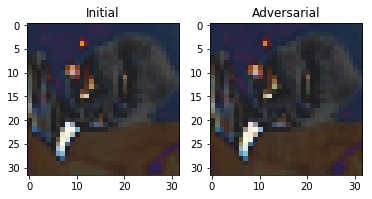

Total distortion: 1.429082356775245
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 8.236624  -9.121704   1.8940117  7.642394  -0.8939096 -0.7223748
  -4.5693445 -1.715176   6.1172366 -3.2819695]] 0
initial_183_2.png
output/cifar/initial_183_2.png output/cifar/adversarial_183_2.png


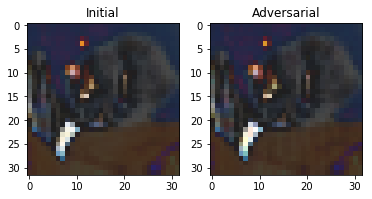

Total distortion: 1.379628886341878
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[  7.2714314  -10.020604     2.7588518    7.7961245    1.690094
    0.41848436  -4.347898    -1.1056825    4.5565844   -5.244653  ]] 3
initial_184_2.png
output/cifar/initial_184_2.png output/cifar/adversarial_184_2.png


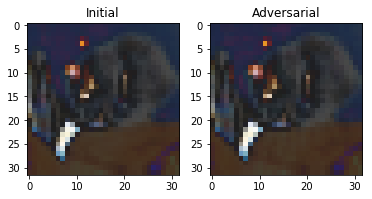

Total distortion: 0.9047017849072756
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 5.3016744 -7.799254  -1.2592833 10.243436  -2.6530118  1.8786336
  -2.2105715 -2.7957354  4.0032773 -2.153752 ]] 3
initial_185_2.png
output/cifar/initial_185_2.png output/cifar/adversarial_185_2.png


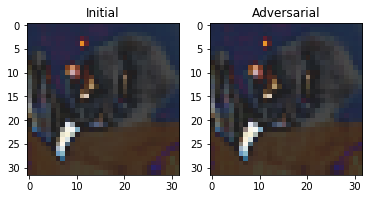

Total distortion: 0.989627147842318
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 5.295544   -7.5621037  -0.17644045 10.078359   -2.082008   -0.30865738
  -2.243466   -2.4979382   5.211639   -2.454375  ]] 3
initial_186_2.png
output/cifar/initial_186_2.png output/cifar/adversarial_186_2.png


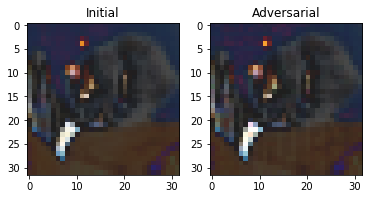

Total distortion: 1.9127249267554178
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 5.422191  -9.539383   2.1810417  7.429662  -1.4743346  2.9501278
  -6.1508956  1.1784326  4.8822503 -3.9410098]] 3
initial_187_2.png
output/cifar/initial_187_2.png output/cifar/adversarial_187_2.png


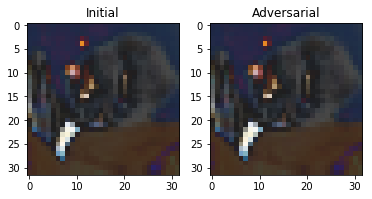

Total distortion: 0.6432209915279979
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 5.9237394  -8.379527   -0.08049738 10.723176   -2.4539213  -0.93748474
  -2.063079   -2.8158417   6.09759    -2.4697459 ]] 3
initial_188_2.png
output/cifar/initial_188_2.png output/cifar/adversarial_188_2.png


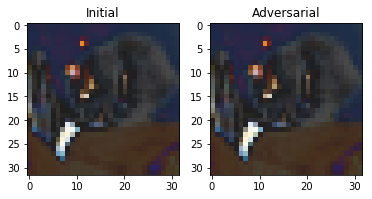

Total distortion: 0.7873471187361265
[[ 6.239537   -7.7096834  -1.0667988   9.911581   -1.8099449  -0.42242736
  -2.6084588  -3.1465178   6.009      -2.2528546 ]] 3
[[ 4.828273   -7.272608   -1.5710918  10.4795265  -3.271858   -0.23393384
  -2.3321776  -2.8474152   6.2213826  -1.025984  ]] 3
initial_189_2.png
output/cifar/initial_189_2.png output/cifar/adversarial_189_2.png


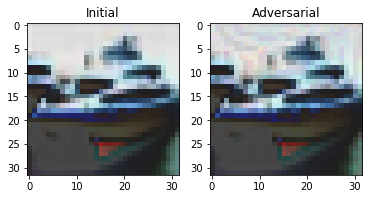

Total distortion: 1.9710476501371874
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 31.570639    5.8574963  -2.265134   -2.5778966   0.3416836 -24.645422
  -12.572139  -17.65026    27.344107    5.082912 ]] 0
initial_190_2.png
output/cifar/initial_190_2.png output/cifar/adversarial_190_2.png


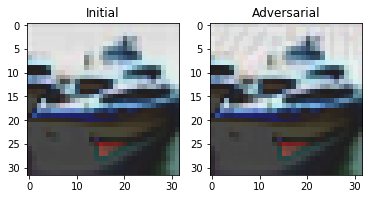

Total distortion: 1.1086254005134626
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 31.596653    7.05507    -2.9699774  -2.1554296  -2.5342493 -23.824326
  -11.752808  -18.682913   29.81245     4.5108147]] 0
initial_191_2.png
output/cifar/initial_191_2.png output/cifar/adversarial_191_2.png


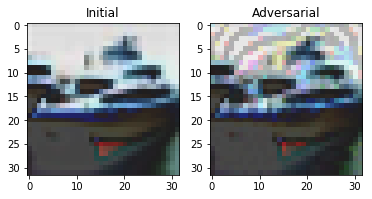

Total distortion: 5.7923958225620575
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 16.241096     4.7006574   -1.5618322    0.43959108  -0.8804345
  -12.866188    -7.040767   -10.531265    12.361489     3.447501  ]] 0
initial_192_2.png
output/cifar/initial_192_2.png output/cifar/adversarial_192_2.png


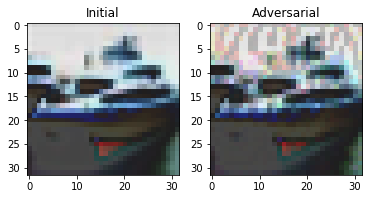

Total distortion: 5.104169614622342
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 23.46041      5.143298    -3.1466746   -0.03734663   2.9337041
  -19.840353   -12.634015   -14.475054    20.04615      6.381641  ]] 0
initial_193_2.png
output/cifar/initial_193_2.png output/cifar/adversarial_193_2.png


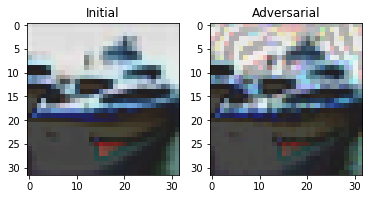

Total distortion: 5.658202113716686
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 16.085848     4.7580843   -4.2876186    1.853419    -0.73662996
  -15.435831   -12.168837   -10.977162    15.420075     9.840598  ]] 0
initial_194_2.png
output/cifar/initial_194_2.png output/cifar/adversarial_194_2.png


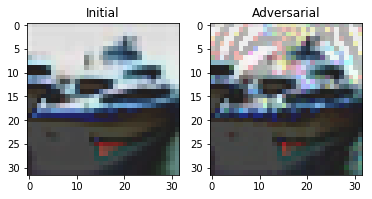

Total distortion: 6.179564656846349
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 14.567419    7.2015543  -5.6030483   0.5533682  -3.5765462 -10.917667
   -8.184146   -6.7185664   7.136702    8.802295 ]] 0
initial_195_2.png
output/cifar/initial_195_2.png output/cifar/adversarial_195_2.png


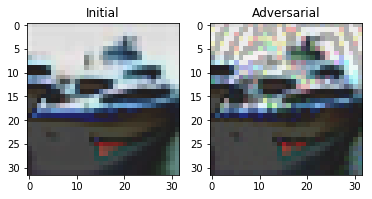

Total distortion: 6.044504731164363
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 15.142765   13.123385   -6.7784038  -1.2600037  -6.5573316 -15.834148
   -6.364187  -15.508711   22.17897     8.501952 ]] 8
initial_196_2.png
output/cifar/initial_196_2.png output/cifar/adversarial_196_2.png


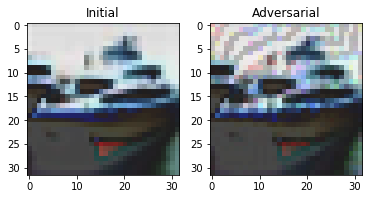

Total distortion: 5.306100918278511
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 13.256515    5.441832   -5.1694717   1.2267691  -1.8370595 -12.276846
  -10.091906   -8.606413   12.391005   10.12297  ]] 0
initial_197_2.png
output/cifar/initial_197_2.png output/cifar/adversarial_197_2.png


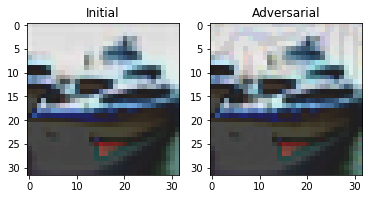

Total distortion: 2.248136596480095
[[ 34.518166    8.668957   -3.8301568  -3.0688055  -3.5728173 -28.44559
  -14.592631  -21.819052   39.67778     6.2987695]] 8
[[ 27.771774    4.3939743  -3.785377    1.0717608   0.6557592 -22.994026
  -12.620291  -15.799661   23.96909     6.4557214]] 0
initial_198_2.png
output/cifar/initial_198_2.png output/cifar/adversarial_198_2.png


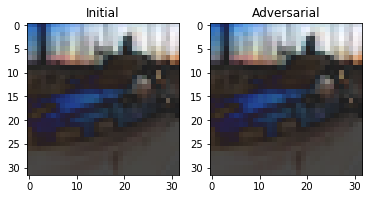

Total distortion: 0.5991664082770217
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 8.548593    0.4834837  -2.93668     2.115807   -2.2992928  -6.120441
  -7.979159    1.2321914  -0.19152272  7.7989454 ]] 0
initial_199_2.png
output/cifar/initial_199_2.png output/cifar/adversarial_199_2.png


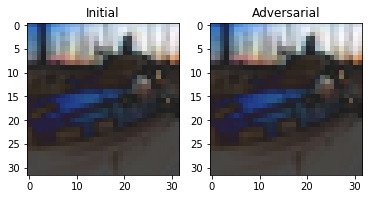

Total distortion: 0.33950459887854717
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 9.107967    1.1181866  -2.4093268   1.1832955  -1.6873584  -7.1552773
  -7.396998    0.07337978  0.8426155   7.442298  ]] 0
initial_200_2.png
output/cifar/initial_200_2.png output/cifar/adversarial_200_2.png


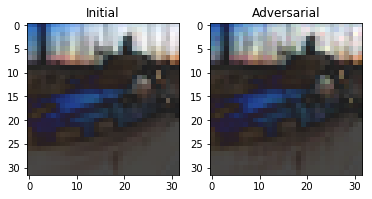

Total distortion: 1.6502490462572161
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 4.1937637  -2.042177   -1.981996    3.401068   -0.27428216 -2.2999372
  -5.611508    2.4160938  -1.9815898   4.752403  ]] 9
initial_201_2.png
output/cifar/initial_201_2.png output/cifar/adversarial_201_2.png


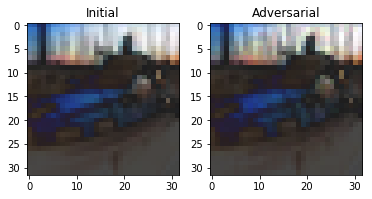

Total distortion: 1.7965707272526847
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 3.460371  -1.9834832 -2.8479545  4.51399   -1.124521  -2.248637
  -5.5241776  0.8865814 -1.8091663  7.5855684]] 9
initial_202_2.png
output/cifar/initial_202_2.png output/cifar/adversarial_202_2.png


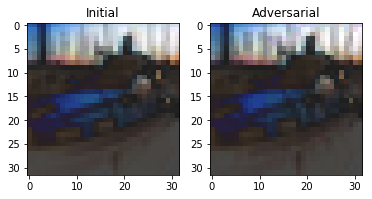

Total distortion: 1.732090863555673
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 6.3188148   0.18806043 -3.7403696   2.7423265  -0.997072   -3.800101
  -7.117832    0.05802092  0.26915053  6.9518423 ]] 9
initial_203_2.png
output/cifar/initial_203_2.png output/cifar/adversarial_203_2.png


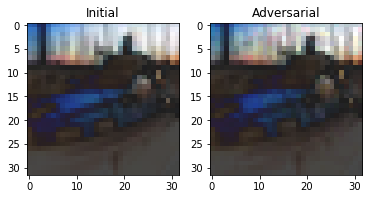

Total distortion: 1.9935729351761429
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 3.5322564 -1.8209077 -2.1528516  4.4868574 -2.3524256 -1.404588
  -5.2119217  1.4785296 -3.5158865  6.6959314]] 9
initial_204_2.png
output/cifar/initial_204_2.png output/cifar/adversarial_204_2.png


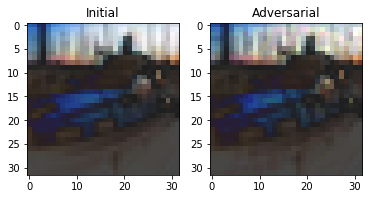

Total distortion: 2.1115125210368424
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 5.1391635  -1.6119276  -3.1316116   4.850642   -1.974246   -4.177628
  -6.0099726   0.82883084 -0.21045238  7.2893777 ]] 9
initial_205_2.png
output/cifar/initial_205_2.png output/cifar/adversarial_205_2.png


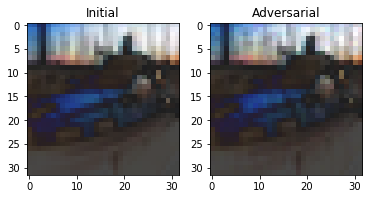

Total distortion: 1.5591330300390942
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 6.7380433 -1.2300761 -2.9005485  3.7416453 -2.408359  -4.917816
  -8.388352   3.831647  -1.1541133  7.3035502]] 9
initial_206_2.png
output/cifar/initial_206_2.png output/cifar/adversarial_206_2.png


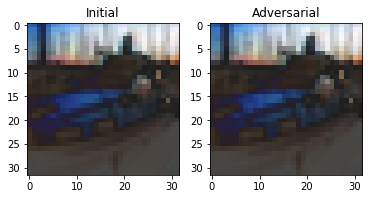

Total distortion: 0.569978119530585
[[ 9.845142    1.7082163  -2.828932    0.6521832  -1.5811741  -7.48974
  -7.602065   -0.78784764  2.2742584   7.3418617 ]] 0
[[ 7.584429   -0.51639205 -3.1383061   2.4040174  -2.0939438  -5.799622
  -7.894685    1.8529054  -0.01596633  8.539738  ]] 9
initial_207_2.png
output/cifar/initial_207_2.png output/cifar/adversarial_207_2.png


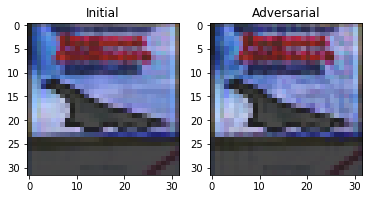

Total distortion: 2.4245382124898014
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[  9.587155   13.8195     -4.9032397  -2.5658603  -6.7119083 -12.950654
   -8.058928   -7.0889273  14.742942   10.479671 ]] 8
initial_208_2.png
output/cifar/initial_208_2.png output/cifar/adversarial_208_2.png


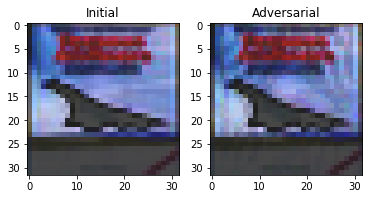

Total distortion: 2.8635966503257464
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[11.322644    1.9860476   0.4332415   1.0794386   1.3893344  -8.462402
  -7.1400714  -2.27147     3.9934475   0.67530835]] 0
initial_209_2.png
output/cifar/initial_209_2.png output/cifar/adversarial_209_2.png


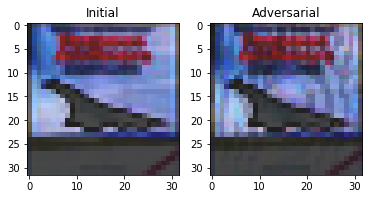

Total distortion: 4.32734755822183
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 6.282327   4.5454516 -3.5183816 -3.1606157  1.3247457 -5.444835
  -2.894006  -4.3668604  6.3153048  4.181418 ]] 8
initial_210_2.png
output/cifar/initial_210_2.png output/cifar/adversarial_210_2.png


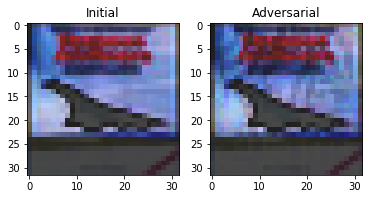

Total distortion: 3.795906351491943
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[10.657467   0.520139   0.9137317 -1.8148047  4.4576364 -7.4469943
  -6.101207  -2.9884498  4.2844343  0.5826345]] 0
initial_211_2.png
output/cifar/initial_211_2.png output/cifar/adversarial_211_2.png


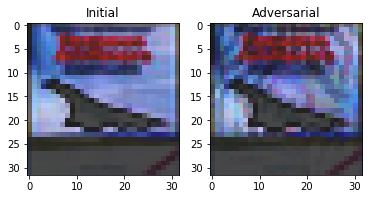

Total distortion: 5.793692730699797
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 6.8489933   2.9984977  -1.7981484  -1.6432678   3.2302508  -4.591343
  -1.6358191  -2.9505992   3.8755434  -0.05307999]] 0
initial_212_2.png
output/cifar/initial_212_2.png output/cifar/adversarial_212_2.png


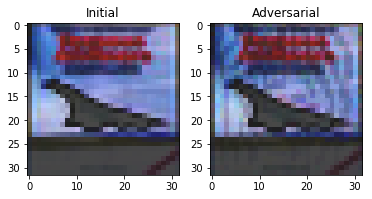

Total distortion: 3.9011370346302714
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 6.999982    5.589847   -3.1941016  -2.3687518   0.08396906 -7.089472
  -1.8112098  -5.6457124   7.520608    4.465563  ]] 8
initial_213_2.png
output/cifar/initial_213_2.png output/cifar/adversarial_213_2.png


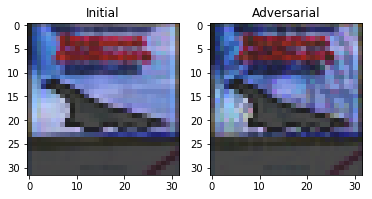

Total distortion: 5.319616241381177
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 7.605589   6.860106  -2.7277315 -4.5060387  1.6277832 -7.6698895
  -4.7905226 -1.1716664  3.2875943  3.8761625]] 0
initial_214_2.png
output/cifar/initial_214_2.png output/cifar/adversarial_214_2.png


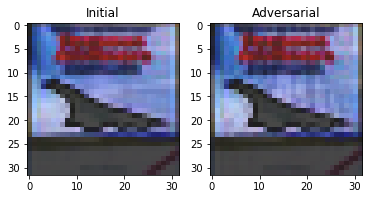

Total distortion: 1.7921311493506211
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[ 12.085474    4.7668667  -3.69913    -1.4739289  -0.9912951 -10.887254
   -8.087066   -7.001598   13.487627    6.8965006]] 8
initial_215_2.png
output/cifar/initial_215_2.png output/cifar/adversarial_215_2.png


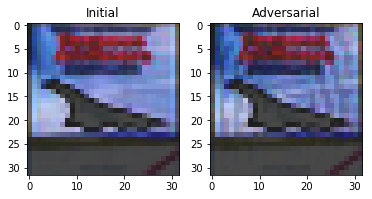

Total distortion: 4.076243701077168
[[ 22.709175     2.5825293    3.1698444    0.29763886   0.9850584
  -14.811986   -14.238879    -5.438747     7.1547074    1.6548599 ]] 0
[[  8.3093815  16.38379    -7.6037946  -2.9906394  -7.0381885 -13.288612
  -10.837306   -7.1138854  11.507753   17.918926 ]] 9
initial_216_2.png
output/cifar/initial_216_2.png output/cifar/adversarial_216_2.png


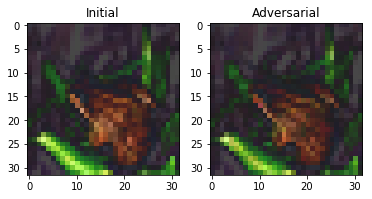

Total distortion: 2.8401580594633065
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 1.450151  -4.169201   6.3380704  2.068784   4.8647194 -1.9015198
   4.6591225 -4.7204123 -1.3090088 -5.3508615]] 2
initial_217_2.png
output/cifar/initial_217_2.png output/cifar/adversarial_217_2.png


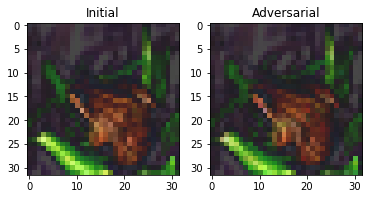

Total distortion: 2.3659640634859676
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 0.15764408 -1.126589    2.6417537   2.6581347   1.6208661  -1.6310054
   6.8610578  -5.525864   -1.2998703  -2.854662  ]] 6
initial_218_2.png
output/cifar/initial_218_2.png output/cifar/adversarial_218_2.png


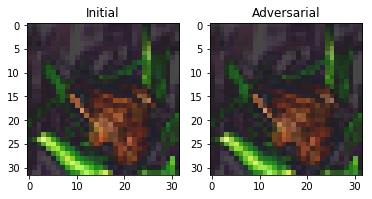

Total distortion: 1.2049367070492498
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 1.4157794 -6.662238  12.868107   3.7780561  6.528536  -4.9674745
   9.866137  -9.047308  -5.2892804 -6.4146047]] 2
initial_219_2.png
output/cifar/initial_219_2.png output/cifar/adversarial_219_2.png


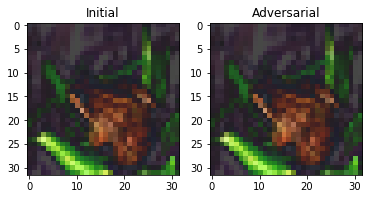

Total distortion: 0.765319023493935
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[-0.44630885 -5.0495167   9.144217    5.6318917   6.0946364  -3.036463
  11.364404   -9.485622   -6.003722   -6.368436  ]] 6
initial_220_2.png
output/cifar/initial_220_2.png output/cifar/adversarial_220_2.png


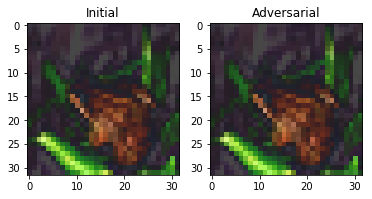

Total distortion: 0.01880718175642595
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
initial_221_2.png
output/cifar/initial_221_2.png output/cifar/adversarial_221_2.png


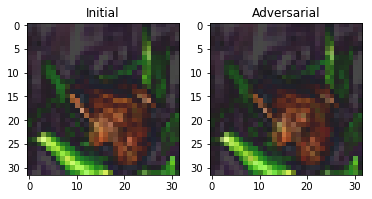

Total distortion: 1.9831858999553567
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[-7.9605263e-01 -2.5888228e+00  4.3746004e+00  3.2844634e+00
   4.8606381e+00 -5.2184500e-03  6.5821991e+00 -6.1469970e+00
  -3.7896702e+00 -4.0557394e+00]] 6
initial_222_2.png
output/cifar/initial_222_2.png output/cifar/adversarial_222_2.png


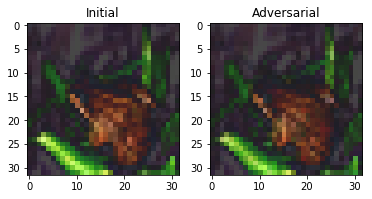

Total distortion: 2.4288983305332357
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 0.05125799 -0.29777193  0.9754516   3.3143811  -0.3638785  -0.3981384
   6.5987     -5.2366395  -1.4846574  -2.913842  ]] 6
initial_223_2.png
output/cifar/initial_223_2.png output/cifar/adversarial_223_2.png


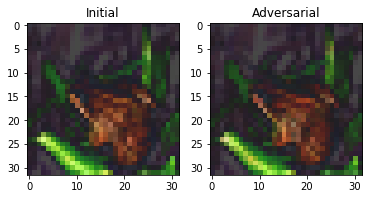

Total distortion: 2.3318235985400464
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 1.0588133  -2.0794938   2.5520747   5.1969094   3.9011102  -2.488482
   4.7528596  -5.9597745   0.34109253 -4.182849  ]] 3
initial_224_2.png
output/cifar/initial_224_2.png output/cifar/adversarial_224_2.png


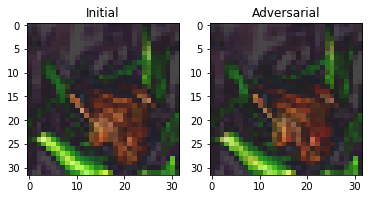

Total distortion: 2.3237074345655215
[[ 0.4785777 -5.7188663 10.182167   4.042358   7.1508183 -3.4588425
  10.706452  -9.453104  -5.7303114 -6.577205 ]] 6
[[ 1.1621344 -2.393973   5.1219497  1.9221381  1.111999  -2.7207046
   7.6084676 -6.1645465 -0.6903224 -4.311568 ]] 6
initial_225_2.png
output/cifar/initial_225_2.png output/cifar/adversarial_225_2.png


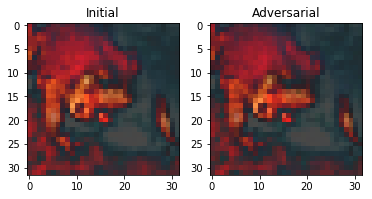

Total distortion: 1.9661809113933322
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 9.654669   6.1507173 -2.199563  -2.2656908 -5.3477144 -5.765702
  -1.949329  -6.972595   7.240314   5.048605 ]] 0
initial_226_2.png
output/cifar/initial_226_2.png output/cifar/adversarial_226_2.png


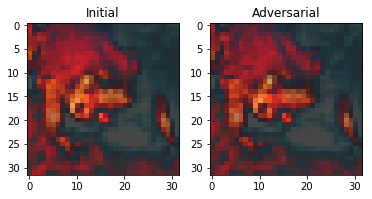

Total distortion: 2.20215211855291
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 9.593257    8.750595   -3.0228786  -2.6813579  -5.620526   -5.8267736
  -0.41159913 -7.996847    6.379346    5.042343  ]] 0
initial_227_2.png
output/cifar/initial_227_2.png output/cifar/adversarial_227_2.png


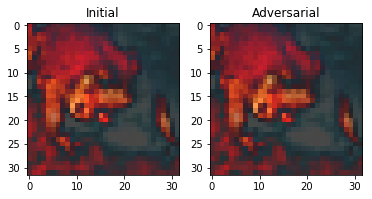

Total distortion: 1.0210397018686654
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 6.659529    4.7564464  -1.340559   -1.1643951  -4.9067106  -3.5033731
  -0.35687235 -6.378287    6.51647     2.9131181 ]] 0
initial_228_2.png
output/cifar/initial_228_2.png output/cifar/adversarial_228_2.png


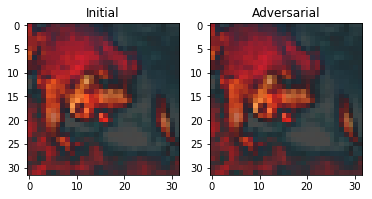

Total distortion: 1.2260532658410999
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 5.5783944   4.408758   -1.9653594  -1.0450543  -4.9002237  -3.2445714
  -0.15853378 -6.3195553   7.728504    3.1551151 ]] 8
initial_229_2.png
output/cifar/initial_229_2.png output/cifar/adversarial_229_2.png


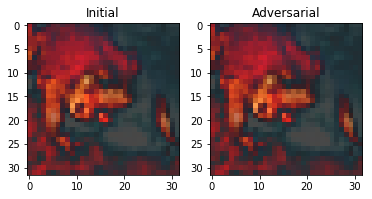

Total distortion: 0.9559462021091482
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 6.674278    4.507656   -1.5147607  -1.7234896  -4.2816334  -3.9653955
  -0.36264813 -5.898447    6.3006787   3.0786932 ]] 0
initial_230_2.png
output/cifar/initial_230_2.png output/cifar/adversarial_230_2.png


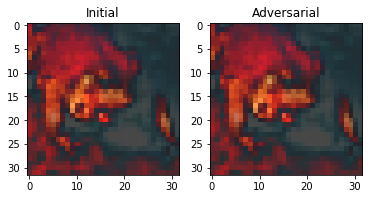

Total distortion: 0.6278307704820908
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 6.1346846   5.2999825  -1.6882088  -1.5455148  -5.1236787  -3.5818925
  -0.14321381 -6.656619    7.0424633   3.438402  ]] 8
initial_231_2.png
output/cifar/initial_231_2.png output/cifar/adversarial_231_2.png


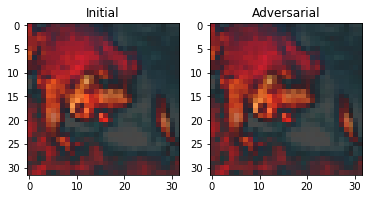

Total distortion: 1.1092079466645497
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 5.921879    4.110407   -1.4309521  -1.10268    -4.778496   -3.3225603
   0.24645707 -5.7646346   6.5409837   2.3837223 ]] 8
initial_232_2.png
output/cifar/initial_232_2.png output/cifar/adversarial_232_2.png


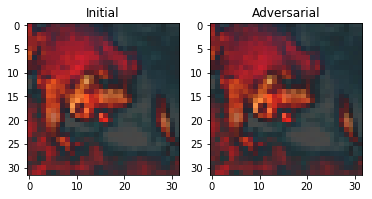

Total distortion: 1.4798142085864037
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 7.176364    5.702374   -2.0824547  -1.8339268  -5.292305   -4.662419
   0.39937046 -7.698165    8.993586    3.0871968 ]] 8
initial_233_2.png
output/cifar/initial_233_2.png output/cifar/adversarial_233_2.png


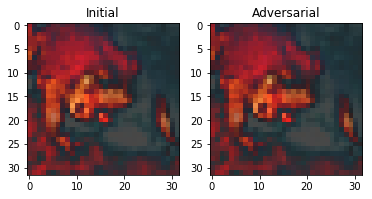

Total distortion: 1.324143714241729
[[ 5.9872127   5.094464   -1.4343042  -1.5763617  -4.8777947  -3.3814993
   0.31218693 -6.5414515   6.361502    3.0794547 ]] 8
[[ 7.348344    6.814574   -2.613632   -1.5479008  -6.0291076  -5.0088573
  -0.98411334 -7.1042323   7.698904    5.0263786 ]] 8
initial_234_2.png
output/cifar/initial_234_2.png output/cifar/adversarial_234_2.png


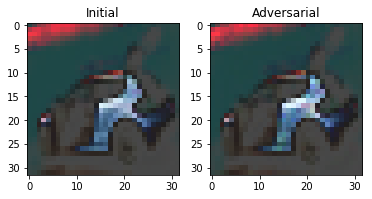

Total distortion: 2.1393442150935638
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[11.605254   -0.298848   -3.4823384  -0.64483356  1.155811   -8.064446
  -7.654682   -6.089954   12.77125     4.8815074 ]] 8
initial_235_2.png
output/cifar/initial_235_2.png output/cifar/adversarial_235_2.png


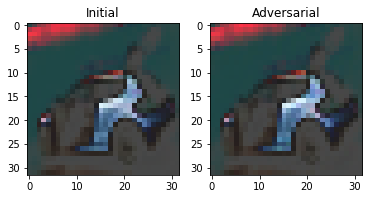

Total distortion: 1.4459585034865046
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[ 9.267914  -0.9535258 -1.7213943 -1.7381002  2.5407178 -7.0754952
  -5.8317494 -5.0063972 12.141403   2.1191688]] 8
initial_236_2.png
output/cifar/initial_236_2.png output/cifar/adversarial_236_2.png


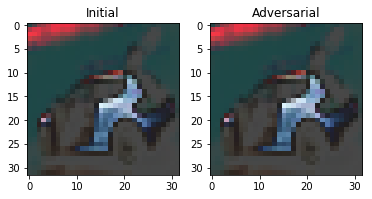

Total distortion: 0.4074659124404753
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[10.148131  -1.3842871 -2.714029  -1.7679609  1.8344369 -7.510203
  -6.5371394 -4.8288584 13.1164     3.5935574]] 8
initial_237_2.png
output/cifar/initial_237_2.png output/cifar/adversarial_237_2.png


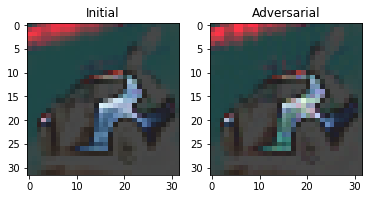

Total distortion: 2.925466686089742
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[ 9.212913    0.29344758 -3.8388577  -0.81303096  1.4991301  -9.616208
  -6.04636    -6.666005   15.81999     4.866737  ]] 8
initial_238_2.png
output/cifar/initial_238_2.png output/cifar/adversarial_238_2.png


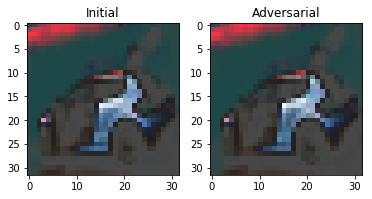

Total distortion: 1.2992767706398214
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[ 9.252951   -0.45589277 -2.7567244  -2.140351    1.6823368  -7.3828025
  -5.762173   -4.17769    13.451821    2.4336288 ]] 8
initial_239_2.png
output/cifar/initial_239_2.png output/cifar/adversarial_239_2.png


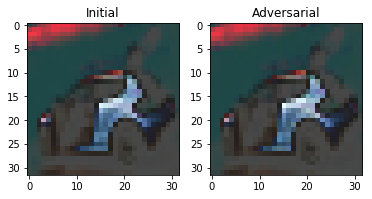

Total distortion: 1.141318019248001
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[ 9.672493  -0.6556047 -3.048178  -2.202325   1.9119604 -7.379823
  -6.525551  -4.193187  13.992933   2.6501124]] 8
initial_240_2.png
output/cifar/initial_240_2.png output/cifar/adversarial_240_2.png


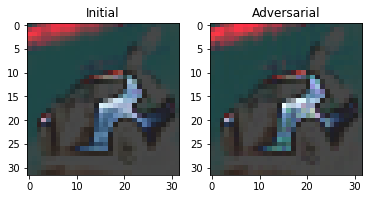

Total distortion: 2.416733335255032
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[ 9.998006  -0.6557908 -4.0156913 -1.3694235  0.9165868 -8.214117
  -7.1119184 -4.7762623 15.551494   3.68607  ]] 8
initial_241_2.png
output/cifar/initial_241_2.png output/cifar/adversarial_241_2.png


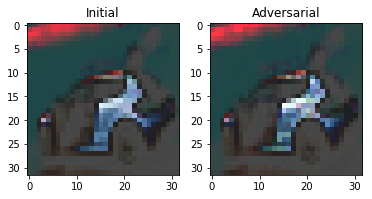

Total distortion: 2.734019752313886
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[ 14.683938     0.44833443  -3.5318522   -1.8782116   -1.4824635
  -11.301916    -8.9837885   -5.487049    18.7876       4.790129  ]] 8
initial_242_2.png
output/cifar/initial_242_2.png output/cifar/adversarial_242_2.png


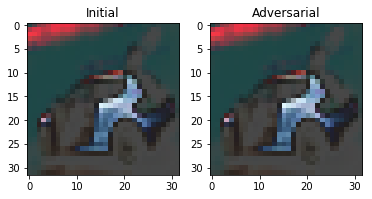

Total distortion: 0.3062340902555574
[[10.6636505 -1.1191658 -2.6555355 -1.7018696  1.570304  -7.615406
  -7.145362  -4.8421836 13.033285   3.793776 ]] 8
[[10.815706  -1.167959  -2.920859  -1.8506368  1.3992628 -7.762633
  -7.266039  -4.776778  13.56793    3.9543822]] 8
initial_243_2.png
output/cifar/initial_243_2.png output/cifar/adversarial_243_2.png


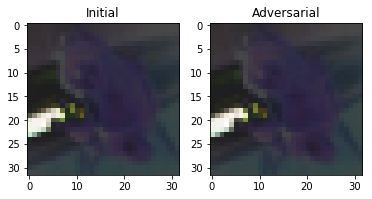

Total distortion: 0.7468503939992572
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[ 22.049109   -2.1054764  -4.3258457   7.6024365  -8.718213   -1.8090185
  -11.006096   -4.566888   -1.4917756   7.6114855]] 0
initial_244_2.png
output/cifar/initial_244_2.png output/cifar/adversarial_244_2.png


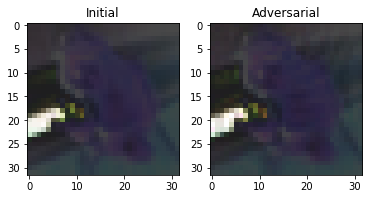

Total distortion: 1.868577128806196
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[ 20.0528     -1.8688718  -5.774278    8.516168   -8.800803   -2.1239033
  -10.938796   -4.3745003  -1.1235312   9.820288 ]] 0
initial_245_2.png
output/cifar/initial_245_2.png output/cifar/adversarial_245_2.png


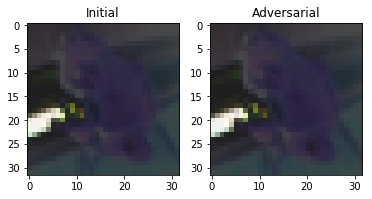

Total distortion: 0.4064455662020359
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[20.463276   -2.3553898  -3.552686    6.999969   -7.828165   -0.86133325
  -9.244217   -5.067247   -1.388285    6.195716  ]] 0
initial_246_2.png
output/cifar/initial_246_2.png output/cifar/adversarial_246_2.png


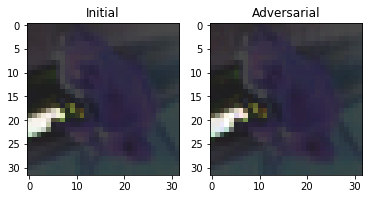

Total distortion: 1.119956366676795
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[19.845013   -3.2212307  -4.4813547   8.050093   -7.5710745  -0.26075554
  -9.87033    -4.847333   -1.5860864   6.4567976 ]] 0
initial_247_2.png
output/cifar/initial_247_2.png output/cifar/adversarial_247_2.png


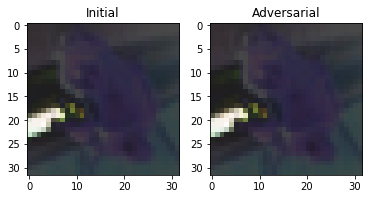

Total distortion: 0.5089132556427226
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[19.906727  -2.9176638 -3.5788095  7.7859488 -7.553808  -0.5830928
  -9.271785  -4.804794  -1.9005051  5.8779187]] 0
initial_248_2.png
output/cifar/initial_248_2.png output/cifar/adversarial_248_2.png


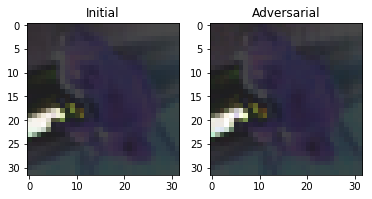

Total distortion: 1.194006611669947
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[ 22.145363    -3.4363158   -3.584775     7.320504    -8.528549
   -0.51245916 -10.648582    -4.827798    -2.1176727    7.0116725 ]] 0
initial_249_2.png
output/cifar/initial_249_2.png output/cifar/adversarial_249_2.png


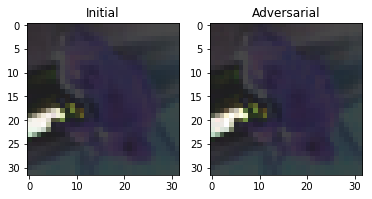

Total distortion: 0.9373615798488052
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[18.835125  -2.8003545 -4.1541166  7.6503906 -7.376459  -1.0654409
  -9.467825  -4.404788  -1.4331065  7.1106515]] 0
initial_250_2.png
output/cifar/initial_250_2.png output/cifar/adversarial_250_2.png


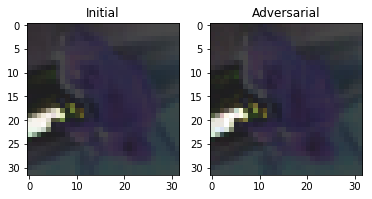

Total distortion: 1.5030355732223866
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[20.162237   -3.0035517  -3.9146976   6.9681606  -6.755579   -0.92979324
  -9.161131   -6.6895556   3.0636525   4.922691  ]] 0
initial_251_2.png
output/cifar/initial_251_2.png output/cifar/adversarial_251_2.png


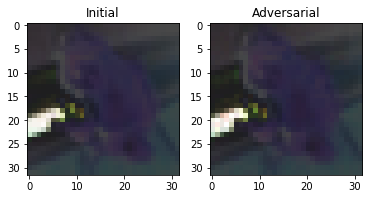

Total distortion: 1.460677832715876
[[20.40502    -2.1131418  -3.9578645   7.3007045  -7.9325037  -1.1747957
  -8.960472   -5.388667   -0.92349553  6.4346724 ]] 0
[[ 21.151007   -2.5520842  -4.410413    8.138528   -8.683284   -1.3643444
  -10.091341   -4.378531   -1.8947513   7.3730927]] 0
initial_252_2.png
output/cifar/initial_252_2.png output/cifar/adversarial_252_2.png


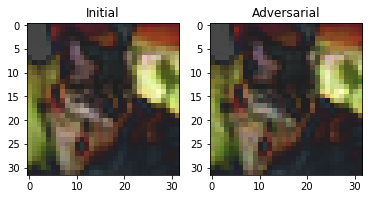

Total distortion: 2.2446554073273792
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[-0.75019515 -9.202338    4.789907    6.3077345   9.182469    1.1704991
   2.224202   -1.0727798  -5.398989   -6.0682745 ]] 4
initial_253_2.png
output/cifar/initial_253_2.png output/cifar/adversarial_253_2.png


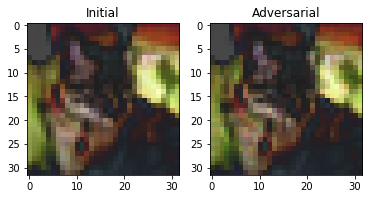

Total distortion: 2.212494749935839
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[-0.0544104 -9.00181    7.1182394  5.667574   8.656847  -2.4556634
   6.2641244 -6.101754  -3.5545237 -4.997984 ]] 4
initial_254_2.png
output/cifar/initial_254_2.png output/cifar/adversarial_254_2.png


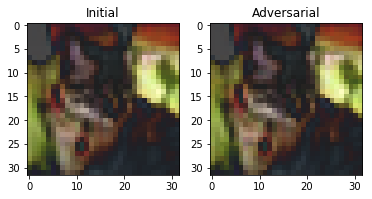

Total distortion: 1.3187495353661753
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[  0.48573187 -11.041133     8.2715225    5.8964453    9.211211
   -1.0263405    4.6232314   -4.781142    -4.3325524   -6.223237  ]] 4
initial_255_2.png
output/cifar/initial_255_2.png output/cifar/adversarial_255_2.png


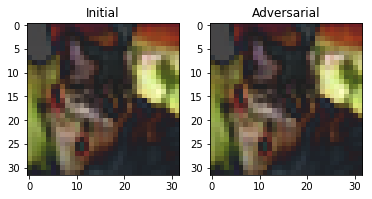

Total distortion: 0.9155246419230967
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[-0.16183674 -9.89981     5.948757    6.379994    9.244782    0.55318224
   2.571675   -2.7818215  -4.3674903  -6.6169157 ]] 4
initial_256_2.png
output/cifar/initial_256_2.png output/cifar/adversarial_256_2.png


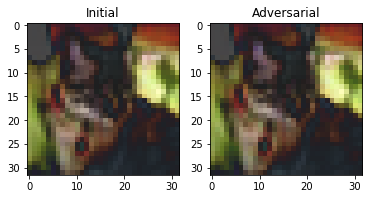

Total distortion: 1.3119567473422944
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[ -0.54495007 -10.525749     7.351418     5.9800205    9.974003
    1.4770083    1.5983975   -1.4900202   -5.4864297   -7.584765  ]] 4
initial_257_2.png
output/cifar/initial_257_2.png output/cifar/adversarial_257_2.png


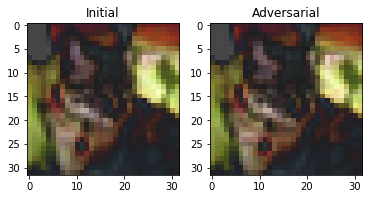

Total distortion: 1.4268853080333732
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[ 0.16215882 -9.851171    8.652191    5.3671002   8.636751   -3.9447293
   6.8292665  -7.4812136  -0.67502916 -5.2674885 ]] 2
initial_258_2.png
output/cifar/initial_258_2.png output/cifar/adversarial_258_2.png


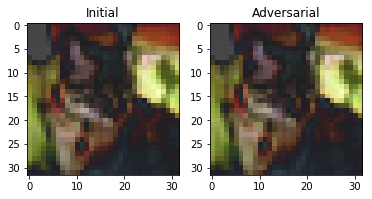

Total distortion: 1.145990840605637
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[ -1.2108959  -10.333119     5.6463957    5.973392    10.572671
    1.2422509    0.56903476  -0.37504044  -4.9735084   -6.933829  ]] 4
initial_259_2.png
output/cifar/initial_259_2.png output/cifar/adversarial_259_2.png


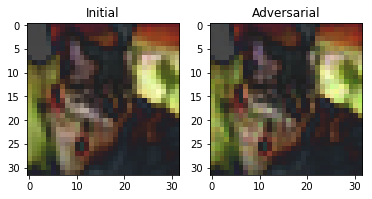

Total distortion: 2.1406270048034637
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[-0.27904126 -9.418539    7.429246    7.537167   10.371286   -0.58625364
   6.271713   -7.7345634  -3.285573   -6.6745067 ]] 4
initial_260_2.png
output/cifar/initial_260_2.png output/cifar/adversarial_260_2.png


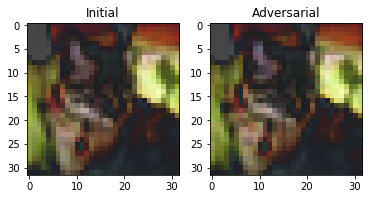

Total distortion: 1.6325410316066027
[[ -0.13900909 -10.027135     5.7927575    7.5953593    8.650588
   -1.5064055    4.026977    -4.4260416   -2.7126918   -6.008323  ]] 4
[[-0.47019717 -9.333192    6.855301    6.232591   11.248505   -0.62215406
   4.400338   -5.0755553  -5.8145514  -5.5331755 ]] 4
initial_261_2.png
output/cifar/initial_261_2.png output/cifar/adversarial_261_2.png


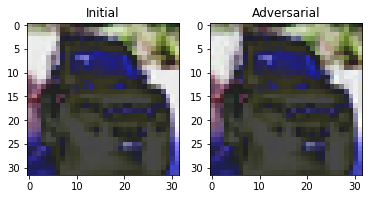

Total distortion: 1.2833119989248416
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[ 0.6427313  5.612396  -0.6446006 -0.8895377 -6.600945   0.5190535
   0.425597  -1.7194494 -0.4684414  4.603925 ]] 1
initial_262_2.png
output/cifar/initial_262_2.png output/cifar/adversarial_262_2.png


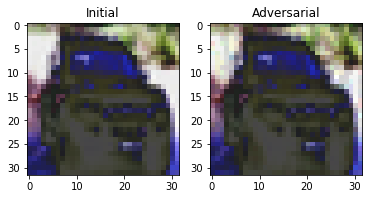

Total distortion: 2.232671341595103
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[-0.4222845   5.731181    0.19176716 -1.4170972  -7.055377    1.3110615
   1.6955069   1.1813834  -1.854944    1.1774979 ]] 1
initial_263_2.png
output/cifar/initial_263_2.png output/cifar/adversarial_263_2.png


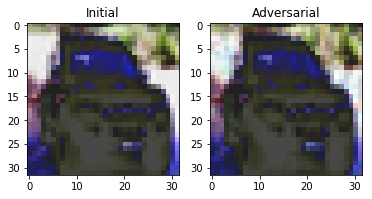

Total distortion: 2.5557226481152755
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[ 0.20987657  3.1247227   0.03946097  0.45343858 -6.07304    -1.2646292
   4.660323   -0.3453171  -1.2594877   1.5175891 ]] 6
initial_264_2.png
output/cifar/initial_264_2.png output/cifar/adversarial_264_2.png


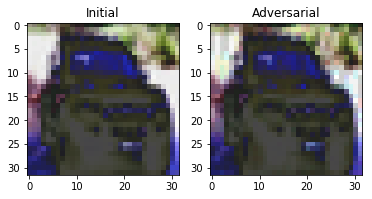

Total distortion: 2.7581760934073176
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[-1.2208289   2.2844796   0.34203815  0.9945327  -4.992697    0.960636
   3.3731513   1.982551   -2.3504043  -1.1088288 ]] 6
initial_265_2.png
output/cifar/initial_265_2.png output/cifar/adversarial_265_2.png


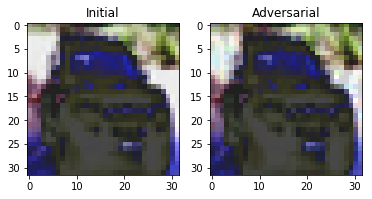

Total distortion: 2.6704298427774757
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[ 0.23654076  3.690204   -0.33976287 -0.6115793  -4.1351223   0.03975469
   5.3594913  -1.918776   -1.5182254   1.1309856 ]] 6
initial_266_2.png
output/cifar/initial_266_2.png output/cifar/adversarial_266_2.png


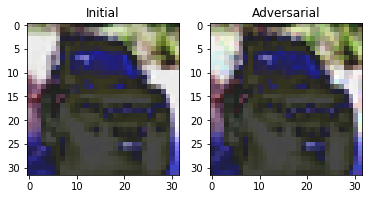

Total distortion: 2.490955682146654
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[-0.31282187  6.4684343   1.0838428  -0.97991574 -7.442455   -0.05696983
   3.5192091   0.21106738 -2.068907    0.40117013]] 1
initial_267_2.png
output/cifar/initial_267_2.png output/cifar/adversarial_267_2.png


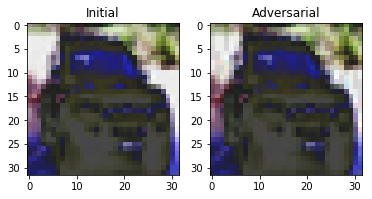

Total distortion: 2.066785809969081
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[-1.5129732   5.79317     0.18474048 -2.2750897  -6.837512    0.7967865
   0.7502087   2.5864763  -2.0624876   2.0250263 ]] 1
initial_268_2.png
output/cifar/initial_268_2.png output/cifar/adversarial_268_2.png


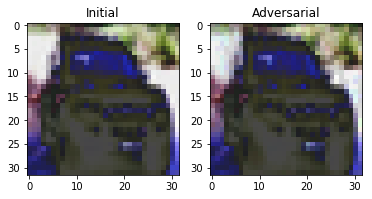

Total distortion: 1.9976034110446905
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[-0.33352652  0.51237035 -1.0823143   2.7511208  -4.0782638   2.3938618
   3.8455877  -1.915281   -2.0316122   1.5477235 ]] 6
initial_269_2.png
output/cifar/initial_269_2.png output/cifar/adversarial_269_2.png


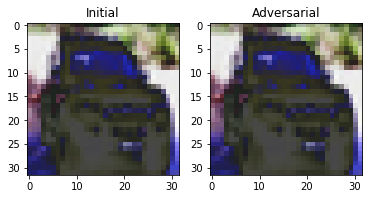

Total distortion: 0.41869060180489975
[[ 0.32842317  7.03199     0.0522871  -0.48597148 -8.897338    1.0862603
  -0.3367479  -0.74950397 -0.9783554   4.1753654 ]] 1
[[ 0.20178059  6.7826185   0.23084423 -0.88320756 -8.449132    0.7328087
  -0.77145875 -0.29628605 -1.1430137   4.458544  ]] 1
270 {'l2': 23, 'l0': 41, 'li': 33} {'l2': 43.70722705638904, 'l0': 226.90381486279367, 'li': 86.66288463090467}
l2 average =  0.1618786187273668 1.9003142198430016
l0 average =  0.8403844994918284 5.534239386897407
li average =  0.3209736467811284 2.6261480191183235


In [5]:
with tf.Session() as sess:

    model = CIFARModel("inputs/model/cifar", sess)
        
    # cifar
    test_adversarials(model, 'output/cifar/', [32,32], 3)

initial_0_0.png
output/mnist/initial_0_0.png output/mnist/adversarial_0_0.png


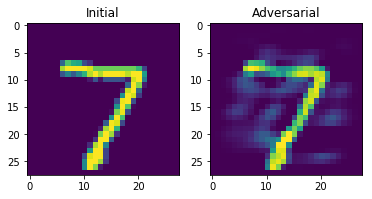

Total distortion: 2.4681750243646046
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[ 1.9156662  -0.4513418   3.9591286  -1.4198169  -4.4667363  -3.3774083
  -6.3105617   8.639733    0.86065525 -1.3708972 ]] 7
initial_1_0.png
output/mnist/initial_1_0.png output/mnist/adversarial_1_0.png


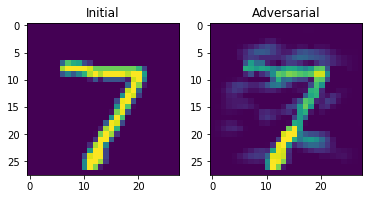

Total distortion: 3.175519080795314
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[-0.7643711   1.7685457   3.7658517  -0.88628477 -0.72635025 -2.561565
  -3.124495    4.5266333   0.56814665 -2.2176733 ]] 7
initial_2_0.png
output/mnist/initial_2_0.png output/mnist/adversarial_2_0.png


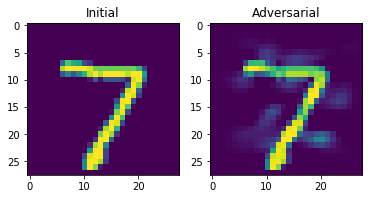

Total distortion: 1.9213766056555643
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[ 0.19668378  0.55247617  4.9553537  -0.99269325 -4.517439   -4.1087613
  -6.4509068   9.604106    1.6640053  -2.4571166 ]] 7
initial_3_0.png
output/mnist/initial_3_0.png output/mnist/adversarial_3_0.png


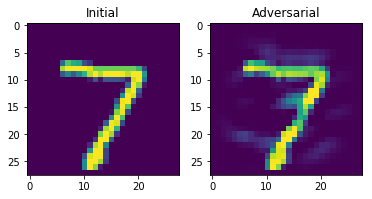

Total distortion: 1.8847126217045276
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[-4.2838874  -0.6894764   1.803296    7.600176   -3.2244942  -3.4320076
  -9.495733   10.415617   -0.01651862  3.3830419 ]] 7
initial_4_0.png
output/mnist/initial_4_0.png output/mnist/adversarial_4_0.png


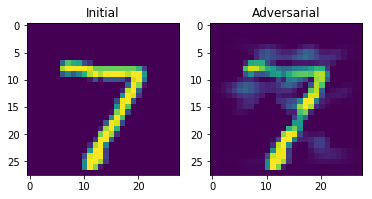

Total distortion: 2.6995292959699113
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[-2.1221728 -1.6163068  1.6174635  3.459945  -1.4437929 -3.2305489
  -6.1326084  6.537585   2.0878868  2.683692 ]] 7
initial_5_0.png
output/mnist/initial_5_0.png output/mnist/adversarial_5_0.png


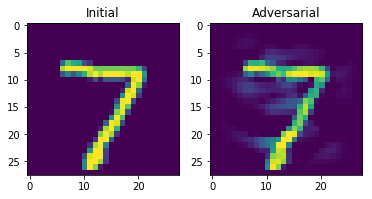

Total distortion: 2.227005549738683
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[-1.7828494  -2.509884    1.2638856   3.0660522  -4.3166637  -0.6274301
  -7.306906    7.631689    0.75489587  2.5692854 ]] 7
initial_6_0.png
output/mnist/initial_6_0.png output/mnist/adversarial_6_0.png


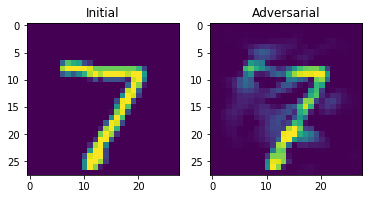

Total distortion: 3.296395217190663
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[ 0.75294006 -0.31257716  2.8115835  -0.7510157  -3.3112578  -2.4212224
  -2.0821111   3.5898302   3.3643806  -2.750351  ]] 7
initial_7_0.png
output/mnist/initial_7_0.png output/mnist/adversarial_7_0.png


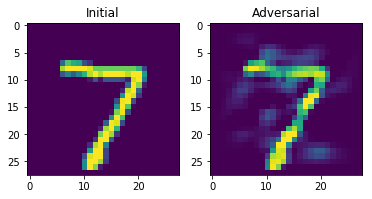

Total distortion: 2.4558163597401443
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[ 1.9483925  -2.7597501   2.0266614   0.40354908 -5.4461436  -2.795832
  -4.71845     4.7300544   5.061643    0.06512368]] 8
initial_8_0.png
output/mnist/initial_8_0.png output/mnist/adversarial_8_0.png


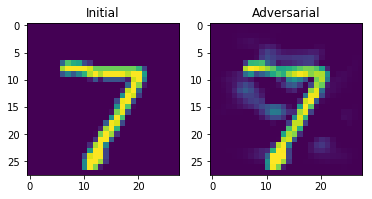

Total distortion: 1.8997642370815755
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[-1.3701708  -1.7891266   0.45365876  0.8990733  -2.9684627  -3.7905436
  -9.131543   11.224551    0.19050035  4.082157  ]] 7
initial_9_0.png
output/mnist/initial_9_0.png output/mnist/adversarial_9_0.png


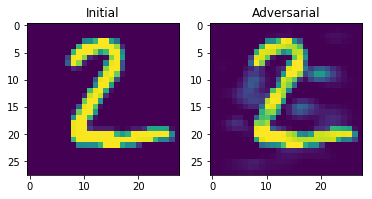

Total distortion: 2.098911357445467
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 4.4391026   0.69766736  4.8050227  -6.861805   -1.6414201  -1.312072
   3.620806   -2.6403646   0.853798   -3.3610768 ]] 2
initial_10_0.png
output/mnist/initial_10_0.png output/mnist/adversarial_10_0.png


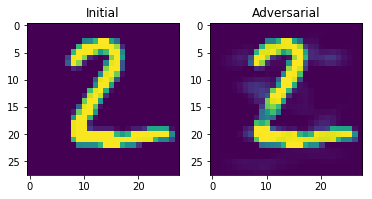

Total distortion: 1.637995620153438
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 1.4351985   5.509203    9.404624   -4.3124743   0.30038798 -4.910964
   0.46843058  1.1760837  -3.2585585  -3.9252744 ]] 2
initial_11_0.png
output/mnist/initial_11_0.png output/mnist/adversarial_11_0.png


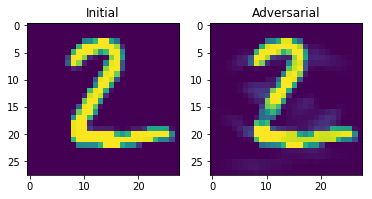

Total distortion: 1.7777167630983923
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 1.9704653   4.725004    8.644273   -2.9711378  -0.41802728 -4.7957354
  -0.0691724   1.0953075  -2.8408864  -3.4346013 ]] 2
initial_12_0.png
output/mnist/initial_12_0.png output/mnist/adversarial_12_0.png


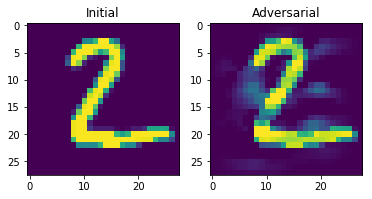

Total distortion: 2.6803656517932835
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[-0.5556074   2.766914    3.8940468  -5.562188    0.45004702 -1.695243
   2.4384391  -0.8656957   0.3424835  -2.404139  ]] 2
initial_13_0.png
output/mnist/initial_13_0.png output/mnist/adversarial_13_0.png


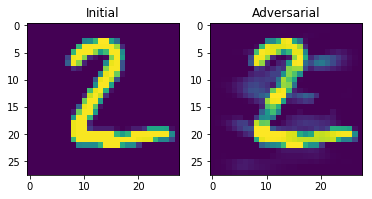

Total distortion: 2.3113379780770633
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 0.9683761   3.4225833   6.288698   -4.9648905  -0.5975784  -1.8338404
   1.3186489  -0.71242374 -1.0370697  -2.8236532 ]] 2
initial_14_0.png
output/mnist/initial_14_0.png output/mnist/adversarial_14_0.png


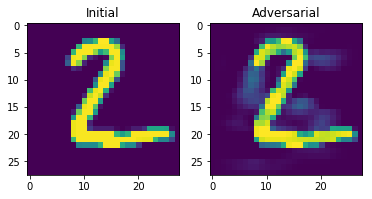

Total distortion: 1.951200101264491
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 3.53442    2.6732063  6.83891   -9.964843  -0.6498449 -2.6360037
   7.2640424 -4.2011104  0.744256  -5.4066114]] 6
initial_15_0.png
output/mnist/initial_15_0.png output/mnist/adversarial_15_0.png


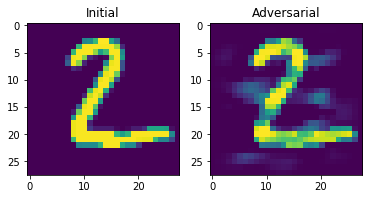

Total distortion: 3.013632951486325
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 0.32211545  1.267805    5.302612   -2.895002    0.16546999 -3.260554
  -2.0183964   1.9198766  -0.38582548 -0.741936  ]] 2
initial_16_0.png
output/mnist/initial_16_0.png output/mnist/adversarial_16_0.png


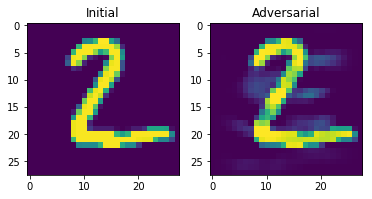

Total distortion: 1.9982345656972105
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 1.1103067   3.0467918   8.5222025  -5.256932   -1.6155618  -2.4788492
   2.8947184  -1.3206398  -0.37951717 -4.3796663 ]] 2
initial_17_0.png
output/mnist/initial_17_0.png output/mnist/adversarial_17_0.png


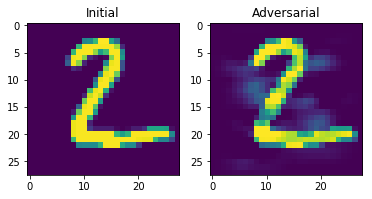

Total distortion: 2.3176305407780946
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 3.4926424   0.03899822  4.8107142  -4.3315763  -2.0279317  -2.3253665
   1.0718844  -1.435055    0.63770217 -1.2400278 ]] 2
initial_18_0.png
output/mnist/initial_18_0.png output/mnist/adversarial_18_0.png


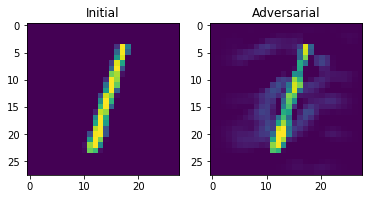

Total distortion: 1.90073140020576
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-2.2246828   6.2208033  -0.15415746 -3.4054065   2.1388063  -0.20634265
   0.15037358 -0.38346183  1.7956694  -1.8212125 ]] 1
initial_19_0.png
output/mnist/initial_19_0.png output/mnist/adversarial_19_0.png


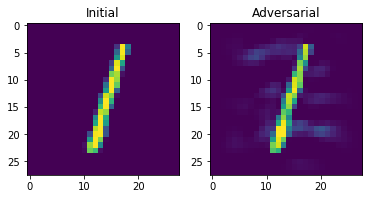

Total distortion: 1.2917983182859245
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-4.1476455  9.566488   2.251107  -4.874576   3.2148538 -2.0233173
  -0.9826633  1.454269   1.1186237 -3.1445131]] 1
initial_20_0.png
output/mnist/initial_20_0.png output/mnist/adversarial_20_0.png


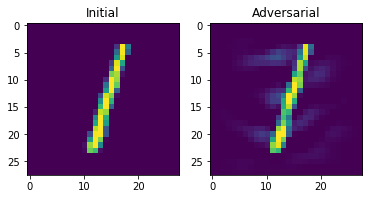

Total distortion: 1.2845816211686967
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-4.8157      7.928974   -1.8374267  -2.2093847   1.947012   -1.1783993
  -2.3486633   0.74568045  2.6567533   0.6460035 ]] 1
initial_21_0.png
output/mnist/initial_21_0.png output/mnist/adversarial_21_0.png


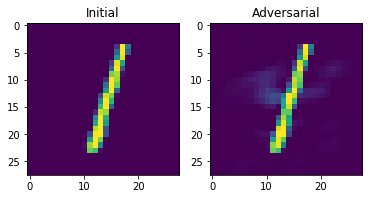

Total distortion: 0.9438442461057769
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-6.7088804  12.418801   -1.7827457  -6.759799    7.7052126  -0.8376314
  -0.09473024 -0.6011291   2.8984697  -2.2009835 ]] 1
initial_22_0.png
output/mnist/initial_22_0.png output/mnist/adversarial_22_0.png


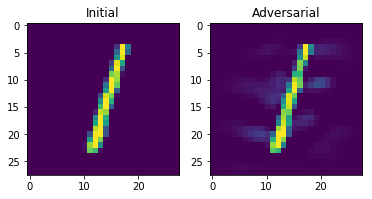

Total distortion: 1.126555532997376
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-4.2316837 11.395798  -3.0825126 -5.4974456  3.9332736  1.6696457
   1.393499  -1.234802   1.9777553 -2.727325 ]] 1
initial_23_0.png
output/mnist/initial_23_0.png output/mnist/adversarial_23_0.png


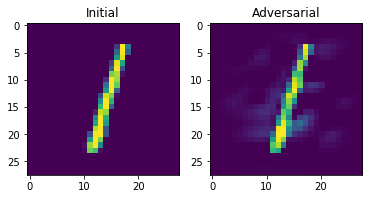

Total distortion: 1.3339618552500694
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-4.014493  10.8613405 -2.269222  -5.557102   4.420039   1.0771048
   1.939053  -0.7552357  1.3870795 -3.8038473]] 1
initial_24_0.png
output/mnist/initial_24_0.png output/mnist/adversarial_24_0.png


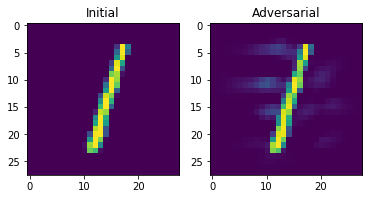

Total distortion: 1.0764330981346806
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-5.2183537  9.784285  -1.1935958 -3.692711   3.884612  -1.4319073
  -3.1101644  3.5873508  0.988682  -1.2745107]] 1
initial_25_0.png
output/mnist/initial_25_0.png output/mnist/adversarial_25_0.png


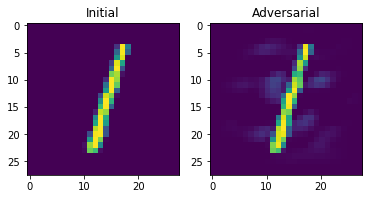

Total distortion: 1.0370381073971426
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-4.55209    11.001865   -2.3323956  -5.5734134   4.4401536   0.5001636
   0.72569346 -0.84180087  3.0654485  -2.873064  ]] 1
initial_26_0.png
output/mnist/initial_26_0.png output/mnist/adversarial_26_0.png


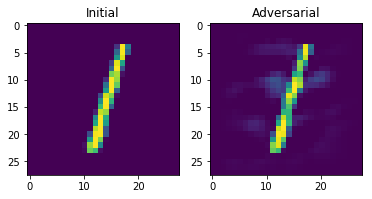

Total distortion: 1.2634816800454793
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-3.844543    8.334335   -1.5130711  -4.0072246   3.4990082  -0.50420016
  -0.77303493  0.7958585   2.2716348  -2.060029  ]] 1
initial_27_0.png
output/mnist/initial_27_0.png output/mnist/adversarial_27_0.png


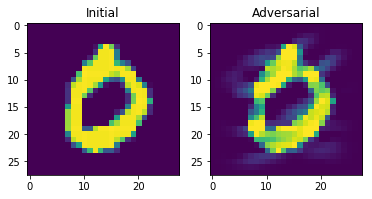

Total distortion: 2.4276852714010397
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[ 8.873844  -0.8294088  2.6424296 -2.0635421 -2.0495484 -0.1692805
  -1.3493345  6.1207414 -3.9510124 -2.945961 ]] 0
initial_28_0.png
output/mnist/initial_28_0.png output/mnist/adversarial_28_0.png


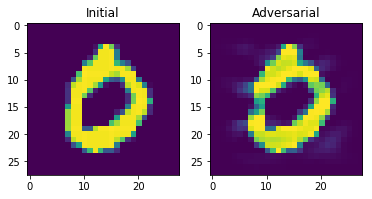

Total distortion: 1.7609414967962906
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[ 1.3279349e+01 -1.5767252e+00  4.2850542e+00 -2.7238109e+00
  -3.3150680e+00 -1.6247801e+00 -1.1355035e-02  3.5797162e+00
  -4.4058609e+00 -2.4894805e+00]] 0
initial_29_0.png
output/mnist/initial_29_0.png output/mnist/adversarial_29_0.png


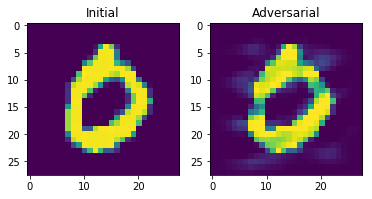

Total distortion: 2.164187210841367
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[10.897508  -1.3728546  2.7506988 -2.1321697 -1.879261  -1.0399134
  -0.3293299  4.1628075 -4.9639983 -1.6283778]] 0
initial_30_0.png
output/mnist/initial_30_0.png output/mnist/adversarial_30_0.png


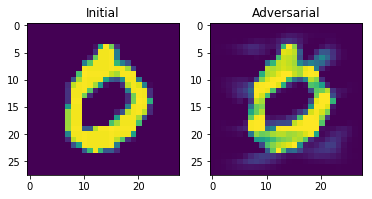

Total distortion: 2.2599806357710364
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[13.959342   -1.0975115   0.30645174 -4.561055   -1.204647   -1.4961863
  -0.26502123  6.2217903  -5.163056   -2.1437402 ]] 0
initial_31_0.png
output/mnist/initial_31_0.png output/mnist/adversarial_31_0.png


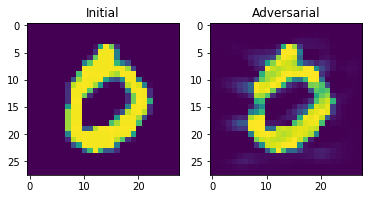

Total distortion: 2.0495327300682695
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[11.48159    -1.7056998   3.3047137  -1.3891765  -3.231047   -0.26734406
  -0.10222415  3.575647   -3.830258   -2.4135404 ]] 0
initial_32_0.png
output/mnist/initial_32_0.png output/mnist/adversarial_32_0.png


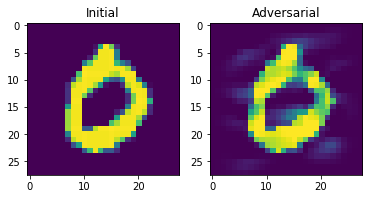

Total distortion: 2.4969553527506996
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[15.0199995  -2.1792178   0.6609477  -4.418013   -1.5966831  -0.2854397
   5.641728    0.14625952 -3.9558804  -2.997748  ]] 0
initial_33_0.png
output/mnist/initial_33_0.png output/mnist/adversarial_33_0.png


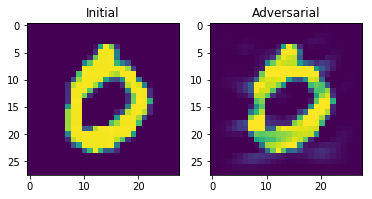

Total distortion: 1.9570081027978663
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[14.252457  -1.5426184  2.3161926 -4.0322914 -4.8470626 -1.3815508
  -0.8598541  5.8308525 -3.852699  -2.3399072]] 0
initial_34_0.png
output/mnist/initial_34_0.png output/mnist/adversarial_34_0.png


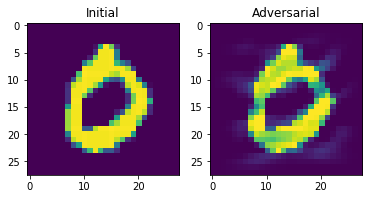

Total distortion: 2.3454324405709217
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[10.928573   -0.8154006   1.0497748  -2.6594822  -4.253983   -0.815029
  -0.37814516  4.7918563  -2.5342243  -2.5058384 ]] 0
initial_35_0.png
output/mnist/initial_35_0.png output/mnist/adversarial_35_0.png


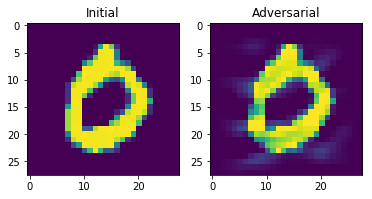

Total distortion: 1.8320651508765387
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[14.79862    -1.9899354   1.4101572  -3.6644084  -3.3620086  -1.9042857
  -0.6233508   4.8564253  -5.119225   -0.37322032]] 0
initial_36_0.png
output/mnist/initial_36_0.png output/mnist/adversarial_36_0.png


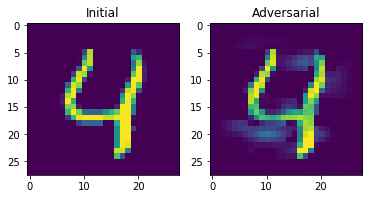

Total distortion: 1.9704233959672222
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[ 1.8044577 -3.065998  -2.2709274 -5.746607   8.057888  -5.449071
  -2.0031903 -0.3754341  1.9717888  8.0538225]] 4
initial_37_0.png
output/mnist/initial_37_0.png output/mnist/adversarial_37_0.png


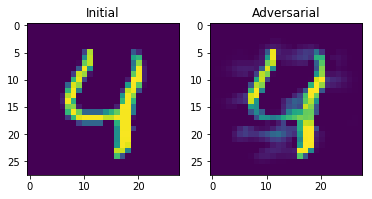

Total distortion: 2.36008084077902
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-0.29532143 -0.4001751  -2.556757   -6.503798   10.438744   -6.138244
  -3.1627898   1.4472632   1.9035972   6.9311657 ]] 4
initial_38_0.png
output/mnist/initial_38_0.png output/mnist/adversarial_38_0.png


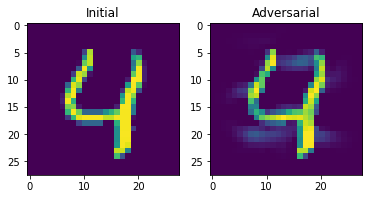

Total distortion: 1.8592826756228042
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-0.7435338 -3.6149044 -1.2782471 -4.4979467  9.5629425 -7.3162007
  -5.186156   1.1320235  1.9161878 12.284939 ]] 9
initial_39_0.png
output/mnist/initial_39_0.png output/mnist/adversarial_39_0.png


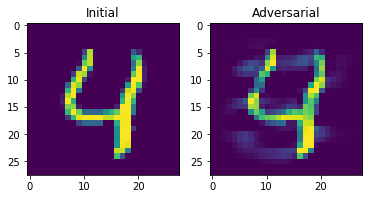

Total distortion: 2.2134710562420485
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-0.7442674  -4.2198095  -0.94153154 -3.243729    8.902871   -6.593171
  -5.2037272   1.2307276   1.7539575  12.005741  ]] 9
initial_40_0.png
output/mnist/initial_40_0.png output/mnist/adversarial_40_0.png


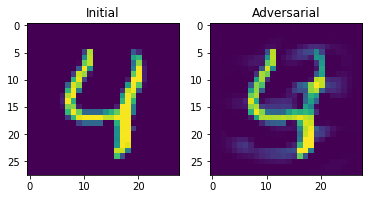

Total distortion: 2.1730622264450785
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-1.6097211 -4.8156834 -3.5017347 -7.430915  13.024923  -2.6487408
   1.6720349 -3.900408   1.1747416  8.527302 ]] 4
initial_41_0.png
output/mnist/initial_41_0.png output/mnist/adversarial_41_0.png


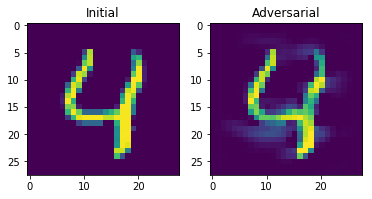

Total distortion: 1.9175387209249095
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[ 0.6038408 -3.3546505 -3.2902277 -8.284763  12.007278  -4.04896
   2.3786461 -3.7480276  4.057563   5.8127203]] 4
initial_42_0.png
output/mnist/initial_42_0.png output/mnist/adversarial_42_0.png


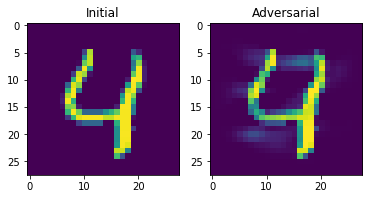

Total distortion: 1.7616487814802277
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-1.5737983  -2.9934871  -1.8192613  -4.7611837  11.070386   -7.4919124
  -5.5531945   2.6711102  -0.35535988 12.827902  ]] 9
initial_43_0.png
output/mnist/initial_43_0.png output/mnist/adversarial_43_0.png


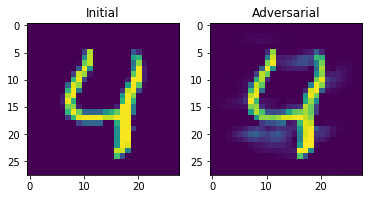

Total distortion: 1.5797935955819429
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-0.26984736 -4.6952524  -2.927401   -6.6486597  10.534508   -6.989134
  -3.7513416  -0.80816776  4.7591352  12.240918  ]] 9
initial_44_0.png
output/mnist/initial_44_0.png output/mnist/adversarial_44_0.png


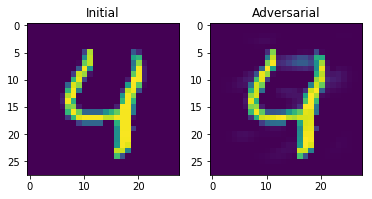

Total distortion: 0.9539331855688856
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-1.029577   -6.650612   -3.5425313  -7.2148156  14.138184   -8.710705
  -5.074148   -0.31115618  0.43928912 18.801796  ]] 9
initial_45_0.png
output/mnist/initial_45_0.png output/mnist/adversarial_45_0.png


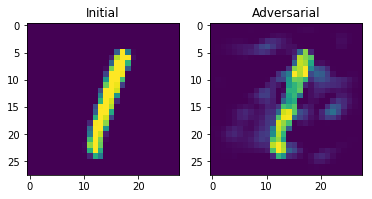

Total distortion: 2.3289594754877885
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-4.055174  10.737069   3.9154363 -5.4895306  2.6390548 -4.3219914
  -2.1697814  1.2948761  4.1704907 -3.9022355]] 1
initial_46_0.png
output/mnist/initial_46_0.png output/mnist/adversarial_46_0.png


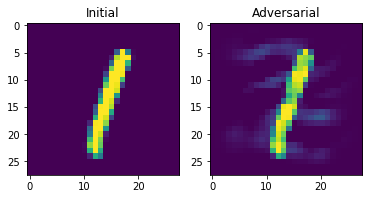

Total distortion: 1.670629661430823
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-6.278944  11.209182   4.1295404 -4.31777    3.4911501 -5.1841865
  -4.760412   4.204805   2.4987438 -2.7557454]] 1
initial_47_0.png
output/mnist/initial_47_0.png output/mnist/adversarial_47_0.png


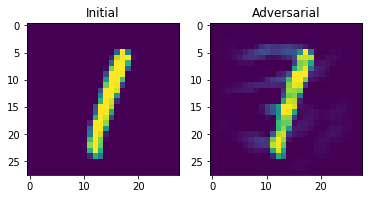

Total distortion: 1.6167805477552015
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-5.506912    9.8178425  -1.8193976  -0.74551946  1.5637197  -2.3012235
  -5.8764205   6.689856   -0.8426745   0.39968324]] 1
initial_48_0.png
output/mnist/initial_48_0.png output/mnist/adversarial_48_0.png


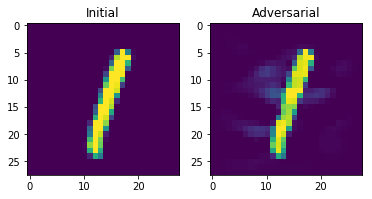

Total distortion: 1.197960606750459
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-8.069448   16.115562   -1.8566983  -7.4475026   7.4371824  -0.6045092
  -0.6349057   0.28014383  1.3414478  -2.2018867 ]] 1
initial_49_0.png
output/mnist/initial_49_0.png output/mnist/adversarial_49_0.png


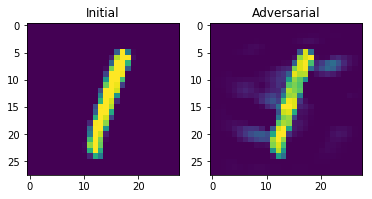

Total distortion: 1.6336616607809333
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-4.7648315 14.649319  -5.0871115 -6.3937793  4.013558   3.04184
   1.4648658 -1.5401818  0.7396491 -1.6686409]] 1
initial_50_0.png
output/mnist/initial_50_0.png output/mnist/adversarial_50_0.png


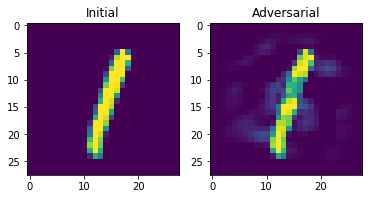

Total distortion: 1.8329170216759976
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-5.1269474  13.313972   -3.016078   -5.798682    3.7506764   0.48220262
   1.12295    -0.88076454  2.7573867  -2.770163  ]] 1
initial_51_0.png
output/mnist/initial_51_0.png output/mnist/adversarial_51_0.png


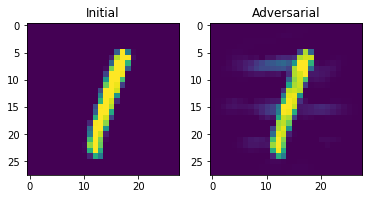

Total distortion: 1.3010687524660232
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-7.627896   11.213152   -0.4546234  -2.805379    3.159403   -3.586885
  -6.5519705   9.308195    0.15925625 -0.80512965]] 1
initial_52_0.png
output/mnist/initial_52_0.png output/mnist/adversarial_52_0.png


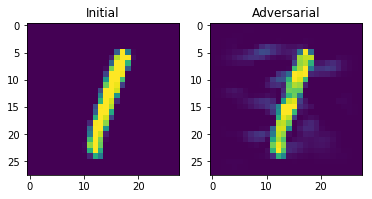

Total distortion: 1.4255751369373966
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-6.4269595 13.697397  -0.3704186 -4.3657813  3.9421735 -2.9069705
  -4.3543944  3.1547859  2.6439369 -1.4389256]] 1
initial_53_0.png
output/mnist/initial_53_0.png output/mnist/adversarial_53_0.png


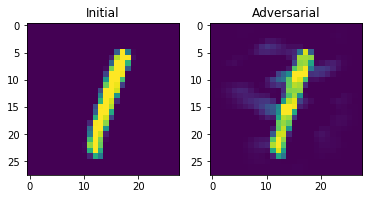

Total distortion: 1.52849642680371
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-7.64368    14.19234    -1.6939793  -4.1411123   5.394516   -3.017391
  -5.2169957   3.1840537   1.6393155   0.27640402]] 1
initial_54_0.png
output/mnist/initial_54_0.png output/mnist/adversarial_54_0.png


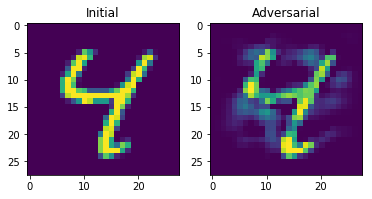

Total distortion: 3.261653840110118
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-1.8476363  -1.1734774   1.297226   -3.6791222   4.684506   -4.449074
  -3.250106    0.30867925  7.341133    2.6976142 ]] 8
initial_55_0.png
output/mnist/initial_55_0.png output/mnist/adversarial_55_0.png


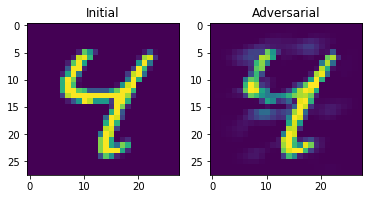

Total distortion: 2.3617157093448733
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-4.3809724   4.700904   -0.16939378 -5.9584284   9.9878645  -5.706278
  -2.4679127   0.661908    7.220671    0.3764292 ]] 4
initial_56_0.png
output/mnist/initial_56_0.png output/mnist/adversarial_56_0.png


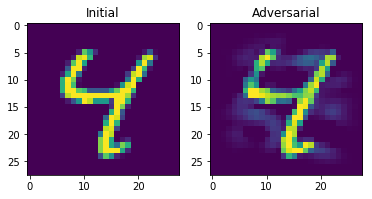

Total distortion: 2.275716471773209
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-6.2370934  -0.06967092  2.545074   -4.086841    8.973666   -7.595396
  -7.004056    1.4971975  10.42064     6.2884393 ]] 8
initial_57_0.png
output/mnist/initial_57_0.png output/mnist/adversarial_57_0.png


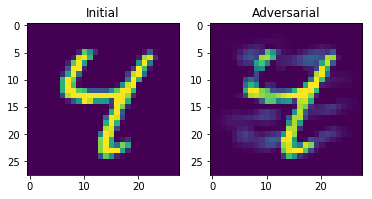

Total distortion: 2.4970017574061214
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-5.9834714   0.37601984  1.8443402  -1.3320837   7.5381136  -6.8307986
  -6.5943522   1.981532    7.8703628   5.174209  ]] 8
initial_58_0.png
output/mnist/initial_58_0.png output/mnist/adversarial_58_0.png


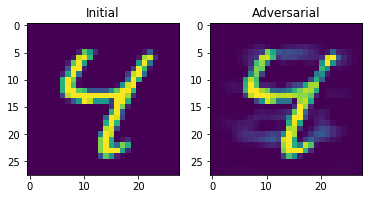

Total distortion: 1.921892801838126
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-6.68311   -2.750672  -1.1740102 -4.967312  10.431956  -4.95325
  -4.686354  -3.371507  11.827377   8.548942 ]] 8
initial_59_0.png
output/mnist/initial_59_0.png output/mnist/adversarial_59_0.png


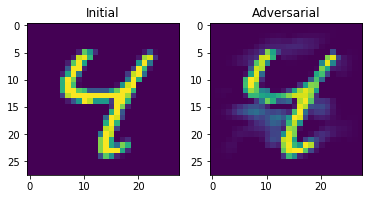

Total distortion: 2.3895131436465604
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-3.8700974  -0.01342607 -1.475781   -7.2123013  10.24662    -3.9132695
   0.15557009 -2.034891    9.774454    2.444168  ]] 4
initial_60_0.png
output/mnist/initial_60_0.png output/mnist/adversarial_60_0.png


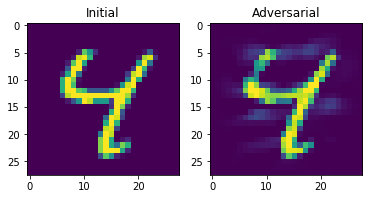

Total distortion: 1.9491813824269233
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-7.0749326  1.1283833  1.1813588 -4.5717173 11.812176  -7.3847146
  -6.5589447  1.9781033  9.774693   5.1423516]] 4
initial_61_0.png
output/mnist/initial_61_0.png output/mnist/adversarial_61_0.png


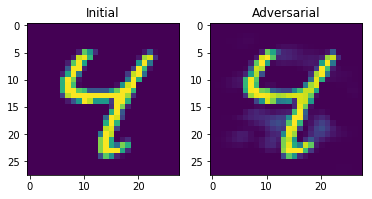

Total distortion: 1.2164703469854534
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-8.254709    0.08134156 -1.6853209  -7.6153946  16.497828   -7.2495203
  -3.7351792  -2.1534238  13.621339    6.0647902 ]] 4
initial_62_0.png
output/mnist/initial_62_0.png output/mnist/adversarial_62_0.png


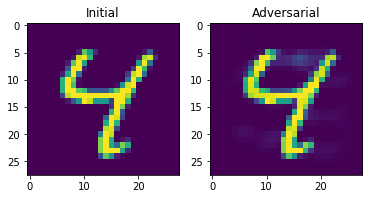

Total distortion: 0.8010758021058959
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-9.160305  -1.600432  -1.8253468 -7.0734663 16.90933   -7.3757534
  -5.8534946 -2.0477684 12.918106   9.914046 ]] 4
initial_63_0.png
output/mnist/initial_63_0.png output/mnist/adversarial_63_0.png


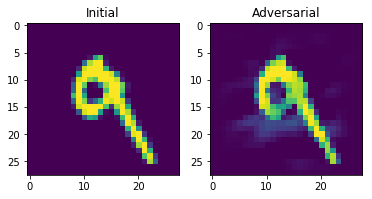

Total distortion: 1.6911510953438533
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-1.6758956 -3.3930943 -1.4363612 -5.3696575  4.1739435 -4.087893
  -5.5913496 -2.759988  10.544155   8.678961 ]] 8
initial_64_0.png
output/mnist/initial_64_0.png output/mnist/adversarial_64_0.png


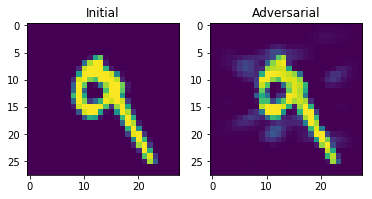

Total distortion: 1.6346310066753962
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-5.620158  -2.885356  -1.7574977 -3.7690098  8.491804  -4.5973125
  -6.1100316 -2.9761002  9.009347  12.085113 ]] 9
initial_65_0.png
output/mnist/initial_65_0.png output/mnist/adversarial_65_0.png


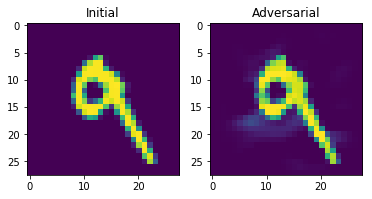

Total distortion: 1.1426780722177594
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-4.911841  -5.222597  -1.422082  -4.4649086  7.0065556 -4.8538594
  -7.1015472 -3.6688924 11.228569  14.12745  ]] 9
initial_66_0.png
output/mnist/initial_66_0.png output/mnist/adversarial_66_0.png


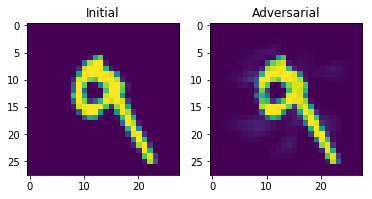

Total distortion: 1.0704445861842007
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-6.3051977  -5.9275846  -2.8292606  -0.43725586  5.6400723  -4.064691
  -7.93205    -2.7889483   9.200159   16.271938  ]] 9
initial_67_0.png
output/mnist/initial_67_0.png output/mnist/adversarial_67_0.png


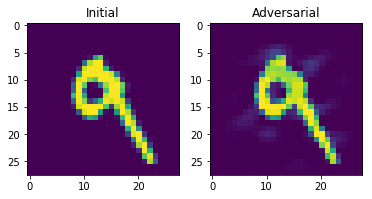

Total distortion: 1.0963361954594157
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-7.604549  -3.6251676 -2.7604518 -6.1982436 13.229907  -4.1857467
  -5.5319104 -4.9768305  8.565486  14.399784 ]] 9
initial_68_0.png
output/mnist/initial_68_0.png output/mnist/adversarial_68_0.png


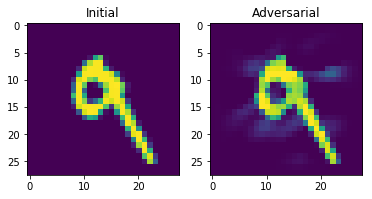

Total distortion: 1.463906438401815
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-4.978598  -5.084572  -2.019492  -3.9136167  6.671792  -3.4619074
  -6.101926  -2.7408278 11.150986  11.897953 ]] 9
initial_69_0.png
output/mnist/initial_69_0.png output/mnist/adversarial_69_0.png


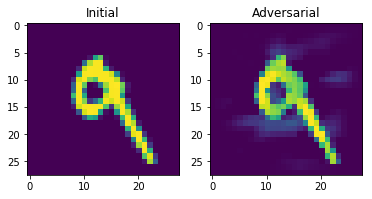

Total distortion: 1.8273667939532403
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-3.1925275 -2.0833192 -1.3234725 -5.8493595  7.145269  -4.016517
  -2.645996  -5.061121  11.796015   6.338051 ]] 8
initial_70_0.png
output/mnist/initial_70_0.png output/mnist/adversarial_70_0.png


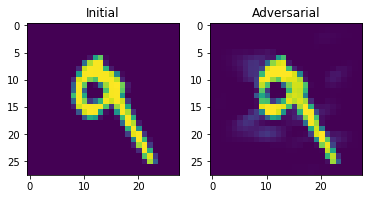

Total distortion: 1.3151236151840335
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-5.468032  -5.16249   -1.4558109 -3.0033195  6.8043056 -4.3695536
  -7.8737674 -1.8887702  9.327272  14.512068 ]] 9
initial_71_0.png
output/mnist/initial_71_0.png output/mnist/adversarial_71_0.png


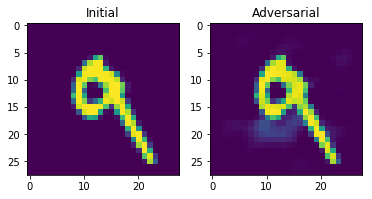

Total distortion: 1.135434660929376
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-5.036849  -5.503093  -3.184982  -3.2674959  6.0318904 -5.424154
  -6.612251  -4.3924956 13.669168  14.549361 ]] 9
initial_72_0.png
output/mnist/initial_72_0.png output/mnist/adversarial_72_0.png


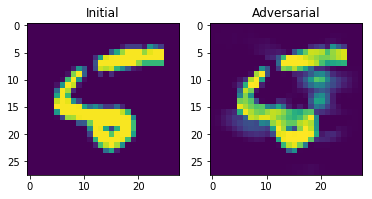

Total distortion: 2.9398716219945036
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 9.30441    -8.327395    0.26707196 -4.3078103  -2.7402978   0.2886847
   2.4045756  -4.1780386   1.1008474   5.571498  ]] 0
initial_73_0.png
output/mnist/initial_73_0.png output/mnist/adversarial_73_0.png


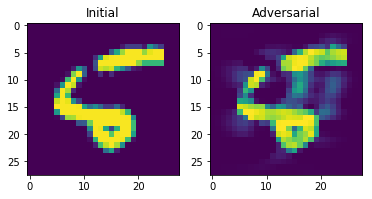

Total distortion: 3.025924251377295
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 0.01242427 -2.759751    0.6218649  -3.0888374   0.8980284   1.1374867
   2.2515302  -2.4287932   5.119564   -0.43155766]] 8
initial_74_0.png
output/mnist/initial_74_0.png output/mnist/adversarial_74_0.png


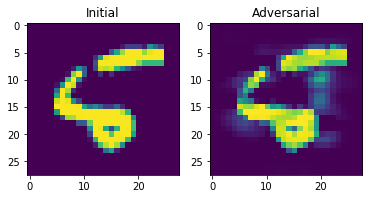

Total distortion: 2.689781639851192
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 2.501721   -4.568386    5.550047   -2.4833086  -0.84766257 -0.38291344
   1.1239414  -4.6753674   3.5429776   1.9512018 ]] 2
initial_75_0.png
output/mnist/initial_75_0.png output/mnist/adversarial_75_0.png


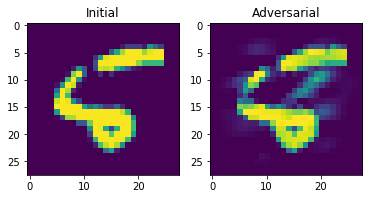

Total distortion: 2.8994928376908113
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 1.006174   -5.4091673   2.7350333   2.2123458  -3.2948527  -0.7211897
  -0.29296076 -3.2531617   4.963984    3.789319  ]] 8
initial_76_0.png
output/mnist/initial_76_0.png output/mnist/adversarial_76_0.png


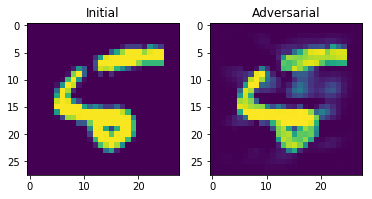

Total distortion: 2.306099152219115
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[-0.06755061 -6.112938   -3.1279767  -6.185439    3.3781345   5.492083
   4.663031   -6.667181    5.2921762   3.663066  ]] 5
initial_77_0.png
output/mnist/initial_77_0.png output/mnist/adversarial_77_0.png


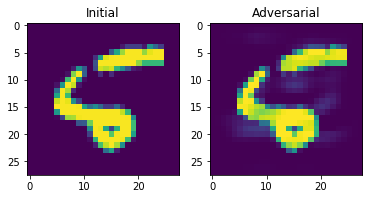

Total distortion: 1.081592512180012
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 3.3861008  -5.7368574  -3.0685248  -7.7152357  -2.9526248   8.716183
  10.618468   -9.127989    7.610134   -0.47179806]] 6
initial_78_0.png
output/mnist/initial_78_0.png output/mnist/adversarial_78_0.png


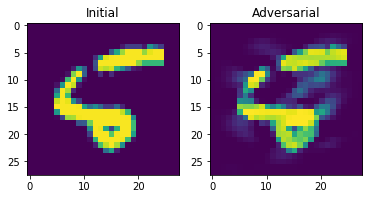

Total distortion: 2.8443108309550804
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[-0.02441401 -4.971176    2.8406334  -1.9672104  -0.16887838 -1.8961601
   1.3110248  -3.405736    6.3896785   2.7853265 ]] 8
initial_79_0.png
output/mnist/initial_79_0.png output/mnist/adversarial_79_0.png


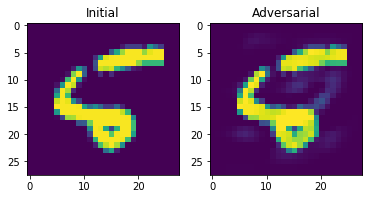

Total distortion: 1.0415586161204848
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 0.80878395 -6.8584013  -1.8188055  -6.289229   -1.1650722   6.014032
   6.6709504  -8.903779   10.8736925   2.0756273 ]] 8
initial_80_0.png
output/mnist/initial_80_0.png output/mnist/adversarial_80_0.png


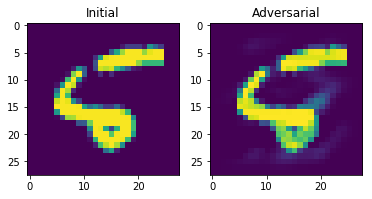

Total distortion: 1.6836641301360225
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[-1.6449937 -9.96178   -3.737088  -5.548114   0.7356312  5.881768
   3.0933075 -8.66907    9.615748   9.195786 ]] 8
initial_81_0.png
output/mnist/initial_81_0.png output/mnist/adversarial_81_0.png


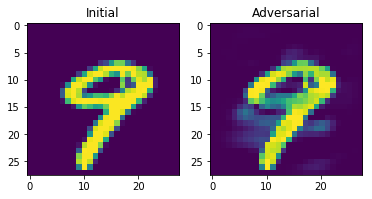

Total distortion: 2.3276615577622386
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-1.3063256   1.8249898  -0.33088547 -2.3608284   0.230087   -5.9380302
  -5.904032    5.029787    5.2350345   3.742148  ]] 8
initial_82_0.png
output/mnist/initial_82_0.png output/mnist/adversarial_82_0.png


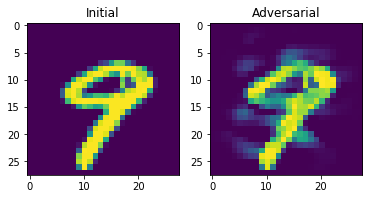

Total distortion: 3.0353142931624673
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-1.4858577   0.42254436  0.5189555  -1.1005975   0.10240658 -3.8067646
  -2.8840454  -0.11301048  5.3205814   3.0436316 ]] 8
initial_83_0.png
output/mnist/initial_83_0.png output/mnist/adversarial_83_0.png


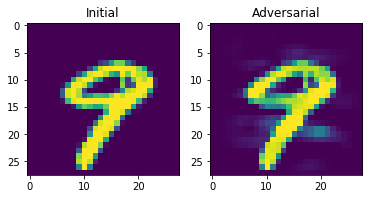

Total distortion: 1.7779287193050135
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-4.8864403e+00 -6.9012642e-03 -1.3055255e+00 -1.1342865e+00
   4.5075951e+00 -7.4110594e+00 -8.3202085e+00  3.3675609e+00
   6.8199167e+00  1.0620113e+01]] 9
initial_84_0.png
output/mnist/initial_84_0.png output/mnist/adversarial_84_0.png


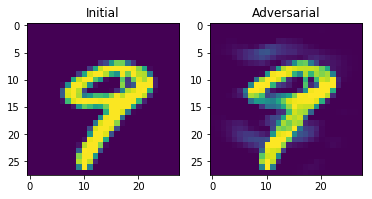

Total distortion: 2.1444492011712026
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-3.756355    0.33082646 -1.8252014   1.8130252   0.7401555  -6.386589
  -7.623684    3.9438703   6.6845684   7.809231  ]] 9
initial_85_0.png
output/mnist/initial_85_0.png output/mnist/adversarial_85_0.png


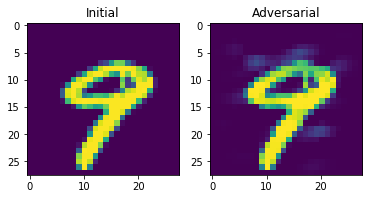

Total distortion: 1.3134444789442392
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[ -9.173753   -1.5322458  -4.288173   -1.997021   11.416015   -8.591305
  -11.578945    2.2252192   7.5778837  19.284388 ]] 9
initial_86_0.png
output/mnist/initial_86_0.png output/mnist/adversarial_86_0.png


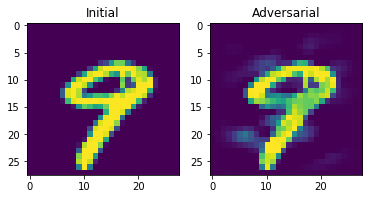

Total distortion: 2.2290900624265255
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-2.9749877   0.20698816 -2.7516713  -0.7117933   0.6551652  -3.334746
  -5.847058    2.0470603   6.3269563   6.6455894 ]] 9
initial_87_0.png
output/mnist/initial_87_0.png output/mnist/adversarial_87_0.png


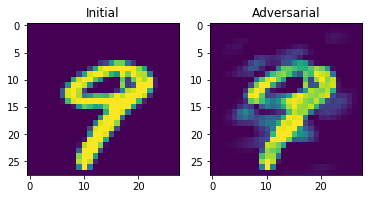

Total distortion: 2.9885722897488507
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-1.9318666   1.7485274   0.06571028 -1.7458876   0.85993034 -4.710587
  -4.975189    3.3502798   4.5912538   3.357953  ]] 8
initial_88_0.png
output/mnist/initial_88_0.png output/mnist/adversarial_88_0.png


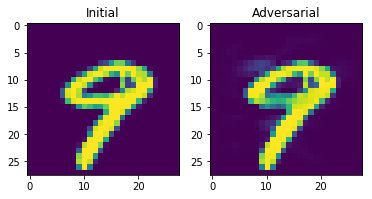

Total distortion: 1.2698557747024766
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[ -5.6406612   -0.15267038  -4.3594394   -0.7505929    4.0510798
   -5.9689603  -10.493334     5.9450617    4.345483    13.927618  ]] 9
initial_89_0.png
output/mnist/initial_89_0.png output/mnist/adversarial_89_0.png


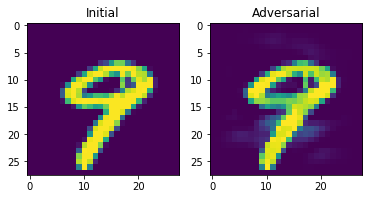

Total distortion: 1.5556521849289586
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-4.892282   -1.2658988  -3.9206214  -0.63134426  2.9407759  -6.374849
  -8.2587595   1.4038786  10.383363   11.932523  ]] 9
initial_90_1.png
output/mnist/initial_90_1.png output/mnist/adversarial_90_1.png


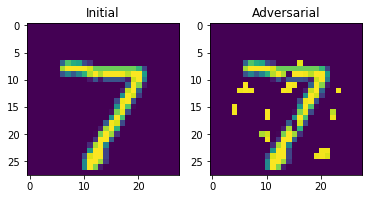

Total distortion: 5.0532526399985525
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[-0.12312821 -0.8151995   2.1398714   0.14670531 -2.9171796  -2.74957
  -8.730116   11.257893   -0.099117    1.5743616 ]] 7
initial_91_1.png
output/mnist/initial_91_1.png output/mnist/adversarial_91_1.png


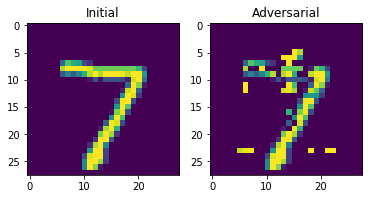

Total distortion: 5.373346118643595
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[-1.2331196   1.3748131   1.7221539   0.528321   -0.07299565 -2.2284753
  -5.124201    7.3050823  -0.67052317 -0.9808793 ]] 7
initial_92_1.png
output/mnist/initial_92_1.png output/mnist/adversarial_92_1.png


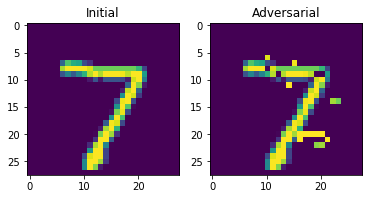

Total distortion: 4.040652642741872
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[-2.165115    1.2141442   5.5959277  -1.101991   -1.9160149  -5.0155063
  -7.0784936  10.255198    0.79098207 -2.0595722 ]] 7
initial_93_1.png
output/mnist/initial_93_1.png output/mnist/adversarial_93_1.png


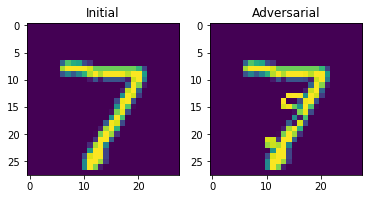

Total distortion: 3.365107980613907
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[ -5.998757    -1.3585943    1.4352627   10.397465    -3.0971253
   -2.2000787  -10.330447    10.507156    -0.99958056   4.3918424 ]] 7
initial_94_1.png
output/mnist/initial_94_1.png output/mnist/adversarial_94_1.png


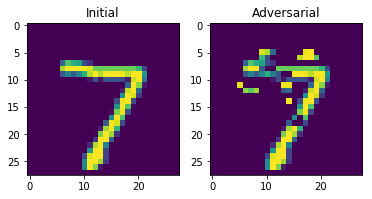

Total distortion: 4.617206915541877
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[ 0.8153714  -2.8208525   0.95115495  2.0072095  -2.7233126  -3.218069
  -5.1620655   4.3541594   3.7062416   2.934732  ]] 7
initial_95_1.png
output/mnist/initial_95_1.png output/mnist/adversarial_95_1.png


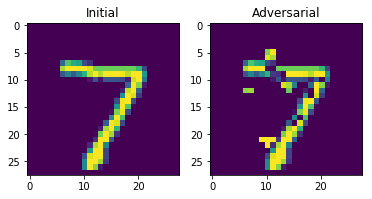

Total distortion: 4.492190684441806
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[ 2.2766166  -2.0468452   1.057447   -0.23132576 -4.3864827  -1.4316553
  -3.0004249   3.5832      2.5214407  -0.09807569]] 7
initial_96_1.png
output/mnist/initial_96_1.png output/mnist/adversarial_96_1.png


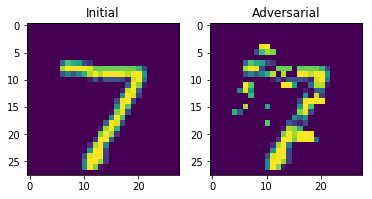

Total distortion: 5.451172224896979
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[ 0.52164435 -0.58876514  3.168574   -0.75765544 -1.6368184  -2.536222
  -2.0941179   2.8847263   2.6196713  -1.6428856 ]] 2
initial_97_1.png
output/mnist/initial_97_1.png output/mnist/adversarial_97_1.png


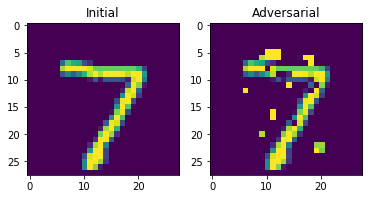

Total distortion: 4.892272671665071
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[ 1.412028   -3.5943367   2.150773   -0.79863816 -4.9589505  -3.9749997
  -5.0261617   4.821135    3.6400166   2.3452907 ]] 7
initial_98_1.png
output/mnist/initial_98_1.png output/mnist/adversarial_98_1.png


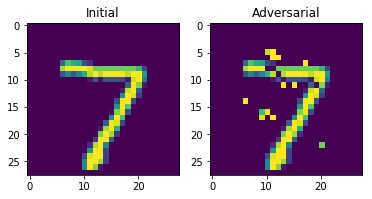

Total distortion: 3.947773201918289
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[ 0.06658535 -3.097004    1.2135253  -0.27804136 -3.4678407  -4.337721
  -8.19089     8.298557    2.4535234   4.7848935 ]] 7
initial_99_1.png
output/mnist/initial_99_1.png output/mnist/adversarial_99_1.png


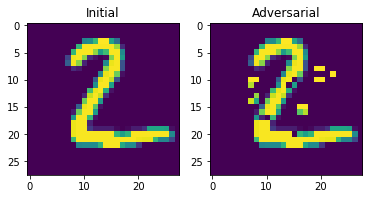

Total distortion: 4.202093855857756
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 4.0781503   0.8737478   7.4716244  -4.9936156  -1.2087394  -3.6933947
   1.2257853  -0.86921036 -1.2388608  -2.553204  ]] 2
initial_100_1.png
output/mnist/initial_100_1.png output/mnist/adversarial_100_1.png


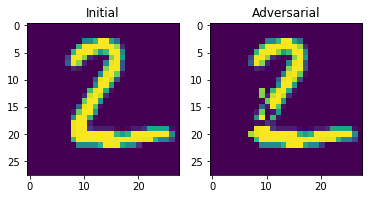

Total distortion: 2.869061016435139
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[-0.9539783  6.4811907  8.522865  -2.462761  -0.3898285 -4.8899355
  -0.8863056  1.7514682 -2.7268875 -3.1421676]] 2
initial_101_1.png
output/mnist/initial_101_1.png output/mnist/adversarial_101_1.png


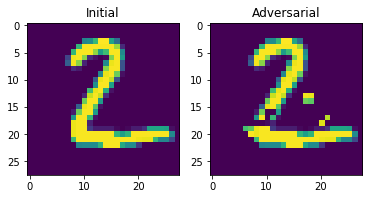

Total distortion: 3.556406531886357
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[-0.28066212  4.859104    6.9889584  -2.334626    0.16321278 -5.228286
   0.5968456   0.8262833  -2.491719   -3.3189363 ]] 2
initial_102_1.png
output/mnist/initial_102_1.png output/mnist/adversarial_102_1.png


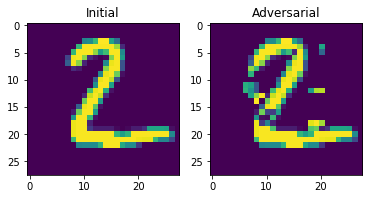

Total distortion: 4.140511680347932
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[-0.53252834  2.600817    4.968131   -4.643332   -1.375315   -1.8403183
   2.2539883  -1.6105456   2.3737712  -2.850625  ]] 2
initial_103_1.png
output/mnist/initial_103_1.png output/mnist/adversarial_103_1.png


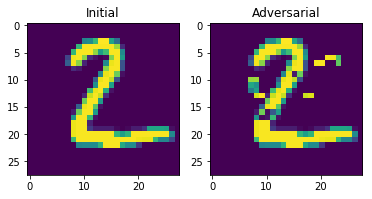

Total distortion: 3.9072858733938753
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[-0.37692386  2.8234758   5.5335855  -4.353666   -0.5651976  -1.9125993
   0.5677212   0.42898014 -0.5964367  -2.4168496 ]] 2
initial_104_1.png
output/mnist/initial_104_1.png output/mnist/adversarial_104_1.png


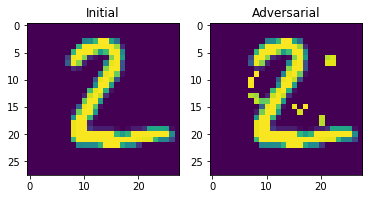

Total distortion: 3.7272091350501606
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 1.9795682  2.7035284  6.57662   -9.38397   -0.6233692 -2.615213
   5.218564  -3.2400446  2.7918015 -4.533038 ]] 2
initial_105_1.png
output/mnist/initial_105_1.png output/mnist/adversarial_105_1.png


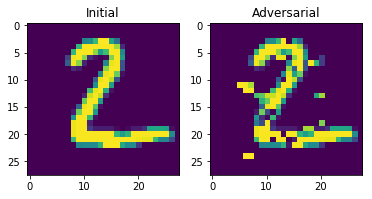

Total distortion: 5.163462640084353
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[-2.5138222e-03  1.8102427e+00  5.5805664e+00 -2.3554235e+00
  -2.9150286e-01 -2.9845605e+00 -3.6080806e+00  2.5677426e+00
   1.4911127e-01 -5.0811660e-01]] 2
initial_106_1.png
output/mnist/initial_106_1.png output/mnist/adversarial_106_1.png


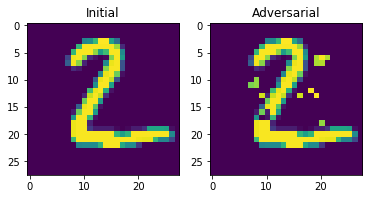

Total distortion: 3.6418178716093346
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[-0.06159949  3.3039508   5.0536046  -4.561845   -0.56791925 -1.9172164
   1.6287149   0.16104318 -1.7880218  -2.3060942 ]] 2
initial_107_1.png
output/mnist/initial_107_1.png output/mnist/adversarial_107_1.png


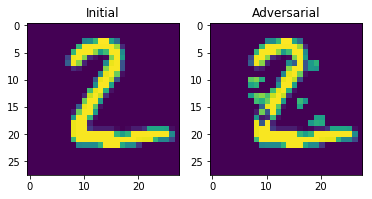

Total distortion: 3.512002935569075
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 1.9403206  2.0417747  4.98683   -4.5332327 -0.8329089 -3.2764041
   0.8917951 -0.8516892 -0.7392723 -1.1816201]] 2
initial_108_1.png
output/mnist/initial_108_1.png output/mnist/adversarial_108_1.png


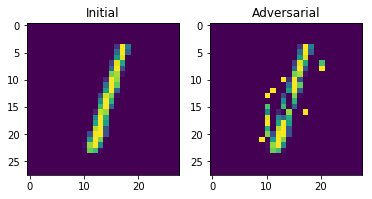

Total distortion: 3.8200346488779298
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-1.8023461   5.959917   -0.57549167 -5.079817    4.618735    0.02528564
   1.996772   -0.62040216  2.4284818  -3.3497672 ]] 1
initial_109_1.png
output/mnist/initial_109_1.png output/mnist/adversarial_109_1.png


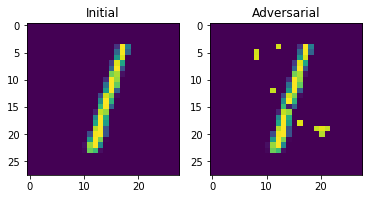

Total distortion: 2.9384955484493824
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-4.6721654   9.588255    2.3665786  -5.494542    5.1326575  -2.8179805
  -0.48938614  1.7551199   0.74232    -3.5751143 ]] 1
initial_110_1.png
output/mnist/initial_110_1.png output/mnist/adversarial_110_1.png


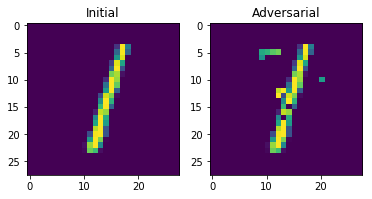

Total distortion: 2.7042734870521947
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-5.506912   6.496176  -1.5516706 -2.220769   3.913718  -2.2824478
  -3.0126286  1.8825604  2.6458948  1.7643379]] 1
initial_111_1.png
output/mnist/initial_111_1.png output/mnist/adversarial_111_1.png


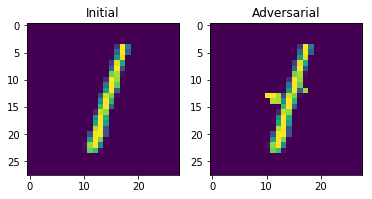

Total distortion: 2.248950395545067
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-9.348644   9.452318  -0.317774  -8.094702  14.524599  -2.7860787
  -2.0510862 -1.2061865  4.6768064 -0.1585393]] 4
initial_112_1.png
output/mnist/initial_112_1.png output/mnist/adversarial_112_1.png


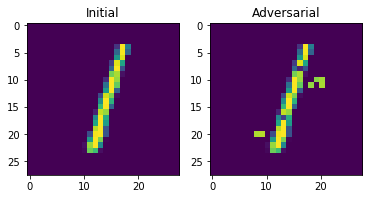

Total distortion: 2.4306197263935583
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-5.099785  11.467529  -4.58019   -5.461874   4.052854   3.3552012
   2.459189  -1.6051589  2.5637527 -3.307097 ]] 1
initial_113_1.png
output/mnist/initial_113_1.png output/mnist/adversarial_113_1.png


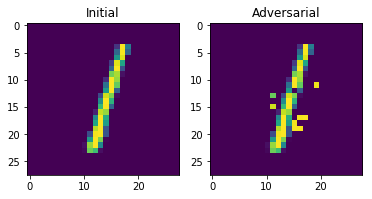

Total distortion: 2.875165022384772
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-4.1353393   7.847227   -0.5307156  -5.3562346   7.2645426  -0.35082516
   2.0485728   0.04235676  2.5105128  -5.020916  ]] 1
initial_114_1.png
output/mnist/initial_114_1.png output/mnist/adversarial_114_1.png


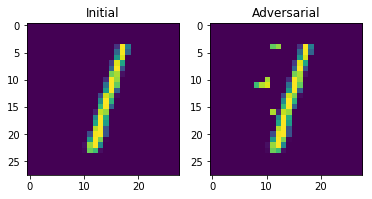

Total distortion: 2.227754829121534
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-5.0708756 10.911809  -1.1292827 -4.673588   5.038026  -2.1798017
  -1.9707986  3.5465155  1.0315204 -2.7743196]] 1
initial_115_1.png
output/mnist/initial_115_1.png output/mnist/adversarial_115_1.png


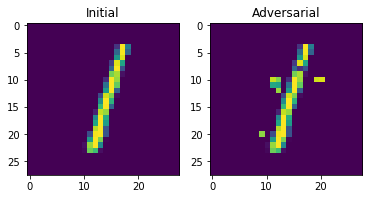

Total distortion: 2.466644838167812
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-4.1909633   8.340681   -1.5216614  -4.985448    4.515374    0.8207157
   0.07023389 -0.40634304  3.2352288  -2.5764284 ]] 1
initial_116_1.png
output/mnist/initial_116_1.png output/mnist/adversarial_116_1.png


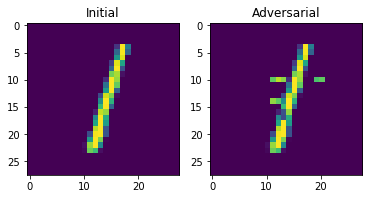

Total distortion: 2.3301114817787347
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-6.183001   8.333257  -2.305023  -4.043318   6.6030726 -1.7804255
  -2.1184974  0.9889235  3.294196  -0.5546231]] 1
initial_117_1.png
output/mnist/initial_117_1.png output/mnist/adversarial_117_1.png


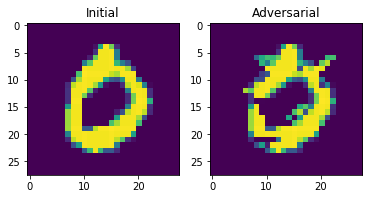

Total distortion: 4.5257130435154735
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[ 7.2787     -1.894475    2.1860738   0.97912735 -0.887159    0.16748124
  -2.6450195   6.835241   -4.541909   -2.2956643 ]] 0
initial_118_1.png
output/mnist/initial_118_1.png output/mnist/adversarial_118_1.png


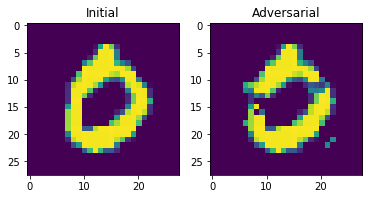

Total distortion: 3.0823979032737556
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[ 9.757281   -1.396521    5.3349595  -1.1660744  -2.8293269  -0.0112028
  -0.51081675  3.3480237  -4.972541   -2.6550055 ]] 0
initial_119_1.png
output/mnist/initial_119_1.png output/mnist/adversarial_119_1.png


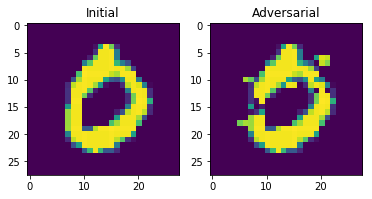

Total distortion: 3.8053585768782163
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[12.313551   -2.0785234   2.2782955  -1.419679   -2.211791    1.3587027
   0.49079955  2.4705758  -4.882863   -2.0575151 ]] 0
initial_120_1.png
output/mnist/initial_120_1.png output/mnist/adversarial_120_1.png


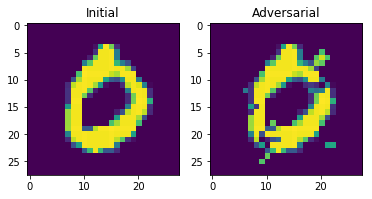

Total distortion: 3.835053569315115
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[12.839046   -1.4877136  -0.40324342 -5.3519754  -3.8061926  -0.4941317
  -1.16107     6.433404   -3.3569496  -1.5718769 ]] 0
initial_121_1.png
output/mnist/initial_121_1.png output/mnist/adversarial_121_1.png


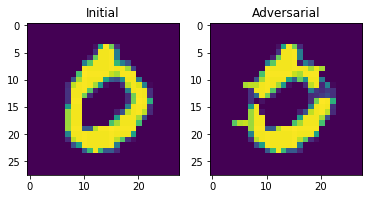

Total distortion: 3.758775995974626
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[ 6.408811   -0.05443169  3.0761979   0.33990407 -2.7712677   0.8312496
   1.1255953   1.5539609  -3.3360994  -2.8158097 ]] 0
initial_122_1.png
output/mnist/initial_122_1.png output/mnist/adversarial_122_1.png


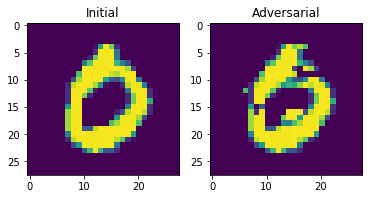

Total distortion: 4.138464713211303
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[14.199243  -2.1620016 -0.7103493 -3.9968774 -1.3508314  1.0352986
   6.5018225 -0.7046279 -4.226022  -2.5454488]] 0
initial_123_1.png
output/mnist/initial_123_1.png output/mnist/adversarial_123_1.png


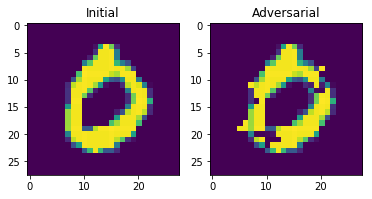

Total distortion: 4.066672192762612
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[10.281007   -0.20957357  1.3125777  -4.847906   -4.710709   -1.3606446
  -1.4889665   7.333734   -1.6623358  -3.152677  ]] 0
initial_124_1.png
output/mnist/initial_124_1.png output/mnist/adversarial_124_1.png


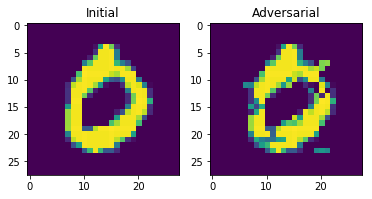

Total distortion: 3.87998149985396
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[11.588896   -0.9302622  -0.08959386 -3.529267   -5.7172747   0.10621776
   0.87186867  3.9558742  -1.0249201  -3.4353328 ]] 0
initial_125_1.png
output/mnist/initial_125_1.png output/mnist/adversarial_125_1.png


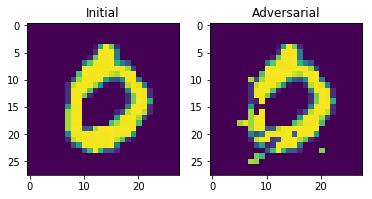

Total distortion: 3.649665968777798
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[11.570107  -1.6101077  3.2080204 -2.680193  -3.0203154 -0.8179536
  -2.679464   7.6118526 -6.680125  -0.7837148]] 0
initial_126_1.png
output/mnist/initial_126_1.png output/mnist/adversarial_126_1.png


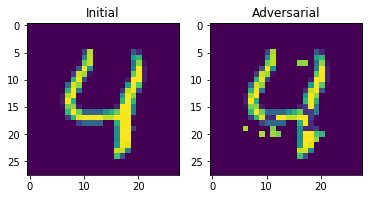

Total distortion: 3.6179313142075724
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[ 1.651762  -2.636792  -1.6689014 -6.400901   7.0434422 -3.649251
   1.4041378 -3.3115566  5.158033   3.7871566]] 4
initial_127_1.png
output/mnist/initial_127_1.png output/mnist/adversarial_127_1.png


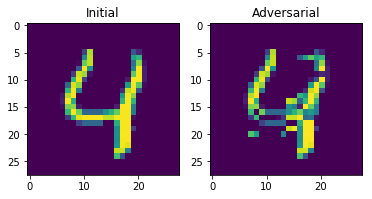

Total distortion: 3.876932462161562
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-0.93534905  0.51551235 -3.5149958  -5.223935    6.5473046  -5.4084353
  -0.5974221  -0.3685238   4.9326644   4.805447  ]] 4
initial_128_1.png
output/mnist/initial_128_1.png output/mnist/adversarial_128_1.png


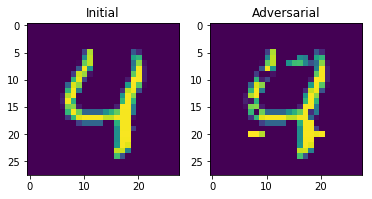

Total distortion: 3.4685935595177377
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-1.2509383  -1.3830281  -0.15260404 -3.7810547   9.522937   -6.6709433
  -5.6708074   2.2576478   0.07143996  9.587252  ]] 9
initial_129_1.png
output/mnist/initial_129_1.png output/mnist/adversarial_129_1.png


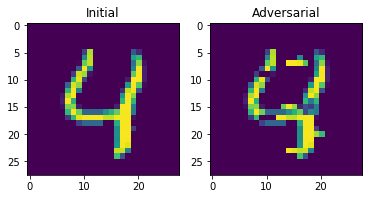

Total distortion: 3.9969500596527237
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[ 0.7587516  -2.5496695  -0.08553439 -1.2194387   2.4198883  -3.3361864
  -1.6075088   0.14634547  1.040161    4.9439473 ]] 9
initial_130_1.png
output/mnist/initial_130_1.png output/mnist/adversarial_130_1.png


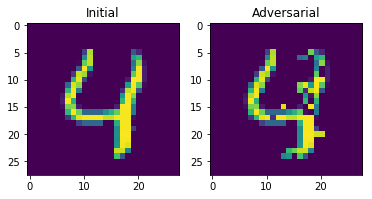

Total distortion: 3.822228074315739
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-3.5139588e-01 -4.4612007e+00 -3.8432405e+00 -7.6472826e+00
   1.1206089e+01 -5.5894442e-03  3.9690280e+00 -4.2174091e+00
   1.9960007e-01  5.8976307e+00]] 4
initial_131_1.png
output/mnist/initial_131_1.png output/mnist/adversarial_131_1.png


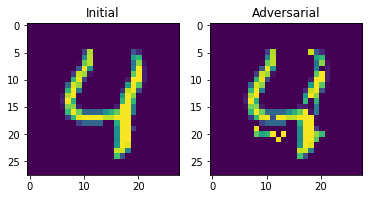

Total distortion: 3.5964356048813935
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-0.24838768 -2.0863984  -3.7252848  -7.673502   10.635789   -1.32413
   4.42431    -4.0271063   2.7843063   3.1105528 ]] 4
initial_132_1.png
output/mnist/initial_132_1.png output/mnist/adversarial_132_1.png


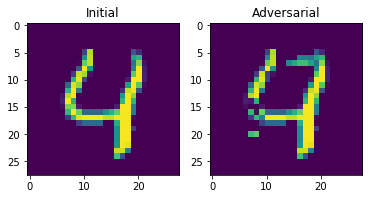

Total distortion: 2.691647722238615
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-2.8484325 -2.5299351 -0.4179201 -4.6327305 11.506715  -8.025538
  -6.421874   4.0593834 -1.8090632 12.872594 ]] 9
initial_133_1.png
output/mnist/initial_133_1.png output/mnist/adversarial_133_1.png


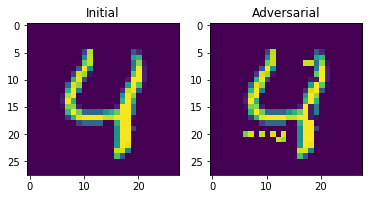

Total distortion: 3.294607820224877
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-1.0154107  -4.5021935  -3.3106465  -7.635334   11.388068   -5.4249573
  -0.71097964 -3.455822    5.403055   10.1774435 ]] 4
initial_134_1.png
output/mnist/initial_134_1.png output/mnist/adversarial_134_1.png


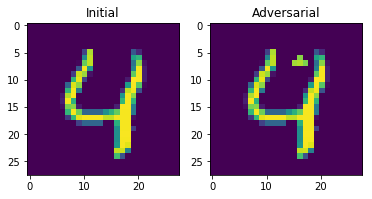

Total distortion: 1.6913376016759687
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-2.0556529e+00 -5.3724051e+00 -3.3428564e+00 -8.1114883e+00
   1.6500574e+01 -8.7099161e+00 -4.6067295e+00 -1.7185654e-02
  -1.5028571e+00  1.7934393e+01]] 9
initial_135_1.png
output/mnist/initial_135_1.png output/mnist/adversarial_135_1.png


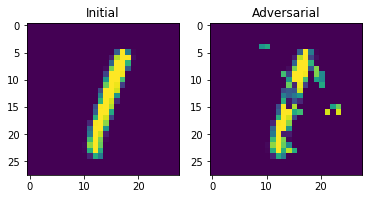

Total distortion: 3.8139205537392065
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-2.837905    8.742012    2.2570748  -5.8831105   2.7933652  -3.0085459
   0.05584174  0.35106766  3.4582942  -3.465005  ]] 1
initial_136_1.png
output/mnist/initial_136_1.png output/mnist/adversarial_136_1.png


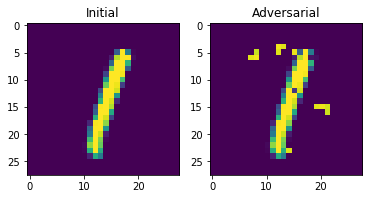

Total distortion: 3.5407659544668473
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-6.652855   10.30462     3.8302515  -4.032507    3.7838979  -5.5215726
  -5.0559354   6.100663    0.37555352 -1.7934175 ]] 1
initial_137_1.png
output/mnist/initial_137_1.png output/mnist/adversarial_137_1.png


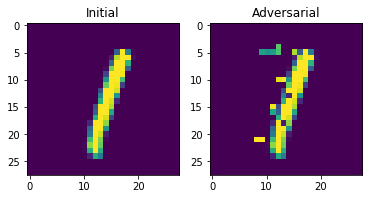

Total distortion: 3.106003817161086
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-6.3817954   9.541208   -1.6456431  -0.19008885  1.7392778  -2.8790991
  -6.7323155   5.7926188  -0.15559587  1.9241846 ]] 1
initial_138_1.png
output/mnist/initial_138_1.png output/mnist/adversarial_138_1.png


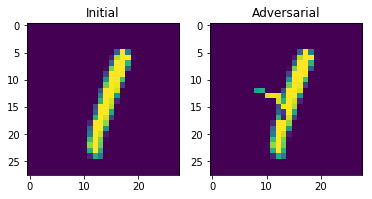

Total distortion: 2.42004955776954
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-9.822043   15.009906   -2.2330837  -8.376777   11.769189   -2.4046998
  -2.8668556   0.39390215  3.204672   -0.18159401]] 1
initial_139_1.png
output/mnist/initial_139_1.png output/mnist/adversarial_139_1.png


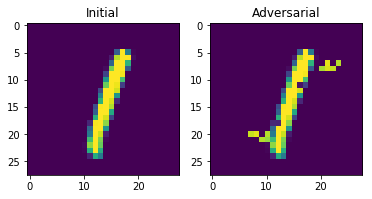

Total distortion: 3.1505577199177295
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-3.8495455 15.397839  -6.7142873 -7.150874   2.589452   6.139367
   4.0117126 -3.1808825 -0.3544689 -2.4489875]] 1
initial_140_1.png
output/mnist/initial_140_1.png output/mnist/adversarial_140_1.png


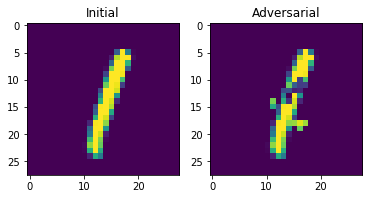

Total distortion: 3.0894943406262647
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-3.735056   8.003018   0.6738127 -5.0201874  5.8607597 -1.5821134
   1.996701   1.6149797  1.7296772 -5.359182 ]] 1
initial_141_1.png
output/mnist/initial_141_1.png output/mnist/adversarial_141_1.png


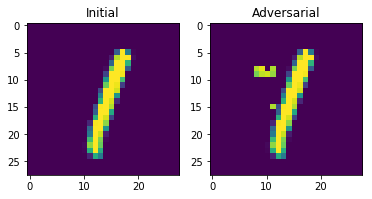

Total distortion: 2.5090532412484663
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-7.120721   14.840602   -0.9724673  -5.5564313   4.599459   -2.5365787
  -5.3610034   8.680638   -0.50250167 -2.8856297 ]] 1
initial_142_1.png
output/mnist/initial_142_1.png output/mnist/adversarial_142_1.png


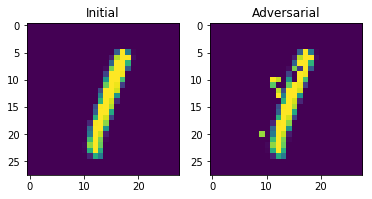

Total distortion: 2.755964486694741
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-5.3091135 10.025622  -1.6944771 -5.4953046  7.0799217 -1.3214924
  -1.4517146 -0.6718362  4.172582  -1.4454614]] 1
initial_143_1.png
output/mnist/initial_143_1.png output/mnist/adversarial_143_1.png


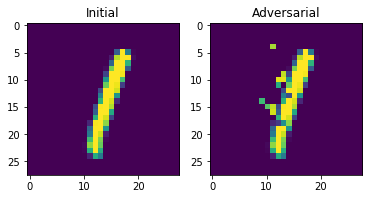

Total distortion: 2.8326322772795858
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-9.65512   14.043822  -1.1765703 -4.5127163  8.91825   -4.514763
  -6.5037923  3.8124673  1.4528359  1.8684522]] 1
initial_144_1.png
output/mnist/initial_144_1.png output/mnist/adversarial_144_1.png


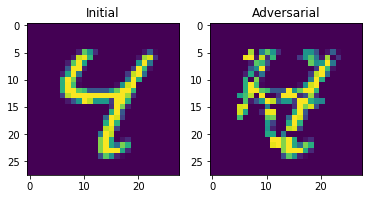

Total distortion: 5.566757458766848
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[ 0.03833843 -3.0522318   1.6281524  -2.7726767   4.861486   -5.1292706
  -2.3410301  -1.6644217   8.627522    1.5552057 ]] 8
initial_145_1.png
output/mnist/initial_145_1.png output/mnist/adversarial_145_1.png


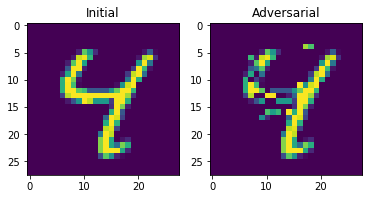

Total distortion: 3.934367432409012
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-3.564135    4.0442243   1.3021591  -4.5704956   6.727926   -5.581148
  -4.7400246   0.73892707  7.4828577   1.419943  ]] 8
initial_146_1.png
output/mnist/initial_146_1.png output/mnist/adversarial_146_1.png


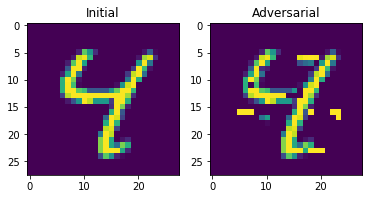

Total distortion: 4.449770872239344
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-6.959519  -1.743711   2.542482  -5.6741257 11.10236   -8.316305
  -7.853559   1.4608456 12.207779   9.080795 ]] 8
initial_147_1.png
output/mnist/initial_147_1.png output/mnist/adversarial_147_1.png


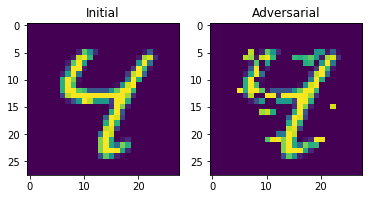

Total distortion: 4.706385701972632
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-3.9252112  -0.07097009  1.5400879  -0.6333162   4.1250105  -5.7650723
  -5.627102    2.275972    5.0047045   5.2474823 ]] 9
initial_148_1.png
output/mnist/initial_148_1.png output/mnist/adversarial_148_1.png


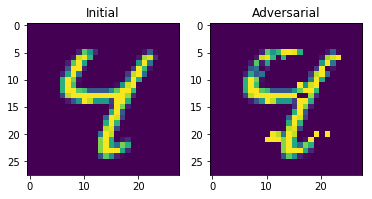

Total distortion: 4.275463119317433
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-6.056632  -2.0425632 -0.5552549 -2.6702757  7.139176  -3.9059656
  -5.6148286 -1.9736098  9.7750635  7.5843425]] 8
initial_149_1.png
output/mnist/initial_149_1.png output/mnist/adversarial_149_1.png


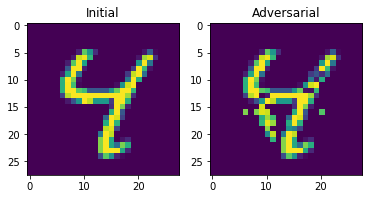

Total distortion: 4.066220501881554
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-1.9695779 -2.6353407 -4.110059  -9.611481   9.911573   0.6547315
   5.640228  -5.678708  10.54895    0.7407496]] 8
initial_150_1.png
output/mnist/initial_150_1.png output/mnist/adversarial_150_1.png


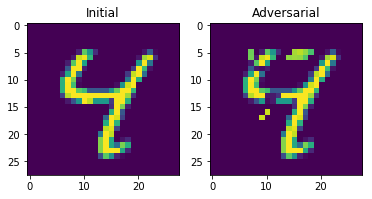

Total distortion: 3.7760309188514425
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-4.598771   -1.0932057   0.47449815 -1.4666995   4.4765897  -5.890317
  -5.0000157   0.86438906  8.043331    6.456625  ]] 8
initial_151_1.png
output/mnist/initial_151_1.png output/mnist/adversarial_151_1.png


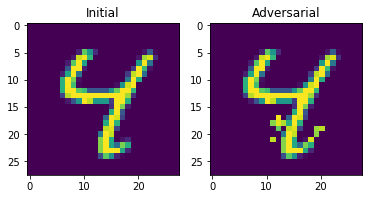

Total distortion: 2.7658376665839026
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-9.097777    0.75697994 -2.5813494  -8.245346   20.085402   -7.367231
  -3.0428782  -1.7482615  12.740333    5.4417934 ]] 4
initial_152_1.png
output/mnist/initial_152_1.png output/mnist/adversarial_152_1.png


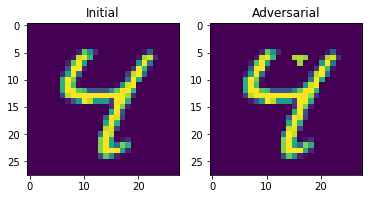

Total distortion: 1.7144926576365382
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-9.283239  -2.1899066 -1.9884607 -6.4421988 16.472227  -7.2563853
  -6.5621867 -1.8213252 12.4049    11.350372 ]] 4
initial_153_1.png
output/mnist/initial_153_1.png output/mnist/adversarial_153_1.png


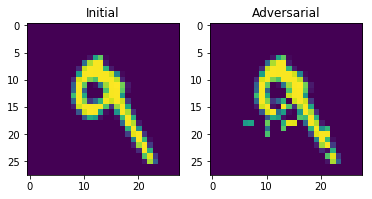

Total distortion: 3.237311315745477
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-1.5340148 -4.02324   -0.8930928 -4.950042   4.034531  -3.902105
  -6.1405168 -2.020377  10.360373   8.729836 ]] 8
initial_154_1.png
output/mnist/initial_154_1.png output/mnist/adversarial_154_1.png


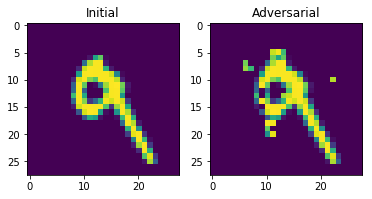

Total distortion: 3.5581531440322687
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-4.0333586 -1.686061  -0.4980842 -2.1640418  4.706038  -3.8674278
  -5.4962897 -2.366269  12.121258   5.500885 ]] 8
initial_155_1.png
output/mnist/initial_155_1.png output/mnist/adversarial_155_1.png


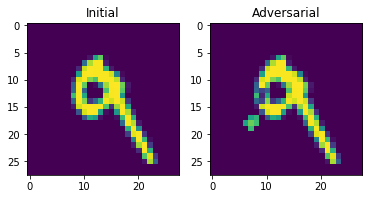

Total distortion: 2.1669283733280795
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-4.763398  -3.8966448  2.9230576 -2.672436   5.3496733 -5.8545947
  -8.442736  -3.532423  13.840012  10.33499  ]] 8
initial_156_1.png
output/mnist/initial_156_1.png output/mnist/adversarial_156_1.png


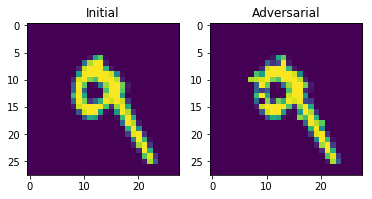

Total distortion: 2.6178343927097085
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-6.558256  -3.7028153 -2.7363098  1.7287139  5.028251  -3.1688957
  -8.414971   0.1058743  5.1982913 14.097804 ]] 9
initial_157_1.png
output/mnist/initial_157_1.png output/mnist/adversarial_157_1.png


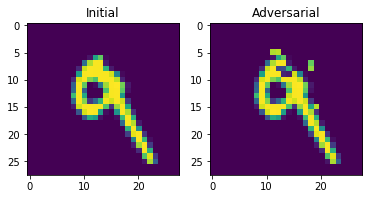

Total distortion: 2.5477161539633437
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-8.367718  -4.3678102 -3.9521844 -5.9785705 13.442082  -3.1347983
  -5.2738447 -5.605969   8.788045  15.343012 ]] 9
initial_158_1.png
output/mnist/initial_158_1.png output/mnist/adversarial_158_1.png


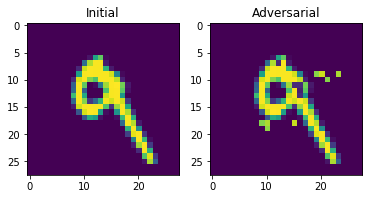

Total distortion: 3.1426743231275363
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-4.9226007 -4.7818213 -1.5416499 -5.0216317  6.5608544 -2.5995026
  -4.2826877 -5.0403953 14.48029    8.931116 ]] 8
initial_159_1.png
output/mnist/initial_159_1.png output/mnist/adversarial_159_1.png


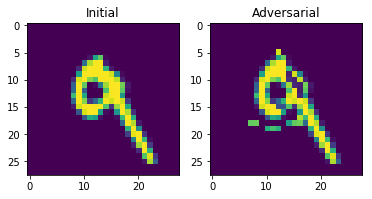

Total distortion: 3.510439290653906
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-3.419123   -3.510793   -0.51384777 -6.018247    9.205466   -3.7823086
  -2.469399   -5.2753077  11.017741    6.776265  ]] 8
initial_160_1.png
output/mnist/initial_160_1.png output/mnist/adversarial_160_1.png


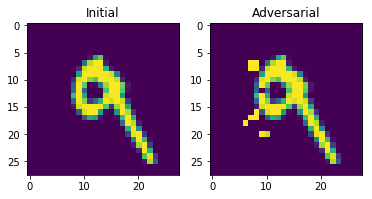

Total distortion: 3.284718161094974
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-4.8654556 -3.2017283  1.1902877 -4.941307   7.8660393 -5.8275366
  -8.125085  -2.7566297 13.690611  10.281501 ]] 8
initial_161_1.png
output/mnist/initial_161_1.png output/mnist/adversarial_161_1.png


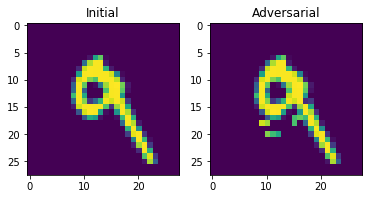

Total distortion: 2.2956354857926313
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-4.407585  -5.956725  -2.7270746 -4.0781136  5.709438  -5.3754497
  -6.8206115 -3.9654684 14.268548  13.86725  ]] 8
initial_162_1.png
output/mnist/initial_162_1.png output/mnist/adversarial_162_1.png


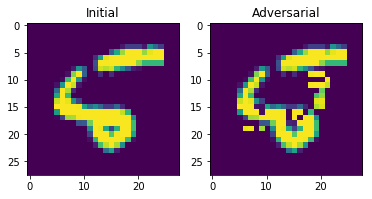

Total distortion: 4.87249182710701
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[13.12911    -9.72725    -0.01417212 -5.282389   -5.5355163  -1.3353246
   3.5232127  -4.992376    3.818951    4.4214745 ]] 0
initial_163_1.png
output/mnist/initial_163_1.png output/mnist/adversarial_163_1.png


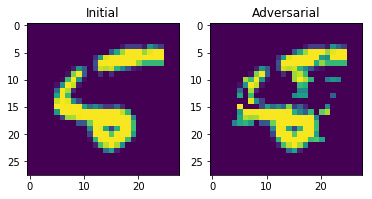

Total distortion: 4.680421494633965
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 3.7358031  -3.8080974   2.421095   -4.981162    0.78104824  0.25288182
   1.4694517  -2.6942983   4.490711    0.68110055]] 8
initial_164_1.png
output/mnist/initial_164_1.png output/mnist/adversarial_164_1.png


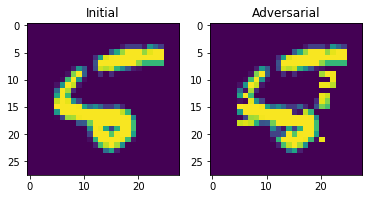

Total distortion: 4.665681235401842
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 1.2415069  -6.8356876   1.5594169  -3.807598   -0.16949041  2.0358639
   2.1996331  -6.5205846   5.0412054   5.849331  ]] 9
initial_165_1.png
output/mnist/initial_165_1.png output/mnist/adversarial_165_1.png


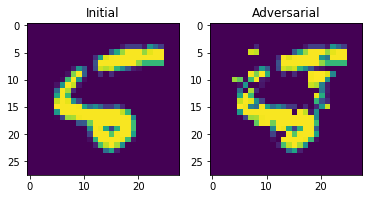

Total distortion: 5.153946795614162
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 2.056541   -6.147193   -0.32683653  1.4928232   0.2976746   0.83880854
  -3.5709512  -1.6118233  -1.4807558   9.379953  ]] 9
initial_166_1.png
output/mnist/initial_166_1.png output/mnist/adversarial_166_1.png


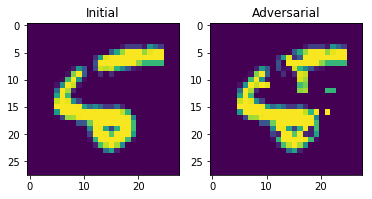

Total distortion: 4.182692771796918
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[-0.16076596 -5.1039486  -2.110072   -6.037663    7.446604    0.4935424
   1.9043212  -3.9511669   6.36341     3.5844269 ]] 4
initial_167_1.png
output/mnist/initial_167_1.png output/mnist/adversarial_167_1.png


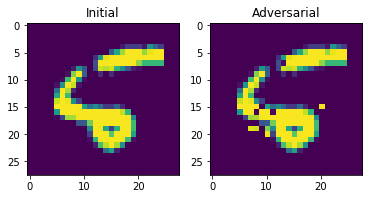

Total distortion: 2.8500685031086723
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 4.1029043 -6.111065  -2.9992158 -7.995271  -4.8929477  9.667247
  12.342169  -9.03204    7.826689  -2.3458257]] 6
initial_168_1.png
output/mnist/initial_168_1.png output/mnist/adversarial_168_1.png


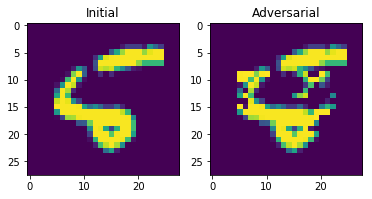

Total distortion: 4.847109706171515
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 0.8944082 -5.4722033  1.7483723 -2.702842   0.547217  -3.4522147
   1.599352  -3.301381   7.8460436  3.9977574]] 8
initial_169_1.png
output/mnist/initial_169_1.png output/mnist/adversarial_169_1.png


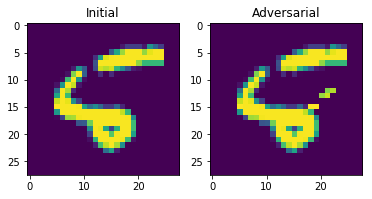

Total distortion: 2.2385253773116274
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 1.0271444 -7.6593914 -1.6159375 -6.3899984 -1.591379   4.9076757
   7.1066594 -9.483816  13.145983   1.9516959]] 8
initial_170_1.png
output/mnist/initial_170_1.png output/mnist/adversarial_170_1.png


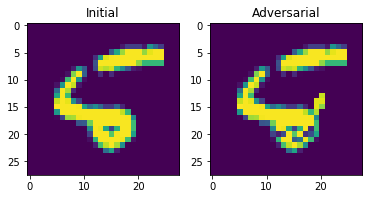

Total distortion: 3.069140494493363
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[-2.707045  -9.977904  -3.0458724 -6.099546   3.0059295  3.1713004
   2.5256147 -8.25666   11.486435   9.248317 ]] 8
initial_171_1.png
output/mnist/initial_171_1.png output/mnist/adversarial_171_1.png


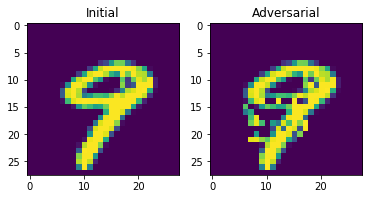

Total distortion: 4.1892669138395355
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[ 0.67432344 -0.6600282  -1.5294038  -2.0887246  -2.5051012  -4.7144175
  -5.1759477   3.9574199   5.9636087   4.739955  ]] 8
initial_172_1.png
output/mnist/initial_172_1.png output/mnist/adversarial_172_1.png


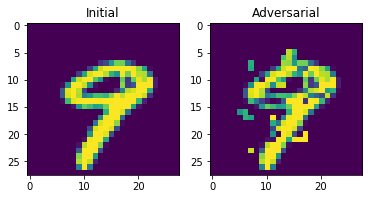

Total distortion: 4.861317139149901
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-0.66416544  0.7482389   1.5431203  -1.0028776  -1.1717405  -3.4327264
  -1.4590082   1.4696714   4.231608   -0.40568978]] 8
initial_173_1.png
output/mnist/initial_173_1.png output/mnist/adversarial_173_1.png


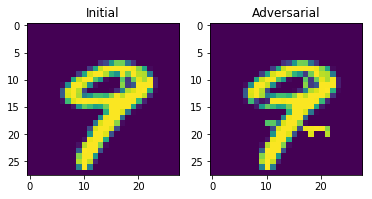

Total distortion: 3.2169415476726613
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-3.6689026   0.74557626  0.54160726 -0.4919684   3.7876635  -8.139314
  -7.4971066   4.422069    4.456256    8.57845   ]] 9
initial_174_1.png
output/mnist/initial_174_1.png output/mnist/adversarial_174_1.png


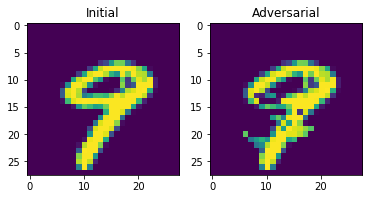

Total distortion: 3.741421105384608
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-0.29417115 -0.88101447 -0.4609903   0.8085412  -2.5823545  -4.371112
  -4.291522    1.3192279   7.0007896   3.4906669 ]] 8
initial_175_1.png
output/mnist/initial_175_1.png output/mnist/adversarial_175_1.png


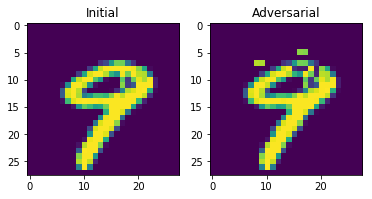

Total distortion: 2.645481136239627
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-10.784638   -2.064678   -5.877876   -1.5011795  13.964702   -8.738187
  -13.562306    3.1972096   7.025714   22.21763  ]] 9
initial_176_1.png
output/mnist/initial_176_1.png output/mnist/adversarial_176_1.png


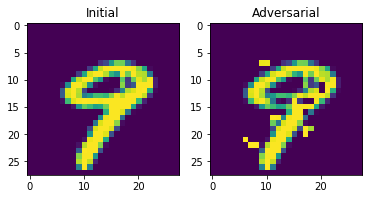

Total distortion: 4.334674603174415
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-2.4194565  -2.2186885  -2.9131577  -0.6875158  -0.3095925  -2.8457448
  -4.674519    0.07974704  9.624444    5.8981295 ]] 8
initial_177_1.png
output/mnist/initial_177_1.png output/mnist/adversarial_177_1.png


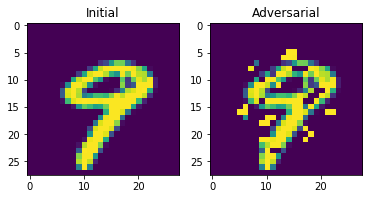

Total distortion: 5.934599157743169
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-2.3225322   0.09475604  0.5137615  -3.2335012   4.9451294  -3.3615472
  -2.312358   -0.5789871   5.8933077   2.8189378 ]] 8
initial_178_1.png
output/mnist/initial_178_1.png output/mnist/adversarial_178_1.png


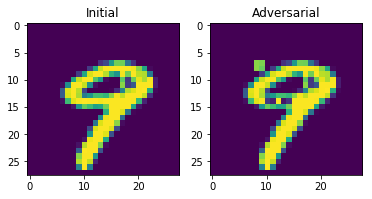

Total distortion: 2.3901406589120997
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[ -5.3706083   -0.46264404  -5.964971    -0.7329447    3.9243119
   -6.093119   -11.242793     6.323327     4.499534    15.58576   ]] 9
initial_179_1.png
output/mnist/initial_179_1.png output/mnist/adversarial_179_1.png


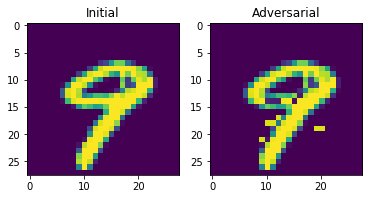

Total distortion: 3.0939609956557566
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-2.4653065  -1.4576199  -3.0205026  -0.46731484  0.5171564  -6.0175195
  -7.3770676   2.980642    8.260248    9.427479  ]] 9
initial_180_2.png
output/mnist/initial_180_2.png output/mnist/adversarial_180_2.png


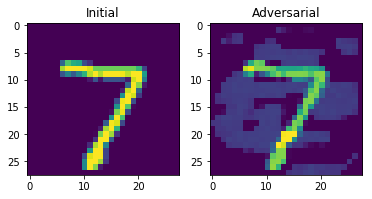

Total distortion: 3.43035284379531
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[ 1.9426091 -0.8062233  3.2858264 -1.2056056 -3.8108258 -2.4187152
  -5.442108   8.02271    0.9807718 -1.2419578]] 7
initial_181_2.png
output/mnist/initial_181_2.png output/mnist/adversarial_181_2.png


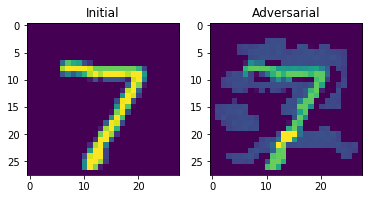

Total distortion: 4.051344829557034
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[-0.88061386  1.0208519   3.3335195  -0.6023249  -1.1195264  -2.7121992
  -3.8583336   4.8644705  -0.3047619  -0.9681872 ]] 7
initial_182_2.png
output/mnist/initial_182_2.png output/mnist/adversarial_182_2.png


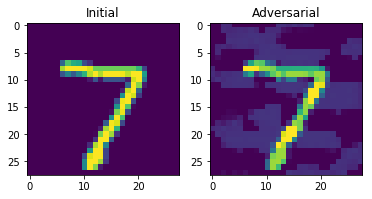

Total distortion: 2.7630310825417874
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[ 0.10254343 -0.14350557  4.6212754  -0.29613656 -3.968658   -3.9353251
  -6.329963    9.306835    1.7640586  -1.7440866 ]] 7
initial_183_2.png
output/mnist/initial_183_2.png output/mnist/adversarial_183_2.png


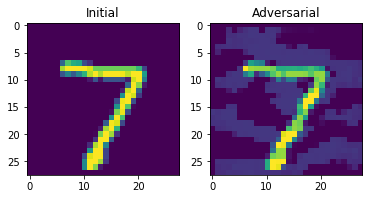

Total distortion: 3.0328333543928157
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[-2.2004735 -0.706311   2.6624124  2.5069356 -3.2706292 -3.294973
  -6.0750775  7.3800454  2.4664893  0.3082249]] 7
initial_184_2.png
output/mnist/initial_184_2.png output/mnist/adversarial_184_2.png


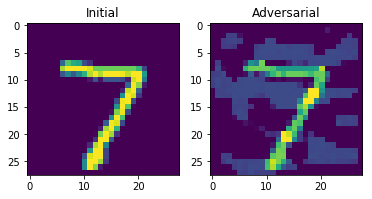

Total distortion: 3.938574992377453
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[-2.1137128 -0.7700167  2.255728   0.6240803 -0.2306291 -3.4583154
  -4.8523817  5.736594   1.6689023  1.2449454]] 7
initial_185_2.png
output/mnist/initial_185_2.png output/mnist/adversarial_185_2.png


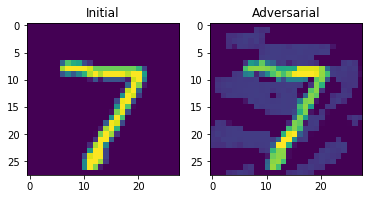

Total distortion: 3.1956622764700757
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[-0.5503538  -1.2459204   1.9299694   0.99962586 -4.0889225  -1.1800551
  -6.3707576   7.5517497   1.7154161   0.03945008]] 7
initial_186_2.png
output/mnist/initial_186_2.png output/mnist/adversarial_186_2.png


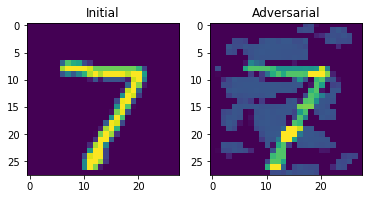

Total distortion: 4.684154282880229
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[ 0.6389682  -0.17646426  2.619025   -0.19410302 -2.4969196  -1.4273186
  -2.141142    2.9485264   2.9830718  -2.3024025 ]] 8
initial_187_2.png
output/mnist/initial_187_2.png output/mnist/adversarial_187_2.png


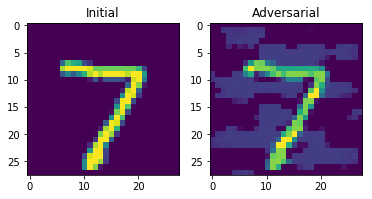

Total distortion: 3.3534365663001915
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[ 1.8485705 -1.9384308  3.763471  -0.6949612 -4.794537  -3.5087166
  -4.983745   6.080555   3.9569018 -1.1064287]] 7
initial_188_2.png
output/mnist/initial_188_2.png output/mnist/adversarial_188_2.png


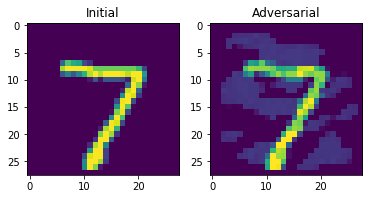

Total distortion: 2.696442740266903
[[ -2.8351269    1.3791523    0.94235706   0.44006127  -4.1104383
   -4.000832   -11.4562645   18.019012    -1.467063     0.6367636 ]] 7
[[-1.7857398  -1.3460999   1.8598727   2.0124884  -3.1039414  -3.4072838
  -7.8310027   9.5793295   0.54520255  2.496448  ]] 7
initial_189_2.png
output/mnist/initial_189_2.png output/mnist/adversarial_189_2.png


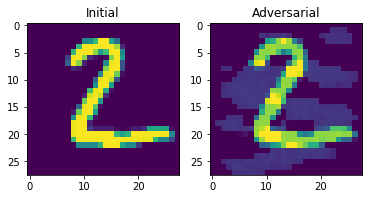

Total distortion: 2.897848146470909
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 6.6169734   0.38936108  5.749368   -5.8548903  -3.0701566  -2.5075617
   3.9719691  -3.8655849   1.8036648  -3.7187147 ]] 0
initial_190_2.png
output/mnist/initial_190_2.png output/mnist/adversarial_190_2.png


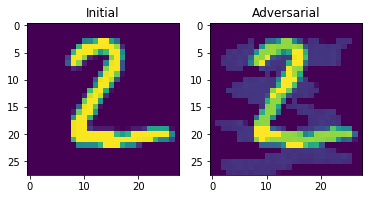

Total distortion: 2.7501411401769102
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 3.0269332   3.9699543   7.718907   -5.1839585   0.4450286  -3.8881881
   0.47042674  0.774482   -2.4519768  -3.719751  ]] 2
initial_191_2.png
output/mnist/initial_191_2.png output/mnist/adversarial_191_2.png


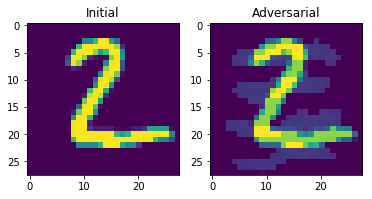

Total distortion: 2.628694386893901
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 4.182694    1.3801229   8.393655   -3.8307455  -1.4406816  -3.513329
  -0.02575816  0.735493   -0.66678375 -3.5461783 ]] 2
initial_192_2.png
output/mnist/initial_192_2.png output/mnist/adversarial_192_2.png


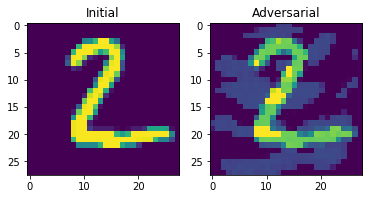

Total distortion: 4.086208706492802
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 1.0374823  0.9619834  3.0671442 -6.123183   1.272339  -1.8068638
   2.3293862 -1.2298265  1.3339975 -1.6420106]] 2
initial_193_2.png
output/mnist/initial_193_2.png output/mnist/adversarial_193_2.png


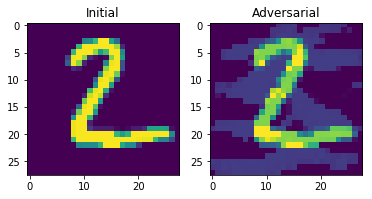

Total distortion: 3.5921847708062438
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 3.3534544   3.2262814   5.9068766  -5.294175   -0.11233763 -2.1039205
   2.151406   -1.4978096  -0.657539   -3.7664824 ]] 2
initial_194_2.png
output/mnist/initial_194_2.png output/mnist/adversarial_194_2.png


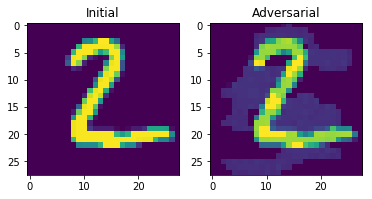

Total distortion: 2.6147660170080136
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 3.8969698   2.887516    8.139685   -6.93258    -0.85278684 -3.1140065
   4.278794   -2.3418415  -0.97367996 -4.758657  ]] 2
initial_195_2.png
output/mnist/initial_195_2.png output/mnist/adversarial_195_2.png


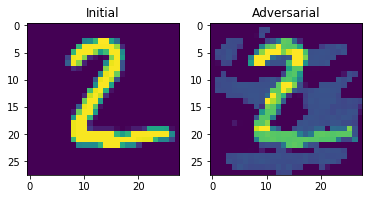

Total distortion: 4.558695003427773
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 2.5952516   0.84589374  3.7752619  -2.806347    0.18122816 -2.7842479
  -1.6696069   1.3234977  -0.3148261  -0.66822773]] 2
initial_196_2.png
output/mnist/initial_196_2.png output/mnist/adversarial_196_2.png


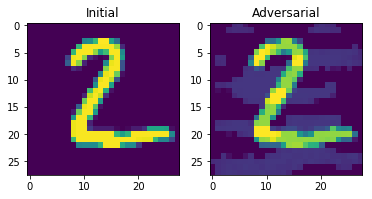

Total distortion: 2.881312365074185
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 3.2857163   1.7006592   7.5047054  -6.1055865  -1.9630165  -2.553622
   3.9381704  -2.1979814   0.92020756 -4.7037554 ]] 2
initial_197_2.png
output/mnist/initial_197_2.png output/mnist/adversarial_197_2.png


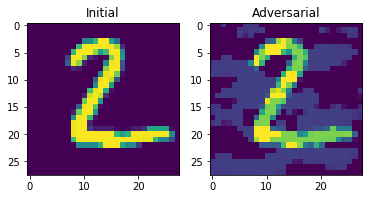

Total distortion: 3.673130681032049
[[ 4.4739776  4.761897  17.741089  -8.1105175 -1.570207  -7.950497
   3.0294652 -0.6678421 -2.352369  -7.523922 ]] 2
[[ 4.5265856  -0.840174    4.449432   -3.6742337  -2.0226202  -2.1618075
   2.1812558  -1.507902    0.79976404 -1.887348  ]] 0
initial_198_2.png
output/mnist/initial_198_2.png output/mnist/adversarial_198_2.png


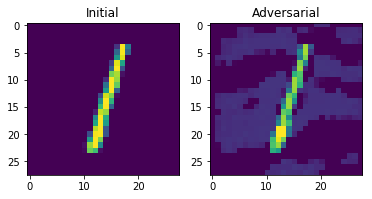

Total distortion: 2.6660467460408857
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-2.3096182   6.702014    1.1106316  -3.995033    2.0751941  -0.39254746
   0.03931651 -0.08921051  1.1258827  -2.2712321 ]] 1
initial_199_2.png
output/mnist/initial_199_2.png output/mnist/adversarial_199_2.png


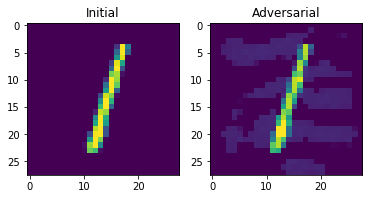

Total distortion: 1.6505099462228534
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-3.9994192  9.963693   2.203999  -4.792115   2.578691  -1.4132558
  -1.2292992  1.1952044  1.371476  -3.4303026]] 1
initial_200_2.png
output/mnist/initial_200_2.png output/mnist/adversarial_200_2.png


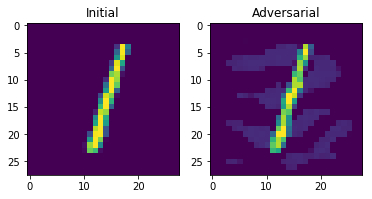

Total distortion: 1.6865025150699902
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-4.3415      7.763974   -1.7401062  -2.9329576   2.0766025  -0.7398877
  -1.6147465  -0.74456096  3.6978724   0.08677   ]] 1
initial_201_2.png
output/mnist/initial_201_2.png output/mnist/adversarial_201_2.png


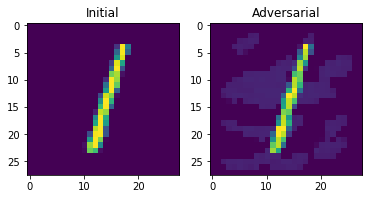

Total distortion: 1.500577974230058
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-5.7499881e+00  1.2399050e+01 -1.8249652e+00 -6.0701737e+00
   5.8628035e+00 -4.3429083e-01 -8.9269355e-03 -3.7066451e-01
   2.0619414e+00 -2.9023061e+00]] 1
initial_202_2.png
output/mnist/initial_202_2.png output/mnist/adversarial_202_2.png


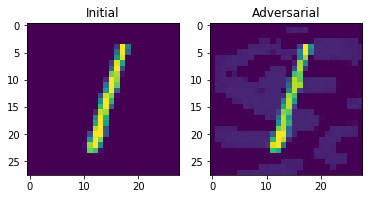

Total distortion: 1.7595917915407726
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-3.102562    9.540692   -2.7989     -4.2646985   2.8552167   1.8475937
   0.45831096 -0.70747393  1.6965922  -2.2418647 ]] 1
initial_203_2.png
output/mnist/initial_203_2.png output/mnist/adversarial_203_2.png


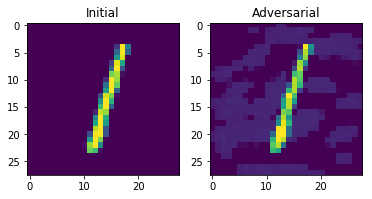

Total distortion: 1.9428276523086956
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-3.6755252 10.573548  -2.7068524 -5.726756   3.9917703  1.9028066
   2.3826277 -1.5535613  1.6353278 -3.1759944]] 1
initial_204_2.png
output/mnist/initial_204_2.png output/mnist/adversarial_204_2.png


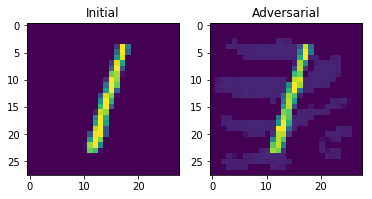

Total distortion: 1.5489352599295831
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-4.762036   9.097541  -0.9217621 -4.138843   4.328193  -1.7325819
  -1.9340862  2.0377467  2.1624773 -1.540769 ]] 1
initial_205_2.png
output/mnist/initial_205_2.png output/mnist/adversarial_205_2.png


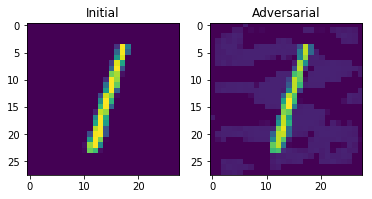

Total distortion: 1.6549205842801182
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-3.811637   10.1682825  -1.8459966  -4.639156    3.375287    0.28476137
  -0.43154895 -0.09366077  2.1139286  -1.8988268 ]] 1
initial_206_2.png
output/mnist/initial_206_2.png output/mnist/adversarial_206_2.png


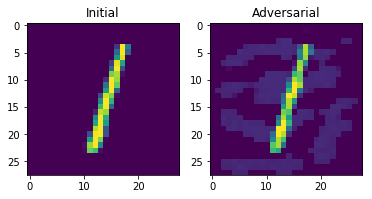

Total distortion: 1.8947183732895003
[[-5.5708275  16.598507   -2.6123207  -7.230877    5.1526856   0.32731852
   0.42615762  0.08598837  0.7278927  -3.7932224 ]] 1
[[-3.4950438   7.6544514  -1.2563883  -3.6378632   2.638422   -0.11360721
  -0.83605653 -0.36551103  2.8746278  -1.13881   ]] 1
initial_207_2.png
output/mnist/initial_207_2.png output/mnist/adversarial_207_2.png


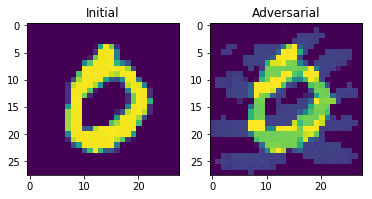

Total distortion: 3.686714605970533
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[ 8.865691   -1.4003652   0.9209121  -1.8783647  -0.96281236 -0.7322202
  -0.8321337   5.807036   -3.9451787  -1.3936291 ]] 0
initial_208_2.png
output/mnist/initial_208_2.png output/mnist/adversarial_208_2.png


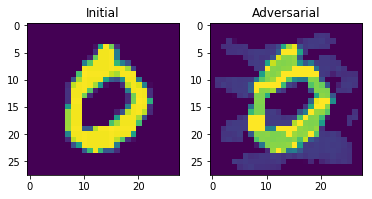

Total distortion: 3.036803516552319
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[10.583696   -0.8120985   2.17077    -3.4780662  -2.6484685  -1.864623
  -0.45866042  5.38857    -3.3427367  -2.4353127 ]] 0
initial_209_2.png
output/mnist/initial_209_2.png output/mnist/adversarial_209_2.png


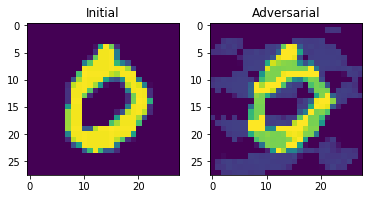

Total distortion: 3.4460615870484608
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[10.183788   -0.9217547   1.2165269  -3.0277371  -1.801281   -1.440122
   0.33535513  4.368338   -3.6592026  -1.938018  ]] 0
initial_210_2.png
output/mnist/initial_210_2.png output/mnist/adversarial_210_2.png


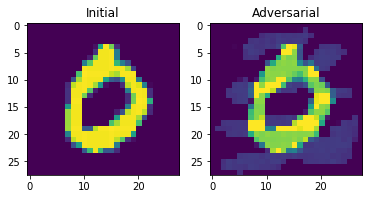

Total distortion: 3.0194169154857504
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[12.711903   -1.206844    1.1536802  -4.2589526  -0.05918132 -1.7499027
   1.198348    3.7026482  -4.7731442  -2.0587597 ]] 0
initial_211_2.png
output/mnist/initial_211_2.png output/mnist/adversarial_211_2.png


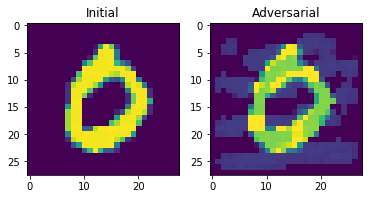

Total distortion: 3.295263683089544
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[12.804627   -1.6872566   0.64566123 -3.0110967  -3.7348003  -1.0483085
  -0.11852692  4.776324   -3.3443854  -1.5587512 ]] 0
initial_212_2.png
output/mnist/initial_212_2.png output/mnist/adversarial_212_2.png


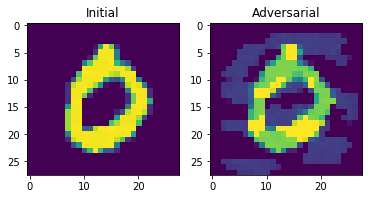

Total distortion: 3.4278122765364247
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[14.814948   -2.256604    1.9645189  -4.121553   -1.4257483  -1.7317412
   3.4430878   0.46835497 -4.4968753  -1.1933599 ]] 0
initial_213_2.png
output/mnist/initial_213_2.png output/mnist/adversarial_213_2.png


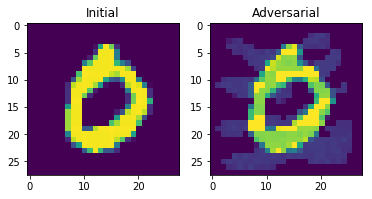

Total distortion: 2.8809734153805366
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[12.425923  -1.22225    0.8487416 -4.015778  -3.960209  -1.6997613
  -0.3602984  4.8830113 -2.8394344 -1.8113335]] 0
initial_214_2.png
output/mnist/initial_214_2.png output/mnist/adversarial_214_2.png


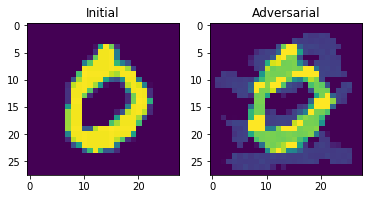

Total distortion: 3.3799735263487434
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[ 9.817644  -1.261824   1.2766414 -3.4217157 -3.5142949 -1.7083597
  -0.6400405  5.253028  -2.31929   -1.9310004]] 0
initial_215_2.png
output/mnist/initial_215_2.png output/mnist/adversarial_215_2.png


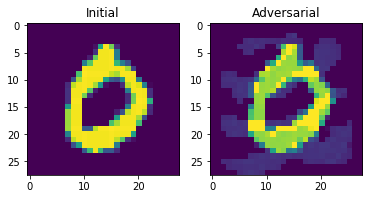

Total distortion: 2.541730119090344
[[26.478464  -5.311928   1.376084  -7.1690187 -6.0411863 -2.7514436
   2.5964448  1.1831528 -4.452566  -0.6487406]] 0
[[14.636638  -1.528051   1.086506  -3.994809  -2.8086302 -2.1378322
   0.6130604  3.5721116 -4.514517  -1.1726285]] 0
initial_216_2.png
output/mnist/initial_216_2.png output/mnist/adversarial_216_2.png


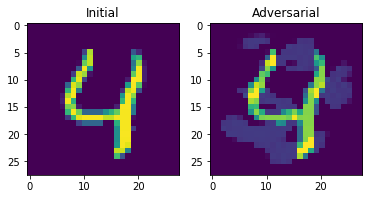

Total distortion: 2.5645529734108
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[ 1.0591588 -4.159665  -2.2531598 -5.277512   8.909417  -5.037872
  -0.8388215 -2.7820964  1.9065989  9.556561 ]] 9
initial_217_2.png
output/mnist/initial_217_2.png output/mnist/adversarial_217_2.png


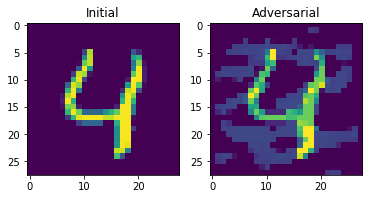

Total distortion: 3.5434080143902866
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-1.7717682  -0.94796085 -1.5065958  -5.729307   10.253912   -4.8861194
  -1.9597969  -0.4678268   1.8514078   6.2402    ]] 4
initial_218_2.png
output/mnist/initial_218_2.png output/mnist/adversarial_218_2.png


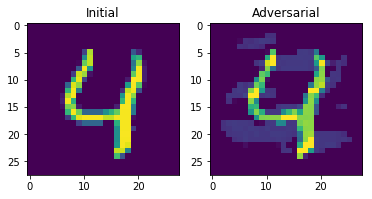

Total distortion: 2.44194408138402
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-0.27239266 -3.577093   -1.4149203  -4.468866    8.247026   -6.289268
  -4.35641     0.22509032  2.7529423  10.7966    ]] 9
initial_219_2.png
output/mnist/initial_219_2.png output/mnist/adversarial_219_2.png


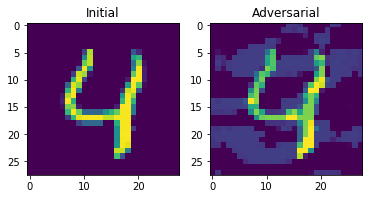

Total distortion: 3.291270912298112
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-0.36481935 -2.5857086  -2.0681996  -4.803521    9.234293   -5.515414
  -3.0132499  -0.82379276  1.7076465   9.370315  ]] 9
initial_220_2.png
output/mnist/initial_220_2.png output/mnist/adversarial_220_2.png


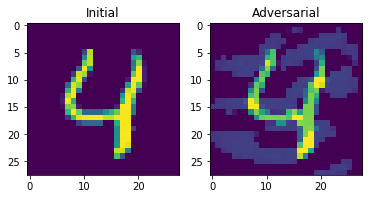

Total distortion: 3.3155210142520986
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-0.1108705  -3.0792367  -2.27993    -5.4264708  10.124138   -3.5994027
  -0.09323347 -2.556503    1.3245597   6.669341  ]] 4
initial_221_2.png
output/mnist/initial_221_2.png output/mnist/adversarial_221_2.png


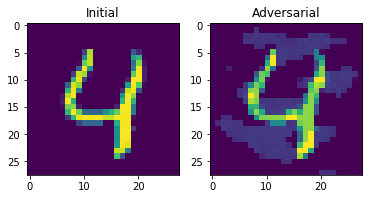

Total distortion: 2.6260283136286806
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[ 0.47517946 -4.387127   -3.1910355  -6.948664   11.880379   -4.598698
  -0.34873724 -3.679309    4.1768456   8.678522  ]] 4
initial_222_2.png
output/mnist/initial_222_2.png output/mnist/adversarial_222_2.png


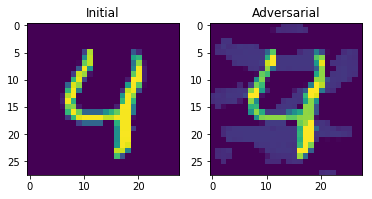

Total distortion: 2.6574929414728974
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-0.6466907  -1.7773918  -2.2335331  -4.9340677   9.979841   -6.0096264
  -4.289069    2.0979342  -0.07598432  9.485952  ]] 4
initial_223_2.png
output/mnist/initial_223_2.png output/mnist/adversarial_223_2.png


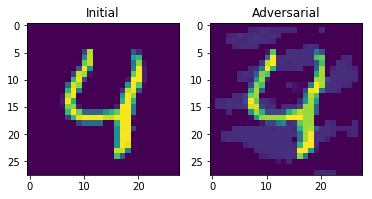

Total distortion: 2.2369550201095705
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-0.1419061 -5.1840353 -2.8335242 -6.200961  10.3593235 -6.4880195
  -3.4980912 -1.4968301  4.542773  12.482466 ]] 9
initial_224_2.png
output/mnist/initial_224_2.png output/mnist/adversarial_224_2.png


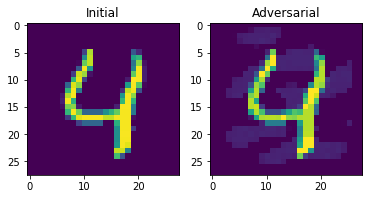

Total distortion: 1.5524410714531076
[[ -3.038451   -4.3016768  -4.927498  -12.030424   26.974476   -7.2691474
   -1.223251   -2.2134688  -1.7836285  13.017599 ]] 4
[[-0.93504983 -6.4905443  -3.4737406  -6.761648   12.171955   -7.422183
  -4.0416083  -2.1150243   3.241739   16.290255  ]] 9
initial_225_2.png
output/mnist/initial_225_2.png output/mnist/adversarial_225_2.png


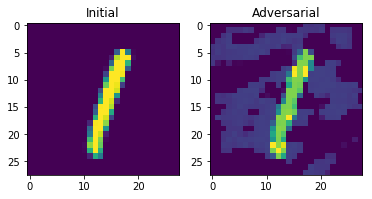

Total distortion: 3.359610473896627
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-3.8380554 10.420968   2.395134  -5.0663466  2.7229147 -3.53488
  -2.7663     1.4206208  3.934358  -3.2445092]] 1
initial_226_2.png
output/mnist/initial_226_2.png output/mnist/adversarial_226_2.png


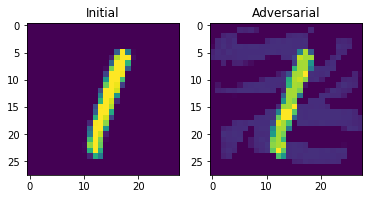

Total distortion: 2.2760104272533157
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-5.4361544 11.432546   3.08115   -4.834715   3.1483712 -3.942754
  -3.7634196  3.6863103  2.2466204 -3.0494108]] 1
initial_227_2.png
output/mnist/initial_227_2.png output/mnist/adversarial_227_2.png


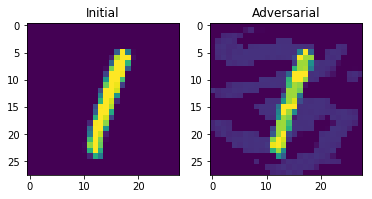

Total distortion: 2.4237008380281386
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-5.156385   10.5416155  -1.7593894  -1.8692294   2.003542   -1.5072806
  -4.2125454   5.1203585  -0.04672422 -1.2811259 ]] 1
initial_228_2.png
output/mnist/initial_228_2.png output/mnist/adversarial_228_2.png


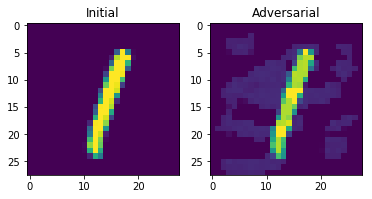

Total distortion: 1.8456761272413698
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-6.524856   15.974777   -2.1324465  -6.9338436   5.676393    0.07650636
   0.15393758  0.05740142  1.481572   -3.373551  ]] 1
initial_229_2.png
output/mnist/initial_229_2.png output/mnist/adversarial_229_2.png


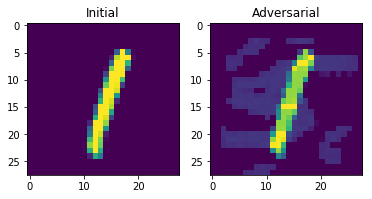

Total distortion: 2.368783343641577
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-4.39628    13.2554     -4.527422   -5.822522    3.933023    1.9200351
  -0.13020122 -0.46219003  2.3630583  -1.748601  ]] 1
initial_230_2.png
output/mnist/initial_230_2.png output/mnist/adversarial_230_2.png


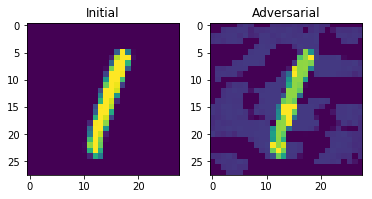

Total distortion: 3.2423785417642494
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-4.8588614  13.936351   -1.2617964  -6.754331    4.2383857  -0.2136216
   0.24329272  0.41198543  1.6079974  -2.9698048 ]] 1
initial_231_2.png
output/mnist/initial_231_2.png output/mnist/adversarial_231_2.png


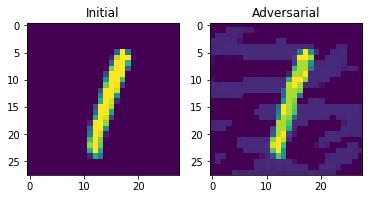

Total distortion: 2.1957387272856934
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-6.146829  12.6206255 -1.4495701 -3.3146613  3.6735718 -2.620733
  -4.650473   7.231954  -1.3268548 -1.6651438]] 1
initial_232_2.png
output/mnist/initial_232_2.png output/mnist/adversarial_232_2.png


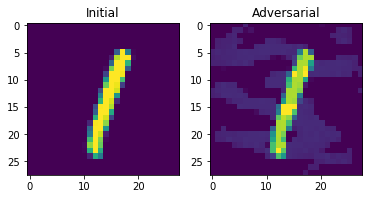

Total distortion: 2.017722406241424
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-6.069773  13.545528  -1.1672711 -4.4925933  3.7797284 -1.967458
  -3.573874   2.5964127  2.6915357 -1.8095039]] 1
initial_233_2.png
output/mnist/initial_233_2.png output/mnist/adversarial_233_2.png


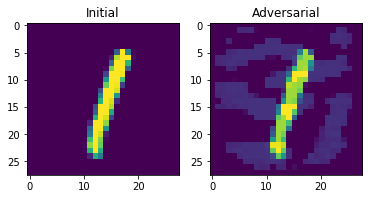

Total distortion: 2.3250636512493243
[[-6.989323   21.821999   -2.8439782  -8.240942    4.9166007  -0.30944648
  -0.40383095  1.4004625   0.4758325  -4.6983294 ]] 1
[[-6.201444   10.448868   -1.2597214  -2.915003    4.1571097  -3.3276997
  -5.333828    3.979002    1.6697717   0.97453505]] 1
initial_234_2.png
output/mnist/initial_234_2.png output/mnist/adversarial_234_2.png


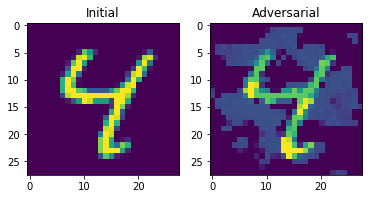

Total distortion: 4.372399565479473
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-2.5057912  -1.9902229   1.4121159  -4.96535     8.513258   -3.7307224
  -1.6699208  -0.14649352  5.6446333   2.354446  ]] 4
initial_235_2.png
output/mnist/initial_235_2.png output/mnist/adversarial_235_2.png


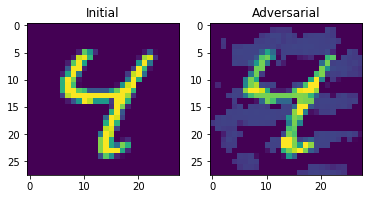

Total distortion: 3.592859041646311
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-4.949686    2.2256942   0.79904795 -6.1766253  11.31471    -6.4440203
  -3.9109325   0.7668226   8.402412    2.5101357 ]] 4
initial_236_2.png
output/mnist/initial_236_2.png output/mnist/adversarial_236_2.png


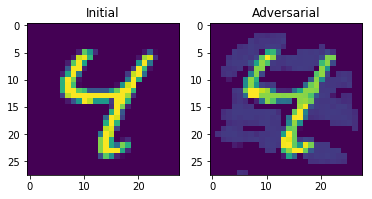

Total distortion: 3.0027234113603996
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-5.903489   -1.1922404   1.0984496  -4.654049    9.655132   -6.481282
  -5.0358195  -0.45046818 10.920954    5.8157043 ]] 8
initial_237_2.png
output/mnist/initial_237_2.png output/mnist/adversarial_237_2.png


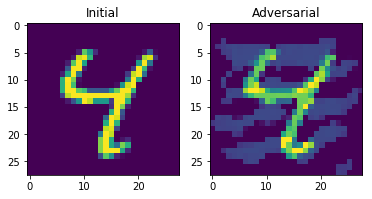

Total distortion: 3.807580619454435
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-4.445974   -0.04691911  0.24667682 -2.5918295   6.6181     -5.0082774
  -4.7746544  -0.778735   10.592597    3.2398195 ]] 8
initial_238_2.png
output/mnist/initial_238_2.png output/mnist/adversarial_238_2.png


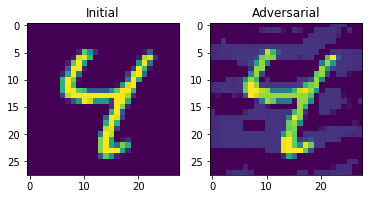

Total distortion: 2.863317221380458
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-5.195519   -0.8045737  -0.84299326 -4.2777176   9.829943   -5.150355
  -3.863377   -1.2375237   9.525665    5.1556883 ]] 4
initial_239_2.png
output/mnist/initial_239_2.png output/mnist/adversarial_239_2.png


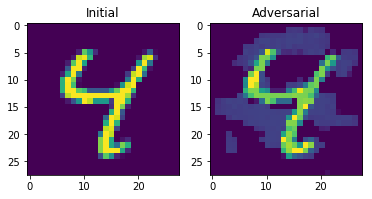

Total distortion: 3.2153539426574023
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-4.23696    -1.1440136  -1.571685   -7.960797   12.64245    -3.6127264
   0.69265246 -2.200574    9.201999    2.356738  ]] 4
initial_240_2.png
output/mnist/initial_240_2.png output/mnist/adversarial_240_2.png


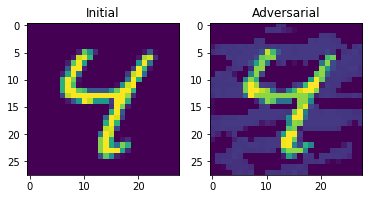

Total distortion: 3.245948173113906
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-6.3646135  -0.24201185 -0.69688344 -5.2242246  11.184139   -6.3396797
  -3.8249907  -1.1792582  12.682232    4.374211  ]] 8
initial_241_2.png
output/mnist/initial_241_2.png output/mnist/adversarial_241_2.png


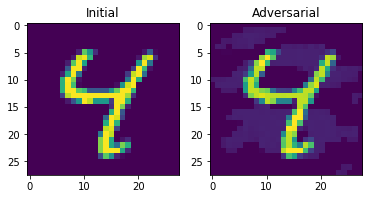

Total distortion: 1.5875815903730142
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-7.613726   -0.98488724 -1.1899766  -6.5349407  14.075712   -7.2105784
  -4.210841   -2.4004788  14.011976    6.7071104 ]] 4
initial_242_2.png
output/mnist/initial_242_2.png output/mnist/adversarial_242_2.png


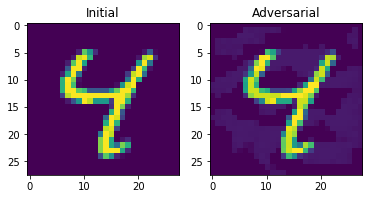

Total distortion: 1.281279214665499
[[-1.0382806e+01 -1.3317466e-02 -3.2178681e+00 -9.9129105e+00
   2.2989487e+01 -7.2006602e+00 -3.5164895e+00 -2.2331944e+00
   1.2200062e+01  7.5504189e+00]] 4
[[-9.219466  -1.1848255 -2.0897958 -7.697543  17.641201  -7.100268
  -4.716924  -2.631238  13.198963   8.638623 ]] 4
initial_243_2.png
output/mnist/initial_243_2.png output/mnist/adversarial_243_2.png


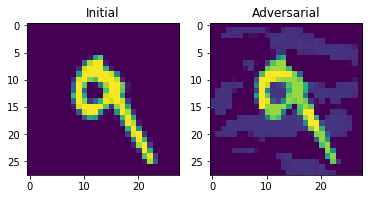

Total distortion: 2.5756915080595233
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-3.2004318 -4.104327  -1.8419052 -3.3399532  4.2215953 -3.7583284
  -3.8627691 -4.235638  11.53261    9.307093 ]] 8
initial_244_2.png
output/mnist/initial_244_2.png output/mnist/adversarial_244_2.png


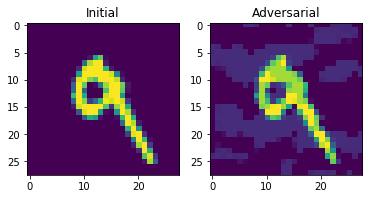

Total distortion: 2.35351309241954
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-6.3092313 -2.3704326 -2.525666  -1.9761378  7.07318   -4.424057
  -4.8848305 -4.032964   9.625956  11.305354 ]] 9
initial_245_2.png
output/mnist/initial_245_2.png output/mnist/adversarial_245_2.png


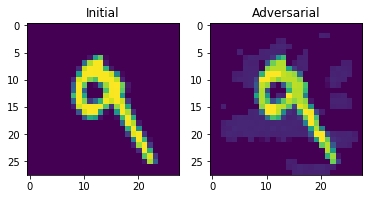

Total distortion: 1.5891742468207892
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-5.352302  -4.1643486 -2.152117  -3.3510303  7.3176627 -4.2230496
  -5.7750673 -3.4941182  9.34314   12.970329 ]] 9
initial_246_2.png
output/mnist/initial_246_2.png output/mnist/adversarial_246_2.png


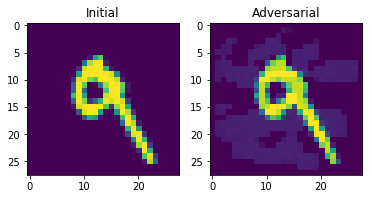

Total distortion: 1.6543350665695535
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-6.066011  -6.318467  -3.0515382 -1.7695979  5.7930164 -3.7393074
  -5.927774  -4.7239    11.325974  14.988854 ]] 9
initial_247_2.png
output/mnist/initial_247_2.png output/mnist/adversarial_247_2.png


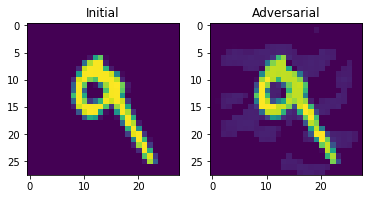

Total distortion: 1.418952285528935
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-7.2488136 -3.7120225 -2.446947  -5.350565  11.780959  -4.782263
  -6.008826  -4.7047157  9.355724  14.491656 ]] 9
initial_248_2.png
output/mnist/initial_248_2.png output/mnist/adversarial_248_2.png


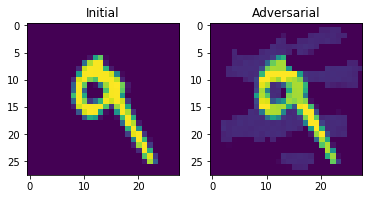

Total distortion: 2.004431821078982
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-5.600155  -4.875882  -2.5350533 -3.394312   6.124705  -2.9372253
  -5.3584833 -3.5590584 10.01288   12.762129 ]] 9
initial_249_2.png
output/mnist/initial_249_2.png output/mnist/adversarial_249_2.png


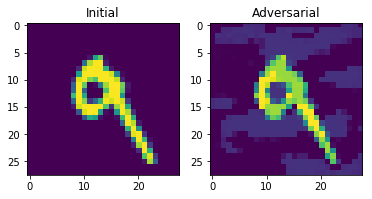

Total distortion: 2.6226999105910695
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-4.0511627 -2.6041377 -1.5425144 -5.572468   7.778359  -3.7634902
  -2.8845432 -5.4580827 11.4067745  7.9725304]] 8
initial_250_2.png
output/mnist/initial_250_2.png output/mnist/adversarial_250_2.png


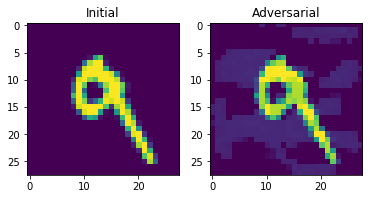

Total distortion: 2.0561926372840396
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-4.462982  -5.509637  -2.1637607 -2.237744   4.7482667 -3.9383867
  -7.75894   -0.7324117  8.264361  14.07691  ]] 9
initial_251_2.png
output/mnist/initial_251_2.png output/mnist/adversarial_251_2.png


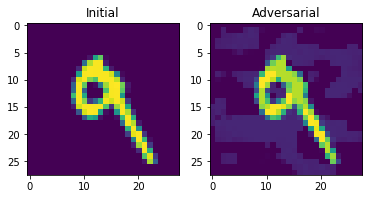

Total distortion: 1.937461360423047
[[-7.0170465 -6.9856167 -4.6053796 -2.4105265  8.0662155 -4.8246856
  -8.456338  -3.9384372  9.254226  20.415161 ]] 9
[[-6.03924   -4.586034  -3.0402079 -2.8328807  7.0708127 -4.506446
  -4.845859  -5.392115  11.572067  13.649499 ]] 9
initial_252_2.png
output/mnist/initial_252_2.png output/mnist/adversarial_252_2.png


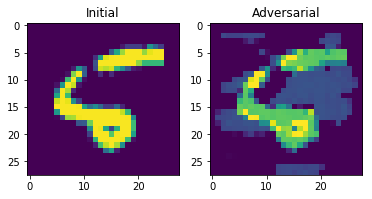

Total distortion: 4.1735568996018095
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 5.5057526 -6.373561  -2.065057  -2.4829953 -1.9824345  1.775899
   1.5277678 -2.452484   0.3015952  5.3569007]] 0
initial_253_2.png
output/mnist/initial_253_2.png output/mnist/adversarial_253_2.png


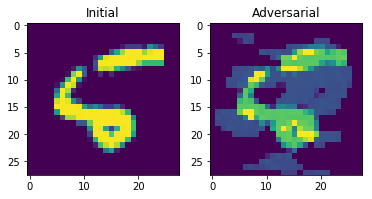

Total distortion: 4.429336991478751
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 3.1977909  -2.4359381   0.15635693 -3.54899    -0.576077    1.2390404
   2.4297059  -2.3394294   1.5584414   0.83893204]] 0
initial_254_2.png
output/mnist/initial_254_2.png output/mnist/adversarial_254_2.png


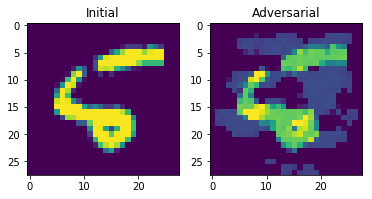

Total distortion: 4.013682804881712
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 2.2510846  -2.4376452   2.869944   -3.3915238   0.17921768  0.3431253
   2.4209435  -3.8670728   3.1171389   0.24971509]] 8
initial_255_2.png
output/mnist/initial_255_2.png output/mnist/adversarial_255_2.png


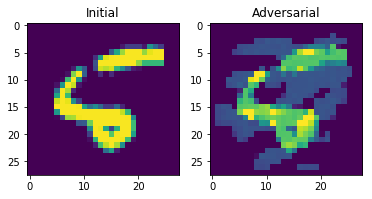

Total distortion: 4.516256426847031
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 1.993392  -3.3750026  0.6784316 -2.217948   1.3176891 -0.5476067
   1.2184507 -2.8310921  2.6409514  2.1631923]] 8
initial_256_2.png
output/mnist/initial_256_2.png output/mnist/adversarial_256_2.png


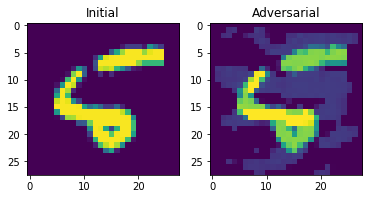

Total distortion: 3.154577132963685
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[-0.22043969 -5.854372   -2.2456634  -5.727217    3.4264648   6.011298
   3.312074   -5.92064     2.6488097   4.793403  ]] 5
initial_257_2.png
output/mnist/initial_257_2.png output/mnist/adversarial_257_2.png


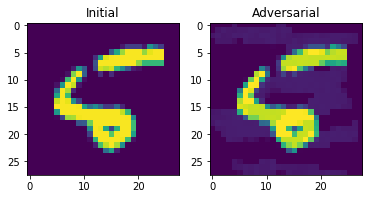

Total distortion: 1.4840482653354692
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 2.557848   -5.5666666  -2.2349696  -7.3769274  -2.0174658   7.8533893
   9.376428   -8.907694    7.9342203   0.11845964]] 6
initial_258_2.png
output/mnist/initial_258_2.png output/mnist/adversarial_258_2.png


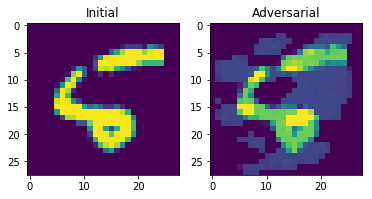

Total distortion: 3.939232702334566
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[-1.5055193  -4.6317387  -1.6973444  -3.4443152   0.41128236  3.1163883
   0.91141444 -2.6227655   4.6403503   4.355618  ]] 8
initial_259_2.png
output/mnist/initial_259_2.png output/mnist/adversarial_259_2.png


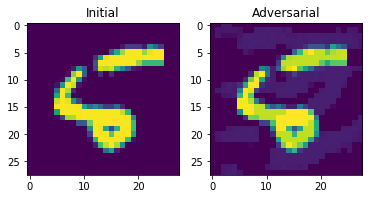

Total distortion: 1.5996202554670405
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 0.7627574  -5.821966   -2.349416   -6.480708   -0.87906337  7.0261054
   6.8022614  -8.392747    9.262226    1.1406239 ]] 8
initial_260_2.png
output/mnist/initial_260_2.png output/mnist/adversarial_260_2.png


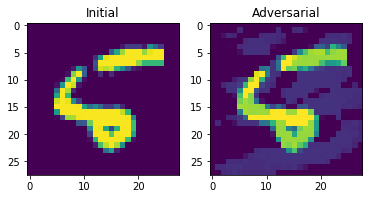

Total distortion: 2.687819883249709
[[ 1.5404382 -6.674225  -3.7522829 -8.20303   -2.3603706 12.099987
   9.075112  -9.919876   8.003648   0.960647 ]] 5
[[ 0.12268464 -8.978144   -4.238724   -3.7015312  -0.38506883  5.245418
   1.3812273  -6.4054375   5.361598    9.450066  ]] 9
initial_261_2.png
output/mnist/initial_261_2.png output/mnist/adversarial_261_2.png


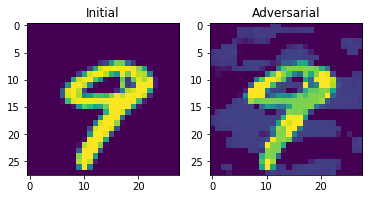

Total distortion: 3.5787015891789706
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-2.5398118   0.90453064 -0.47374058 -2.7730181   4.211804   -5.3308496
  -5.3737607   2.60976     4.4074516   5.6950254 ]] 9
initial_262_2.png
output/mnist/initial_262_2.png output/mnist/adversarial_262_2.png


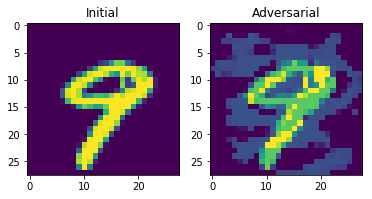

Total distortion: 4.6991408191792425
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-1.9840475  2.966079   0.9110162 -4.0266476  4.5190825 -4.5275445
  -4.270142   1.5970563  3.306143   2.3075676]] 4
initial_263_2.png
output/mnist/initial_263_2.png output/mnist/adversarial_263_2.png


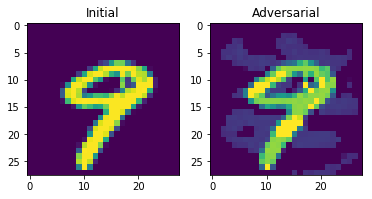

Total distortion: 2.835920517715596
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-5.504194   0.6745143 -1.3504122 -1.2820355  5.112678  -6.2202535
  -8.252078   3.122608   5.0431347 10.451427 ]] 9
initial_264_2.png
output/mnist/initial_264_2.png output/mnist/adversarial_264_2.png


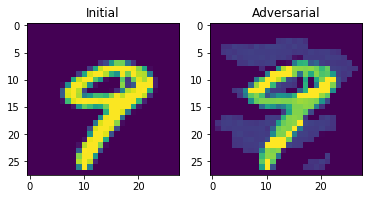

Total distortion: 3.0231072297203907
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-5.8220572  -0.05116582 -2.417888    0.40917486  3.6426878  -6.4622626
  -8.052391    1.4142954  10.550323    9.74454   ]] 8
initial_265_2.png
output/mnist/initial_265_2.png output/mnist/adversarial_265_2.png


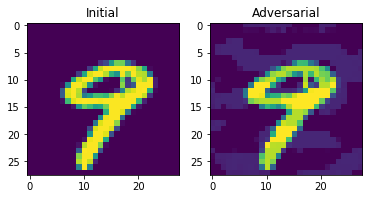

Total distortion: 1.9850343825199546
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[ -8.764952   -2.5241525  -4.147811   -2.0360348  10.568742   -7.5976515
  -11.044489    1.9010625   6.5575943  19.761703 ]] 9
initial_266_2.png
output/mnist/initial_266_2.png output/mnist/adversarial_266_2.png


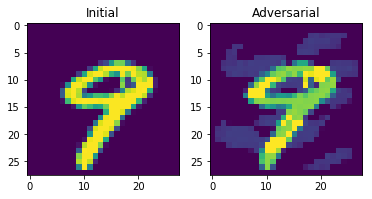

Total distortion: 2.9281646432706934
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-3.6490424  -0.05980366 -1.8231635  -1.047842    2.901101   -3.246187
  -5.5469613   1.6178168   6.393059    6.004939  ]] 8
initial_267_2.png
output/mnist/initial_267_2.png output/mnist/adversarial_267_2.png


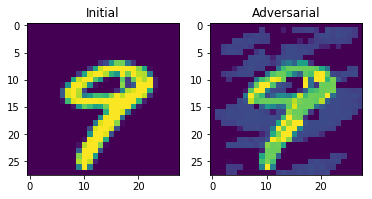

Total distortion: 4.143487595755146
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-1.3177924  1.0741367  0.3822515 -2.5219424  1.9981351 -3.710654
  -2.979797   1.4101034  4.2578225  2.3389215]] 8
initial_268_2.png
output/mnist/initial_268_2.png output/mnist/adversarial_268_2.png


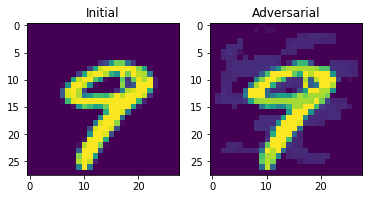

Total distortion: 2.0291797358139663
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-6.4347177  -0.33917665 -2.960827   -1.3011844   6.0908327  -5.623841
  -9.758132    5.4602604   4.3150306  12.208976  ]] 9
initial_269_2.png
output/mnist/initial_269_2.png output/mnist/adversarial_269_2.png


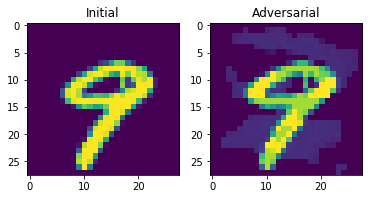

Total distortion: 2.2505158786649986
[[ -9.269696   -4.6120005  -7.403321   -0.2757318   9.324315   -7.9873796
  -13.705339    3.2503943   6.554652   25.592342 ]] 9
[[-6.159546   -2.0273697  -4.7020802   0.04456095  4.815063   -6.6194816
  -8.827337    0.7050975  11.065351   14.260774  ]] 9
270 {'l2': 24, 'l0': 34, 'li': 25} {'l2': 52.80767309690417, 'l0': 131.14086478767095, 'li': 80.23439530873968}
l2 average =  0.1955839744329784 2.200319712371007
l0 average =  0.4857069066210035 3.8570842584609104
li average =  0.2971644270694062 3.2093758123495872


In [6]:
with tf.Session() as sess:
        
    model = MNISTModel("inputs/model/mnist", sess)
        
    # mnist
    test_adversarials(model, 'output/mnist/', [28,28], 1)
    